In [1]:
# import libraries
import numpy as np
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
pd.set_option.max_rows=66

In [ ]:
reprocess_raw = False

# Pre processing

In [3]:
# Read data
dataset_filename = 'data_raw.parquet'


if reprocess_raw:

    data = pd.DataFrame()

    ## Read every file in the folder
    for filename in os.listdir('../data/'):
        if filename[-4:]=='.csv': ## if csv
            tmp = pd.read_csv('../data/'+filename, sep=',')
        elif filename[-4:]=='.xls': ## if excel
            tmp = pd.read_excel('../data/'+filename)
        else:
            continue ## not process folders

        ## standarize columns
        tmp.columns = [i.lower().strip().replace(' ','_').replace('directorates','directorate').replace('billing_cur_code.1','billing_cur_code') for i in tmp.columns ]

        ## Remove duplicated columns
        tmp = tmp.T.drop_duplicates().T

        ## Add period (YYYYMM)
        tmp['period'] = int(filename[:-4])

        ## Concat to the existing dataset
        data = pd.concat([data,tmp], axis=0, ignore_index=True )

        print(f'{filename} read...')

    ## Save dataset unprocessed 
    data.to_parquet(f'../data/{dataset_filename}', index=False)
    

    
else:
    #Read data already saved
    data = pd.read_parquet(f'../data/{dataset_filename}')

## Show sample    
data.sample(10)

201404.xls read...
201405.xls read...
201406.xls read...
201407.xls read...
201408.xls read...
201409.xls read...
201410.xls read...
201411.xls read...
201412.xls read...
201501.xls read...
201502.xls read...
201503.xls read...
201505.xls read...
201506.xls read...
201507.xls read...
201508.xls read...
201509.xls read...
201510.xls read...
201511.xls read...
201512.xls read...
201601.xls read...
201602.xls read...
201603.xls read...
201604.xls read...
201605.xls read...
201606.xls read...
201607.xls read...
201608.xls read...
201609.xls read...
201610.xls read...
201611.xls read...
201612.xls read...
201701.xls read...
201702.xls read...
201703.xls read...
201704.xls read...
201705.xls read...
201706.xls read...
201707.xls read...
201708.xls read...
201709.xls read...
201710.xls read...
201711.xls read...
201801.xls read...


ValueError: invalid literal for int() with base 10: 'processed_data'

In [5]:
# Count nulls % for each column
data.count() / data.shape[0]

trans_date            0.999995
trans_vat_desc        0.947049
original_gross_amt    0.999995
merchant_name         0.999995
card_number           0.999995
billing_cur_code      0.477094
trans_cac_code_1      0.999435
trans_cac_desc_1      0.999435
trans_cac_code_2      0.998731
trans_cac_desc_2      0.998731
trans_cac_code_3      0.998424
directorate           0.996030
period                1.000000
original_cur          0.291696
billing_gross_amt     0.291696
trans_tax_amt         0.024733
dtype: float64

In [6]:
# Drop columns where there is too litle data
cols_to_drop = (data.count() / data.shape[0])[data.count() / data.shape[0]<0.1].index.values
for col in cols_to_drop:
    del data[col]
    print(f'col {col} dropped')

col trans_tax_amt dropped


In [7]:
# Format fields
numeric_cols = ['original_gross_amt','billing_gross_amt']
for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors = 'coerce')
    
date_cols = ['trans_date']
for col in date_cols:
    data[col] = pd.to_datetime(data[col], format = '%Y-%m-%d')
    
data.sample(10)

,trans_date,trans_vat_desc,original_gross_amt,merchant_name,card_number,billing_cur_code,trans_cac_code_1,trans_cac_desc_1,trans_cac_code_2,trans_cac_desc_2,trans_cac_code_3,directorate,period,original_cur,billing_gross_amt
54797,2015-06-18,VZ,1.30,amazon uk marketplace,************7875,NaN,L9Y0,Computing Other,REAZN,Newtown Nursery,A00,CYP&F SCHOOLS,201506,NaN,NaN
62492,2015-09-08,VR,20.60,welcome b/starbucks,************8279,NaN,L220,Purchases Food,RBL23,Lord Mayors Parlour,A00,Corporate Resources,201509,NaN,NaN
95568,2016-04-20,VR,5.98,moto trowell s/w bk,************1139,NaN,H0R0,Conference Fees Subs UK,RUF0F,Illegal Money Lending T Stds Comm Inv.,A00,Local Services,201604,NaN,NaN
61747,2015-08-18,VR,53.60,tesco pfs 3953,************3909,NaN,K020,Vehicle Fuel,RHBC7,Erdington CBH03 Neigh C'takers,A00,Local Services,201508,NaN,NaN
51494,2015-05-12,VR,102.30,the pub on the hoe,************4244,NaN,L220,Purchases Food,RUF0F,Illegal Money Lending T Stds Comm Inv.,A00,Local Services,201505,NaN,NaN
4015,2014-06-13,VZ,15.00,performances birmingha,************2819,GBP,L0L0,Visits Expenditure,REAMB,St John & St Monica RC Junior & Infant,A00,CYP&F SCHOOLS,201405,NaN,NaN
177668,2017-11-14,VZ,63.92,amazon svcs eu-uk amazon.,************0578,GBP,L030,Books,REANB,St Patrick's RC (B18) Junior & Infant,A00,CYP&F SCHOOLS,201711,GBP,63.92
66090,2015-09-19,VR,51.95,esso aston way ss,************8085,NaN,K020,Vehicle Fuel,RTA71,Customer Support Officers,A00,Local Services,201509,NaN,NaN
54281,2015-06-25,VZ,300.00,halx - solihull,************7993,NaN,L540,Bank & Goro ChgsS,REAZW,Washwood Heath Nursery,A00,CYP&F SCHOOLS,201506,NaN,NaN
19297,2014-09-24,VZ,35.00,www.ico.gov.uk,************7098,GBP,L680,Prof Fees other,REARM,Wyndcliffe JI,A00,CYP&F SCHOOLS,201409,NaN,NaN


In [8]:
# Check types of data
data.dtypes

trans_date            datetime64[ns]
trans_vat_desc                object
original_gross_amt           float64
merchant_name                 object
card_number                   object
billing_cur_code              object
trans_cac_code_1              object
trans_cac_desc_1              object
trans_cac_code_2              object
trans_cac_desc_2              object
trans_cac_code_3              object
directorate                   object
period                         int64
original_cur                  object
billing_gross_amt            float64
dtype: object

There are 2 pair of columns that looks correlated:
- original_gross_amt vs billing_gross_amt
- billing_cur_code vs original_cur

In [9]:
# Look for differences 
data[data['original_gross_amt']!=data['billing_gross_amt']][numeric_cols]

,original_gross_amt,billing_gross_amt
0,52.32,NaN
1,65.82,NaN
2,41.35,NaN
3,47.19,NaN
4,98.08,NaN
...,...,...
182772,525.00,386.66
183313,376.76,222.59
183957,44.28,33.18
184136,52.00,47.66


In [10]:
# Compare non nulls
data[(data['billing_gross_amt'].notnull()) & (data['original_gross_amt'].isnull())]

,trans_date,trans_vat_desc,original_gross_amt,merchant_name,card_number,billing_cur_code,trans_cac_code_1,trans_cac_desc_1,trans_cac_code_2,trans_cac_desc_2,trans_cac_code_3,directorate,period,original_cur,billing_gross_amt


In [11]:
# Distribution of field
data['billing_cur_code'].value_counts()

GBP    88696
Name: billing_cur_code, dtype: int64

In [12]:
# Compare currency code
data[data['billing_cur_code']!=data['original_cur']][['billing_cur_code','original_cur']]

,billing_cur_code,original_cur
0,GBP,NaN
1,GBP,NaN
2,GBP,NaN
3,GBP,NaN
4,GBP,NaN
...,...,...
182772,GBP,USD
183313,GBP,AUD
183957,GBP,USD
184136,GBP,EUR


In [13]:
# Count nulls 
data[['billing_cur_code','original_cur']].isnull().sum() / data.shape[0]

billing_cur_code    0.522906
original_cur        0.708304
dtype: float64

__Comments:__  
- original_gross_amt vs billing_gross_amt: 
    - original_gross_amt has less null values billing_gross_amt  
    - billing_gross_amt has lots of null values
- original_cur vs billing_cur_code:
    - billing_cur_code has less null values but only 1 distinct value  
    
There are some differences between these columns analyzed. However it looks like all the data have been converted to the same currency (GBP) so there is no need to use the remaining columns

In [15]:
# Remove data not necessary
del data['original_cur']
del data['billing_gross_amt']
del data['billing_cur_code']

In [16]:
data.count() / data.shape[0]

trans_date            0.999995
trans_vat_desc        0.947049
original_gross_amt    0.999995
merchant_name         0.999995
card_number           0.999995
trans_cac_code_1      0.999435
trans_cac_desc_1      0.999435
trans_cac_code_2      0.998731
trans_cac_desc_2      0.998731
trans_cac_code_3      0.998424
directorate           0.996030
period                1.000000
dtype: float64

In [17]:
data.nunique()

trans_date             1332
trans_vat_desc            7
original_gross_amt    32612
merchant_name         15856
card_number            1523
trans_cac_code_1        143
trans_cac_desc_1        143
trans_cac_code_2       1397
trans_cac_desc_2       1382
trans_cac_code_3         28
directorate              18
period                   44
dtype: int64

In [19]:
# Remove fields with just one value if there is any
cols_to_drop = data.nunique()[data.nunique()<2].index.values
for col in cols_to_drop:
    del data[col]
    print(f'col {col} deleted')

In [20]:
data.shape

(185909, 12)

In [21]:
# Uniform directorate
data['directorate'] = data['directorate'].str.lower().str.strip() 

# Clean directorates
directorates_dict = {
    'adult & communities':'adult & communities',
    'adults & comms':'adult & communities',
    'corporate resources':'corporate resources',
    'cyp&f':'cyp&f',
    'cyp&f schools':'cyp&f schools',
    'development':'Others',
    'local services':'local services',
    'adults & communities':'adult & communities',
    'cyo&f':'cyp&f', # Assuming there was a misspelling error
    'corporate procurement':'Others',
    'adults':'adult & communities',
    'adult social care and health':'adult & communities'    
}
data['directorate_group'] = data['directorate'].map(directorates_dict).fillna('Others')
data['directorate_group'].value_counts(dropna=False, normalize=True)


cyp&f schools          0.473301
local services         0.228235
cyp&f                  0.135738
adult & communities    0.070045
corporate resources    0.067044
Others                 0.025636
Name: directorate_group, dtype: float64

In [23]:
# Get day of the week (0-6)
data['weekday'] = data['trans_date'].dt.dayofweek

In [25]:
# Group trans_cac_desc_1 to reduce variability 
trans_cac_desc_1_groups = data['trans_cac_desc_1'].value_counts()[data['trans_cac_desc_1'].value_counts()>=60].index.values
data['trans_cac_desc_1_grouped']=data['trans_cac_desc_1']
data.loc[~data['trans_cac_desc_1'].isin(trans_cac_desc_1_groups),'trans_cac_desc_1_grouped'] = 'Other'
data['trans_cac_desc_1_grouped'].value_counts()

Equip Operational       34433
Vehicle Fuel            22907
Purchases Food          20606
Books                   11611
Supplies & Sev Mic      10761
                        ...  
Bldg RM Routine UDD        84
Signs & N'boards           81
Bldg RM Emergy UDD         69
Training Tutor Fees        66
Training Travel&Subs       61
Name: trans_cac_desc_1_grouped, Length: 70, dtype: int64

In [26]:
# Get the number of transaction w the same credit card in the day
data['n_transac_day'] = data.groupby(['card_number','trans_date']).cumcount()

In [27]:
# Save data
dataset_processed_filename  = 'processed_data.parquet'
data.to_parquet(f'../data/{dataset_processed_filename}', index=False)

<hr>

# EDA
In this section I will look at the different features to get a better understanding of the data.
As in this opportunity I will try to identify unusual operation I will focus on features related to :
- Amount of transanctions
- Number of transactions
- Day of the transactions
- Others

In [29]:
# Read dataset
data = pd.read_parquet(f'../data/{dataset_processed_filename}')
display(data.sample(10))
print('Number of records: {:,}'.format(data.shape[0]))
print('Null %')
display(data.count() / data.shape[0])

,trans_date,trans_vat_desc,original_gross_amt,merchant_name,card_number,trans_cac_code_1,trans_cac_desc_1,trans_cac_code_2,trans_cac_desc_2,trans_cac_code_3,directorate,period,directorate_group,weekday,trans_cac_desc_1_grouped,n_transac_day
15864,2014-08-14,VR,48.27,texaco pershore rd,************2823,K020,Vehicle Fuel,RV191,Moseley Day Centre,A00,adult & communities,201408,adult & communities,3.0,Vehicle Fuel,0
87635,2016-02-10,VZ,100.00,whsmith.co.uk,************5395,MC70,Supplies & Sev Mic,REAWT,St Edmund Campion Secondary,A00,cyp&f schools,201602,cyp&f schools,2.0,Supplies & Sev Mic,0
73053,2015-11-11,VZ,40.14,tesco store 3188,************0806,L220,Purchases Food,REAYZ,Bordesley Green East,A00,cyp&f schools,201511,cyp&f schools,2.0,Purchases Food,0
110813,2016-07-14,VZ,220.00,post office counter,************5502,H2T0,Training Other,RTB21,Portering Services,A00,local services,201607,local services,3.0,Training Other,1
83076,2016-01-20,VZ,1.90,amazon uk marketplace,************3930,L120,Equip Other,REAJM,Perry Beeches Infant,A00,cyp&f schools,201601,cyp&f schools,2.0,Equip Other,2
152464,2017-05-11,VR,19.50,plusnet plc 0845,************5391,L080,Mat'l Raw/Drct,RUE0C,EPU-Noise Monitoring tyburn rd,A00,local services,201705,local services,3.0,Mat'l Raw/Drct,0
37420,2015-01-18,VZ,52.00,poundworld retail,************1180,L080,Mat'l Raw/Drct,REABE,Birches Green Infant (NC),A00,cyp&f schools,201501,cyp&f schools,6.0,Mat'l Raw/Drct,0
165140,2017-08-14,VZ,64.95,amazon uk marketplace,************1226,L100,Equip Operational,TA-01315-24,Yth Oakland Trading Acc,A00,local services,201708,local services,0.0,Equip Operational,1
1713,2014-04-28,VR,16.80,esso harborne service sta,************0809,K020,Vehicle Fuel,REAXL,Baskerville,A00,cyp&f schools,201404,cyp&f schools,0.0,Vehicle Fuel,0
145137,2017-04-10,VR,59.83,beeches road servi,************8079,K020,Vehicle Fuel,RVA11,Beeches GOLDD,A00,adult & communities,201704,adult & communities,0.0,Vehicle Fuel,0


Number of records: 185,909
Null %


trans_date                  0.999995
trans_vat_desc              0.947049
original_gross_amt          0.999995
merchant_name               0.999995
card_number                 0.999995
trans_cac_code_1            0.999435
trans_cac_desc_1            0.999435
trans_cac_code_2            0.998731
trans_cac_desc_2            0.998731
trans_cac_code_3            0.998424
directorate                 0.996030
period                      1.000000
directorate_group           1.000000
weekday                     0.999995
trans_cac_desc_1_grouped    1.000000
n_transac_day               1.000000
dtype: float64

In [31]:
# Filter period of analysis
## Analyze data from 3 years (2015,2016 and 2017)
print(data.shape)
data = data[(data['period']>=201501) & (data['period']<=201712)]
print(data.shape)

(185909, 16)
(145802, 16)


__Day of week of transactions__

<AxesSubplot:>

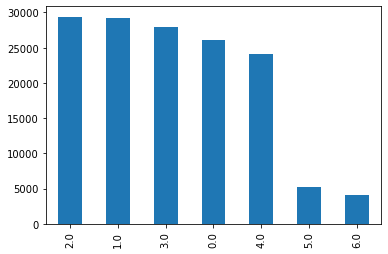

In [32]:
# When most transactions done
data['weekday'].value_counts().plot(kind='bar')

Most of the transactions are done between Monday and Friday

<hr>

__Looking for groups of transactions with high Kurtosis__  
Kurtosis is a meassure of how biased is the distribution.  
It can help to see if there are group of transactions where there are more outliers.


In [40]:
# Evaluate Kurtosis
from scipy.stats import kurtosis
kurt_df = pd.DataFrame(columns=['trans_cac_desc_1_grouped','kurtosis_coef','stdev'])

## Iterate for transaction group
for idx,value in enumerate(data['trans_cac_desc_1_grouped'].unique()):
    kurt_df.loc[idx] = [value,
                        kurtosis(data[data['trans_cac_desc_1_grouped']==value]['original_gross_amt'], fisher=True),
                       data[data['trans_cac_desc_1_grouped']==value]['original_gross_amt'].std()]
    
## show top 10 highest K coef columns
kurt_df.sort_values(by='kurtosis_coef', ascending=False)[:20]

,trans_cac_desc_1_grouped,kurtosis_coef,stdev
0,Vehicle Fuel,7268.804823,46.094781
3,Supplies & Sev Mic,5865.766083,5828.958037
10,Hospitality,2377.851541,1963.063462
27,Ttavel Other (UK),770.843344,1808.187757
28,Travel Foreign,479.712824,11680.127900
2,Equip Operational,424.287861,3078.744393
6,Computing Other,422.561642,359.902337
35,Travel Taxis,394.729854,413.203375
29,Personal Needs,349.299089,93.201143
13,Vehicle OthrunCosts,272.907757,41.246668


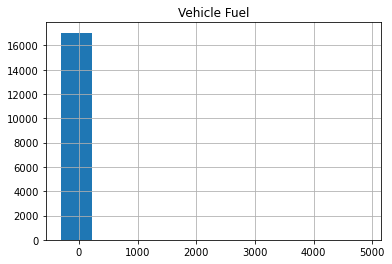

**************************************************


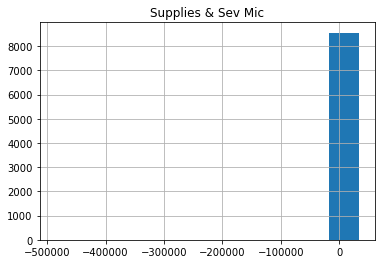

**************************************************


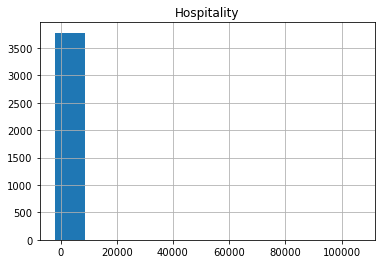

**************************************************


In [41]:
# Plot histograms of transactions w high kurtosis
for value in kurt_df.sort_values(by='kurtosis_coef', ascending=False)['trans_cac_desc_1_grouped'][:3]:
    data[data['trans_cac_desc_1_grouped']==value]['original_gross_amt'].hist()
    plt.title(value)
    plt.show()
    print('*'*50)

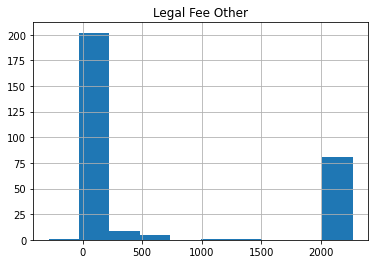

**************************************************


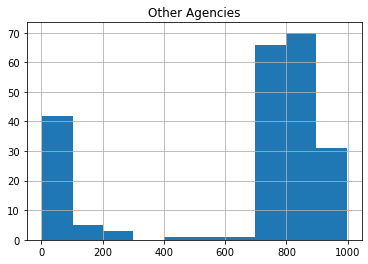

**************************************************


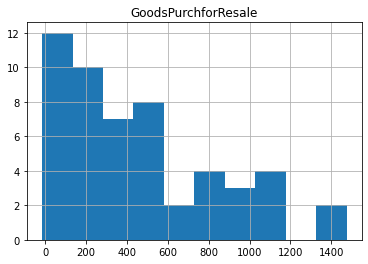

**************************************************


In [42]:
# Plot histograms of transactions w lowest kurtosis
for value in kurt_df.sort_values(by='kurtosis_coef', ascending=True)['trans_cac_desc_1_grouped'][:3]:
    data[data['trans_cac_desc_1_grouped']==value]['original_gross_amt'].hist()
    plt.title(value)
    plt.show()
    print('*'*50)

__Comments:__  
- As we can see, there are some transactions with long tails.  
- Longer tails mean there are more extreme values.  
- Extreme values could be fraudulental transactions
- For example, a spending in vehicle Fuel much higher than the historical spendings.

<hr>

__Monthly purchases__

<AxesSubplot:xlabel='cant_transac', ylabel='amount_transac'>

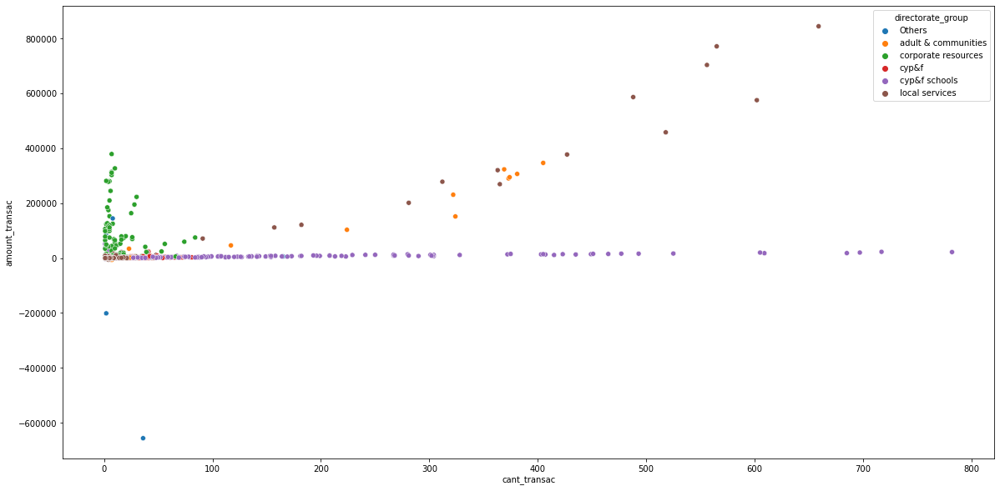

In [50]:
# Purchases by directorate and merchant
data_month = data\
.groupby(['period','directorate_group','merchant_name'])\
.agg({'original_gross_amt':['count','sum']})

data_month.columns = ['cant_transac','amount_transac']
data_month.reset_index(inplace=True)
plt.figure(figsize=(20,10))
sns.scatterplot(data = data_month, x ='cant_transac', y = 'amount_transac' , hue='directorate_group')


<AxesSubplot:xlabel='cant_transac', ylabel='amount_transac'>

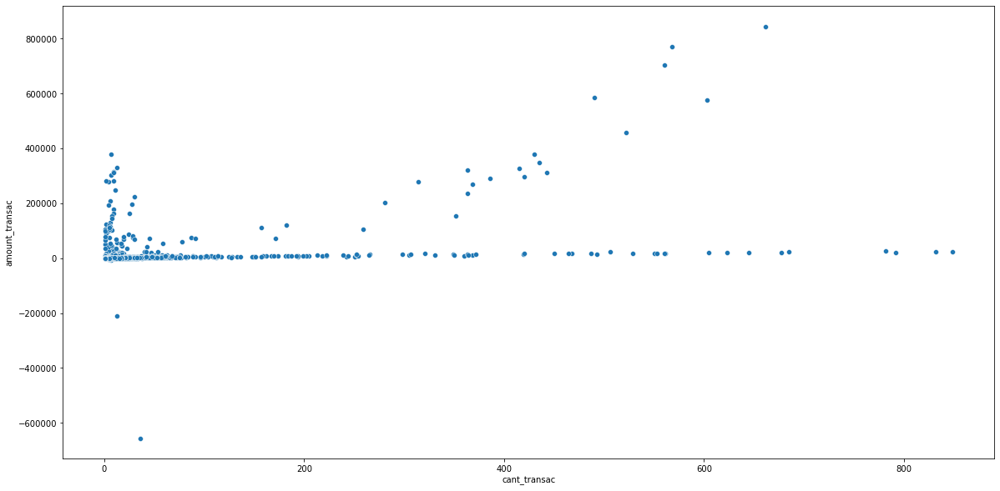

In [52]:
# Purchases by merchant
data_month = data.groupby(['period','merchant_name']).agg({'original_gross_amt':['count','sum']})
data_month.columns = ['cant_transac','amount_transac']
data_month.reset_index(inplace=True)
plt.figure(figsize=(20,10))
sns.scatterplot(data = data_month, x ='cant_transac', y = 'amount_transac' )


__Comments:__  
We can see different groups in the dataset grouped by merchant and period (YearMonth):   
- a) There is a group where the amount and number of transactions for that merchant is low
- b) There is another group where we can see high number of transactions but low amounts for that merchant    

These both groups are the more frequent cases but there are also other particular groups: 
- c) There is a group with low (<50) transactions but high amounts (>200K GBT). (The main directorate in this group is __"corporate resources"__ ) 
- d) There is a group where the amount increases as the number of transactions. (The main directorates in this group are __"adult & communities" and "local services"__)
- e) Finally, there is a group where the purchases were negative. (The main directorate in this group is __"Others"__)

<hr>

# Unusual transactions
- In this section I will apply some techniques to try to indetify unusual transactions.  
- As the data is not labeled (fraud vs not fraud) I can only apply unsupervised learning techniques.  
- Normally I would ask business about what they consider "unsual" before trying to implement this techniques. The reason of it is because they could give us "expert knowledge" that can help to define a good set of features that can caracterize the transaction.  
- As we may know , probably the main feature could be the amount of the transaction (in this case the feature is __"original_gross_amt"__).  
- However, I will add some other features from "common sense" to try to caracterize better the transactions.

In [53]:
# Create a back up of the data
## Just for not going back too much in the code if I need to
data_bk = data.copy()

In [73]:
data = data_bk.copy()

In [74]:
# Filter null-amount transactions
print('Number of rows before filtering: {:,}'.format(data.shape[0]))
data = data[data['original_gross_amt'].notnull()]
print('Number of rows after filtering: {:,}'.format(data.shape[0]))

Number of rows before filtering: 145,802
Number of rows after filtering: 145,801


In [76]:
# Define the set of features to look at
model_raw_cols = ['original_gross_amt','weekday','trans_cac_desc_1_grouped','n_transac_day','directorate_group']
X = data[model_raw_cols].copy()
print(X.shape)

(145801, 5)


Vehicle Fuel


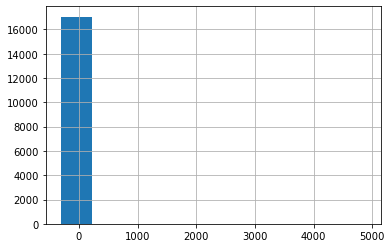

**************************************************

Staff Advert Exp


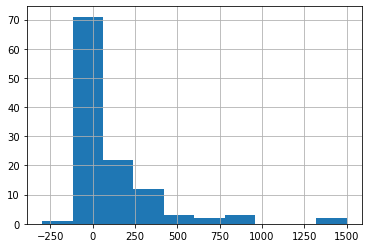

**************************************************

Equip Operational


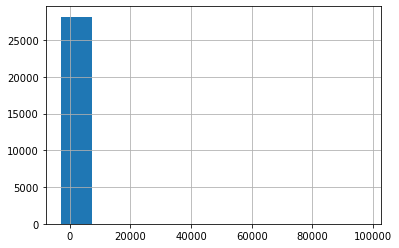

**************************************************

Supplies & Sev Mic


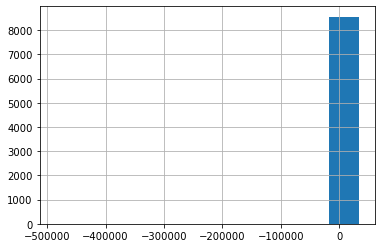

**************************************************

Equip Other


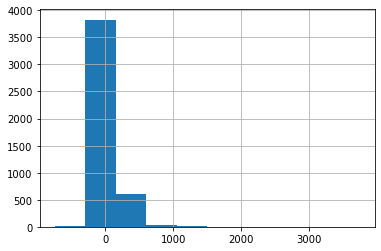

**************************************************

Mat'l Raw/Drct


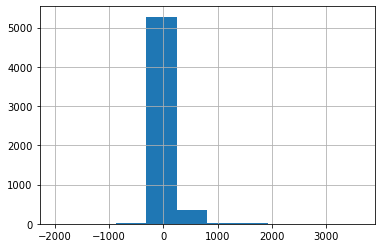

**************************************************

Computing Other


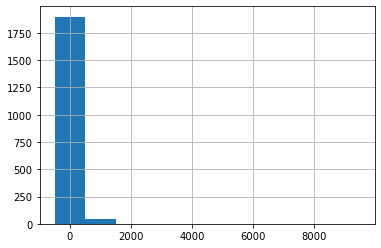

**************************************************

Purchases Food


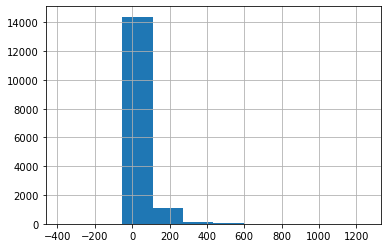

**************************************************

Bldg RM Departmental


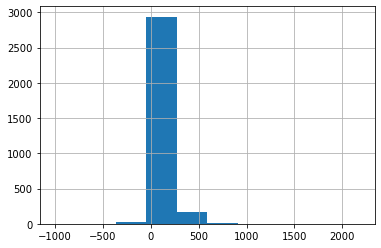

**************************************************

Licences & Permits


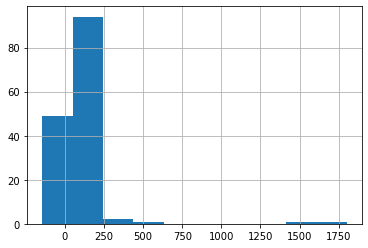

**************************************************

Hospitality


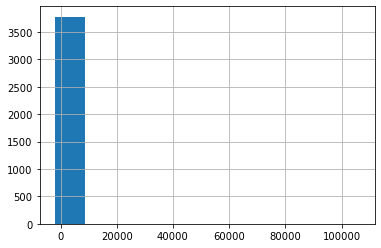

**************************************************

Postage


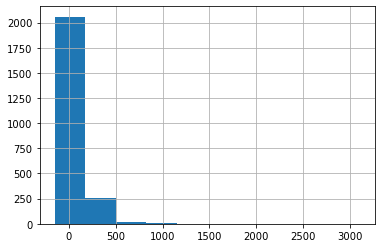

**************************************************

Stationery


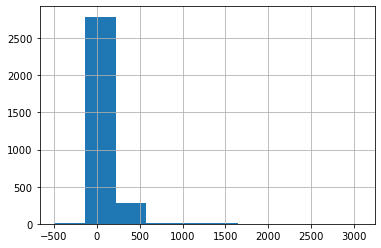

**************************************************

Vehicle OthrunCosts


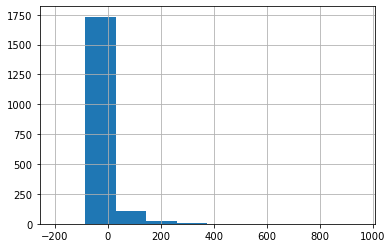

**************************************************

Training Other


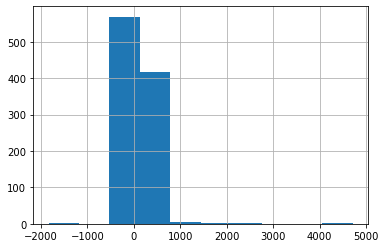

**************************************************

N'Papers&Periodicals


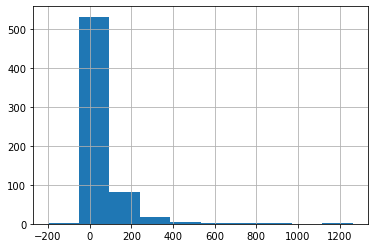

**************************************************

Prof Fees other


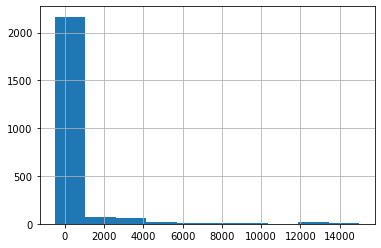

**************************************************

Subscriptions


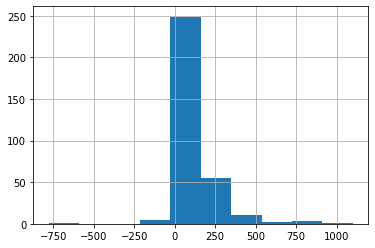

**************************************************

Legal Fee Other


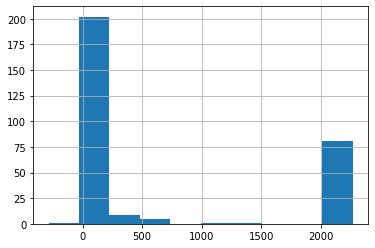

**************************************************

Equip Office


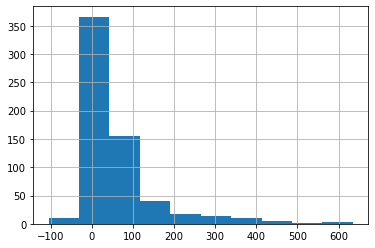

**************************************************

Conference Fees Subs UK


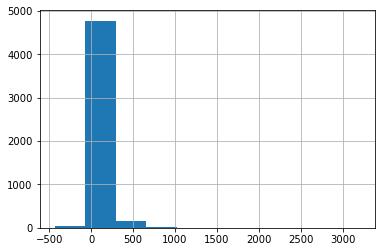

**************************************************

Phon NonCentrx Lines


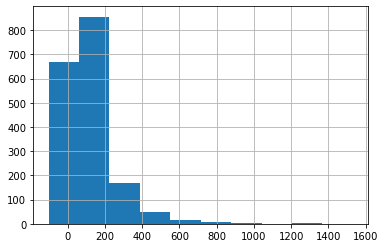

**************************************************

Conference Fees Subs Foreign


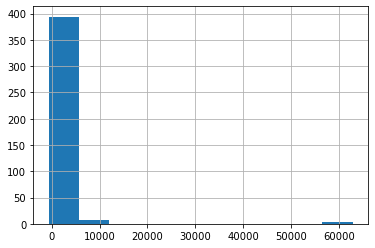

**************************************************

Books


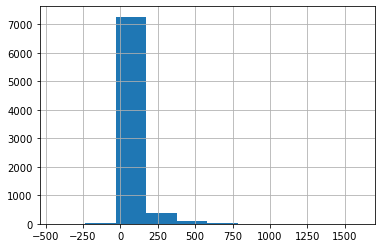

**************************************************

Cleaning Materials


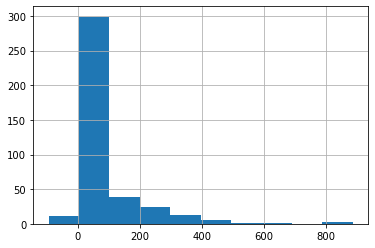

**************************************************

Other


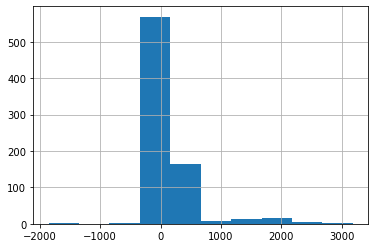

**************************************************

Travel Bus/Rail


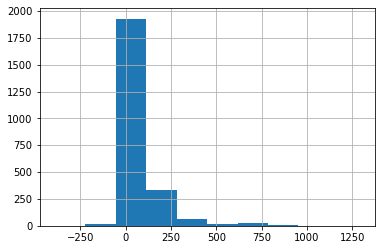

**************************************************

Ttavel Other (UK)


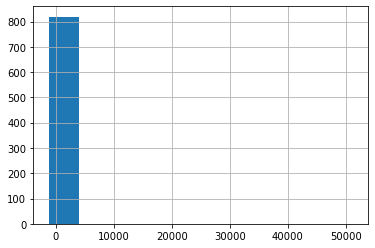

**************************************************

Travel Foreign


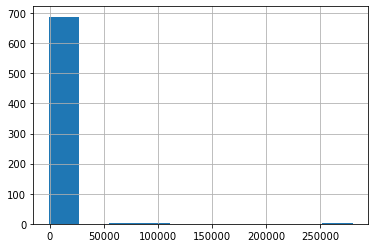

**************************************************

Personal Needs


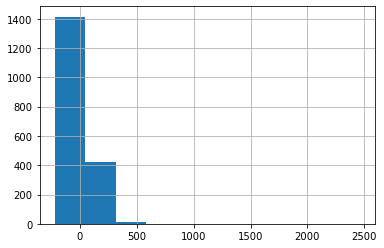

**************************************************

Vehicle Excise Lics


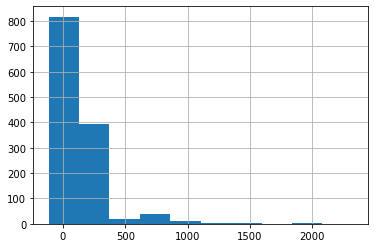

**************************************************

Photocopying


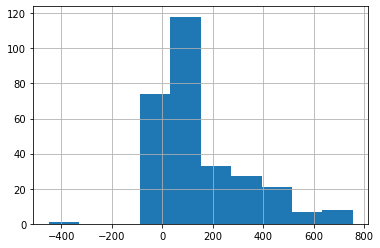

**************************************************

Premises Misc


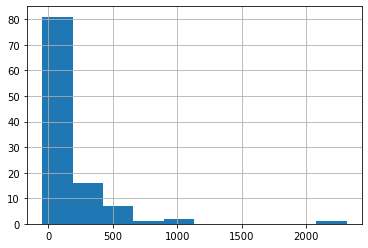

**************************************************

Other Services


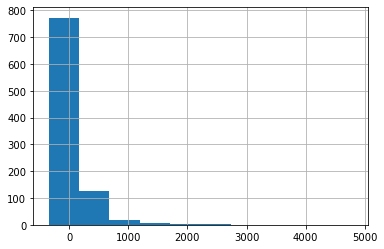

**************************************************

Visits Expenditure


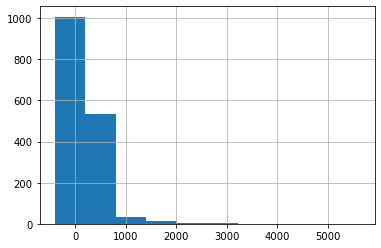

**************************************************

Travel Taxis


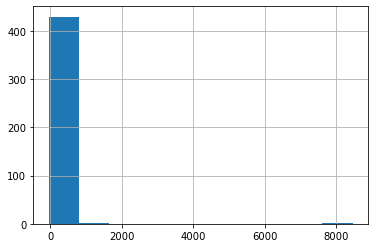

**************************************************

Clothing&Uniforms


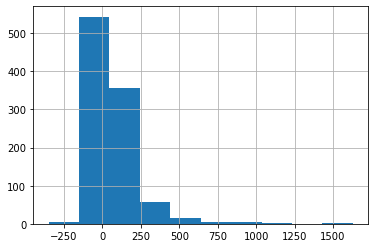

**************************************************

Transport Misc


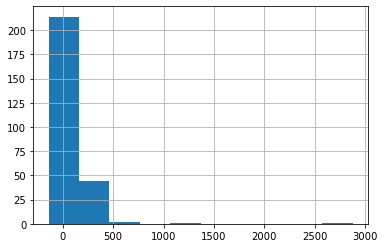

**************************************************

Family Support S17


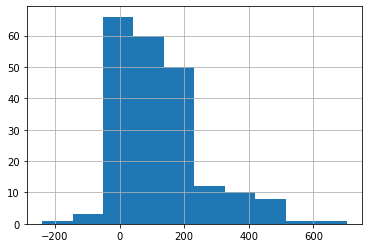

**************************************************

Oth Indirect EmpExps


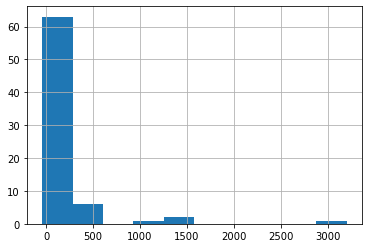

**************************************************

Purchases Othermat'l


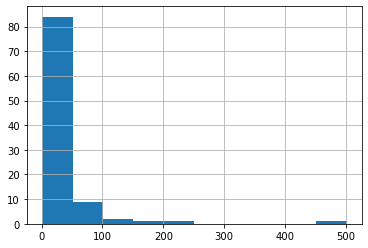

**************************************************

Other Fix&Fittings


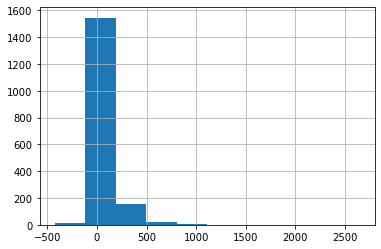

**************************************************

Bank & Goro ChgsS


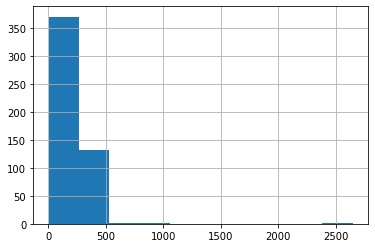

**************************************************

Fire/Sec'yAlarm/Eq't


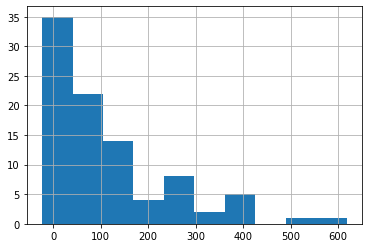

**************************************************

Stock Misc


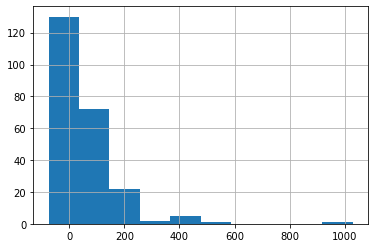

**************************************************

Car Parking


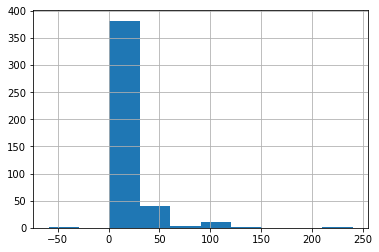

**************************************************

Vehicle R&M


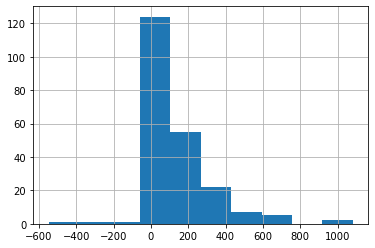

**************************************************

Grounds Maintenance


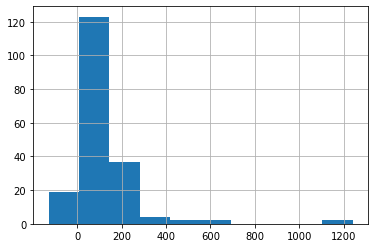

**************************************************

Bldg RM Routine UDD


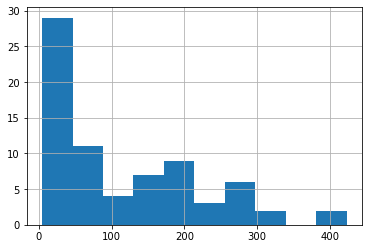

**************************************************

Bldg RM Emergy UDD


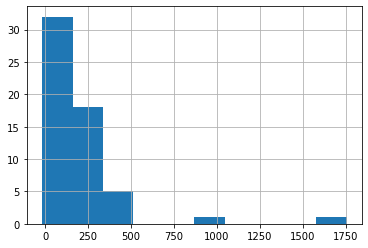

**************************************************

Vehicle Hire Charge


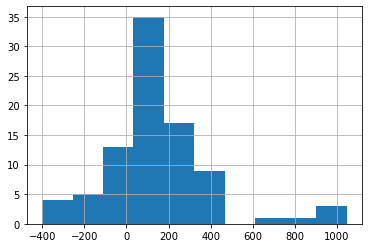

**************************************************

Bldg RM Fair Fund NS


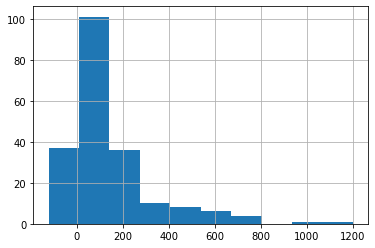

**************************************************

Training Travel&Subs


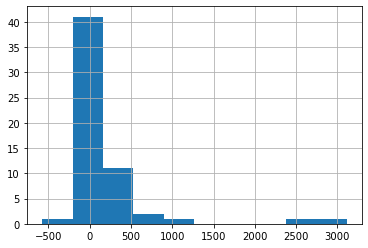

**************************************************

Mobiles/Radios/Pagrs


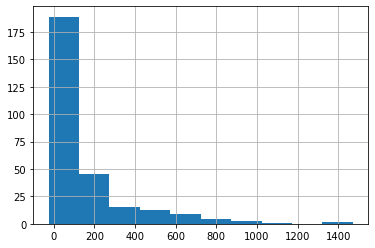

**************************************************

Advertising NonStaff


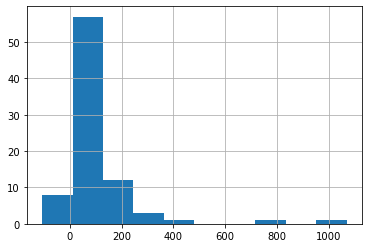

**************************************************

Promotions/Marketing


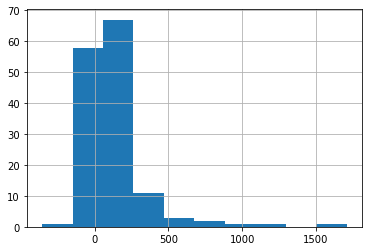

**************************************************

GoodsPurchforResale


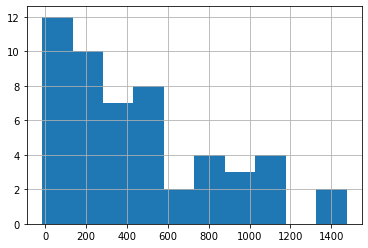

**************************************************

Equip Maintenance


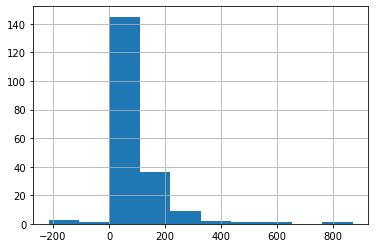

**************************************************

Other Agencies


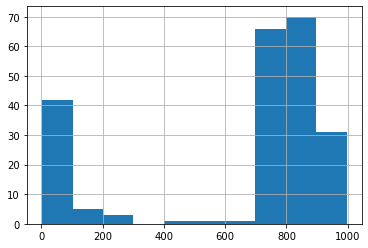

**************************************************

Electricity


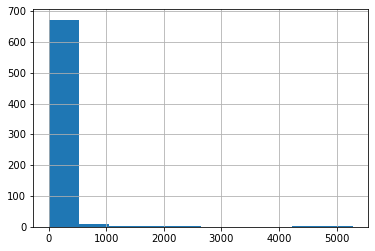

**************************************************

In Year Credits


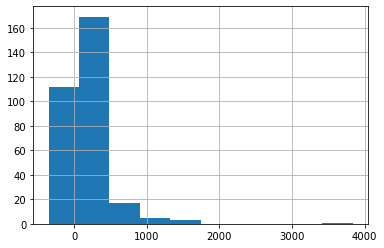

**************************************************

Training Tutor Fees


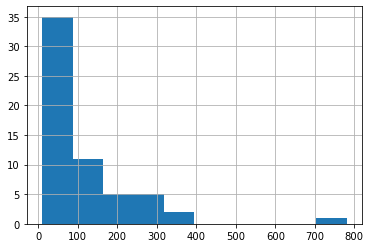

**************************************************

Catering Disposables


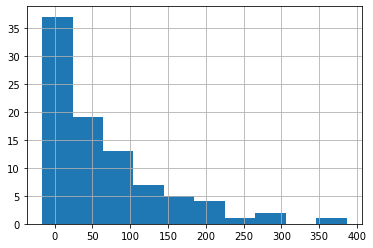

**************************************************

Signs & N'boards


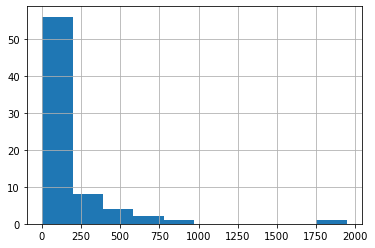

**************************************************

Gas


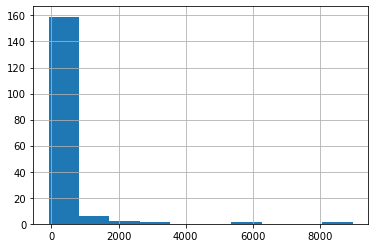

**************************************************

Water Services


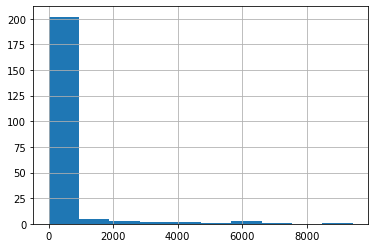

**************************************************

Accomodation Hire


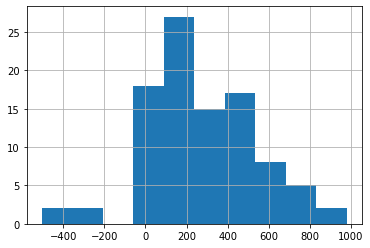

**************************************************

Training EquipMat'ls


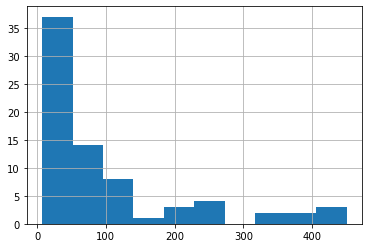

**************************************************

Aftercare Assistance


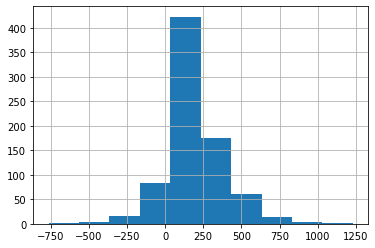

**************************************************

Other Third Parties


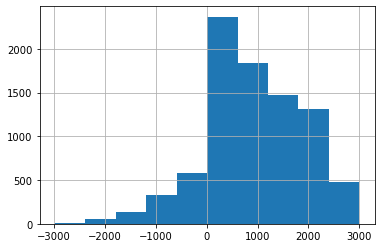

**************************************************



In [77]:
for val in X['trans_cac_desc_1_grouped'].unique():
    print(val)
    X[X['trans_cac_desc_1_grouped']==val]['original_gross_amt'].hist()
    plt.show()
    print('*'*50+'\n')

<hr>

## First approach: K-means for identifying clusters
In this section I will use K-means algorithm to create clusters of transactions with the hope of finding clusters with few transactions (the unsual ones)


In [78]:
# Process categirucal features
X = pd.concat([X,pd.get_dummies(X['directorate_group'])], axis=1)

In [79]:
from sklearn.preprocessing import MinMaxScaler

In [80]:
del X['directorate_group']

In [81]:
# Check for nulls
X.count()/X.shape[0]

original_gross_amt          1.0
weekday                     1.0
trans_cac_desc_1_grouped    1.0
n_transac_day               1.0
Others                      1.0
adult & communities         1.0
corporate resources         1.0
cyp&f                       1.0
cyp&f schools               1.0
local services              1.0
dtype: float64

In [82]:
groups = {}

In [ ]:
from sklearn.decomposition import PCA

In [83]:
from sklearn.cluster import KMeans

variance:  67.6
**************************************************


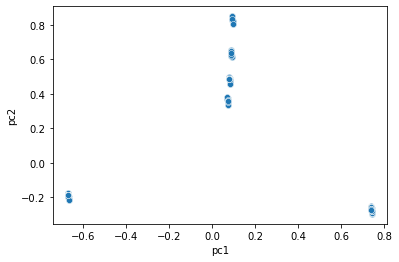

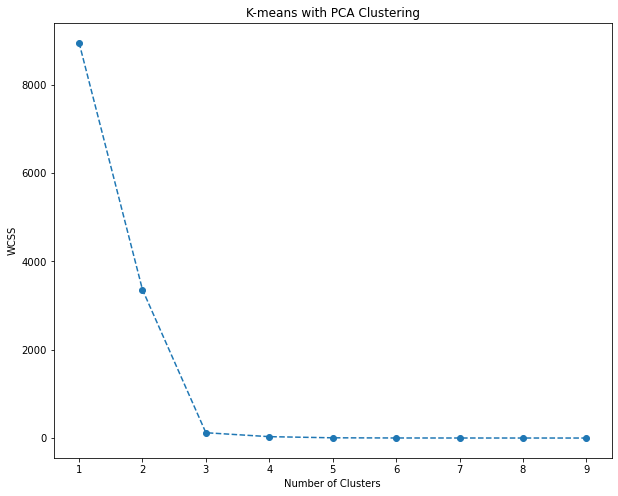

variance:  56.699999999999996
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


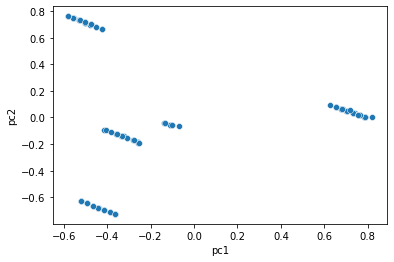

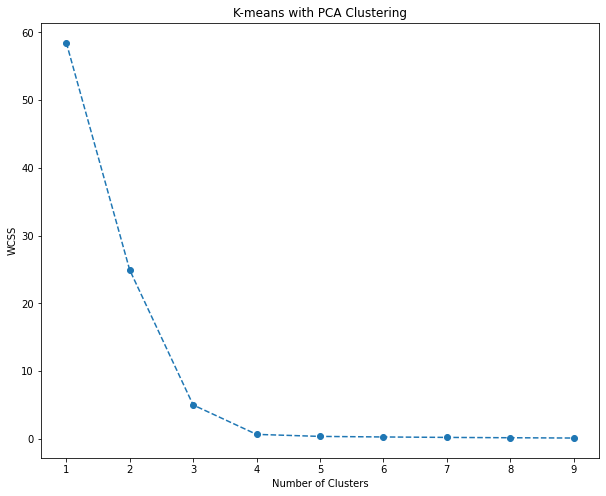

variance:  69.9
**************************************************


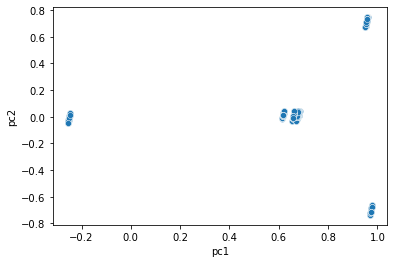

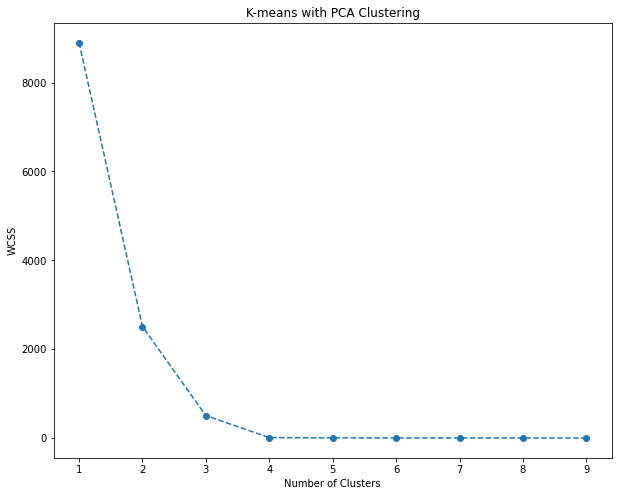

variance:  69.0
**************************************************


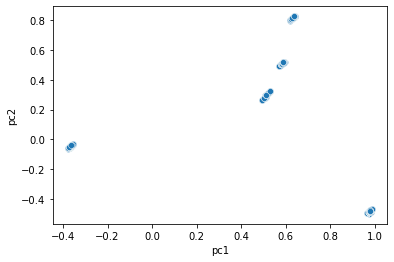

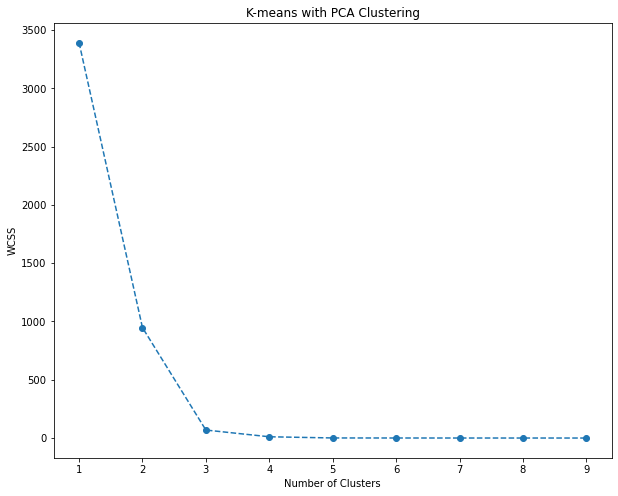

variance:  75.4
**************************************************


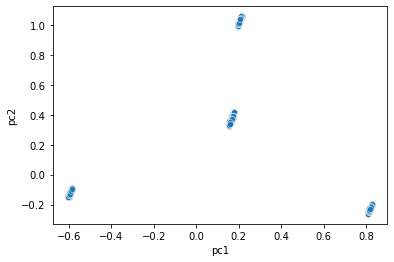

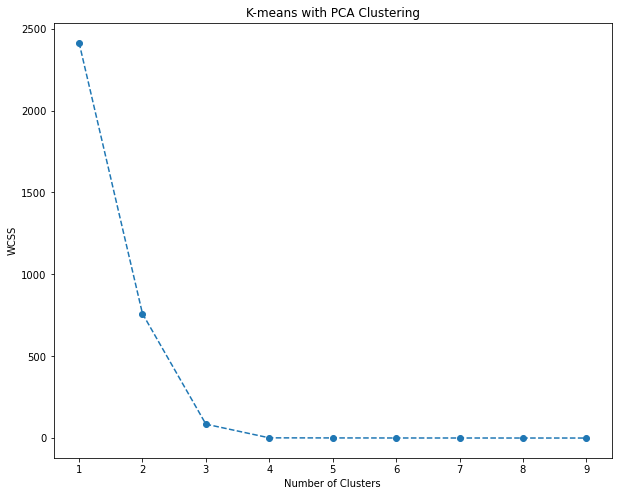

variance:  74.5
**************************************************


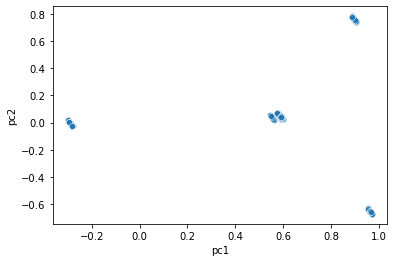

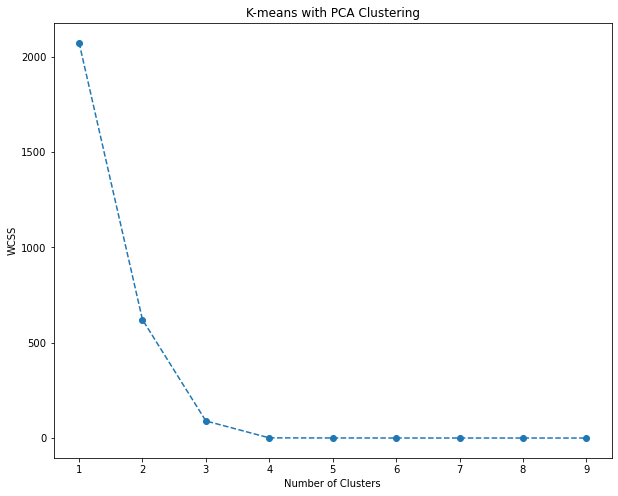

variance:  58.2
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


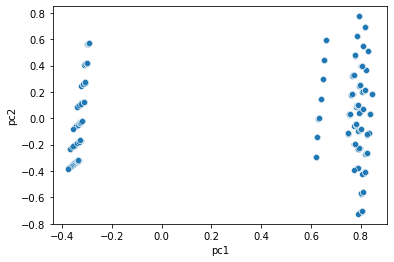

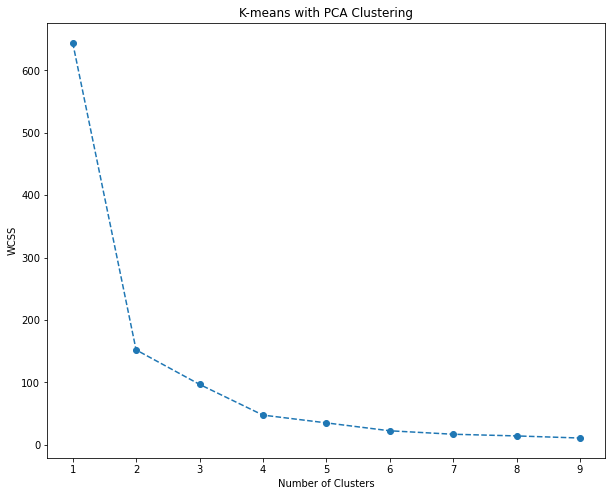

variance:  80.0
**************************************************


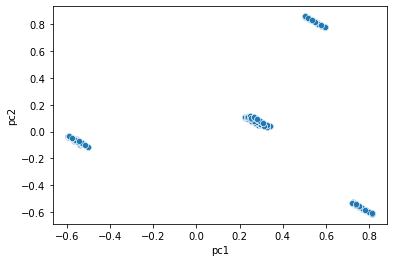

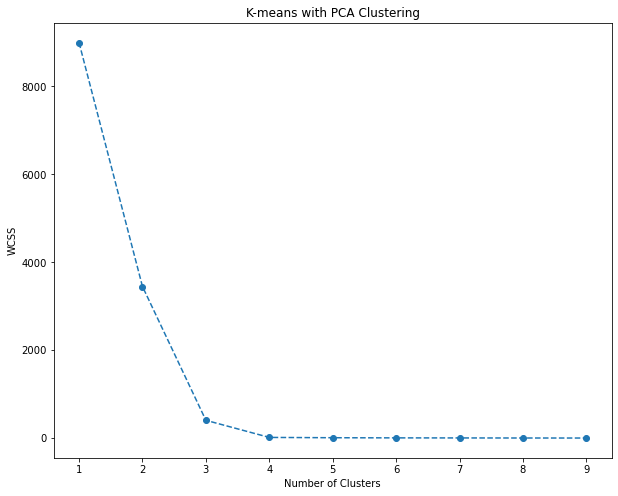

variance:  82.9
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=13.
  warnings.warn(


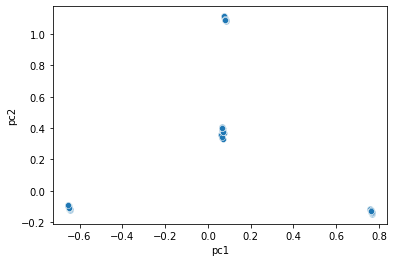

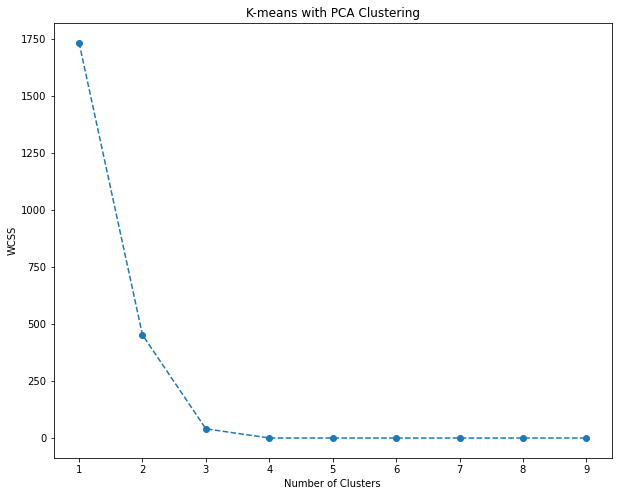

variance:  61.300000000000004
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


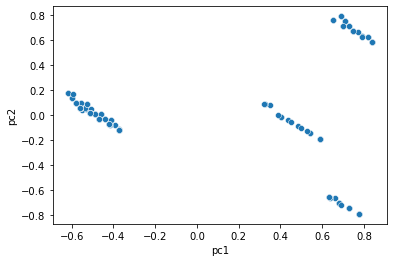

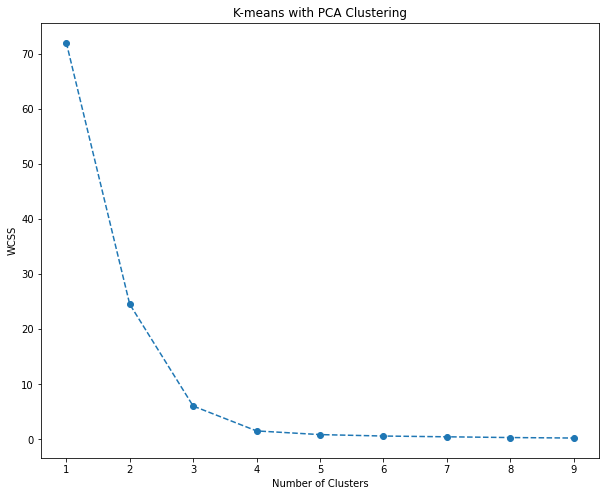

variance:  58.7
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=15.
  warnings.warn(


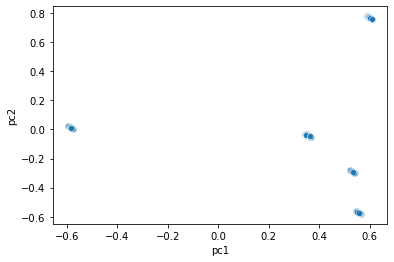

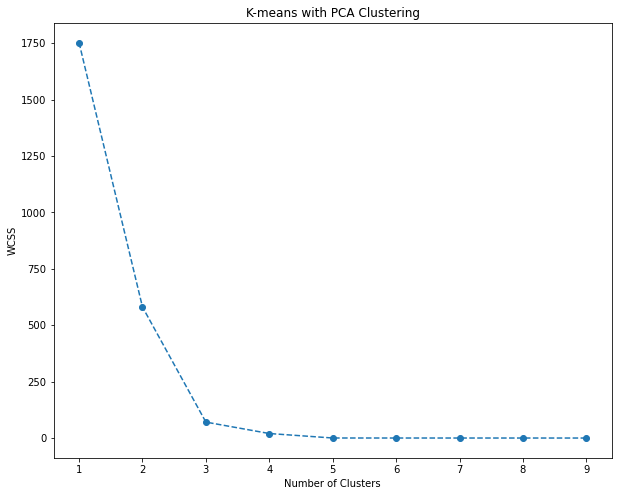

variance:  75.3
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


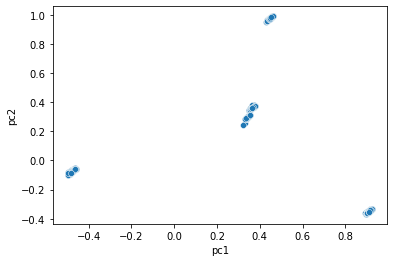

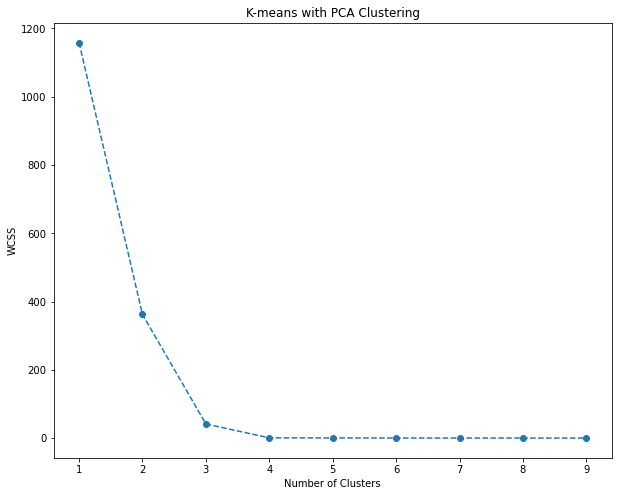

variance:  65.3
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=13.
  warnings.warn(


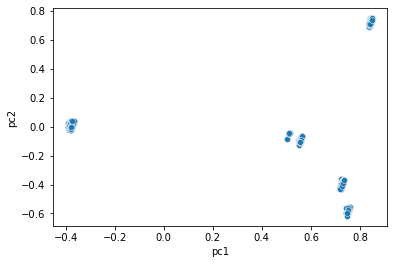

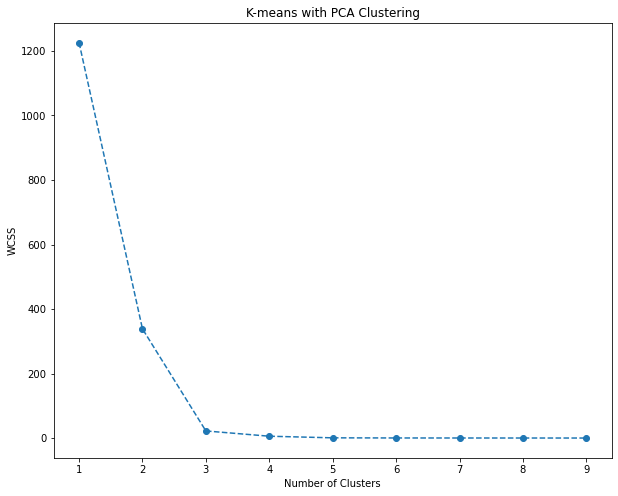

variance:  65.3
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


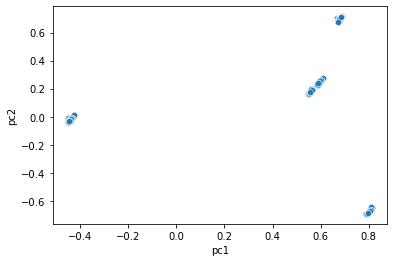

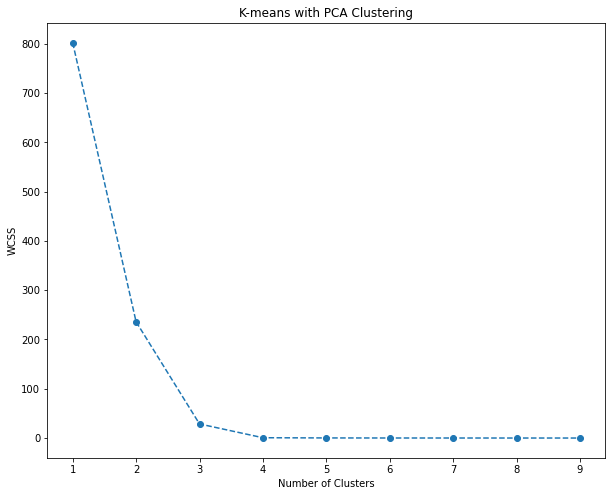

variance:  72.7
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


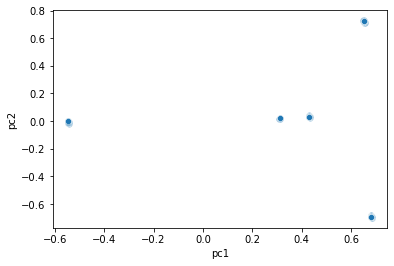

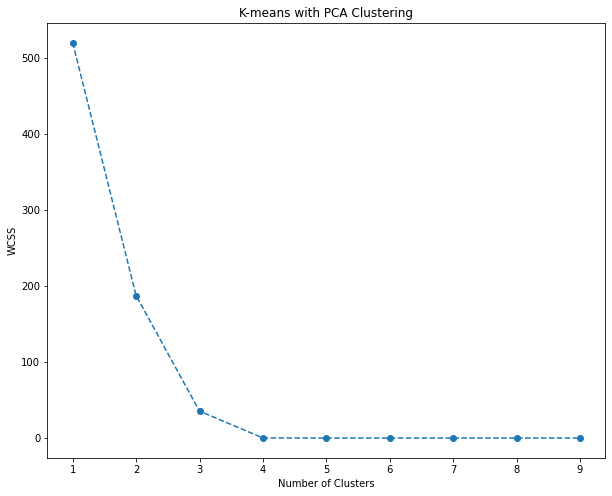

variance:  66.5
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


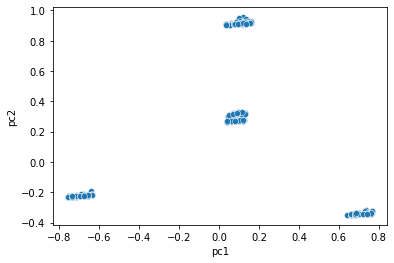

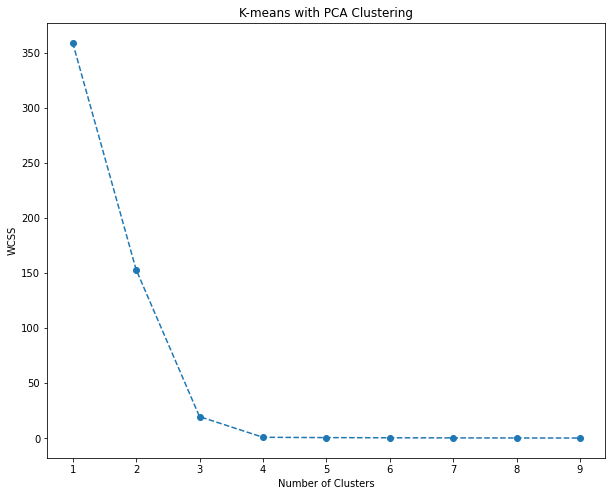

variance:  70.9
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


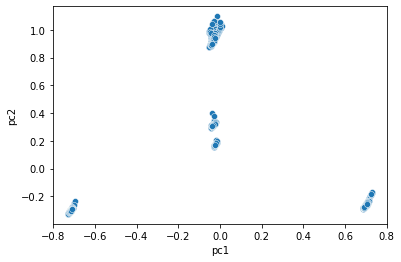

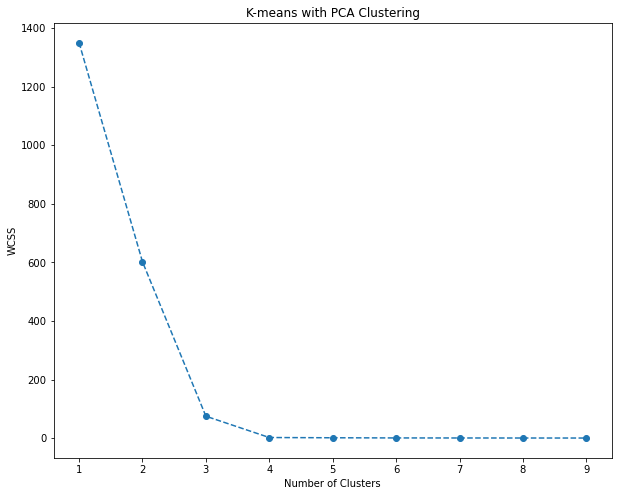

variance:  70.6
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


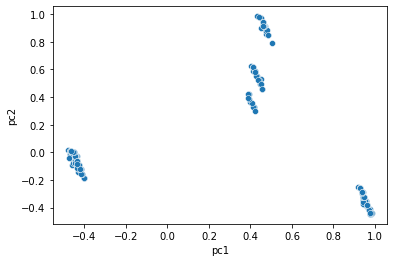

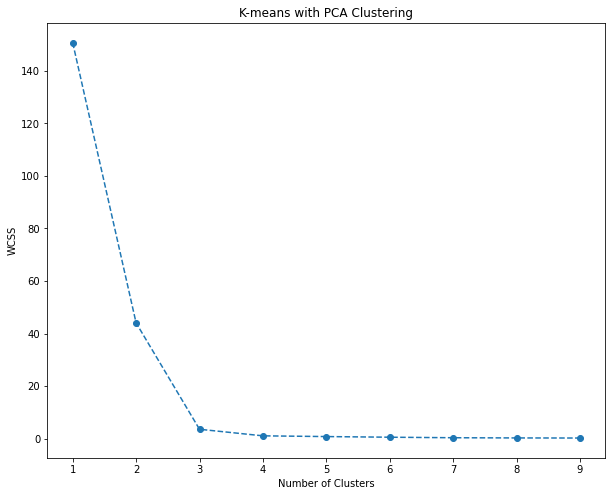

variance:  71.8
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


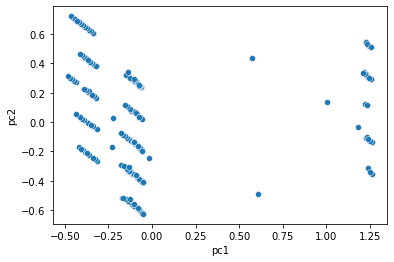

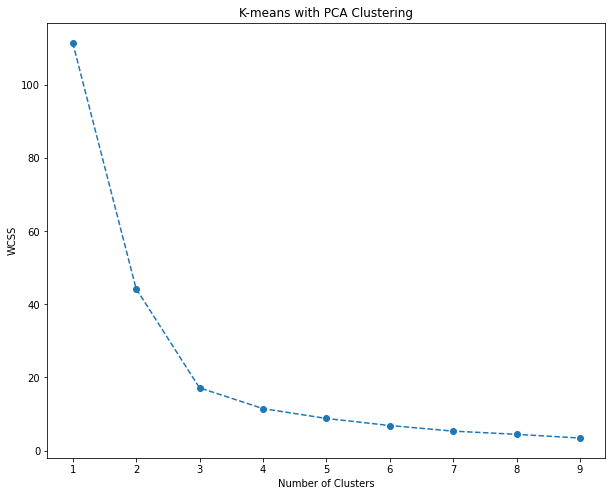

variance:  67.9
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


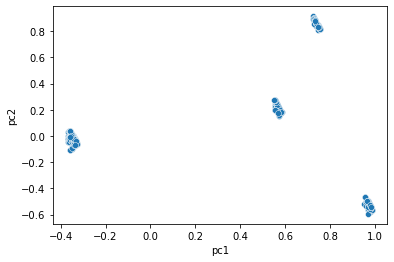

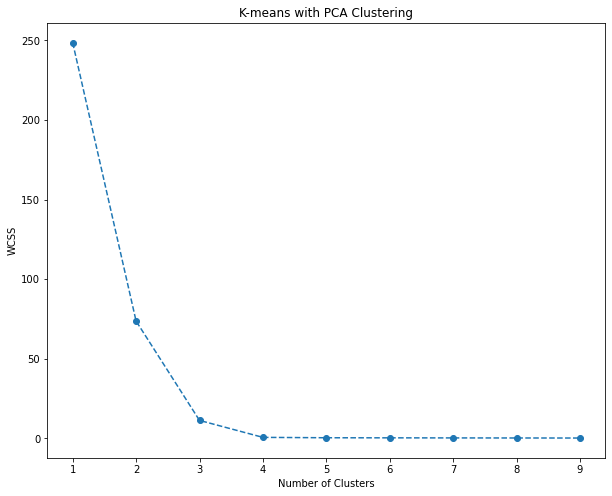

variance:  84.8
**************************************************


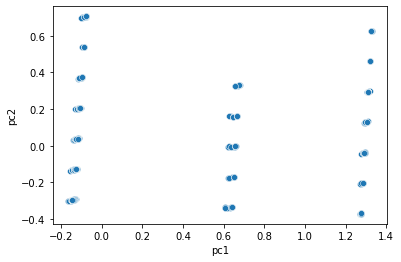

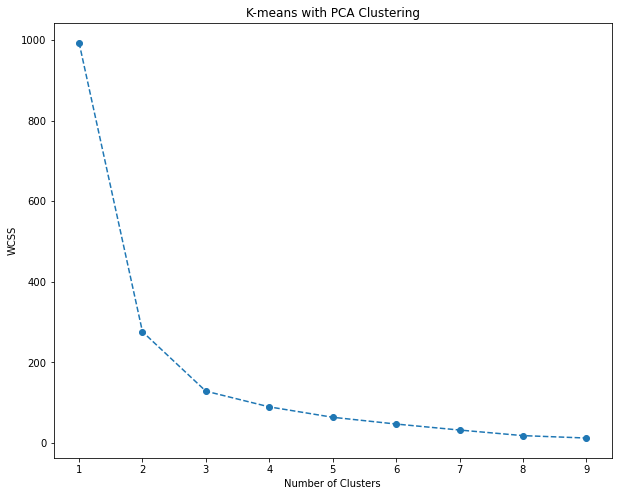

variance:  66.30000000000001
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


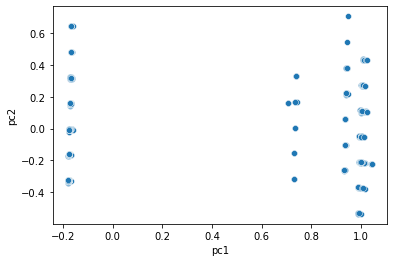

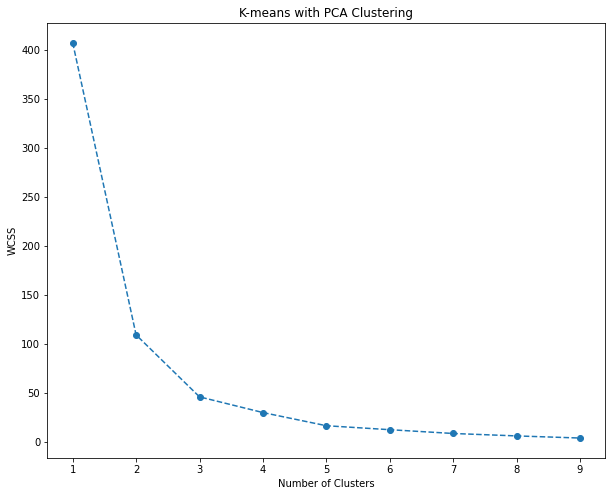

variance:  65.9
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


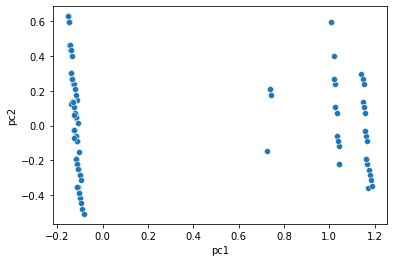

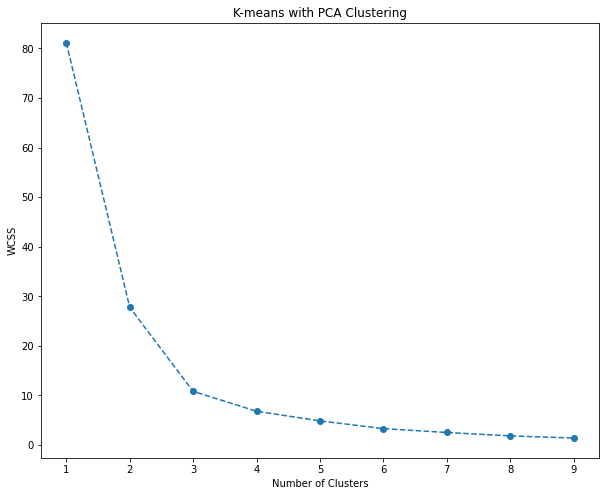

variance:  69.4
**************************************************


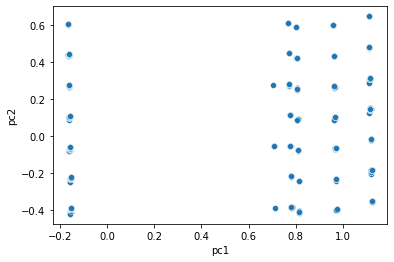

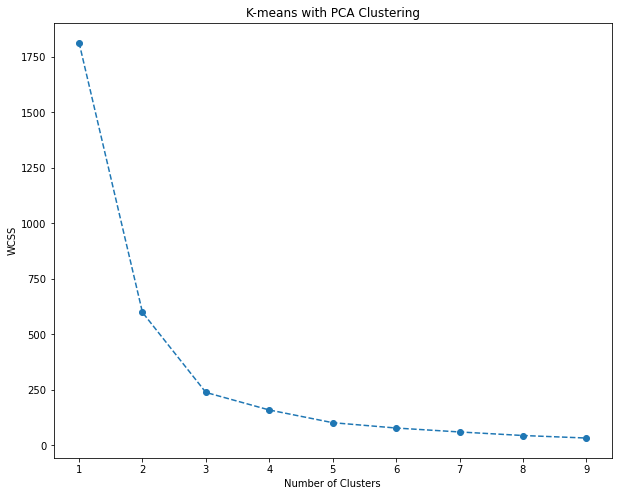

variance:  72.80000000000001
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


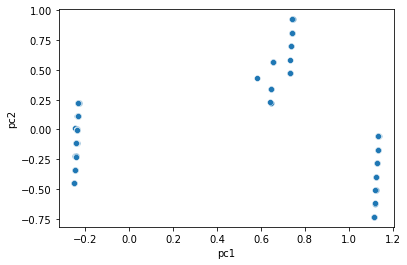

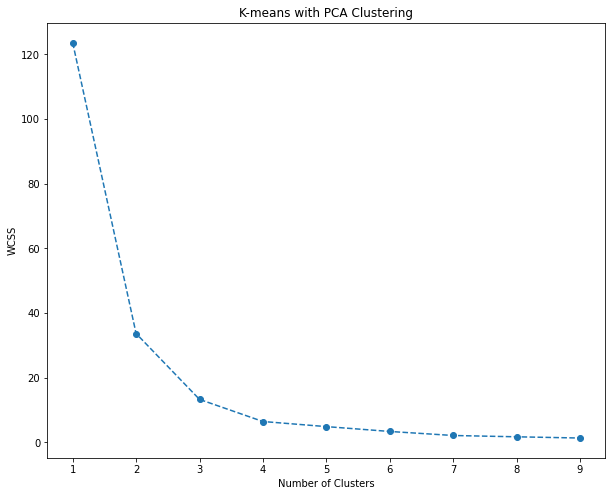

variance:  62.0
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


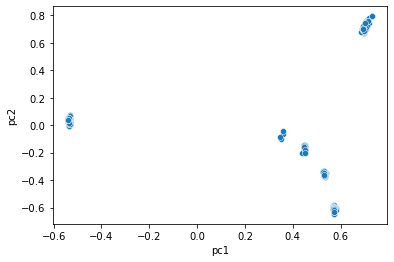

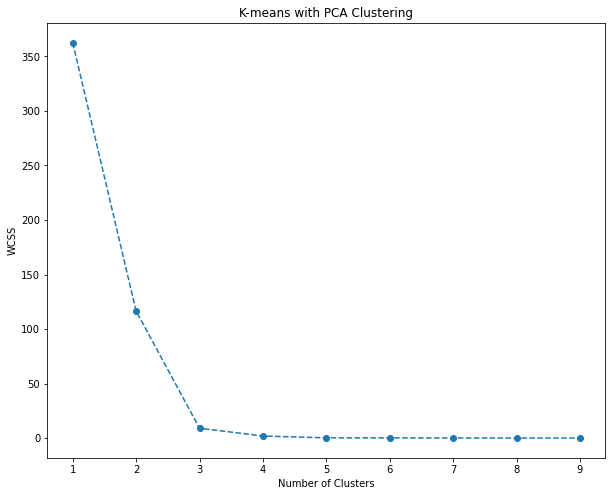

variance:  63.900000000000006
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


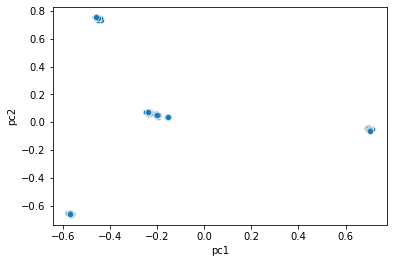

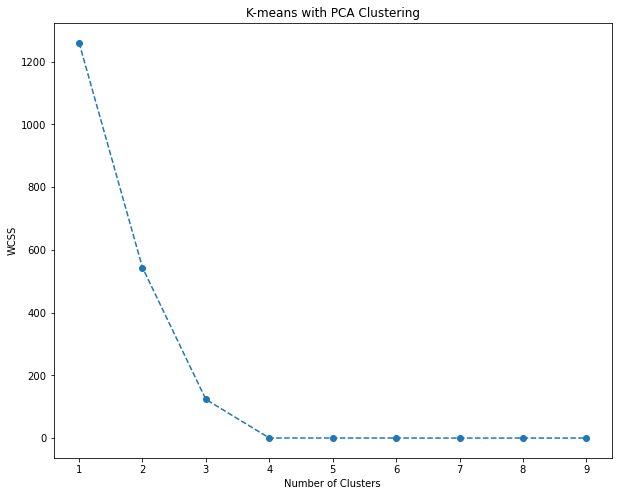

variance:  73.0
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


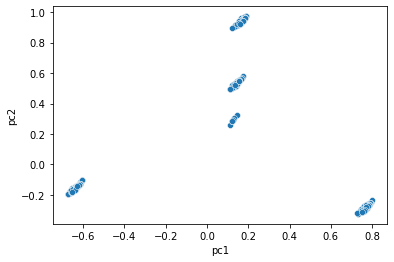

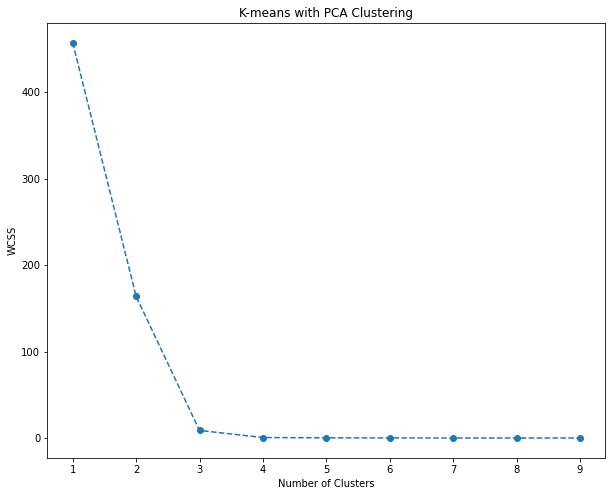

variance:  81.10000000000001
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


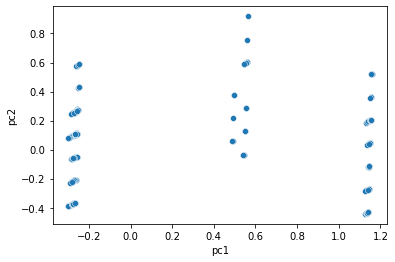

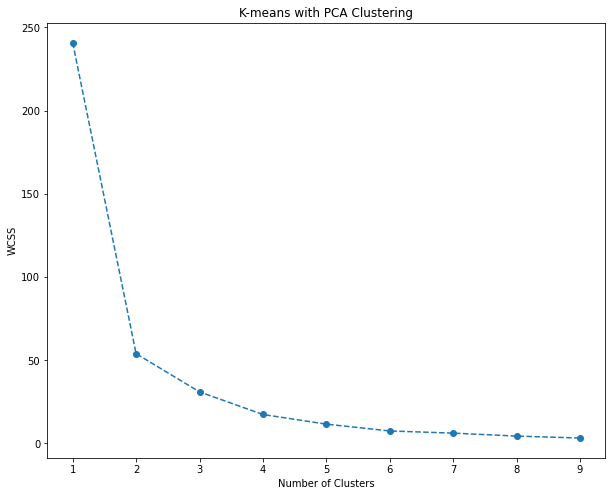

variance:  86.69999999999999
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


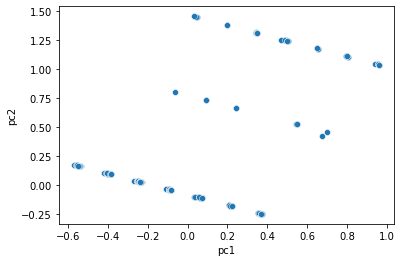

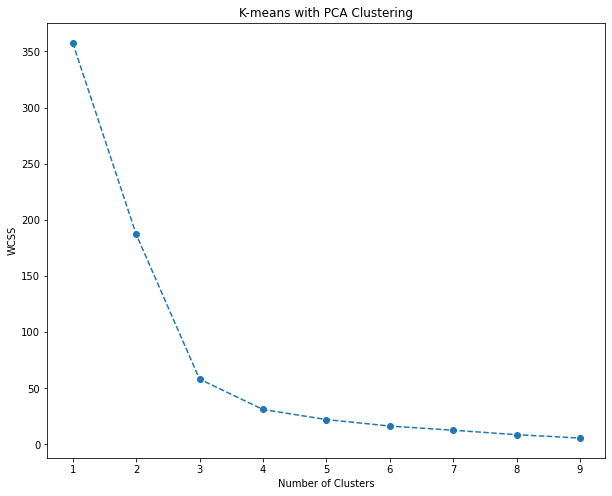

variance:  73.1
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


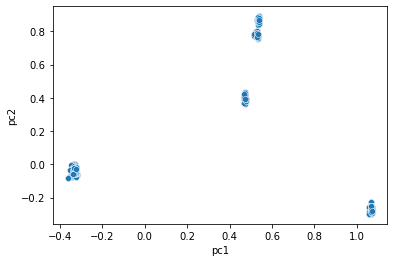

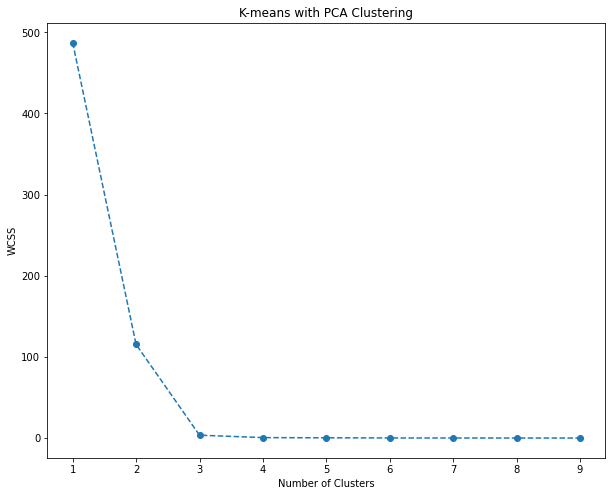

variance:  66.1
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


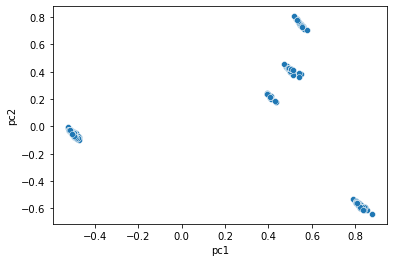

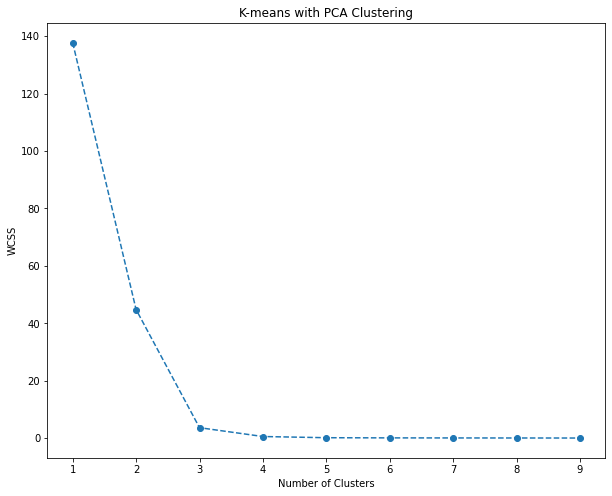

variance:  72.4
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


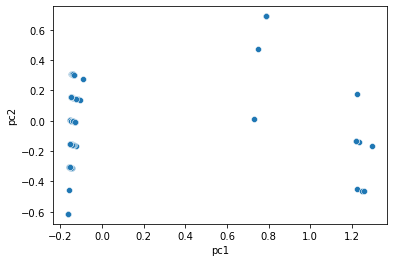

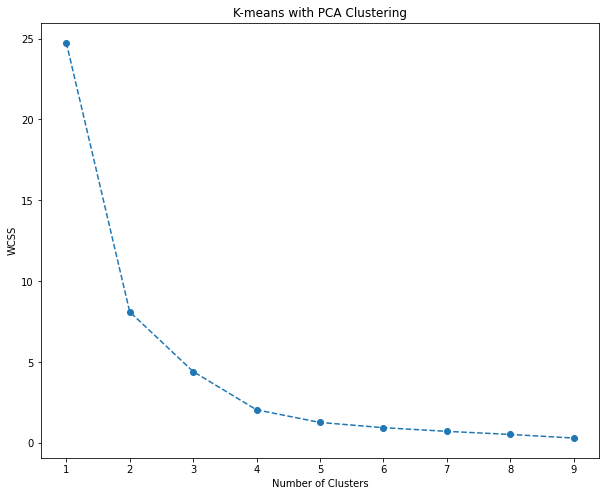

variance:  73.7
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


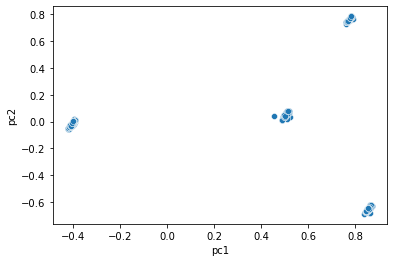

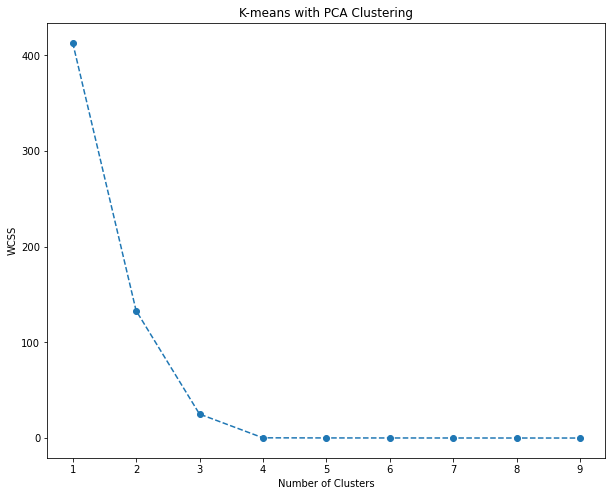

variance:  82.4
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


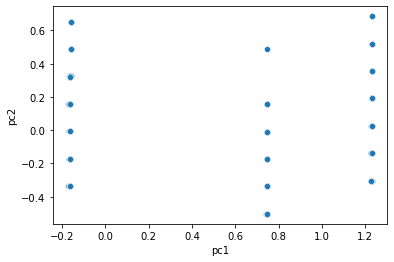

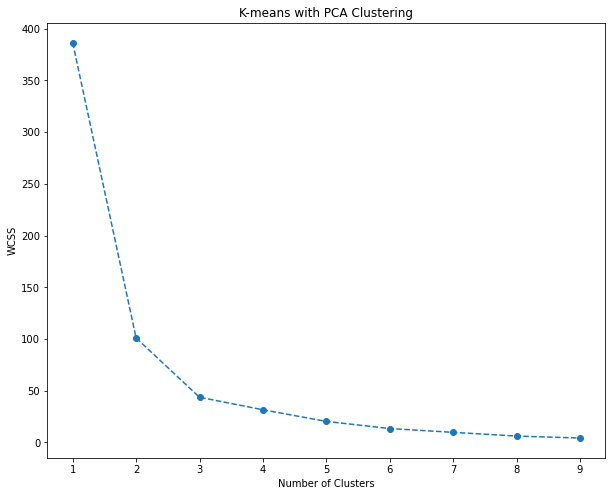

variance:  59.1
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


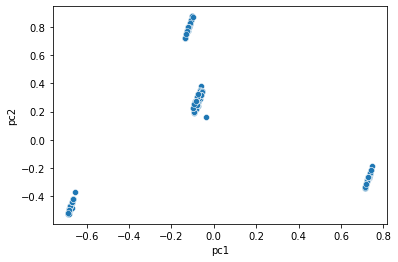

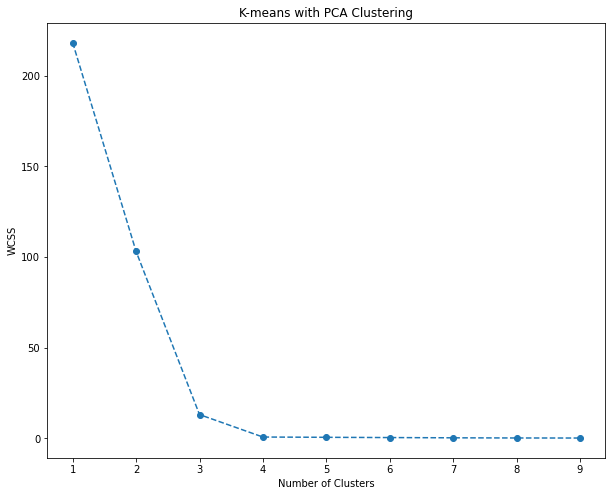

variance:  77.9
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


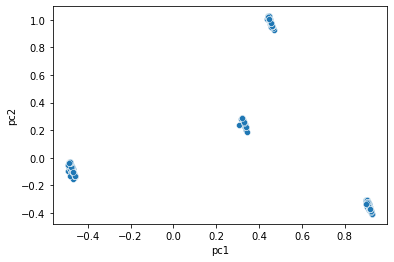

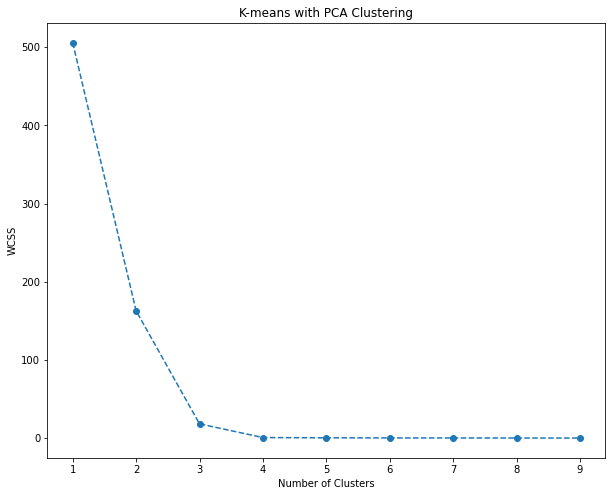

variance:  77.7
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


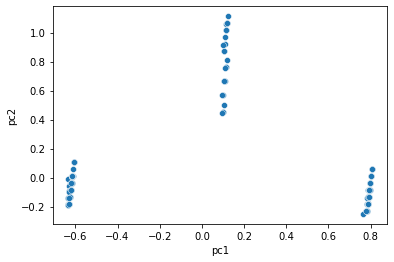

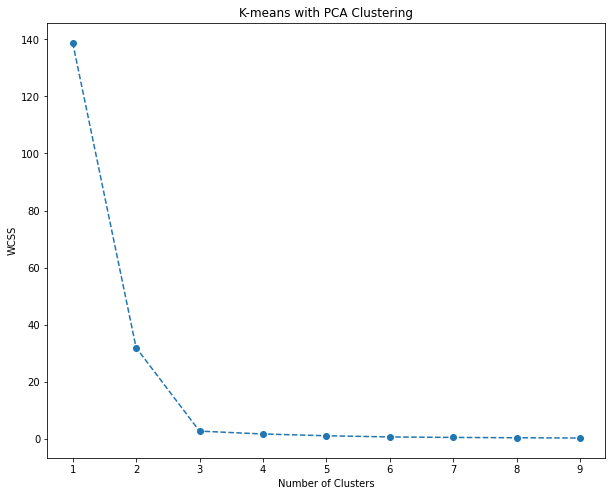

variance:  71.3
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


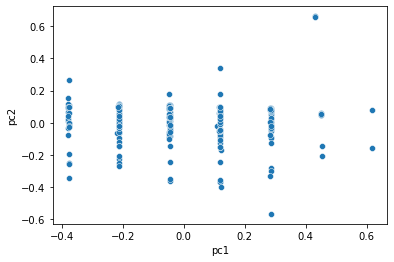

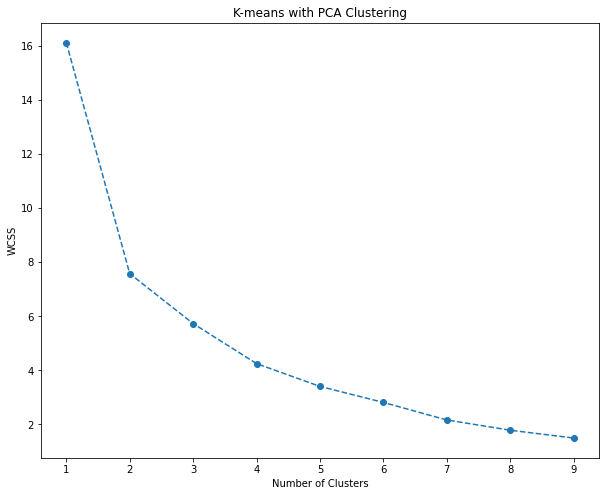

variance:  58.1
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


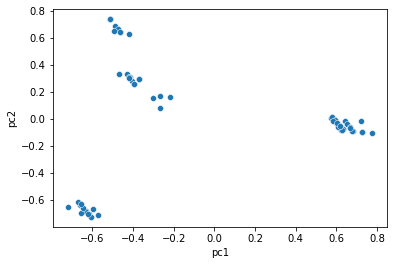

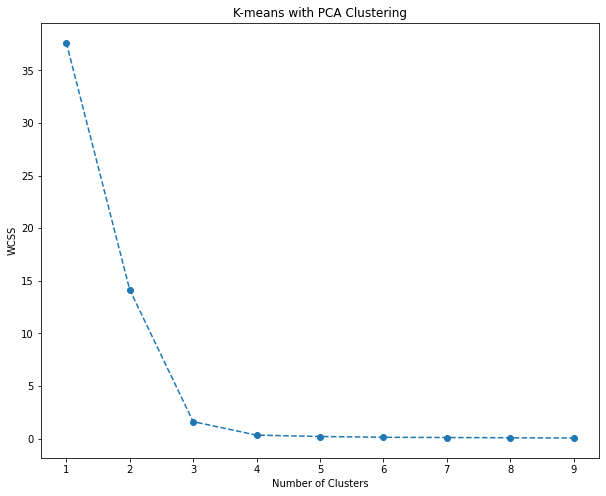

variance:  77.5
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


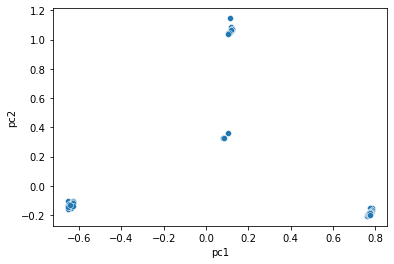

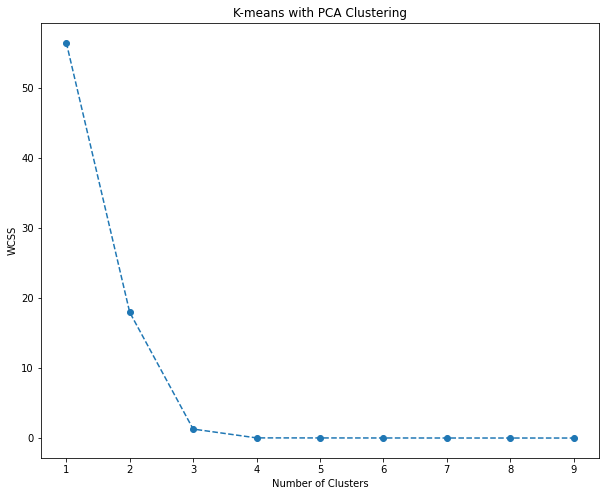

variance:  86.0
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


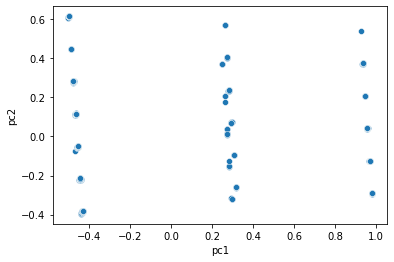

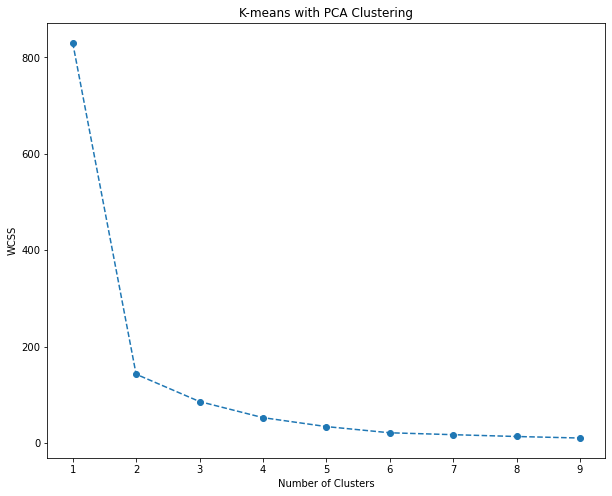

variance:  87.8
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


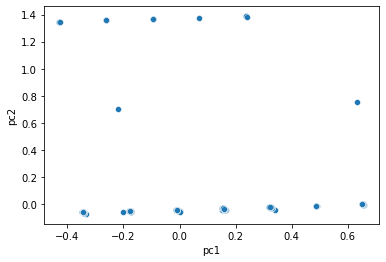

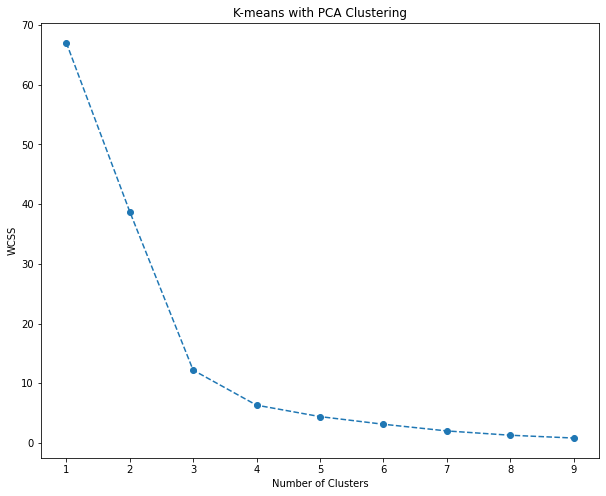

variance:  70.2
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


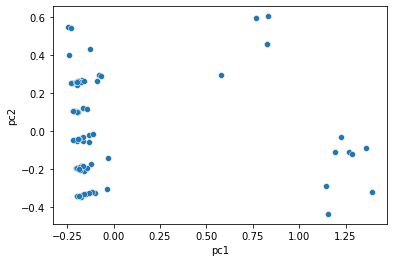

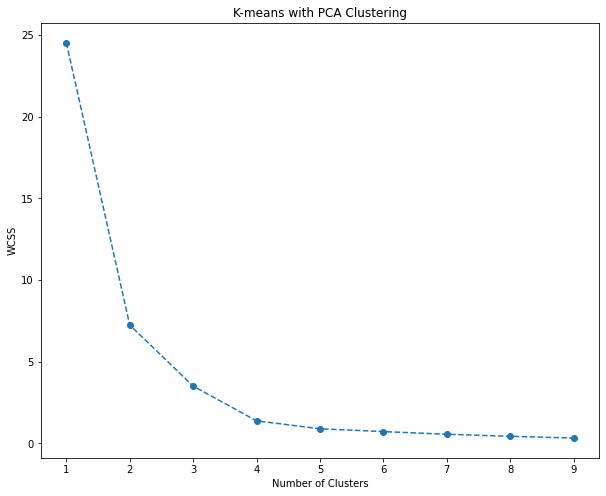

variance:  91.80000000000001
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


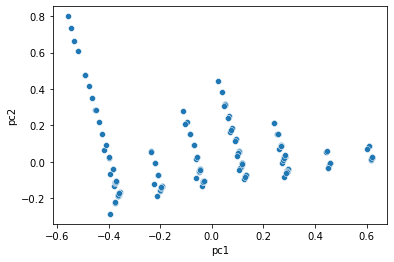

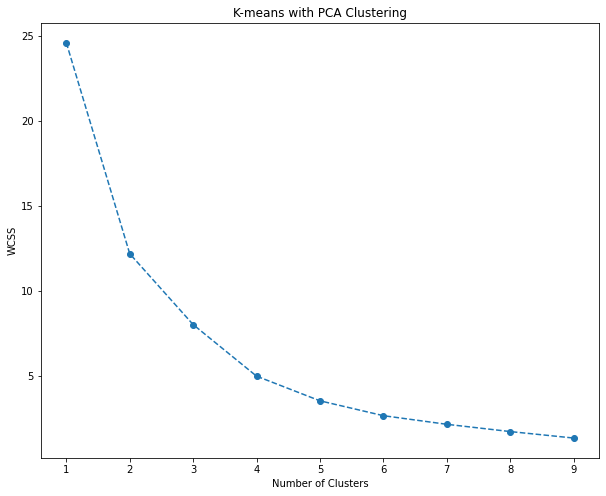

variance:  69.3
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


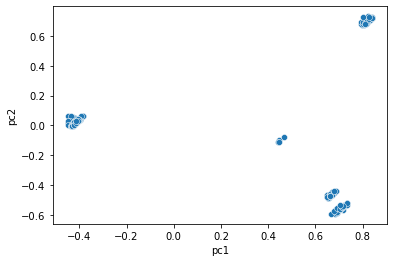

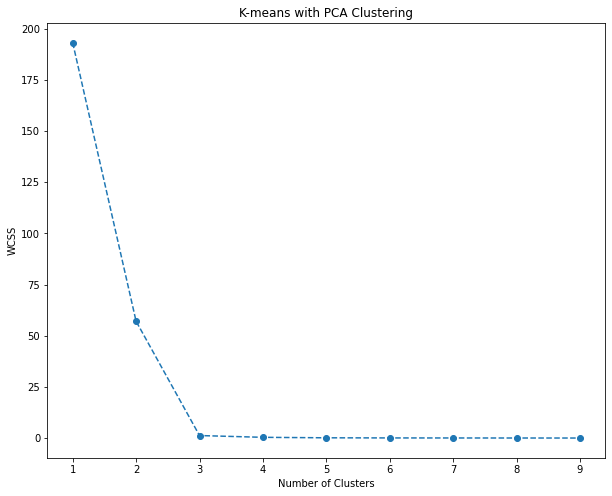

variance:  79.80000000000001
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


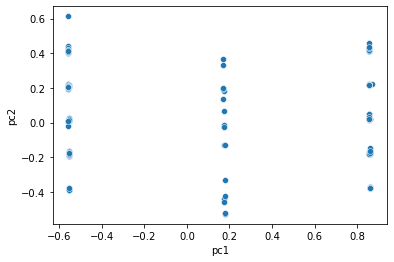

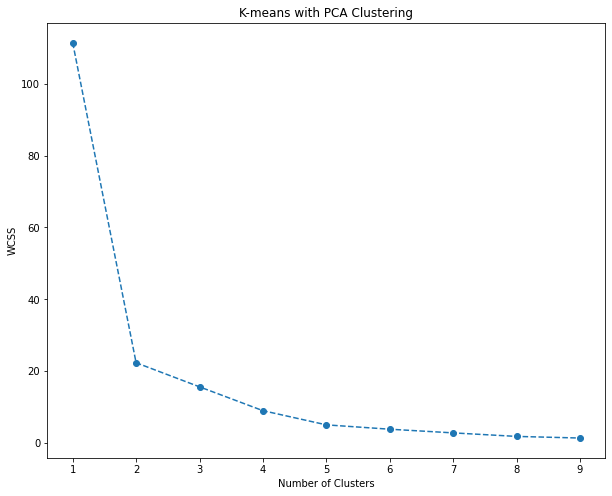

variance:  79.4
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


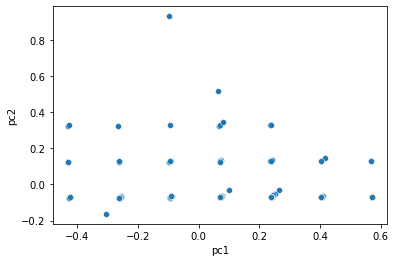

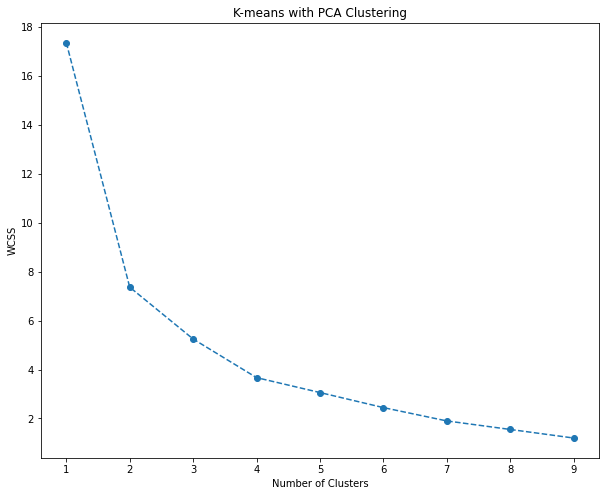

variance:  71.6
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


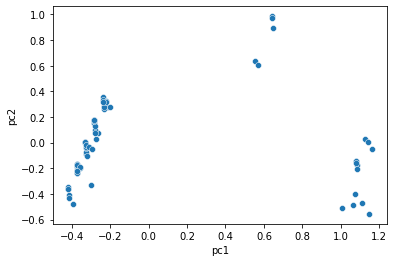

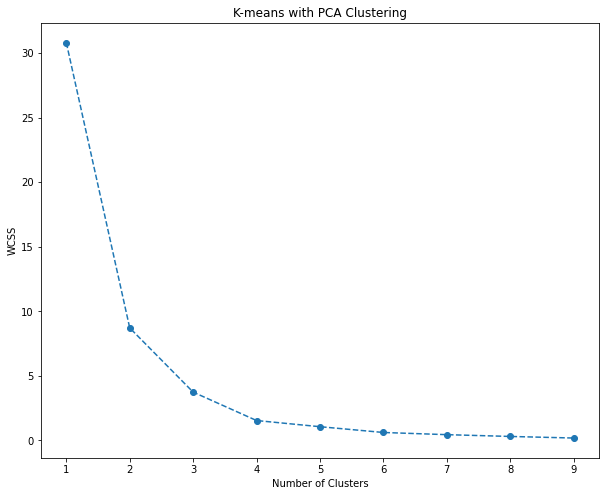

variance:  88.89999999999999
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


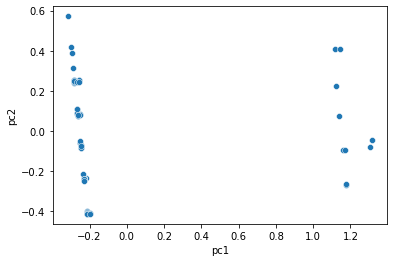

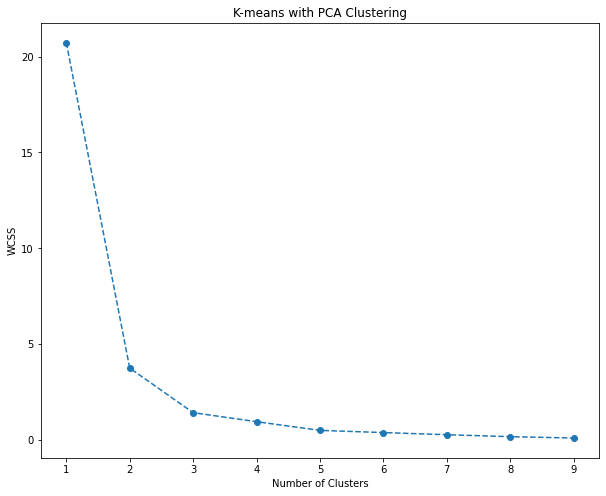

variance:  62.099999999999994
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


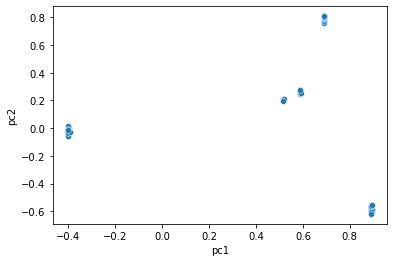

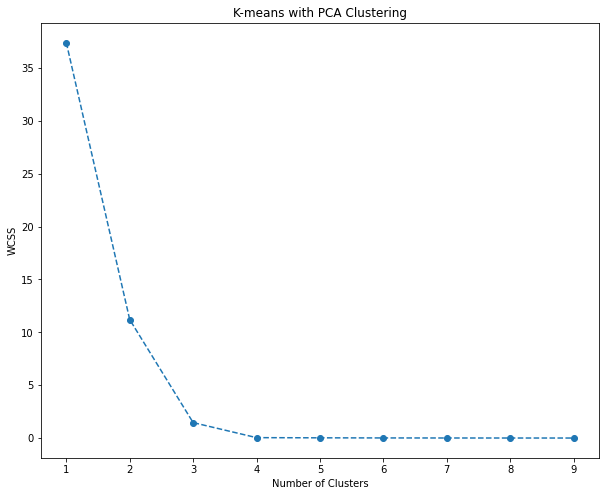

variance:  92.2
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


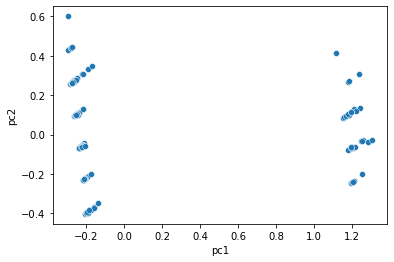

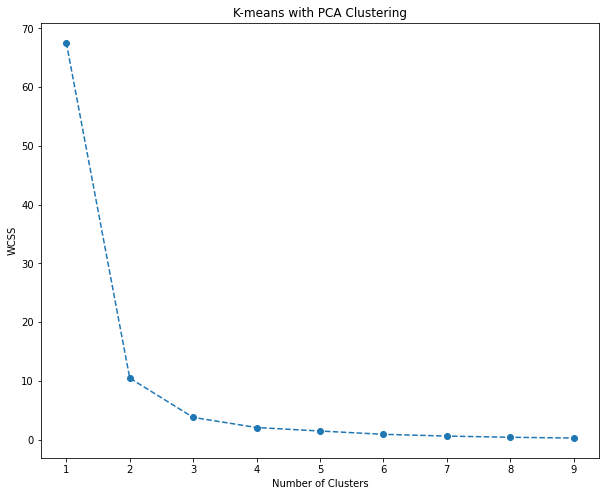

variance:  68.5
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


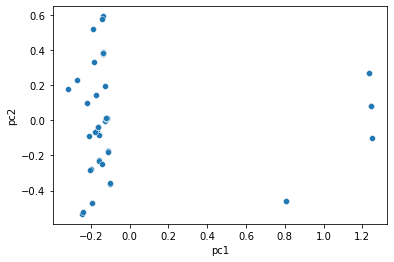

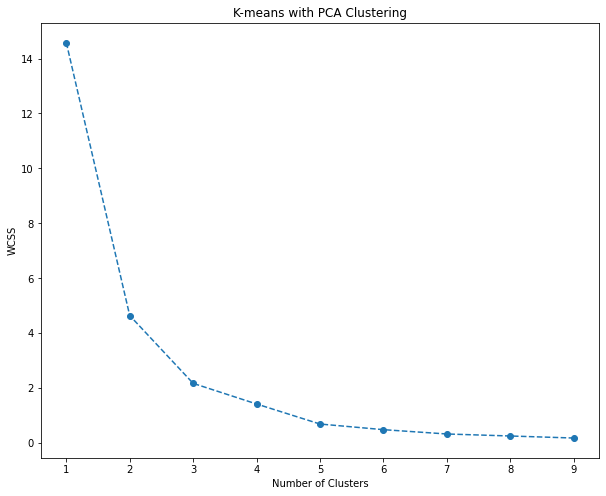

variance:  64.5
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


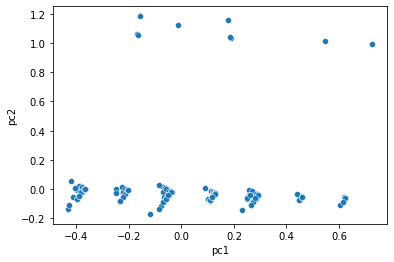

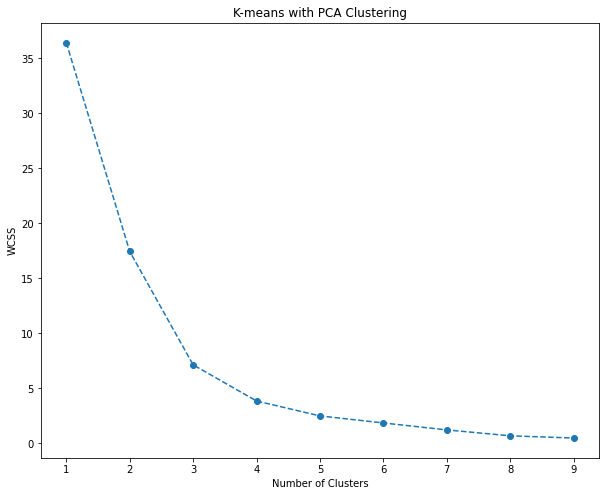

variance:  78.4
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


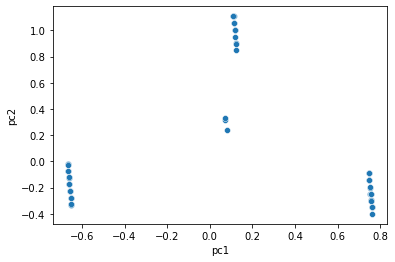

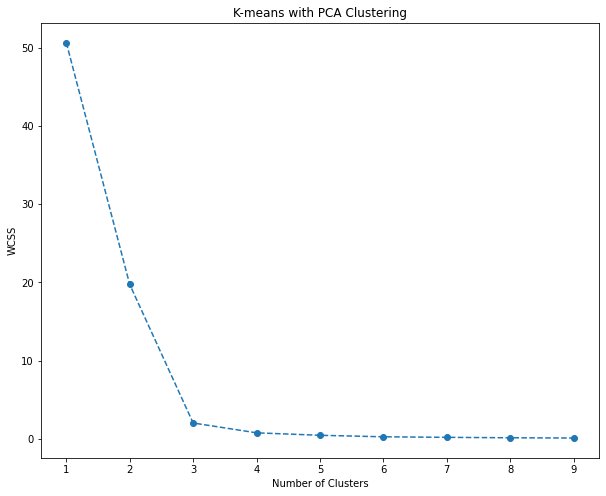

variance:  79.6
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


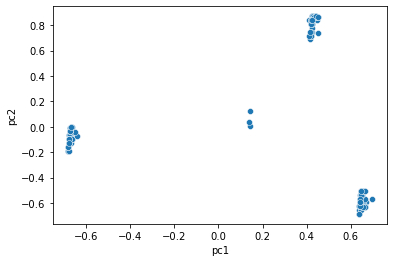

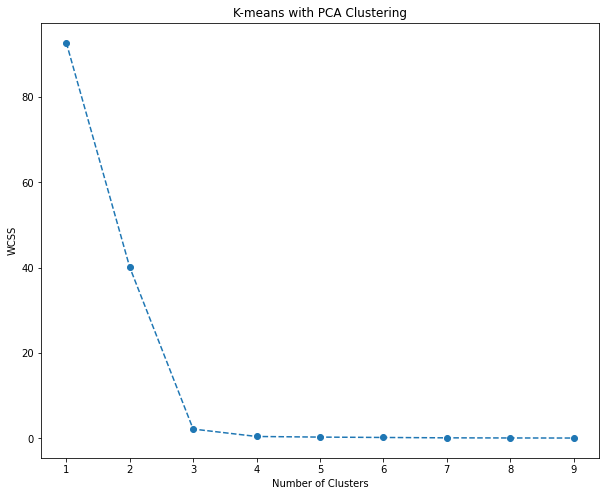

variance:  66.0
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


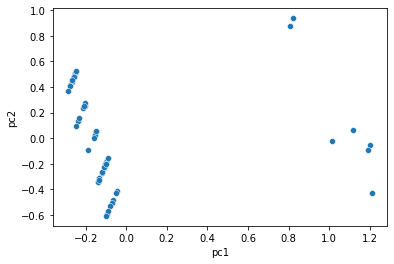

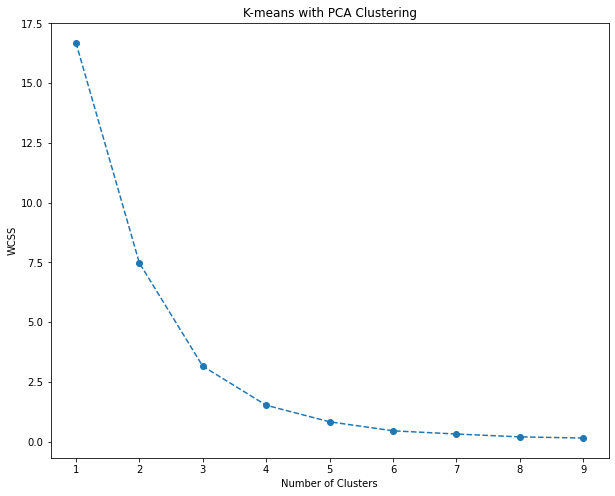

variance:  61.800000000000004
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


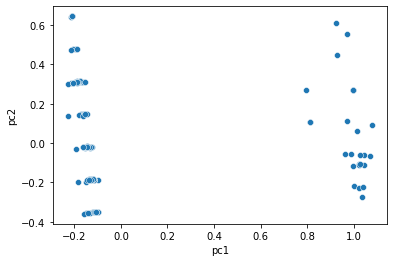

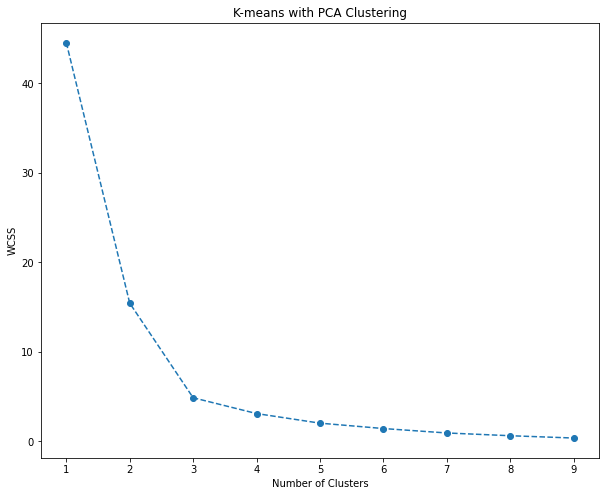

variance:  72.3
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


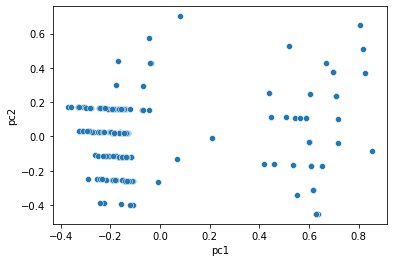

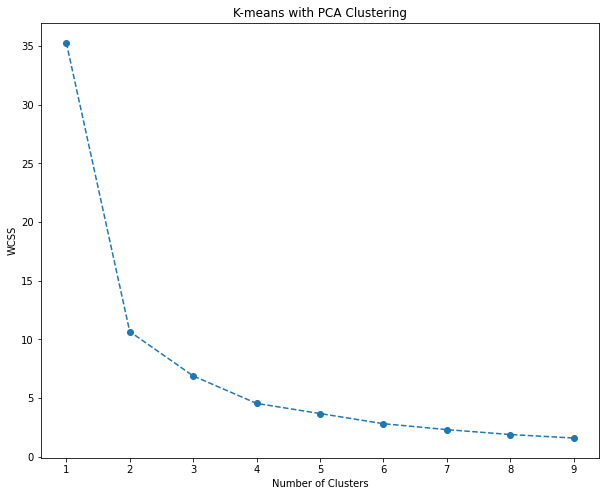

variance:  87.69999999999999
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


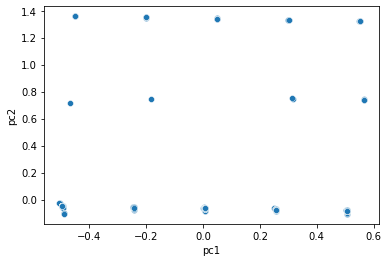

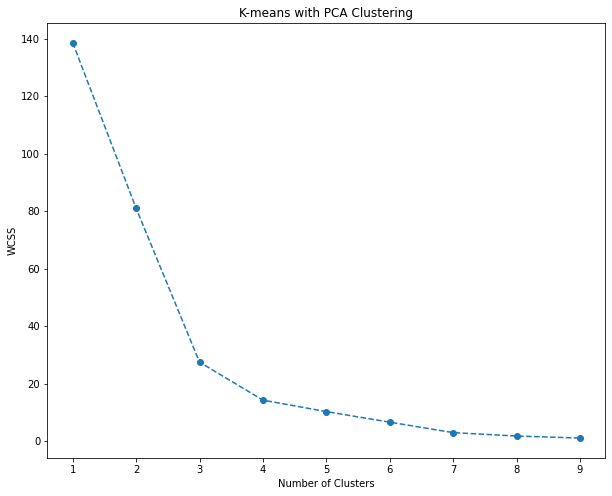

variance:  75.5
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


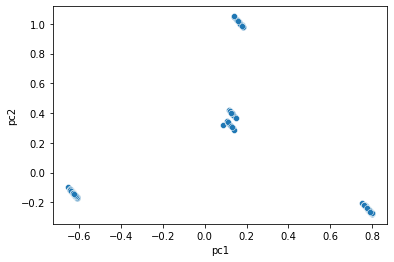

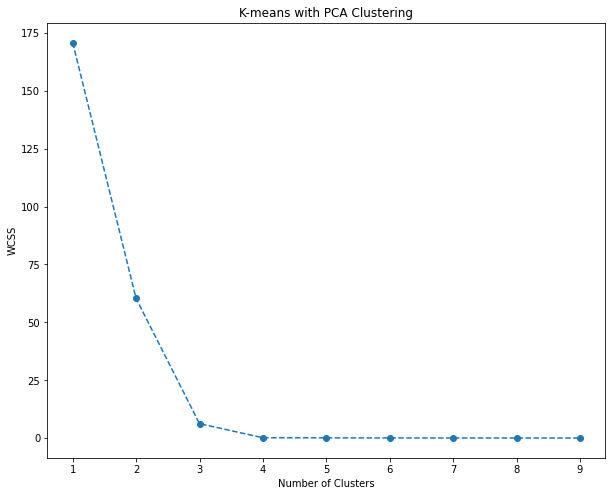

variance:  70.80000000000001
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


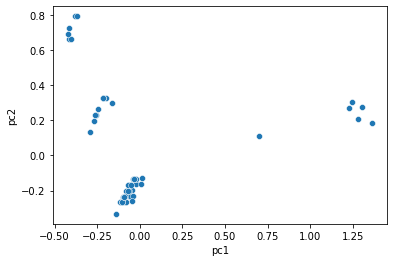

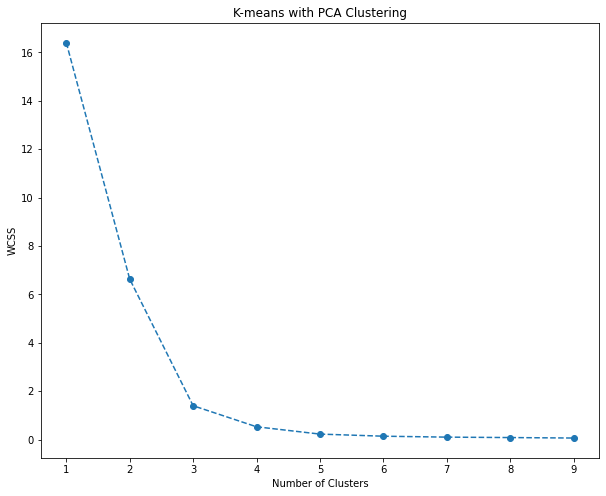

variance:  57.5
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


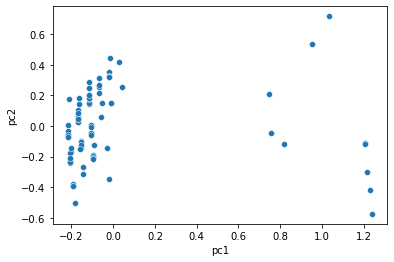

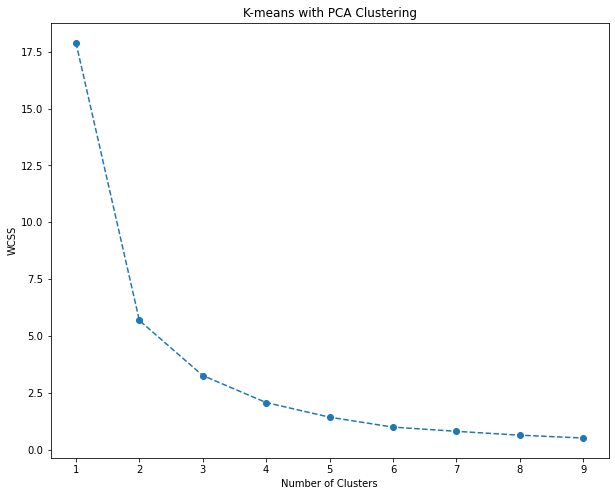

variance:  86.4
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


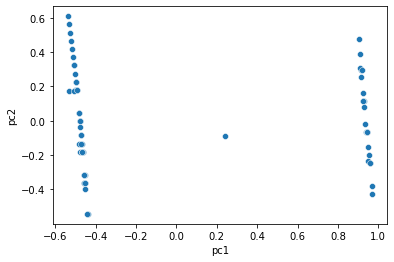

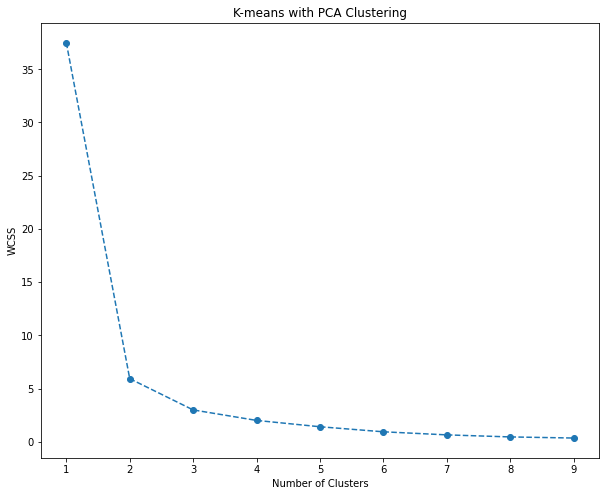

variance:  71.9
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


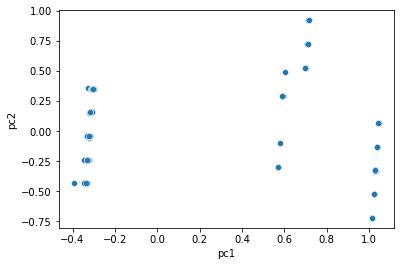

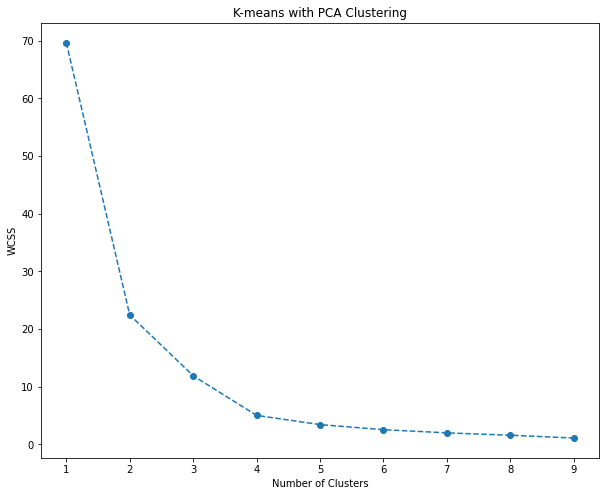

variance:  75.6
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


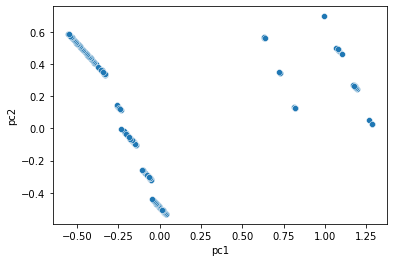

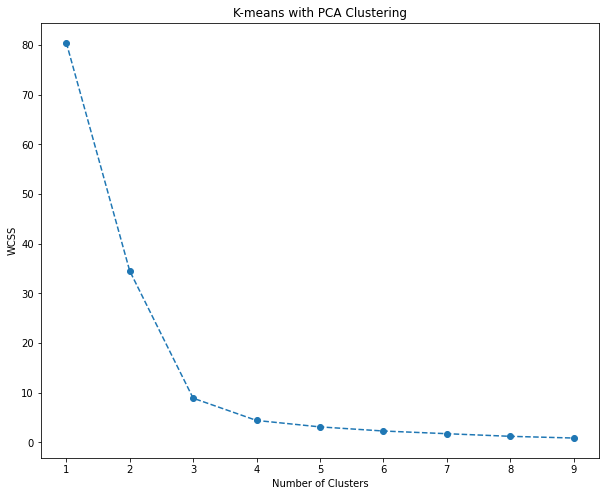

variance:  71.2
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


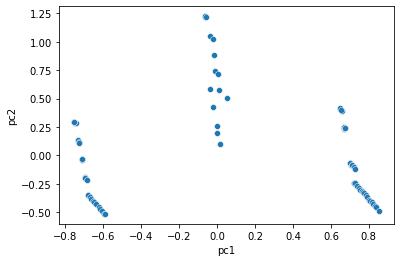

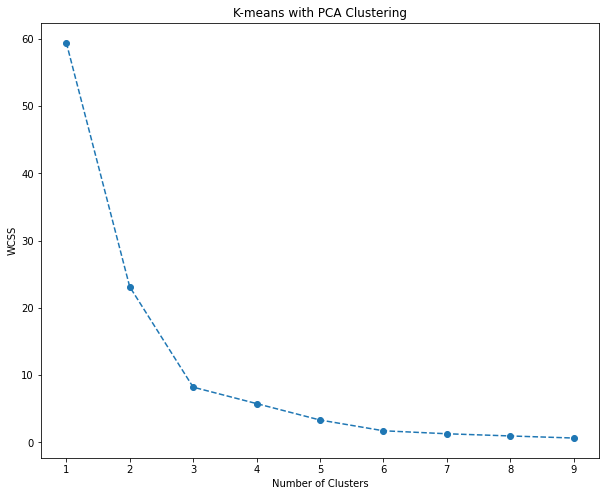

variance:  66.6
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


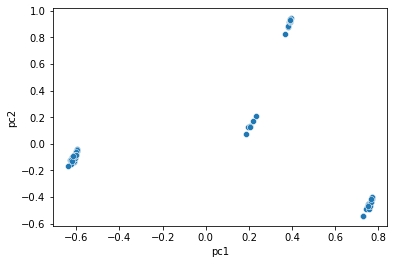

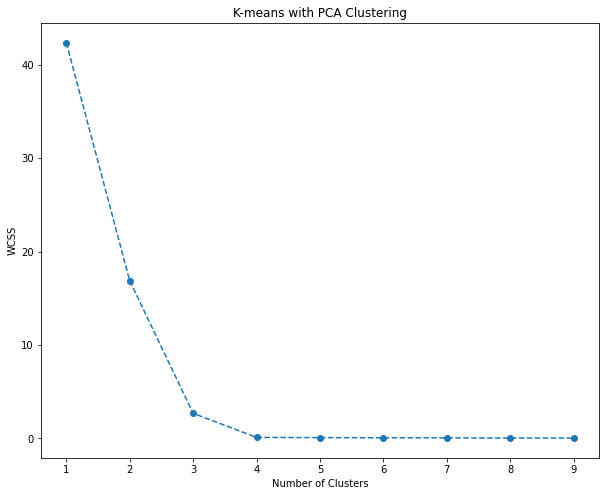

variance:  76.7
**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


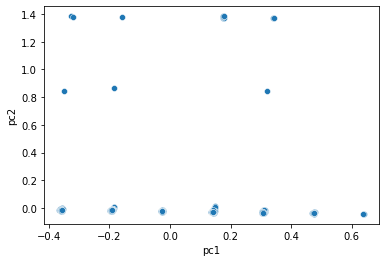

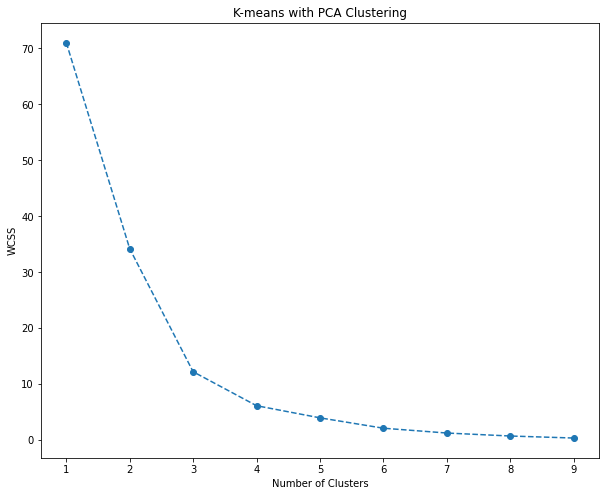

variance:  90.5
**************************************************


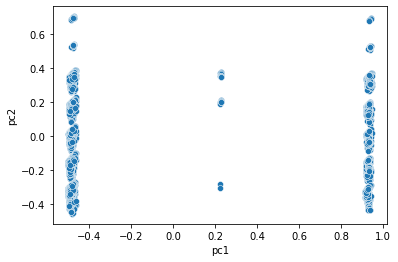

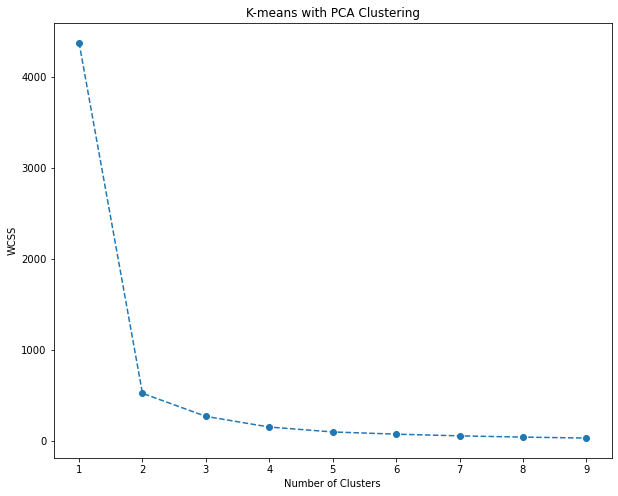

In [68]:
for val in X['trans_cac_desc_1_grouped'].unique():
    groups[val] = {}
    scaler = MinMaxScaler()
    X_group =pd.DataFrame(scaler.fit_transform(X[X['trans_cac_desc_1_grouped']==val].drop(columns='trans_cac_desc_1_grouped')),
                          columns = X.drop(columns='trans_cac_desc_1_grouped').columns)
    
    ## Apply PCA for better visualization of clusters
    pca = PCA(2)
    data_pca = pd.DataFrame(pca.fit_transform(X_group), columns =['pc1','pc2']) 
    
    ## Save objects (in case I need it later)
    groups[val]['scaler'] = scaler
    groups[val]['X_group'] = X_group
    groups[val]['pca'] = pca
    groups[val]['data_pca'] = data_pca
    print('variance: ',np.round(pca.explained_variance_ratio_*100, decimals = 1).sum())
    print('*'*50)
    
    ## Plot dataset w PCA applied
    sns.scatterplot(data=data_pca, x='pc1', y='pc2')
    wcss = []
    
    ## Find number of clusters
    for i in range(1,10):
        kmeans_pca = KMeans(n_clusters = i, init='k-means++', random_state=42)
        kmeans_pca.fit(data_pca)
        wcss.append(kmeans_pca.inertia_)
        
   
    ## Plot summary of number of clusters
    plt.figure(figsize=(10,8))
    plt.plot(range(1,10), wcss, marker ='o', linestyle='--')
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('K-means with PCA Clustering')
    plt.show()
    

__Comments:__
- PCA is helping reducing the number of features (specially for visualization) but for some groups of transactions it is not keeping a good variance of the data

<hr>

**************************************************


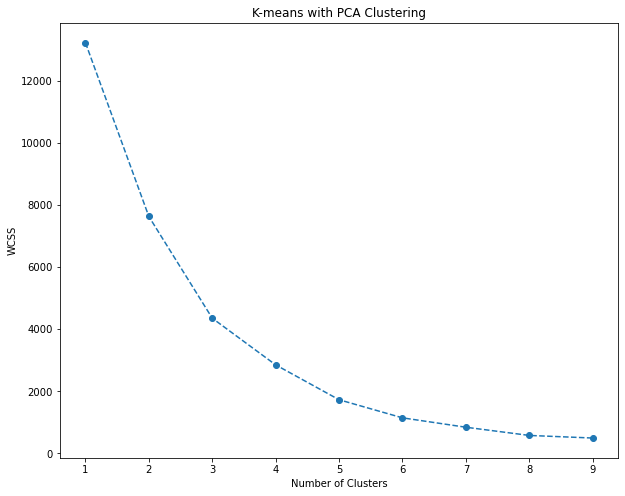

original_gross_amt                                                  \
                     count       mean         std     min      25%     50%   
cluster                                                                      
0.0                 6852.0  54.986090   15.998524  -78.01  45.1150  56.335   
1.0                 5647.0  58.625114   27.834746 -300.00  43.8800  58.700   
2.0                 1732.0  58.467252   19.513870    0.09  46.7675  59.035   
3.0                 2832.0  51.893407  101.839021  -47.98  30.0100  48.870   

                           
             75%      max  
cluster                    
0.0      66.1325    99.50  
1.0      77.2800   818.81  
2.0      71.0250   223.00  
3.0      66.6950  4888.43

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


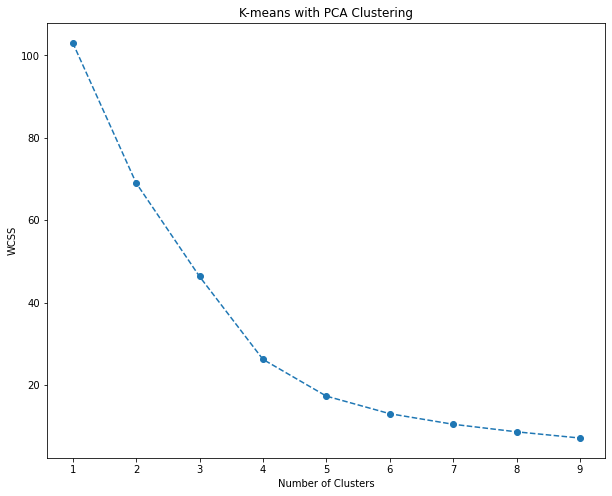

original_gross_amt                                                   \
                     count        mean         std     min      25%     50%   
cluster                                                                       
0.0                   23.0   11.720870   22.688453    6.99   6.9900    6.99   
1.0                   41.0  131.292195  263.211740 -298.80  19.9300   52.92   
2.0                   24.0   77.382500  112.052464    4.00  11.2525   20.00   
3.0                   28.0  299.282857  386.105710    1.04  42.8450  119.50   

                            
              75%      max  
cluster                     
0.0        6.9900   115.80  
1.0      126.0000  1500.00  
2.0      102.8975   339.98  
3.0      391.9375  1500.00

**************************************************


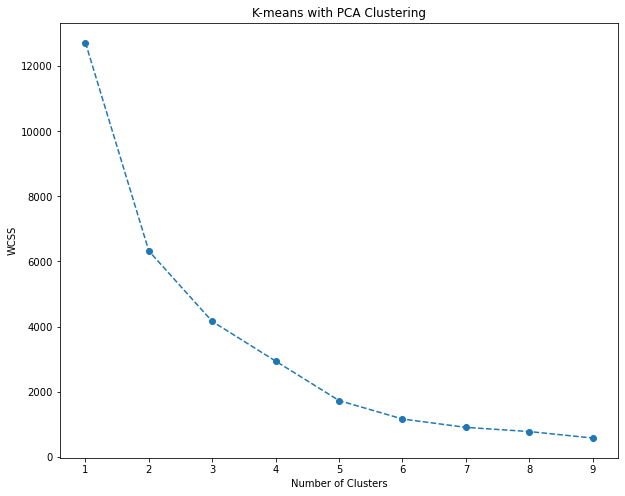

original_gross_amt                                               \
                     count         mean           std      min      25%   
cluster                                                                   
0.0                 2375.0    72.310211    123.623257  -883.20  11.6650   
1.0                22148.0    66.117632    277.823672 -1283.60  11.3000   
2.0                 1331.0  4045.268926  13612.219320 -2775.82  12.3150   
3.0                 2454.0    80.801320    159.793843  -961.62  10.9825   

                                    
            50%      75%       max  
cluster                             
0.0      29.310   81.940   1550.00  
1.0      28.115   72.500  37434.72  
2.0      40.200  161.565  97538.78  
3.0      29.030   80.150   1944.00

**************************************************


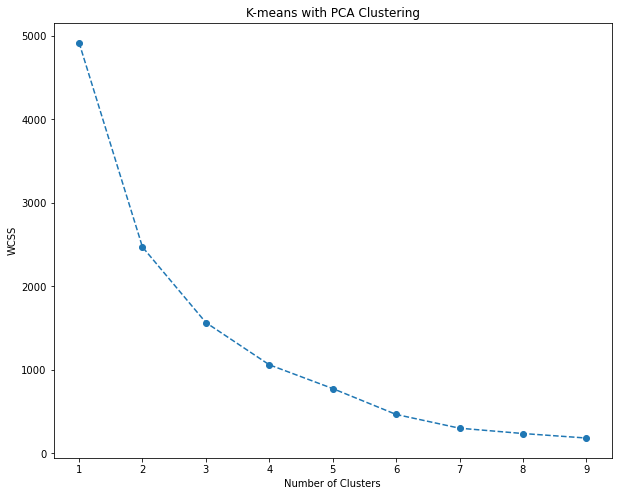

original_gross_amt                                                     \
                     count        mean           std        min    25%    50%   
cluster                                                                         
0.0                 5816.0   83.111869    192.139861   -2875.44  10.81  33.63   
1.0                 1296.0  110.752623    169.690592    -315.05  18.16  42.31   
2.0                  826.0 -715.732203  18745.688909 -486980.09  20.36  60.00   
3.0                  620.0  213.946226    352.970897   -1523.30  20.50  60.00   

                            
              75%      max  
cluster                     
0.0       92.0775   5844.0  
1.0      127.6250   1206.0  
2.0      242.0000  34310.0  
3.0      299.0000   2800.0

**************************************************


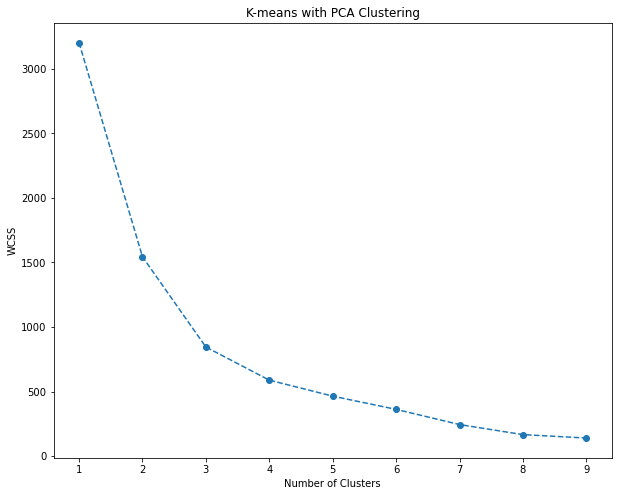

original_gross_amt                                                 \
                     count       mean         std     min      25%    50%   
cluster                                                                     
0.0                 1456.0  67.812466  141.985514 -348.00  11.0375  26.80   
1.0                 2274.0  88.620229  183.556177 -739.98  14.0000  34.99   
2.0                  340.0  70.367441  112.516770  -79.99  14.2975  29.97   
3.0                  435.0  95.542575  146.103918 -499.99  19.9650  49.99   

                            
              75%      max  
cluster                     
0.0       65.1175  1549.00  
1.0       93.5775  3739.99  
2.0       80.7625  1262.94  
3.0      120.9650  1336.00

**************************************************


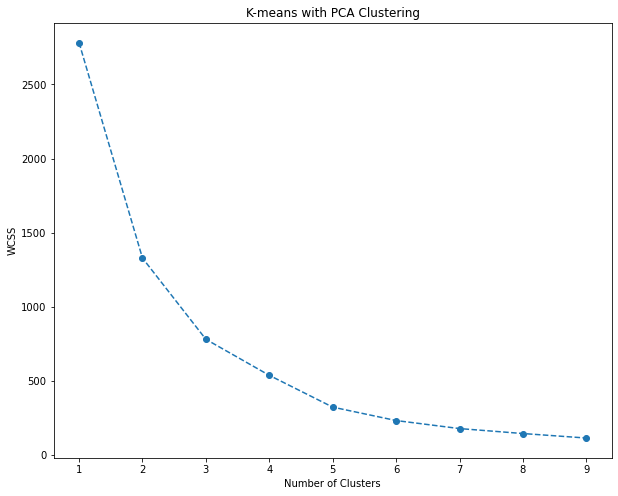

original_gross_amt                                                  \
                     count        mean         std      min    25%     50%   
cluster                                                                      
0.0                 2225.0   66.431483  114.807060  -394.72  13.20  31.500   
1.0                  632.0   93.771297  167.196275  -471.73  15.00  39.985   
2.0                  768.0  114.122813  282.654216 -1998.00  14.99  39.995   
3.0                 2052.0   56.542354  105.195408  -634.74  10.98  25.680   

                            
              75%      max  
cluster                     
0.0       76.4500  1666.98  
1.0       87.9475  1000.00  
2.0      115.1350  3608.70  
3.0       68.2950  1604.40

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


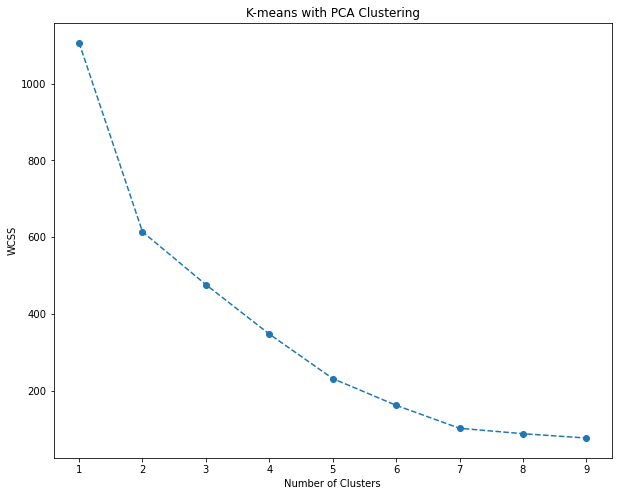

original_gross_amt                                                 \
                     count        mean         std     min     25%    50%   
cluster                                                                     
0.0                 1384.0  109.697421  285.395755 -485.97  19.210  46.31   
1.0                  288.0  179.269965  670.212586 -345.46  22.675  49.99   
2.0                  143.0  107.649301  172.322464 -129.00  15.980  44.98   
3.0                  136.0  114.307574  204.014493 -219.98  14.565  81.40   

                            
              75%      max  
cluster                     
0.0      119.2000  8539.25  
1.0      210.3675  9474.00  
2.0      131.0700  1356.12  
3.0      160.5925  1815.00

**************************************************


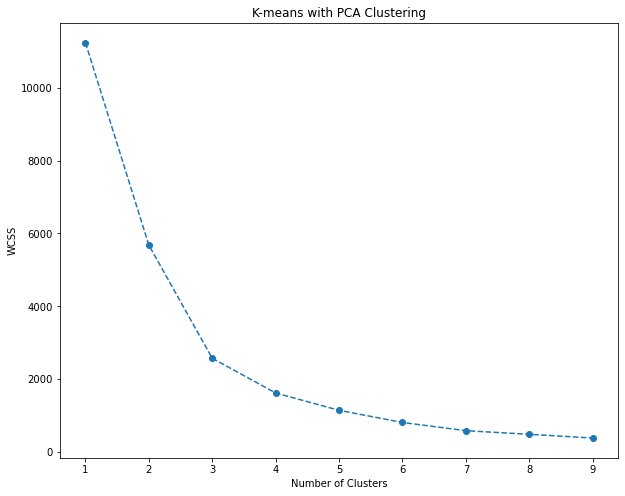

original_gross_amt                                              \
                     count       mean        std    min    25%     50%   
cluster                                                                  
0.0                 2985.0  17.306415  28.144861  -95.2   4.70   7.640   
1.0                 8196.0  50.206227  62.111825 -379.0  11.00  36.895   
2.0                 3734.0  44.986909  64.405738  -46.2  10.00  21.085   
3.0                  790.0  26.725063  73.576962 -307.2   4.91   8.970   

                           
             75%      max  
cluster                    
0.0      16.9900   452.55  
1.0      68.6550  1249.36  
2.0      51.1575   632.16  
3.0      19.1500   936.90

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=13.
  warnings.warn(


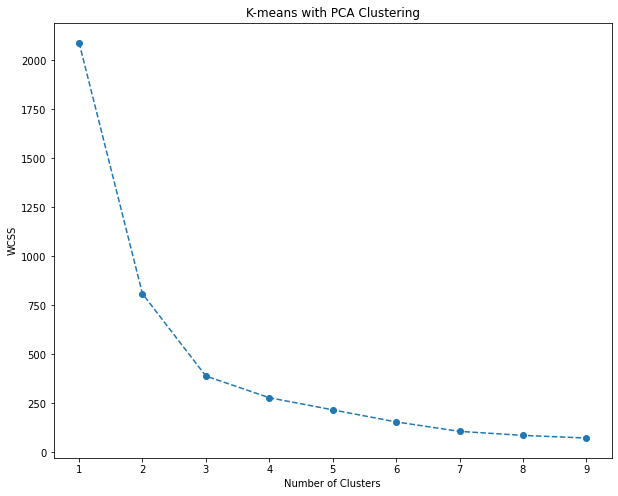

original_gross_amt                                                  \
                     count       mean         std      min      25%    50%   
cluster                                                                      
0.0                  116.0  88.372328  110.460680   -11.99  23.6525  44.04   
1.0                 1521.0  77.158665  113.390946  -214.61  19.9000  44.22   
2.0                 1265.0  85.552474  144.148806 -1000.00  17.8200  43.20   
3.0                  243.0  55.365021   81.450993  -215.64  12.4100  29.25   

                            
              75%      max  
cluster                     
0.0      111.2425   579.84  
1.0       87.1100  1598.00  
2.0      100.7600  2177.17  
3.0       61.2650   564.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


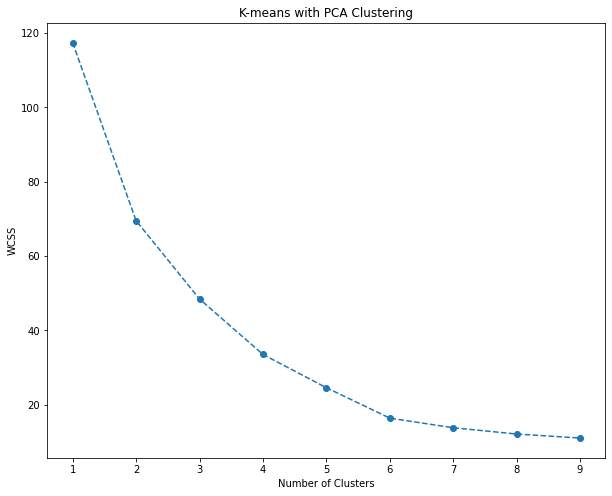

original_gross_amt                                                 \
                     count        mean         std    min    25%      50%   
cluster                                                                     
0.0                   85.0  116.318588  201.075516 -145.5   35.0  100.000   
1.0                   24.0  131.202500   39.401553   15.0  145.5  145.500   
2.0                   21.0  214.183810  294.214567   16.0  145.5  145.500   
3.0                   18.0   74.913889   56.973729  -25.0   35.0   57.475   

                          
             75%     max  
cluster                   
0.0      145.500  1800.0  
1.0      145.500   147.0  
2.0      147.000  1476.0  
3.0      138.925   147.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=15.
  warnings.warn(


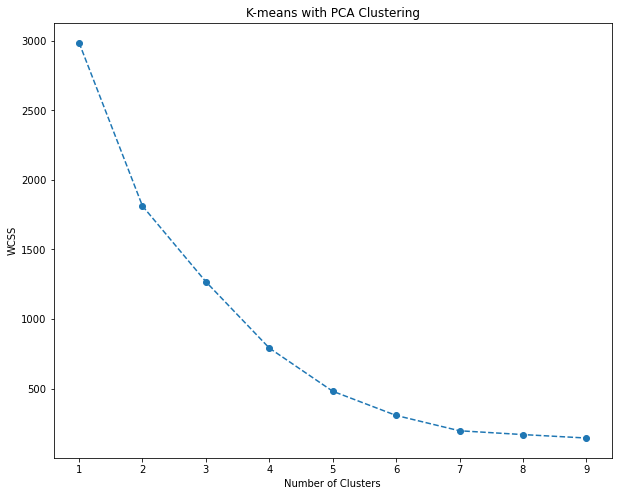

original_gross_amt                                                    \
                     count        mean          std      min      25%    50%   
cluster                                                                        
0.0                 1799.0  104.048349   376.922566 -1995.05   8.4500  49.50   
1.0                  588.0  294.628912  2204.316940  -200.00  22.6375  54.89   
2.0                  857.0  288.169697  3651.294088  -824.55   6.7500  20.28   
3.0                  539.0   82.611614   200.052520  -115.13   9.8250  23.97   

                            
            75%        max  
cluster                     
0.0       94.00    7923.00  
1.0      149.25   51348.00  
2.0      172.00  106289.88  
3.0       66.60    2032.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


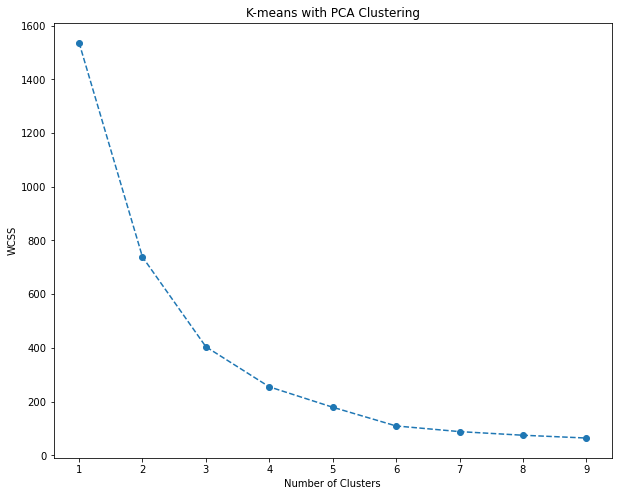

original_gross_amt                                               \
                     count        mean         std    min    25%    50%   
cluster                                                                   
0.0                  240.0   85.407750   89.860929    1.2  13.14  61.00   
1.0                 1399.0   80.848506  114.575130 -150.0   7.25  36.72   
2.0                  545.0   41.763266  108.728820  -79.0   4.25  10.19   
3.0                  166.0  140.233313  410.144638    1.0   7.00  11.85   

                          
            75%      max  
cluster                   
0.0      124.00   450.00  
1.0      117.00  1074.50  
2.0       22.00  1531.37  
3.0       52.89  3102.35

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=13.
  warnings.warn(


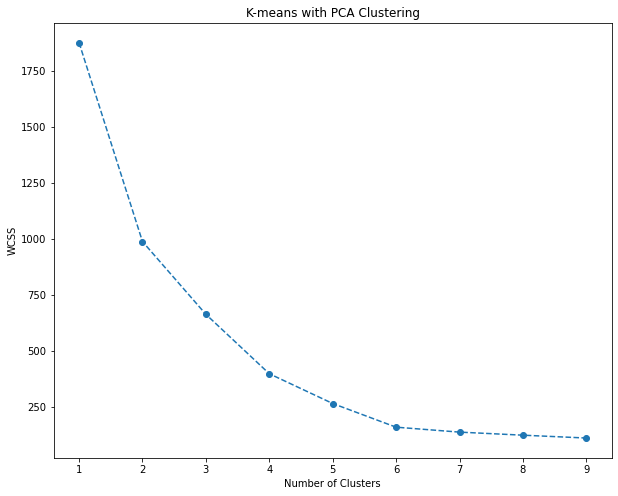

original_gross_amt                                                  \
                     count        mean         std     min      25%    50%   
cluster                                                                      
0.0                 2095.0   90.264368  153.156333 -451.20  15.0750  40.80   
1.0                  361.0   72.794571  108.181145 -486.79  16.9900  37.65   
2.0                  373.0  117.252038  329.969752 -229.80  15.0000  28.80   
3.0                  296.0   78.773750  101.050639 -128.40  17.7325  36.41   

                           
             75%      max  
cluster                    
0.0      104.940  2856.00  
1.0       82.940   814.80  
2.0       64.460  3060.00  
3.0      105.255   621.35

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_common._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 2, in where
KeyboardInterrupt: 


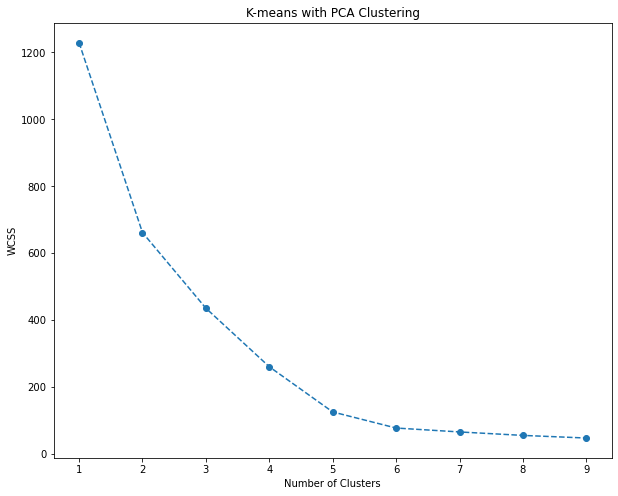

original_gross_amt                                                   \
                     count       mean         std    min    25%  50%    75%   
cluster                                                                       
0.0                  259.0   8.276757   12.314687  -21.0  4.000  6.0   9.00   
1.0                 1139.0   9.806576   15.423725  -35.0  3.800  6.3  10.25   
2.0                  202.0  45.629010  111.583009 -200.0  4.925  8.7  35.00   
3.0                  273.0   9.562967   22.444088    0.1  1.900  4.1   6.50   

                 
            max  
cluster          
0.0      121.75  
1.0      304.97  
2.0      949.50  
3.0      151.50

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


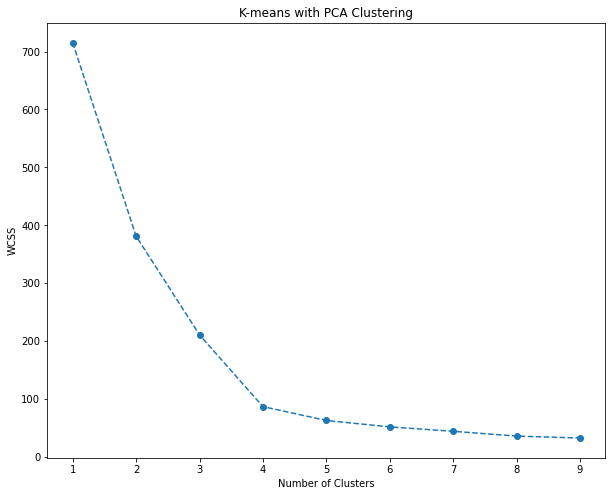

original_gross_amt                                                    \
                     count        mean         std      min      25%     50%   
cluster                                                                        
0.0                  527.0  129.084573  255.756511  -419.27  35.0000   75.00   
1.0                  186.0  163.987151  184.946054   -50.00  42.5000  119.16   
2.0                  179.0  172.525028  252.826140 -1834.92  78.0000  151.00   
3.0                  106.0  222.893019  223.652843   -94.80  89.1975  220.00   

                        
           75%     max  
cluster                 
0.0      157.7  4715.0  
1.0      222.0  1710.0  
2.0      246.0  1614.0  
3.0      220.0  1500.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


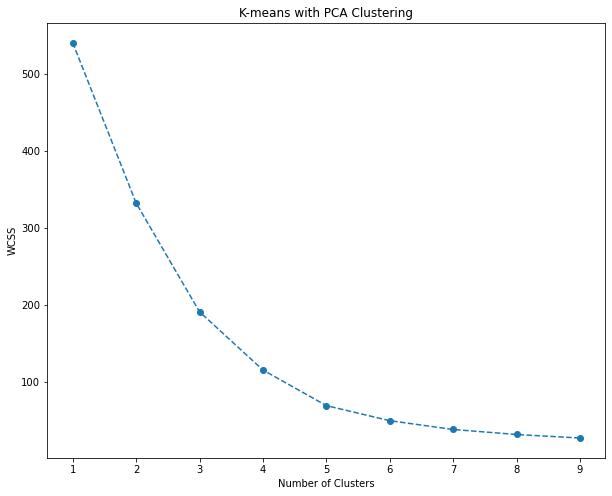

original_gross_amt                                                  \
                     count        mean         std     min      25%    50%   
cluster                                                                      
0.0                  105.0  127.835619  201.448222  -85.00  27.9500  60.00   
1.0                  206.0   62.884175   79.782268  -28.93  23.3625  44.91   
2.0                  243.0   14.873786   53.503464  -47.00   4.4400   6.65   
3.0                   94.0  107.701489  165.665541 -198.00  21.0000  29.75   

                           
             75%      max  
cluster                    
0.0      119.000  1264.33  
1.0       69.375   695.85  
2.0        9.855   789.60  
3.0      157.300   924.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


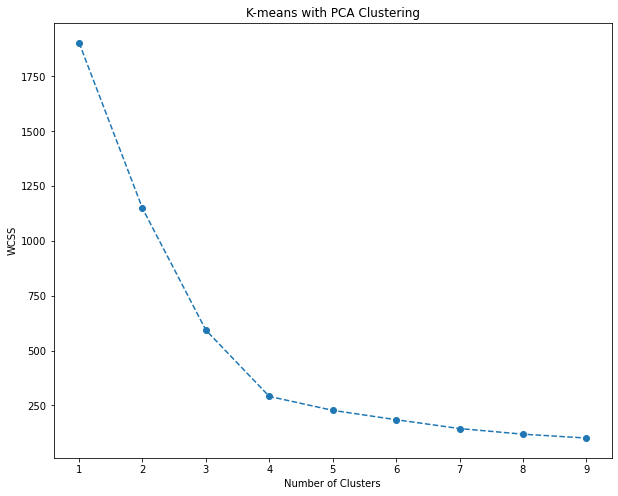

original_gross_amt                                                     \
                     count         mean          std     min       25%    50%   
cluster                                                                         
0.0                  298.0   253.488859   895.034081  -18.00   54.2525  145.5   
1.0                  803.0   133.644732   172.599460 -498.37   35.0000   90.0   
2.0                  408.0  2355.055760  3510.654300 -300.00  100.6250  750.0   
3.0                  853.0    33.818218    89.987683 -215.89   15.0000   15.0   

                            
             75%       max  
cluster                     
0.0       161.47  12007.00  
1.0       158.74   1410.67  
2.0      3590.25  15000.00  
3.0        25.00   1579.98

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


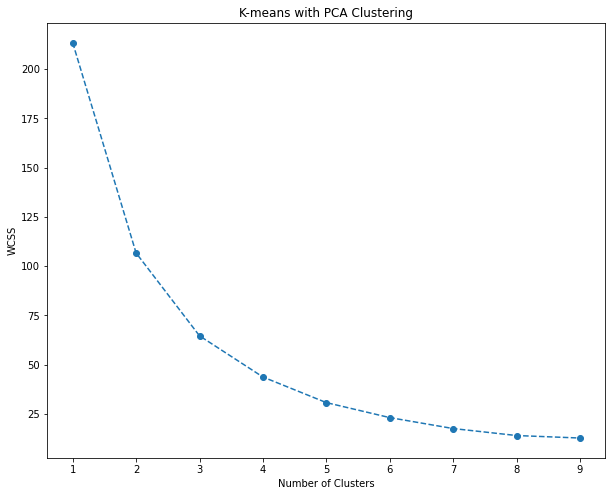

original_gross_amt                                                \
                     count        mean         std    min   25%      50%   
cluster                                                                    
0.0                  204.0   90.073725  101.871565 -192.0  35.0   60.245   
1.0                   69.0  128.800290  198.916473 -779.0  49.0   49.000   
2.0                   26.0  113.872308  142.686849   35.0  35.0   50.000   
3.0                   28.0  207.844643  237.800046   19.0  22.8  153.000   

                            
              75%      max  
cluster                     
0.0      131.3975   864.00  
1.0      179.0000   779.00  
2.0      146.6250   707.94  
3.0      260.0000  1100.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


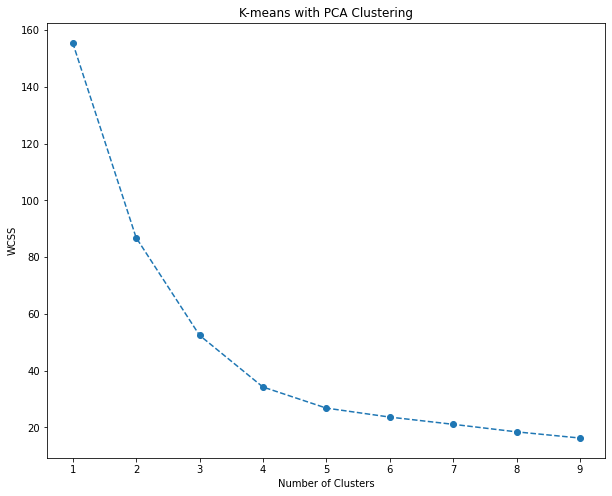

original_gross_amt                                                    \
                     count         mean         std      min     25%     50%   
cluster                                                                        
0.0                  112.0   141.482143  158.223046  -287.22    50.0   155.0   
1.0                   38.0   117.135526  162.560519     3.00     3.0     3.0   
2.0                   82.0  2047.195122   97.642259  1200.00  2055.0  2055.0   
3.0                   68.0   133.992647   89.995810    13.00    50.0   155.0   

                          
            75%      max  
cluster                   
0.0       155.0  1381.30  
1.0       205.0   713.15  
2.0      2055.0  2270.00  
3.0       155.0   600.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


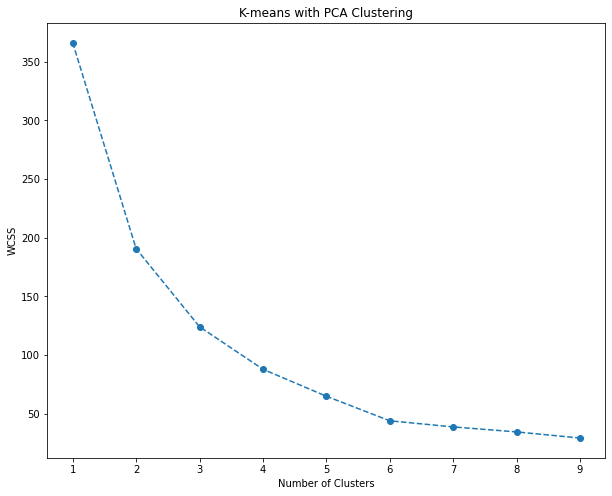

original_gross_amt                                                 \
                     count       mean         std     min     25%     50%   
cluster                                                                     
0.0                  439.0  68.646059  104.292282 -104.99  12.275  31.730   
1.0                   87.0  59.608621   83.625039  -32.98  12.935  27.980   
2.0                   58.0  54.531379   70.251760  -34.01  10.000  26.975   
3.0                   41.0  42.913171   41.226799  -58.52  13.280  32.880   

                          
             75%     max  
cluster                   
0.0      79.8950  634.80  
1.0      61.2250  364.68  
2.0      63.2625  330.00  
3.0      66.0000  142.36

**************************************************


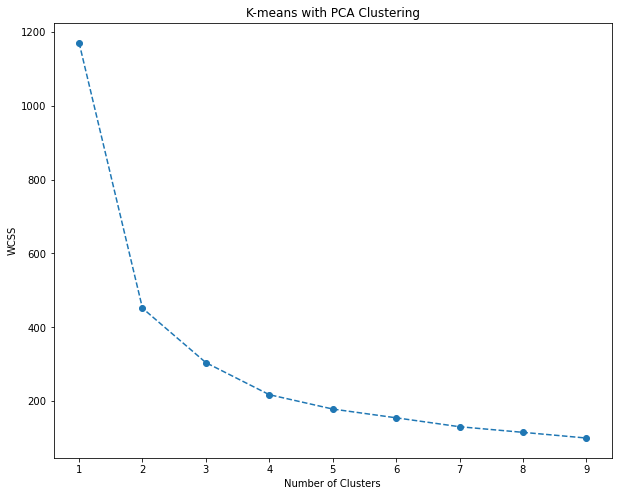

original_gross_amt                                                 \
                     count        mean         std     min    25%     50%   
cluster                                                                     
0.0                 2044.0   62.488963  106.584854 -300.00   5.29   14.81   
1.0                  387.0  122.087313  311.592131  -89.75   7.50   28.55   
2.0                 2513.0   67.775714  115.239459 -432.00   5.63   13.95   
3.0                   73.0  152.485890  174.714391 -102.00  50.00  105.00   

                           
             75%      max  
cluster                    
0.0       98.005  2433.35  
1.0      127.000  3195.00  
2.0       99.000  1934.00  
3.0      179.400   778.80

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_common._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 2, in where
KeyboardInterrupt: 


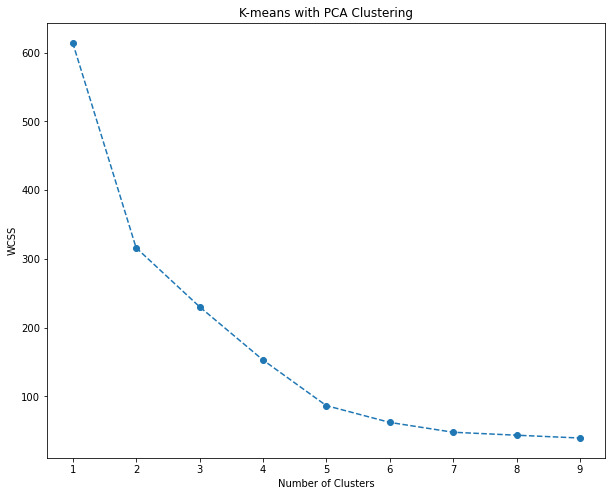

original_gross_amt                                                    \
                     count        mean         std     min      25%      50%   
cluster                                                                        
0.0                 1505.0  123.887528  145.672972 -102.12  29.0000   92.310   
1.0                   90.0  152.323222  140.021863    4.14  67.0700  106.715   
2.0                   88.0  134.001136  119.443672   10.00  49.9900   86.715   
3.0                   92.0   72.002065   91.326158  -51.78  19.9875   49.990   

                            
              75%      max  
cluster                     
0.0      162.9100  1531.06  
1.0      200.8300   905.70  
2.0      194.0700   574.08  
3.0       98.7425   680.04

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


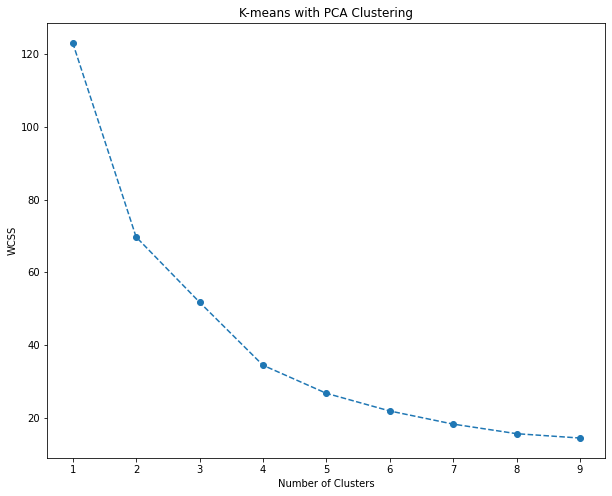

original_gross_amt                                                   \
                     count         mean          std    min     25%     50%   
cluster                                                                       
0.0                  217.0   677.604608  4056.319274 -683.2   17.60  205.08   
1.0                   21.0   469.141905   879.553267    5.4   99.00  246.26   
2.0                   21.0    26.822857    55.803760    2.4    3.84    5.04   
3.0                  146.0  1807.210068  7423.855523   -1.0  135.02  341.05   

                            
             75%       max  
cluster                     
0.0      359.100  58822.00  
1.0      381.000   4100.00  
2.0        7.660    233.35  
3.0      883.975  62967.00

**************************************************


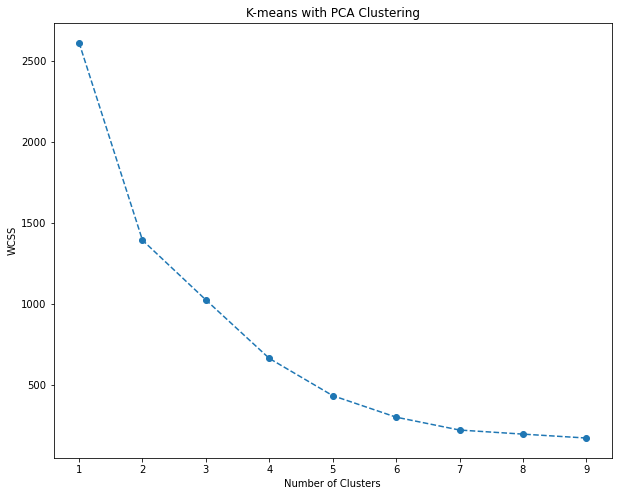

original_gross_amt                                                 \
                     count       mean         std     min     25%     50%   
cluster                                                                     
0.0                 3689.0  51.475316   90.584620 -271.33   8.430  21.990   
1.0                  458.0  48.319694   92.299202 -159.49   8.950  21.615   
2.0                 3061.0  49.485237   92.727607 -399.00   8.230  21.000   
3.0                  619.0  58.838708  132.920398 -437.89  10.915  20.640   

                           
             75%      max  
cluster                    
0.0      53.6200  1208.78  
1.0      49.8475   883.20  
2.0      51.3200  1597.45  
3.0      49.4500  1230.12

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


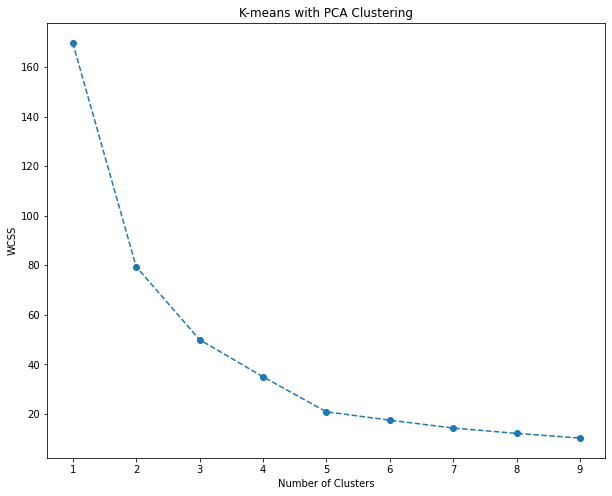

original_gross_amt                                                 \
                     count       mean         std    min      25%     50%   
cluster                                                                     
0.0                  129.0  83.732016  132.525485 -94.64  12.7500  35.990   
1.0                   33.0  86.652424   92.140289   5.50  19.9600  58.500   
2.0                   46.0  73.413478  116.356878 -44.45  10.0000  20.025   
3.0                  186.0  67.133387  101.139634 -94.39  13.2225  33.380   

                          
             75%     max  
cluster                   
0.0      91.3300  888.00  
1.0      97.9200  350.73  
2.0      80.9325  531.97  
3.0      79.0325  861.39

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


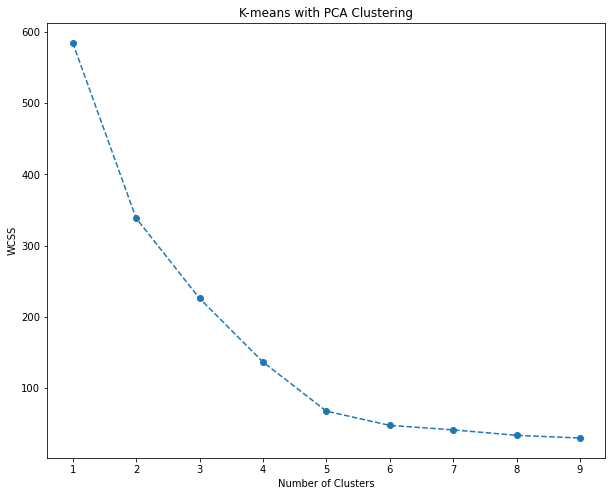

original_gross_amt                                                   \
                     count        mean         std      min     25%     50%   
cluster                                                                       
0.0                  407.0  131.982334  223.788713  -200.00  22.500   55.10   
1.0                  125.0  593.856880  826.169418 -1379.60  59.950  250.00   
2.0                   99.0  130.054949  195.939927     1.98  25.575   49.99   
3.0                  151.0   67.192252  205.290372 -1857.11  19.950   35.00   

                           
             75%      max  
cluster                    
0.0      155.250  1695.91  
1.0      640.250  3185.00  
2.0      164.490  1299.00  
3.0       63.825  1015.40

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


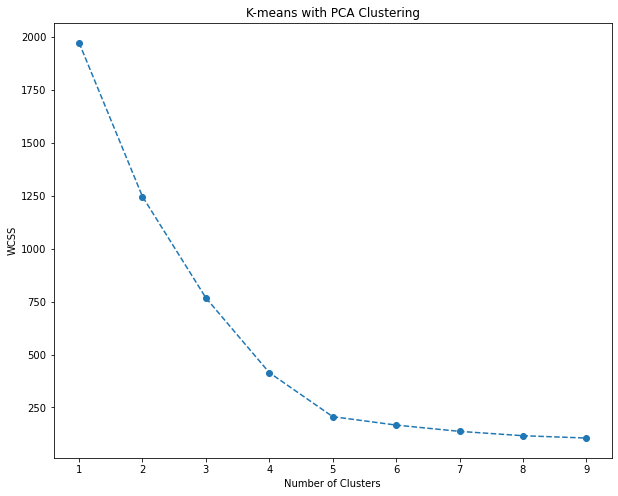

original_gross_amt                                                  \
                     count       mean         std     min      25%     50%   
cluster                                                                      
0.0                  544.0  68.502206  125.998825  -87.80   9.5850  36.200   
1.0                  908.0  98.864009  111.813027 -389.00  34.9975  68.095   
2.0                  492.0  54.069309   94.812104  -52.70   9.0000  32.425   
3.0                  445.0  66.967955  113.419455  -36.35   9.0000  17.800   

                           
              75%     max  
cluster                    
0.0       76.7750   693.6  
1.0      132.1175  1100.0  
2.0       77.4350  1288.0  
3.0       79.6000   795.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


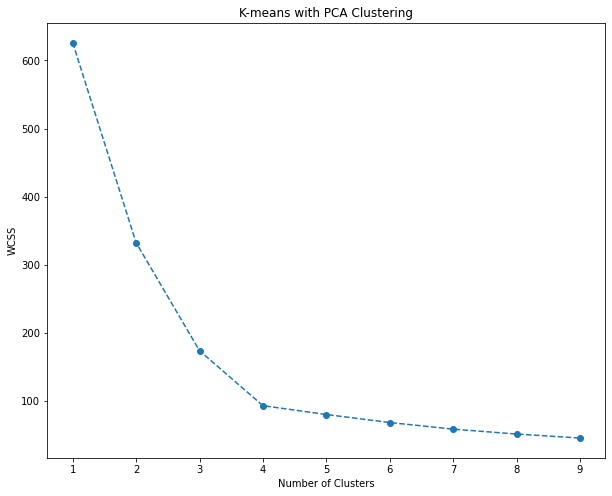

original_gross_amt                                                    \
                     count        mean          std      min     25%     50%   
cluster                                                                        
0.0                  271.0  187.245978   147.425244  -244.47  90.495  162.69   
1.0                  372.0    6.871210     9.285014     1.95   5.500    5.50   
2.0                  100.0  901.522600  5131.821259  -333.00  30.750  120.98   
3.0                   78.0   84.441282   227.114292 -1296.50  29.850   61.00   

                             
              75%       max  
cluster                      
0.0      267.1950    906.38  
1.0        5.5000    134.97  
2.0      360.9625  51200.00  
3.0      102.0000   1029.65

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


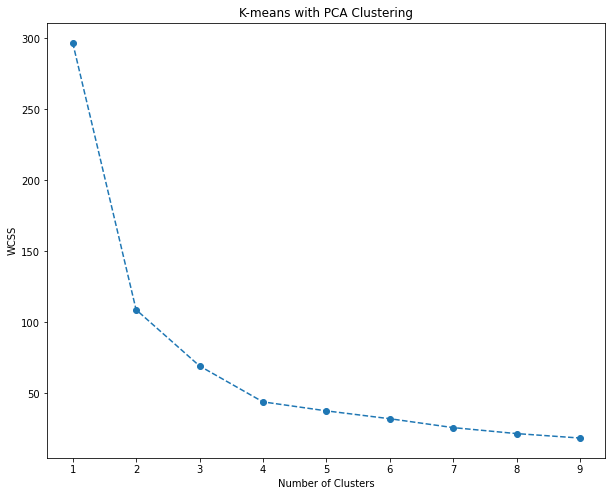

original_gross_amt                                             \
                     count         mean           std      min    25%   
cluster                                                                 
0.0                  257.0  2141.897549  19089.760001 -1330.59  55.07   
1.0                  113.0   518.699027    724.268616  -156.00  69.32   
2.0                   29.0   167.106897    235.915438  -425.12  29.00   
3.0                  292.0   375.356781    995.099827 -1023.83  74.87   

                                       
             50%       75%        max  
cluster                                
0.0      184.440  445.0000  280102.23  
1.0      240.000  720.0000    4496.00  
2.0      178.550  270.0000     626.60  
3.0      160.055  363.0575   10757.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


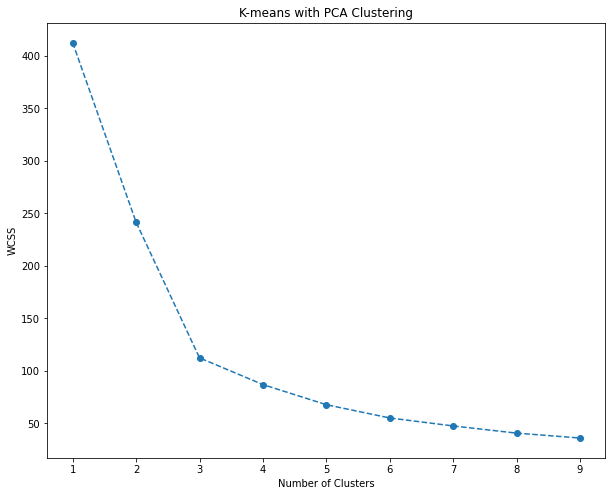

original_gross_amt                                                  \
                     count       mean         std     min      25%     50%   
cluster                                                                      
0.0                  577.0  42.831040   68.227518 -219.99  10.0000  22.000   
1.0                  816.0  43.609877  122.630481 -203.94   9.4975  21.375   
2.0                  101.0  43.766634   47.283631   -1.99  13.0000  26.680   
3.0                  356.0  33.056180   49.496856  -45.00  10.0000  19.150   

                           
             75%      max  
cluster                    
0.0      46.4100   564.00  
1.0      44.9725  2455.20  
2.0      50.0000   290.45  
3.0      41.2350   490.56

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


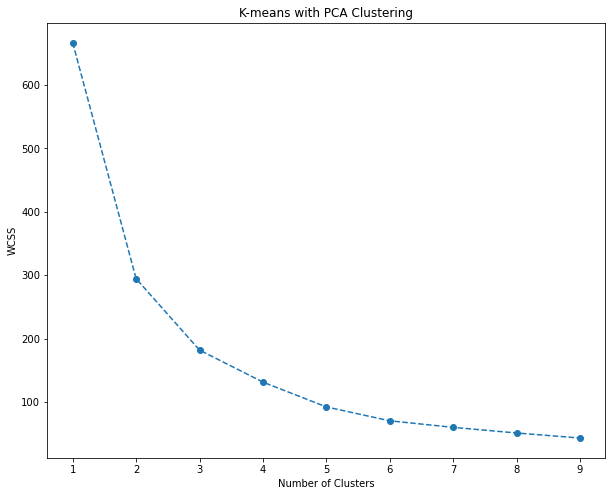

original_gross_amt                                               \
                     count        mean         std    min    25%    50%   
cluster                                                                   
0.0                  223.0  130.157713  137.878958    2.8  35.00  167.5   
1.0                  934.0  139.475771  239.462692 -115.0   3.00   55.0   
2.0                   57.0  135.758070  342.565524  -30.0  10.13   30.0   
3.0                   72.0   56.187083  120.957502    2.4   9.00   13.0   

                         
           75%      max  
cluster                  
0.0      167.5  1389.68  
1.0      227.5  2000.00  
2.0      199.0  2325.00  
3.0       35.0   735.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


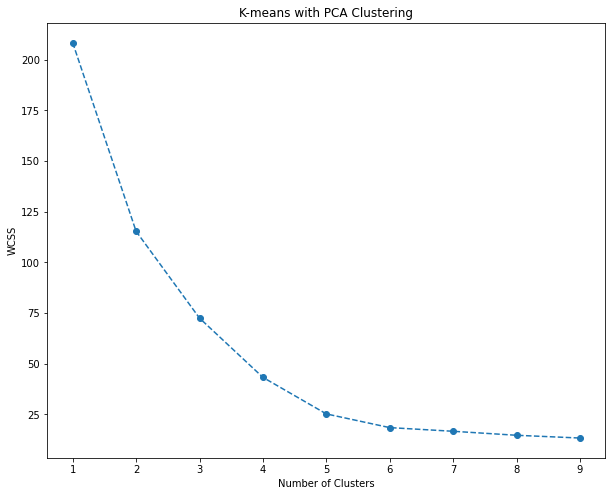

original_gross_amt                                                   \
                     count        mean         std     min     25%      50%   
cluster                                                                       
0.0                   34.0  106.755588  141.412925   -7.19  36.375   65.640   
1.0                  162.0  128.275432  156.598066 -450.00  29.940   66.955   
2.0                   53.0  238.555849  197.642727    6.95  76.800  213.860   
3.0                   40.0  187.798000  210.670829  -15.59  24.660   60.000   

                          
             75%     max  
cluster                   
0.0      113.400  720.00  
1.0      175.235  726.89  
2.0      342.000  756.00  
3.0      360.000  720.60

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


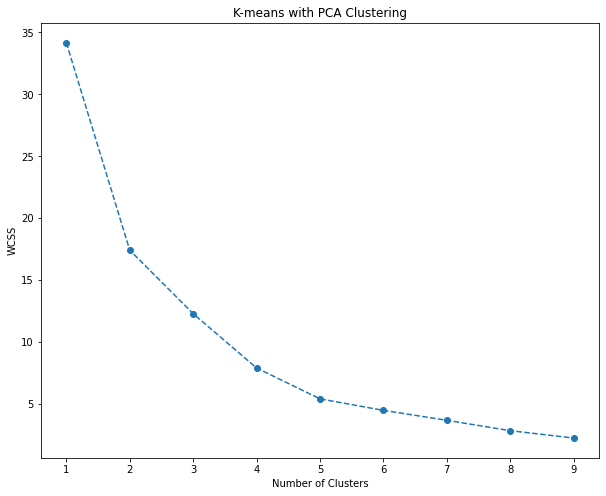

original_gross_amt                                                 \
                     count        mean         std    min    25%      50%   
cluster                                                                     
0.0                    5.0  166.848000  182.282714  27.05  52.80   67.790   
1.0                   34.0  141.944706  163.716038   2.97  33.57   74.565   
2.0                    8.0  359.633750  434.208626   9.00  16.25  152.880   
3.0                   61.0  151.770492  316.148273 -46.00  20.90   51.940   

                           
              75%     max  
cluster                    
0.0      224.4000   462.2  
1.0      170.1750   744.0  
2.0      649.9825  1000.0  
3.0      144.0000  2310.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


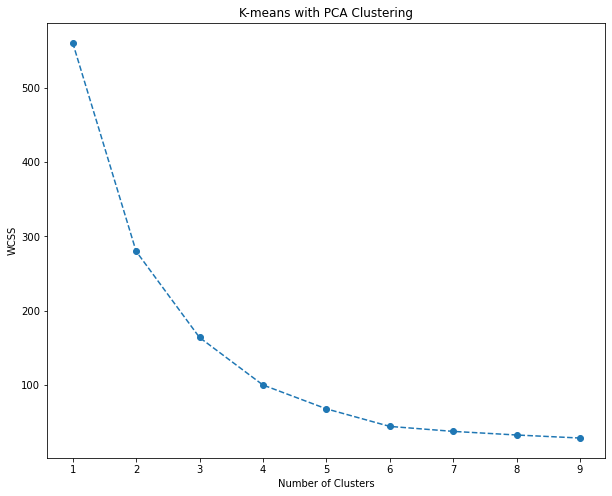

original_gross_amt                                                   \
                     count        mean         std    min      25%      50%   
cluster                                                                       
0.0                  602.0   67.502093  116.463084 -352.0  10.9800   25.000   
1.0                  136.0  262.107426  390.103582 -187.0  41.2375  112.875   
2.0                  120.0  131.690500  327.516860    3.0   3.0000    6.000   
3.0                   66.0  196.883636  647.547852    3.0   3.1250   17.500   

                            
              75%      max  
cluster                     
0.0       73.4550  1006.25  
1.0      347.2500  2366.00  
2.0       91.8425  2398.95  
3.0      104.4000  4800.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


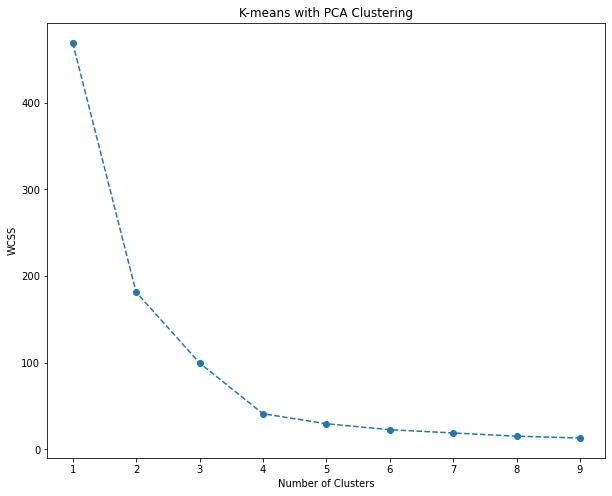

original_gross_amt                                                   \
                     count        mean         std     min      25%     50%   
cluster                                                                       
0.0                  845.0  231.354663  339.361233 -406.80  49.6000  135.80   
1.0                   56.0   78.738571  111.577007  -38.90  11.8475   35.45   
2.0                  150.0  146.935533  156.393287 -114.16  28.1125   85.00   
3.0                  546.0  239.069707  391.908210  -77.95  44.1050  121.50   

                           
              75%     max  
cluster                    
0.0      300.0000  3951.5  
1.0       86.7000   459.0  
2.0      239.8125   620.0  
3.0      300.0000  5625.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


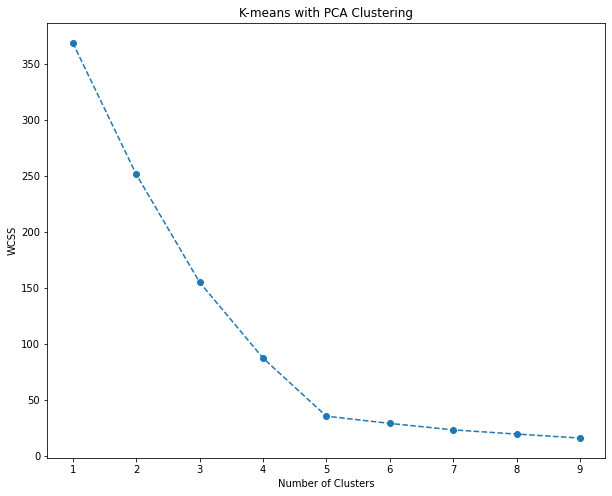

original_gross_amt                                                 \
                     count        mean         std    min      25%    50%   
cluster                                                                     
0.0                  115.0   55.460783  122.231132 -51.00   8.9000  17.68   
1.0                  106.0  133.611415  820.749813   3.25   9.6425  16.50   
2.0                  132.0   17.136818   33.413773 -50.00   7.0400   8.80   
3.0                   79.0   25.099494   34.807610   3.32  10.1500  15.20   

                        
           75%     max  
cluster                 
0.0      37.50   885.0  
1.0      51.69  8460.0  
2.0      13.00   309.0  
3.0      23.70   200.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


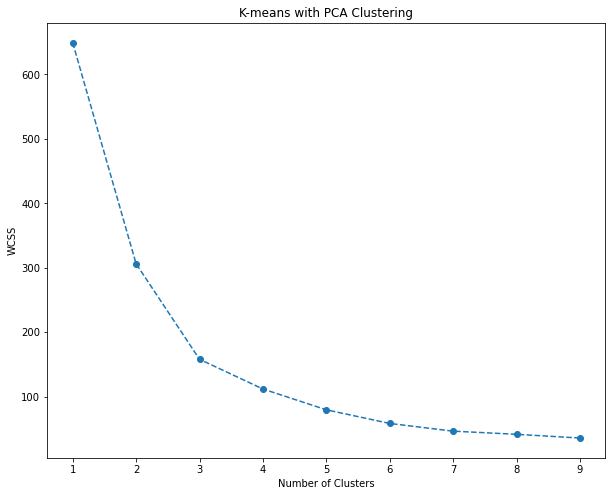

original_gross_amt                                                \
                     count       mean         std     min     25%    50%   
cluster                                                                    
0.0                  237.0  60.535738   97.959225  -46.00  16.000  35.98   
1.0                  591.0  89.074281  157.258337 -350.30  18.970  40.00   
2.0                  114.0  89.770439   94.520492  -55.99  29.250  58.98   
3.0                   43.0  79.003953  112.427332  -52.98  16.035  45.98   

                          
             75%     max  
cluster                   
0.0       64.970  1000.0  
1.0       96.570  1629.5  
2.0      119.875   430.0  
3.0       87.350   500.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


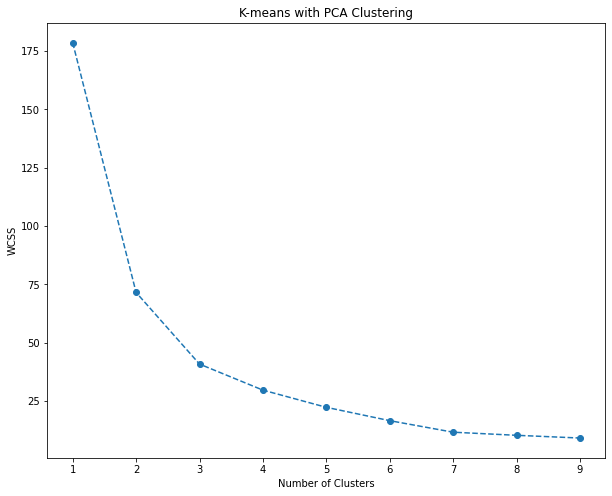

original_gross_amt                                                 \
                     count        mean         std     min     25%    50%   
cluster                                                                     
0.0                  101.0   76.045842  110.705886 -139.99  10.470  29.99   
1.0                  133.0  139.970752  281.348454 -100.00  45.000  87.50   
2.0                   14.0   50.532143   65.781449    8.00  12.500  25.24   
3.0                   14.0   30.495000   27.000711    4.99  11.525  22.49   

                            
              75%      max  
cluster                     
0.0       99.0000   499.39  
1.0      152.9900  2878.20  
2.0       36.4925   233.00  
3.0       39.2400   102.97

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


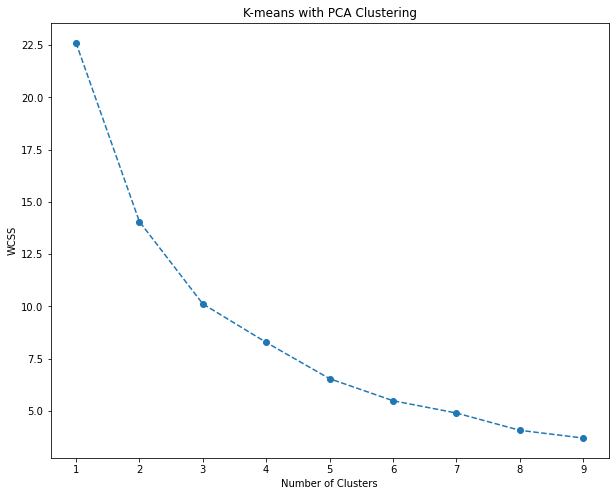

original_gross_amt                                                    \
                     count        mean         std     min      25%      50%   
cluster                                                                        
0.0                   97.0  119.413402  135.399365 -239.97  28.9100   80.990   
1.0                   43.0  137.806279  143.405453    5.49  33.2200  103.990   
2.0                    2.0   62.950000    0.000000   62.95  62.9500   62.950   
3.0                   70.0  127.566000  124.000976 -139.99  32.9475  115.705   

                           
              75%     max  
cluster                    
0.0      170.0000  535.00  
1.0      168.4400  702.26  
2.0       62.9500   62.95  
3.0      164.2325  494.40

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


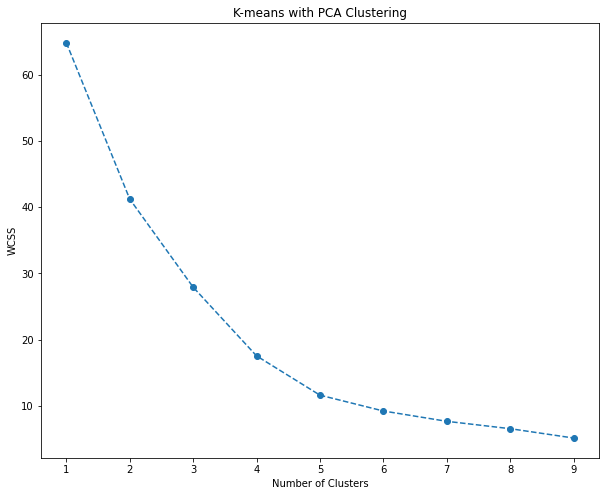

original_gross_amt                                                 \
                     count        mean         std    min      25%    50%   
cluster                                                                     
0.0                   32.0  115.427188  151.639317 -43.00  23.2125  43.00   
1.0                   15.0  396.133333  858.614938   5.90  15.6300  38.00   
2.0                   12.0  186.521667  342.994287   2.23  10.7175  43.69   
3.0                   14.0  212.355000  399.026316  17.96  62.5000  89.00   

                           
              75%     max  
cluster                    
0.0      148.9325   573.0  
1.0      227.2400  3199.0  
2.0      184.3500  1200.0  
3.0      165.9975  1572.5

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


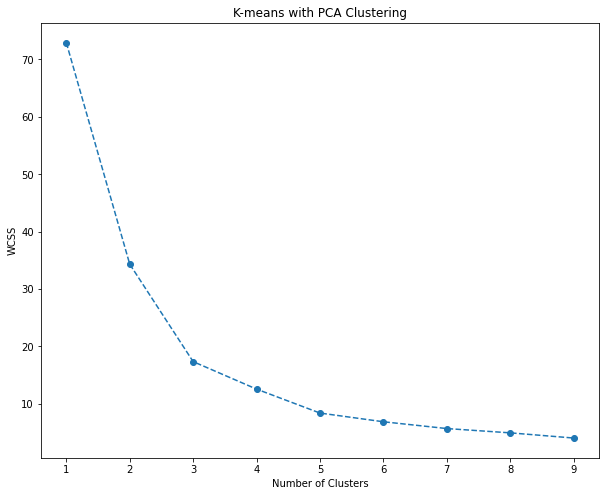

original_gross_amt                                                    \
                     count       mean         std   min   25%    50%     75%   
cluster                                                                        
0.0                   47.0  29.154468   36.860159  2.15  8.91  17.32  35.495   
1.0                   37.0  23.630000   27.208499  1.00  9.99  17.22  23.970   
2.0                   11.0  74.643636  151.248352  3.78  7.77  15.41  29.290   
3.0                    3.0  11.730000    9.682092  4.50  6.23   7.96  15.345   

                 
            max  
cluster          
0.0      224.32  
1.0      149.00  
2.0      500.89  
3.0       22.73

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


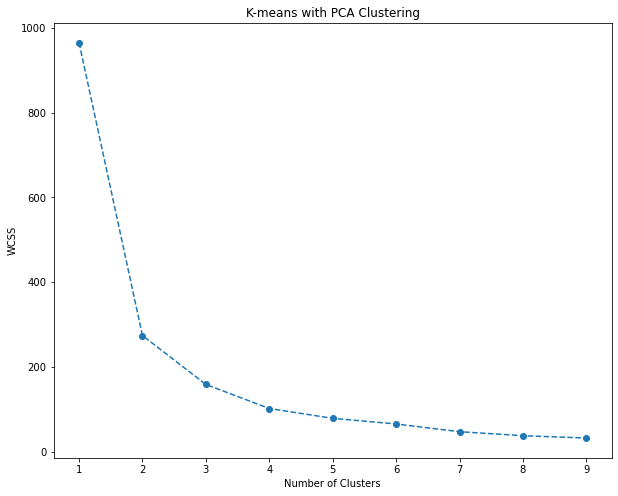

original_gross_amt                                                 \
                     count       mean         std     min     25%     50%   
cluster                                                                     
0.0                  497.0  68.648592  130.846775 -424.80  12.880  29.990   
1.0                  517.0  92.138414  137.250818 -328.27  24.280  48.650   
2.0                   86.0  63.511744   93.314061  -43.54  14.820  31.885   
3.0                  644.0  78.681180  175.160755 -360.36  13.765  29.060   

                           
             75%      max  
cluster                    
0.0       80.430  1563.34  
1.0      110.960   984.00  
2.0       62.355   521.00  
3.0       95.310  2646.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


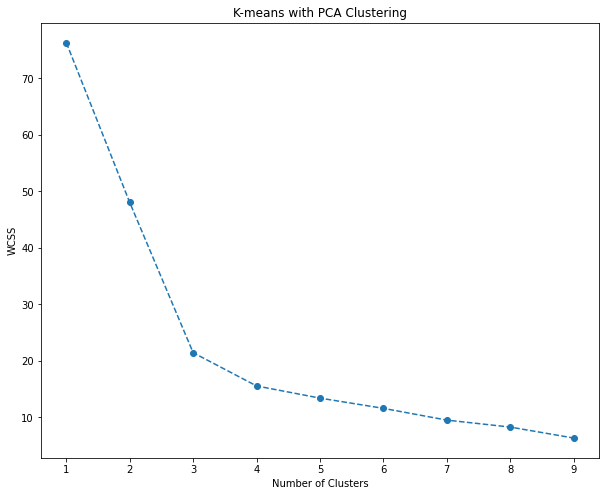

original_gross_amt                                                \
                     count        mean         std     min    25%    50%   
cluster                                                                    
0.0                  176.0  196.825568  119.745323    2.95  175.0  200.0   
1.0                   15.0  168.666667   46.424542  100.00  115.0  200.0   
2.0                  107.0  161.741308  108.408201    2.95   50.0  200.0   
3.0                  206.0  228.431699  200.896389    2.95  200.0  250.0   

                        
           75%     max  
cluster                 
0.0      250.0  1000.0  
1.0      200.0   200.0  
2.0      250.0   300.0  
3.0      300.0  2650.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


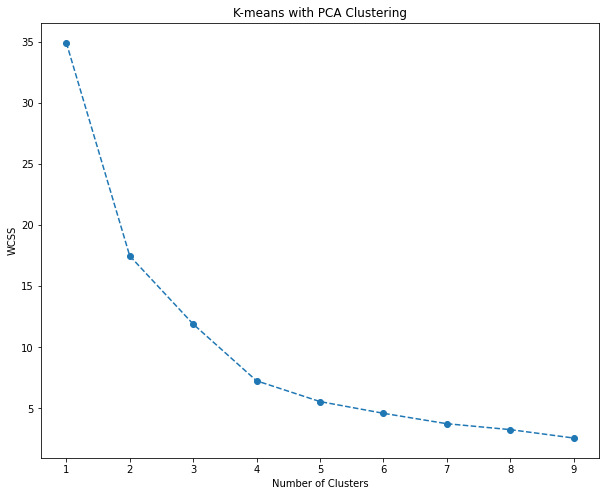

original_gross_amt                                                   \
                     count        mean         std    min       25%     50%   
cluster                                                                       
0.0                   32.0  103.446563  114.379899 -10.49   14.9625   74.94   
1.0                    8.0  271.515000  201.237179  50.94   67.7125  297.12   
2.0                   47.0   87.798723  107.573498 -23.12   16.2100   66.99   
3.0                    5.0  194.018000  115.903913  19.99  128.4000  273.90   

                           
              75%     max  
cluster                    
0.0      125.0425  420.00  
1.0      381.7150  617.39  
2.0      109.3800  491.47  
3.0      273.9000  273.90

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


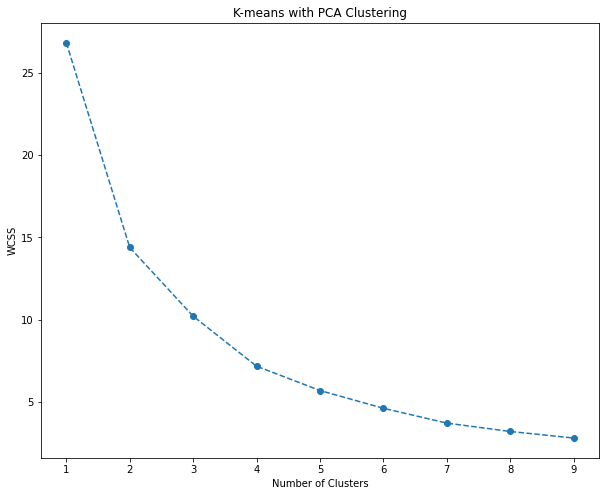

original_gross_amt                                                 \
                     count        mean         std    min      25%    50%   
cluster                                                                     
0.0                  101.0   55.039901   74.442474   1.98  10.3100  21.29   
1.0                   61.0  105.299508  170.297484  -4.32  23.4000  36.84   
2.0                   11.0   31.125455   25.221988   6.50  15.5550  24.34   
3.0                   60.0   60.938667   80.942289 -75.60   9.7925  27.22   

                           
             75%      max  
cluster                    
0.0       72.000   457.50  
1.0      115.000  1029.89  
2.0       37.915    91.75  
3.0       80.625   384.99

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


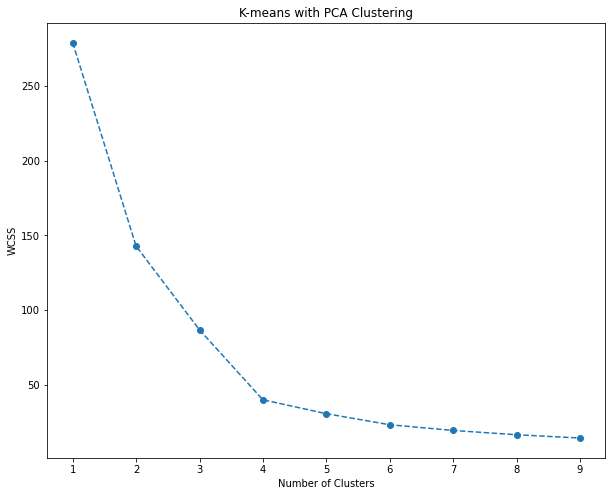

original_gross_amt                                                   \
                     count       mean        std    min   25%    50%    75%   
cluster                                                                       
0.0                   49.0  29.313265  48.312131 -58.99   5.5   9.00  35.29   
1.0                  281.0  10.305907  16.391486   1.00   3.0   6.00  11.00   
2.0                   62.0  30.831290  22.195791 -57.00  18.0  31.49  48.42   
3.0                   50.0   8.329000   6.549093   2.00   4.8   7.00   7.00   

                 
            max  
cluster          
0.0      240.00  
1.0      102.00  
2.0       85.84  
3.0       36.90

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


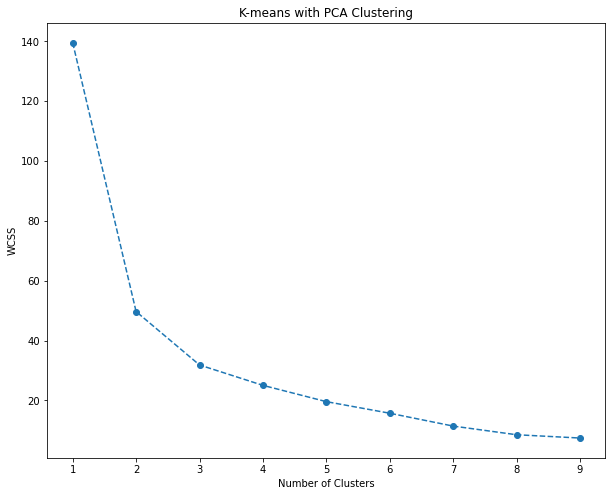

original_gross_amt                                                   \
                     count        mean         std     min      25%     50%   
cluster                                                                       
0.0                   76.0  115.670000  152.289322 -547.90  45.9375   69.00   
1.0                   77.0  147.730519  195.177740  -26.00  45.4100   68.22   
2.0                   48.0  178.155208  194.249363 -250.00  56.0725  124.63   
3.0                   17.0  164.349412  139.606513   28.09  40.0000  113.36   

                            
              75%      max  
cluster                     
0.0      152.5175   671.92  
1.0      179.4000  1081.58  
2.0      282.5325   949.50  
3.0      218.3200   430.56

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


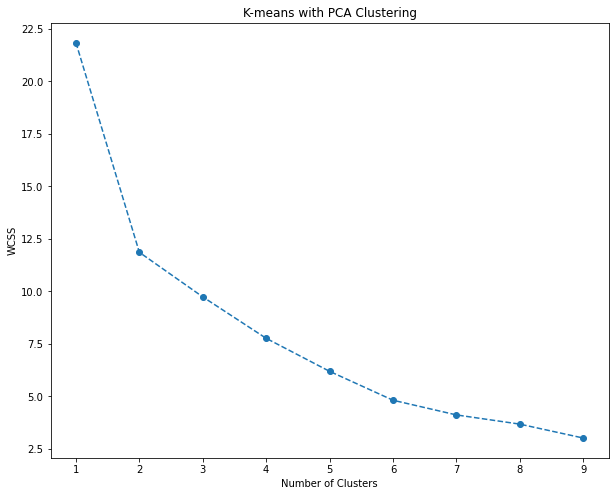

original_gross_amt                                                  \
                     count        mean         std     min     25%     50%   
cluster                                                                      
0.0                   52.0   76.709423   79.679377  -25.88  13.005  37.965   
1.0                   73.0  106.545616  167.374639 -129.99  21.990  69.010   
2.0                   63.0  112.901429  196.390757    2.49  14.915  32.980   
3.0                    1.0   12.000000         NaN   12.00  12.000  12.000   

                          
            75%      max  
cluster                   
0.0      147.25   257.40  
1.0      149.99  1223.97  
2.0      117.74  1242.00  
3.0       12.00    12.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


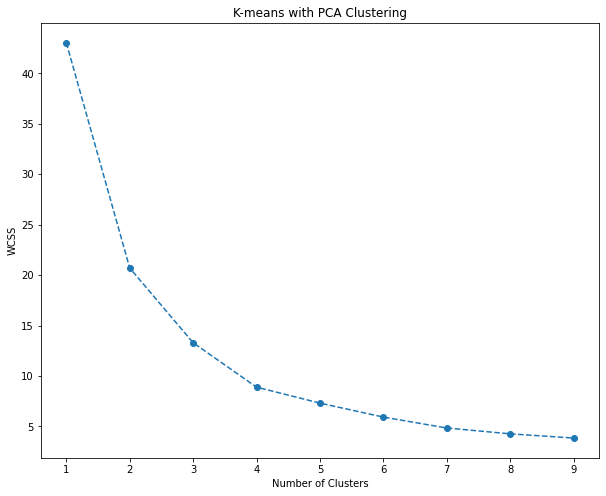

original_gross_amt                                                \
                     count        mean         std   min     25%     50%   
cluster                                                                    
0.0                   32.0  108.275313  100.891176   5.0  17.385  69.025   
1.0                   13.0  122.371538  121.648525   8.0  30.570  98.700   
2.0                    5.0   94.948000  104.721793  30.0  44.880  44.880   
3.0                   23.0  120.885652  110.746459   4.5  26.965  79.160   

                         
            75%     max  
cluster                  
0.0      195.00  324.00  
1.0      181.01  422.89  
2.0       75.00  279.98  
3.0      200.06  421.96

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


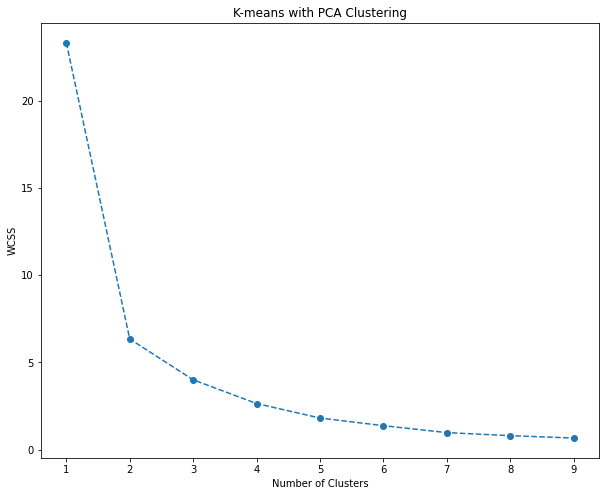

original_gross_amt                                                   \
                     count        mean         std    min       25%     50%   
cluster                                                                       
0.0                   23.0  154.354348  126.661606   4.99   52.7950  136.82   
1.0                    2.0  282.670000  283.196266  82.42  182.5450  282.67   
2.0                    8.0  135.707500   88.825057  20.41   60.5525  132.00   
3.0                   24.0  222.683333  375.305830 -17.45   57.4750  111.34   

                           
             75%      max  
cluster                    
0.0      187.445   461.80  
1.0      382.795   482.92  
2.0      207.300   246.00  
3.0      191.125  1755.60

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


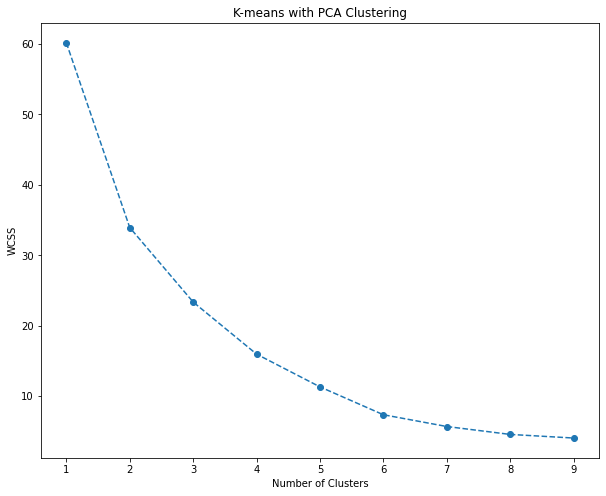

original_gross_amt                                                 \
                     count        mean         std     min    25%     50%   
cluster                                                                     
0.0                   57.0  140.752632  213.267037 -294.35   48.0  100.70   
1.0                   13.0   79.460769  231.800612 -400.00   30.0   70.75   
2.0                    9.0  390.378889  391.523926 -200.00  120.0  303.85   
3.0                    9.0   69.477778  202.552176 -270.00   18.0  120.00   

                         
           75%      max  
cluster                  
0.0      210.0  1045.00  
1.0      194.4   429.99  
2.0      701.4   935.00  
3.0      270.0   274.94

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


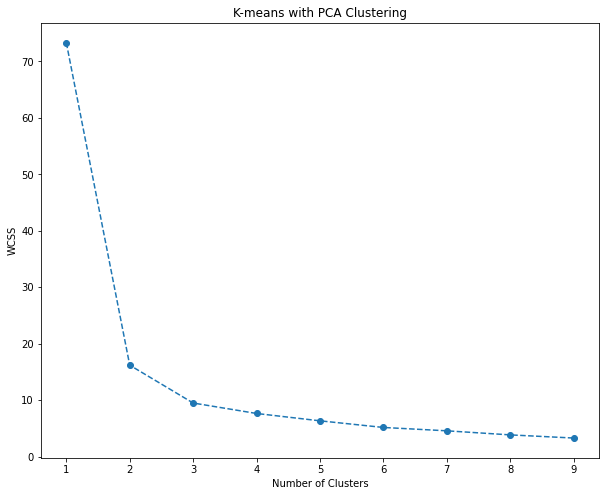

original_gross_amt                                                    \
                     count        mean         std     min      25%      50%   
cluster                                                                        
0.0                   44.0  173.825000  260.623192 -122.23   17.995   68.000   
1.0                   33.0  308.608182  225.599814    4.96  148.500  226.000   
2.0                   82.0   60.708780   69.091192  -66.00   12.155   30.985   
3.0                   45.0  108.354667  161.648903  -70.80   11.970   41.950   

                           
             75%      max  
cluster                    
0.0      195.000  1200.00  
1.0      496.000   732.37  
2.0       97.575   336.90  
3.0      150.000   702.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


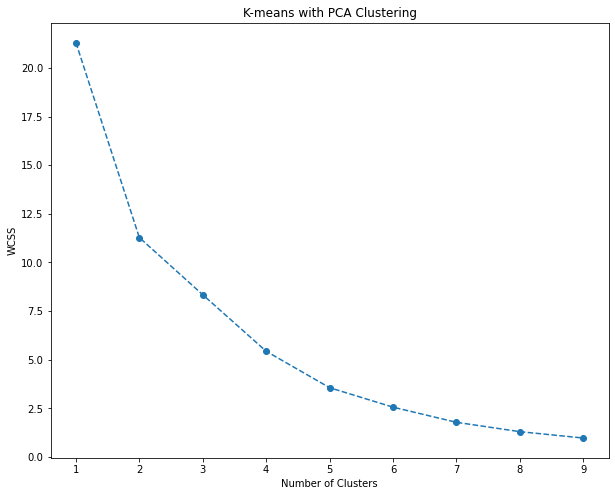

original_gross_amt                                                    \
                     count        mean         std     min      25%      50%   
cluster                                                                        
0.0                   15.0   56.586667  187.805110 -573.60  31.7500  110.000   
1.0                    5.0   28.078000   11.406315   14.72  16.6400   34.460   
2.0                   36.0  320.302500  657.199308   10.00  48.1700   99.495   
3.0                    2.0    6.615000    5.395225    2.80   4.7075    6.615   

                            
              75%      max  
cluster                     
0.0      126.4550   268.40  
1.0       36.6200    37.95  
2.0      250.0000  3110.00  
3.0        8.5225    10.43

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


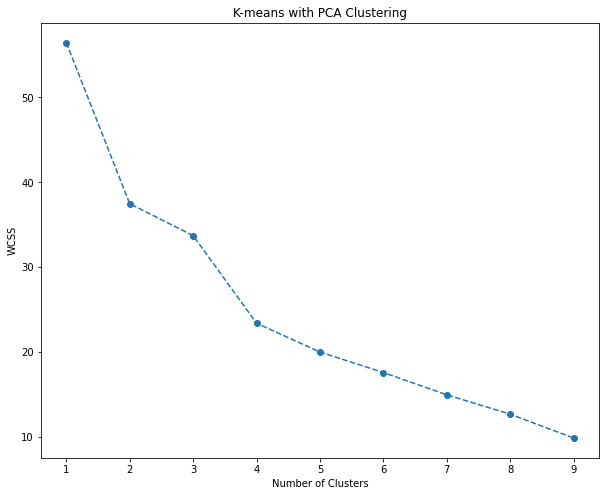

original_gross_amt                                                \
                     count        mean         std    min    25%     50%   
cluster                                                                    
0.0                   41.0   65.887317  115.746245 -25.98  10.00   10.00   
1.0                  109.0  129.943028  222.291451   0.10  10.00   15.00   
2.0                  122.0  178.146885  261.767569   1.86  15.00   70.51   
3.0                    9.0  159.467778  115.325848  14.99  66.12  154.72   

                          
            75%      max  
cluster                   
0.0       70.70   454.64  
1.0      160.10  1070.69  
2.0      235.04  1472.40  
3.0      206.22   358.98

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


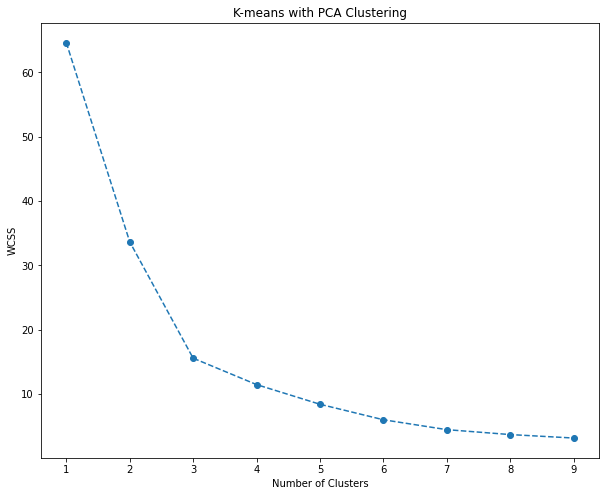

original_gross_amt                                                  \
                     count        mean         std    min     25%      50%   
cluster                                                                      
0.0                   37.0  102.809189  174.944149    5.0  27.710   86.990   
1.0                   30.0  109.152667  166.925172 -106.2  20.225   40.175   
2.0                   13.0   67.286923   69.308219   24.0  24.720   25.500   
3.0                    3.0  160.726667  131.558938   31.5  93.840  156.180   

                           
             75%      max  
cluster                    
0.0       97.080  1068.00  
1.0      156.125   807.02  
2.0      123.520   200.02  
3.0      225.340   294.50

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


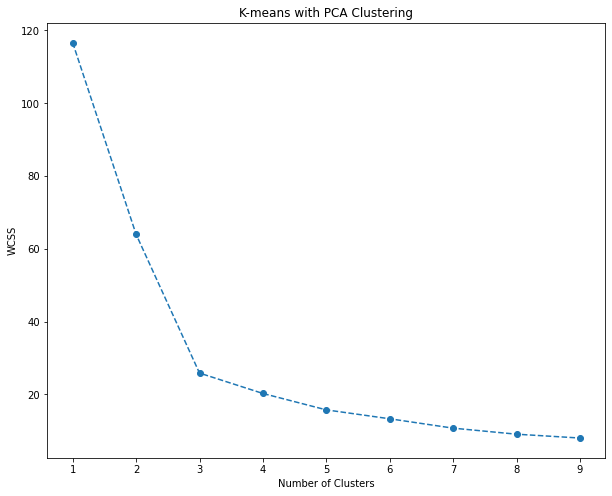

original_gross_amt                                                    \
                     count        mean         std     min      25%      50%   
cluster                                                                        
0.0                   64.0   68.454531   61.405825    5.29  38.5000   53.185   
1.0                   36.0  188.436389  233.762420 -357.14  37.4825  130.050   
2.0                   42.0  208.339286  335.270307    5.90  57.7275   98.030   
3.0                    3.0   98.600000  152.614154    8.00  10.5000   13.000   

                           
              75%     max  
cluster                    
0.0       70.5000   299.0  
1.0      224.6575   775.0  
2.0      178.6550  1708.0  
3.0      143.9000   274.8

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


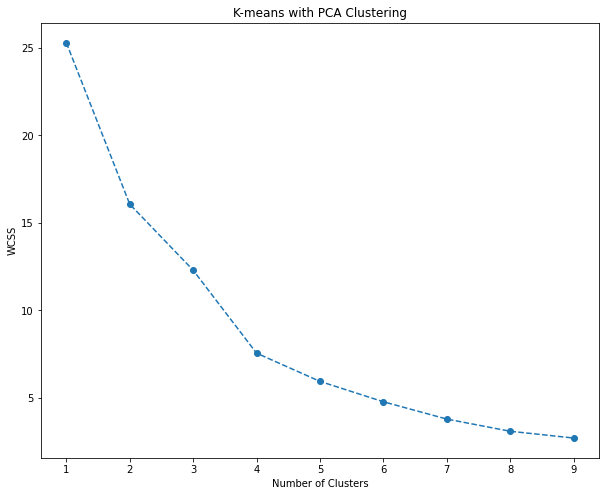

original_gross_amt                                                  \
                     count        mean         std    min      25%     50%   
cluster                                                                      
0.0                    4.0  466.620000  533.110134   7.06   16.795  407.17   
1.0                   28.0  452.658929  390.787506 -16.16  157.770  375.33   
2.0                    3.0  220.233333  167.884077  57.70  133.850  210.00   
3.0                   17.0  511.295294  407.782692  22.79  198.360  337.36   

                           
             75%      max  
cluster                    
0.0      856.995  1045.08  
1.0      589.205  1475.43  
2.0      301.500   393.00  
3.0      791.880  1423.20

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


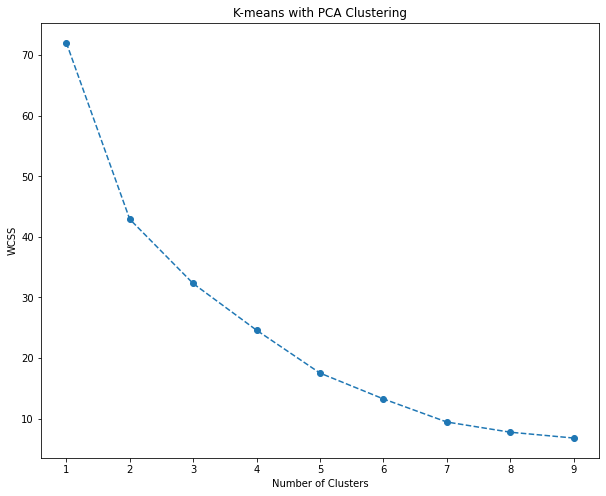

original_gross_amt                                                    \
                     count        mean         std     min      25%      50%   
cluster                                                                        
0.0                  110.0   67.323273   72.825745 -114.95  14.9925   42.360   
1.0                    8.0  143.178750   84.238031   29.64  85.2900  134.815   
2.0                   63.0   58.893333   83.985628 -216.10  12.5200   34.990   
3.0                   18.0  170.825556  236.581632    2.95  29.2125   63.900   

                           
              75%     max  
cluster                    
0.0       99.7625  394.80  
1.0      191.1000  298.20  
2.0       97.3800  365.02  
3.0      169.7425  870.00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


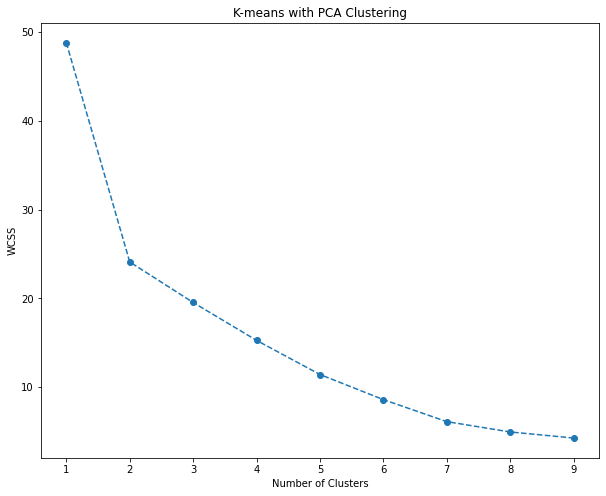

original_gross_amt                                                \
                     count        mean         std    min     25%    50%   
cluster                                                                    
0.0                  100.0  833.940000   66.855312  756.2  776.85  813.0   
1.0                   37.0   50.085135   84.782105    3.2   13.00   13.0   
2.0                   16.0  151.950000  272.953696   13.0   13.00   16.5   
3.0                   67.0  814.749254   57.252925  565.0  788.30  807.8   

                       
           75%    max  
cluster                
0.0      898.0  996.0  
1.0       16.5  410.0  
2.0      134.0  896.0  
3.0      843.5  942.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


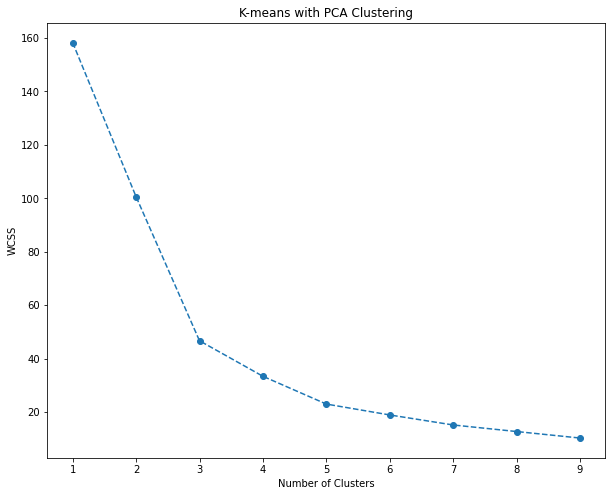

original_gross_amt                                                    \
                     count        mean         std    min       25%      50%   
cluster                                                                        
0.0                  258.0  105.673798  432.693061   0.59   17.8125   31.270   
1.0                  161.0  109.151615  303.382849   1.48   17.9400   28.110   
2.0                   36.0  251.235278  147.604118  13.04  142.9275  215.230   
3.0                  234.0   66.737521  173.489199   0.26   15.9400   25.505   

                            
              75%      max  
cluster                     
0.0       64.7975  5282.71  
1.0       60.8600  2532.49  
2.0      372.3825   500.00  
3.0       53.4900  2204.40

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


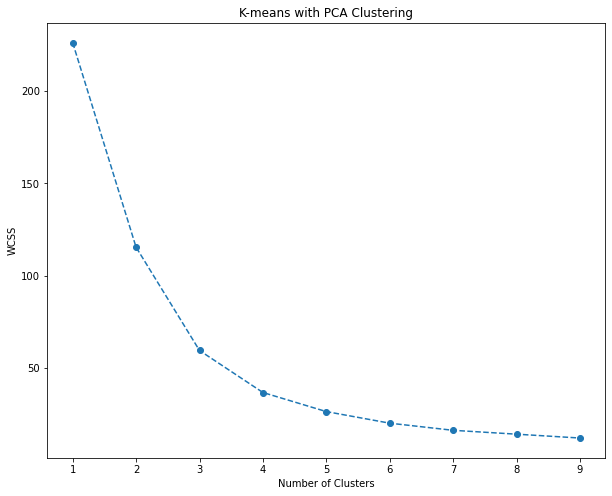

original_gross_amt                                                    \
                     count        mean         std     min      25%      50%   
cluster                                                                        
0.0                  102.0  112.305196  153.084966 -352.00  17.4325   70.425   
1.0                  143.0  235.926224  256.516643  -53.31  59.5000  141.000   
2.0                   37.0  314.325676  670.094097    2.40  46.8000  120.000   
3.0                   25.0  226.888000  365.324993    6.00   9.0000   79.320   

                           
             75%      max  
cluster                    
0.0      157.500   880.00  
1.0      347.725  1534.50  
2.0      309.950  3838.83  
3.0      294.000  1623.62

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


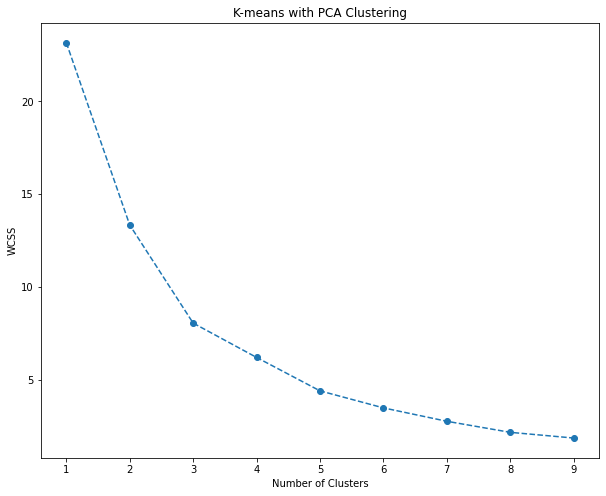

original_gross_amt                                                     \
                     count        mean         std   min   25%     50%    75%   
cluster                                                                         
0.0                   38.0  104.700263   80.539978  18.0  50.0   75.00  152.0   
1.0                   15.0   83.851333   81.222459  10.0  27.5   51.97  100.0   
2.0                    5.0  311.220000  309.477854  30.0  30.0  338.10  378.0   
3.0                    1.0   30.000000         NaN  30.0  30.0   30.00   30.0   

                
           max  
cluster         
0.0      312.0  
1.0      306.0  
2.0      780.0  
3.0       30.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


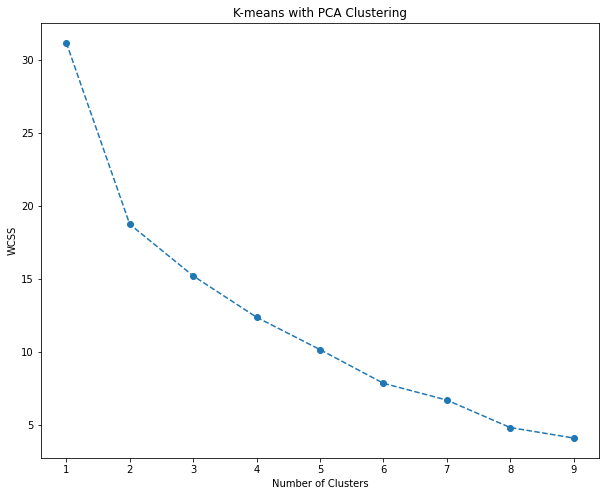

original_gross_amt                                              \
                     count       mean         std    min    25%    50%   
cluster                                                                  
0.0                    5.0  90.544000  123.691014   3.00   5.95  15.57   
1.0                   37.0  41.379459   55.507730 -16.50  -0.99  19.15   
2.0                    5.0  47.284000   34.569682   3.78  27.79  40.90   
3.0                   42.0  85.216429   88.011626  -3.13  18.00  55.65   

                          
             75%     max  
cluster                   
0.0      142.600  285.60  
1.0       57.240  213.40  
2.0       76.500   87.45  
3.0      130.515  386.25

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


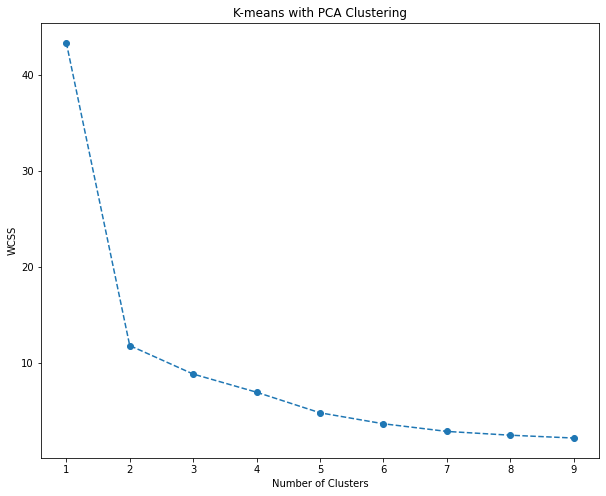

original_gross_amt                                                   \
                     count        mean         std    min      25%      50%   
cluster                                                                       
0.0                   24.0  175.729583  181.144878   7.98  35.3050   98.505   
1.0                   24.0   92.415000  114.247692   1.85  11.6625   51.590   
2.0                   18.0  270.205000  465.402879   7.98  43.8225  131.345   
3.0                    6.0  109.993333   46.899041  40.00  79.9975  139.990   

                            
              75%      max  
cluster                     
0.0      216.3000   600.00  
1.0      122.2025   363.92  
2.0      147.4975  1945.00  
3.0      139.9900   139.99

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


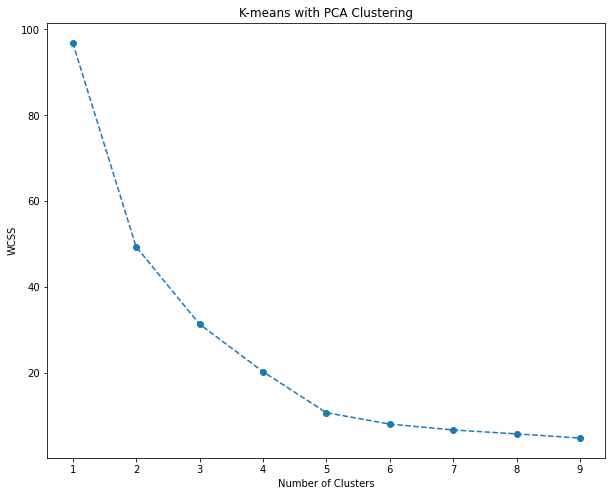

original_gross_amt                                                 \
                     count        mean          std    min    25%     50%   
cluster                                                                     
0.0                   51.0  135.975294   319.662531   0.42  20.02   34.39   
1.0                   25.0  348.488400   495.869808  38.30  52.68  156.54   
2.0                   21.0  193.957143   170.938185  20.00  52.03  165.59   
3.0                   73.0  391.287123  1313.043400 -87.28  30.34   47.52   

                           
             75%      max  
cluster                    
0.0       96.075  1672.08  
1.0      497.350  2352.23  
2.0      221.910   693.93  
3.0       95.660  8986.64

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


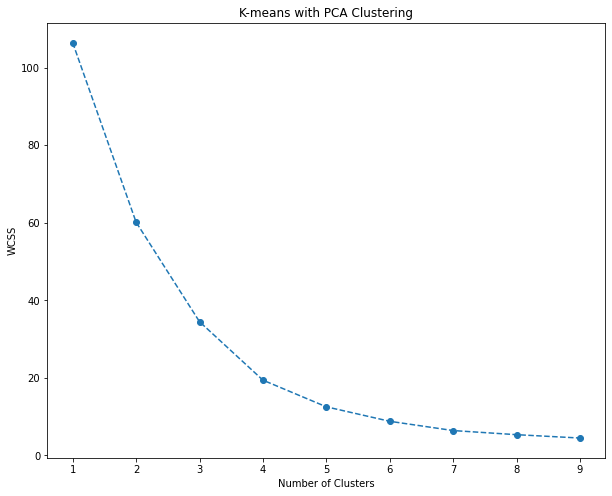

original_gross_amt                                                    \
                     count        mean          std    min      25%      50%   
cluster                                                                        
0.0                   66.0  467.304394  1499.235788   2.24   18.660   22.875   
1.0                  120.0  444.105333  1254.051803   3.01    5.615   38.810   
2.0                   23.0  351.440870   207.111421  11.54  183.745  341.520   
3.0                   11.0  214.432727   184.600263   0.01   79.445  181.560   

                            
              75%      max  
cluster                     
0.0      100.8900  6928.95  
1.0      194.9475  9420.49  
2.0      500.0000   886.18  
3.0      330.5900   575.39

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


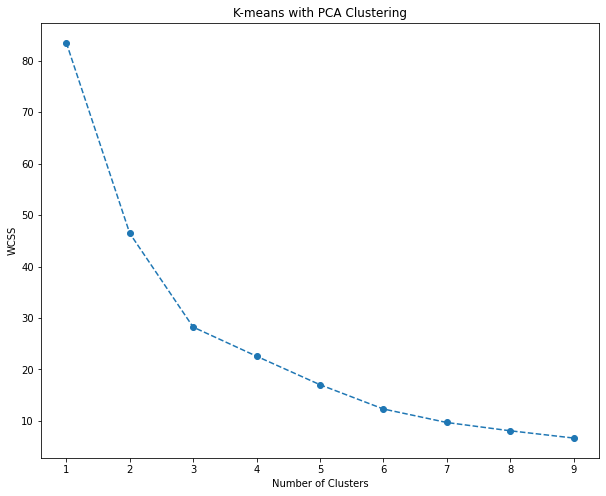

original_gross_amt                                                  \
                     count        mean         std     min      25%    50%   
cluster                                                                      
0.0                   41.0  282.995122  225.362005   24.75   70.000  283.3   
1.0                   39.0  310.991026  326.932918 -502.50  158.275  255.8   
2.0                    4.0  208.000000   87.147385   88.00  172.000  232.0   
3.0                   12.0  190.557500  105.576612   40.00  129.400  205.8   

                         
             75%    max  
cluster                  
0.0      427.150  948.0  
1.0      563.975  978.3  
2.0      268.000  280.0  
3.0      247.500  400.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


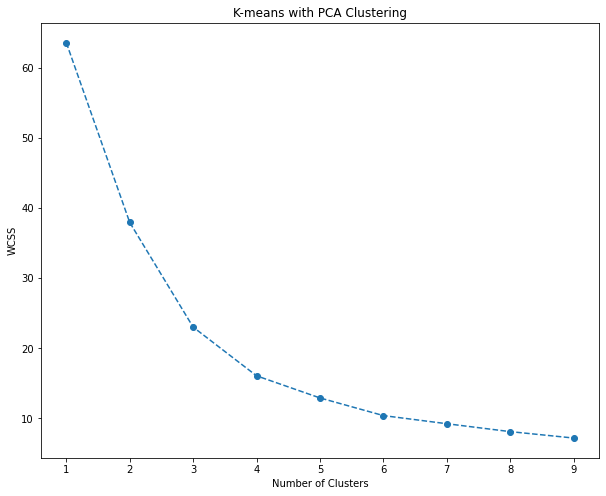

original_gross_amt                                                 \
                     count        mean         std    min    25%      50%   
cluster                                                                     
0.0                    6.0  174.250000  185.506642  10.44  20.56  112.235   
1.0                   35.0  104.335714  103.103730  19.19  38.00   74.460   
2.0                   13.0   66.679231   92.211945   7.31  20.61   46.920   
3.0                   20.0   96.009500  115.913333  11.99  20.04   42.740   

                          
              75%    max  
cluster                   
0.0      328.5000  420.0  
1.0      108.0000  450.0  
2.0       59.9400  357.0  
3.0      112.1425  420.0

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


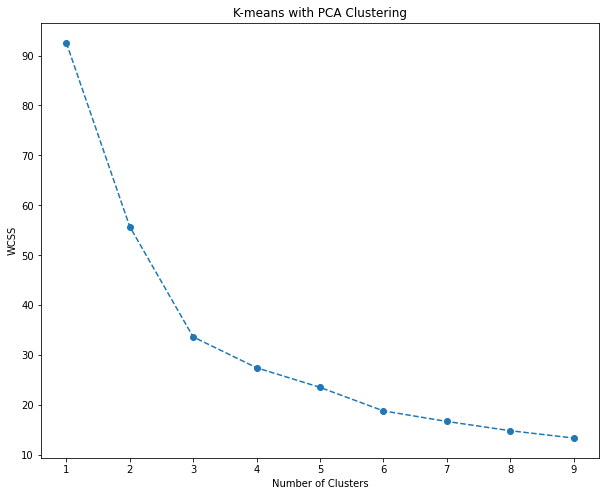

original_gross_amt                                                     \
                     count        mean         std     min       25%      50%   
cluster                                                                         
0.0                  296.0  201.230236  184.354332 -249.99   83.2850  164.465   
1.0                  182.0  183.950110  196.581423 -459.98   63.9325  152.475   
2.0                   14.0  241.842857  338.422842 -288.94   99.6650  164.920   
3.0                  290.0  195.499207  179.159486 -763.97  106.9250  183.940   

                            
              75%      max  
cluster                     
0.0      292.4875   962.00  
1.0      262.9825   882.91  
2.0      274.2025  1230.16  
3.0      264.5550   763.97

**************************************************


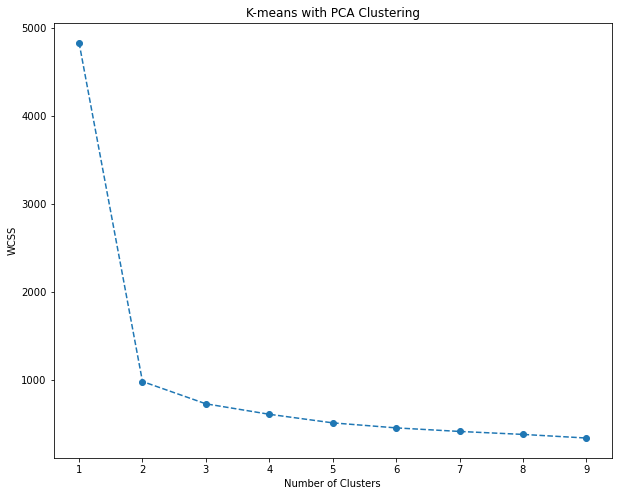

original_gross_amt                                              \
                     count         mean          std      min      25%   
cluster                                                                  
0.0                 1192.0   722.778909   661.638426 -1626.59  375.800   
1.0                 3507.0  1007.586136  1096.428237 -2964.60  205.625   
2.0                 1766.0   720.895085   650.675053 -2304.70  389.850   
3.0                 2112.0  1035.622955  1064.466212 -2982.00  252.900   

                                       
              50%        75%      max  
cluster                                
0.0       653.350  1101.0875  2816.00  
1.0      1120.900  1883.5250  3000.00  
2.0       633.775  1080.1000  2862.00  
3.0      1078.000  1880.0375  2999.15

In [89]:
# Whithout PCA
for val in X['trans_cac_desc_1_grouped'].unique():
    groups[val] = {}
    scaler = MinMaxScaler()
    X_group =pd.DataFrame(scaler.fit_transform(X[X['trans_cac_desc_1_grouped']==val].drop(columns='trans_cac_desc_1_grouped')),
                          columns = X.drop(columns='trans_cac_desc_1_grouped').columns)
    
    ## Save objects (in case I need it later)
    groups[val]['scaler'] = scaler
    groups[val]['X_group'] = X_group
    print('*'*50)
    wcss = []

    for i in range(1,10):
        kmeans_pca = KMeans(n_clusters = i, init='k-means++', random_state=42)
        kmeans_pca.fit(X_group)
        wcss.append(kmeans_pca.inertia_)
        


    ## Plot summary of number of clusters
    plt.figure(figsize=(10,8))
    plt.plot(range(1,10), wcss, marker ='o', linestyle='--')
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('K-means with PCA Clustering')
    plt.show()
    
    kmeans_pca = KMeans(n_clusters=4, init= 'k-means++', random_state=42)
    kmeans_pca.fit(X_group)
    
    # Assign Cluster
    data.loc[data['trans_cac_desc_1_grouped']==val, 'cluster'] = kmeans_pca.predict(X_group)
    
    # Describe clusters
    display(data[data['trans_cac_desc_1_grouped']==val].groupby('cluster')[['original_gross_amt','weekday']].describe())
    

__Comments:__  
- Without PCA the number of clusters recommended (using elbow method) are roughly 4 clusters.  
- While using 4 clusters can help us identifying groups of transactions, for business application it maybe difficult to implement.  
- If we use 4 clusters, we will need to identify which of the clusters is the "unsual one" we want to look at.
- As we have 4 clusters for each "trans_cac_desc_1_grouped" it can be tedious.

<hr>

## Second approach: Isolation Forest for identifying unusual group
In this section I will use Isolation Forest algorithm to identify uncommon transactions.  
In an Isolation Forest, randomly sub-sampled data is processed in a tree structure based on randomly selected features. 
The samples that travel deeper into the tree are less likely to be anomalies as they required more cuts to isolate them.


In [90]:
groups = {}

In [91]:
X

,original_gross_amt,weekday,trans_cac_desc_1_grouped,n_transac_day,Others,adult & communities,corporate resources,cyp&f,cyp&f schools,local services
34467,52.84,3.0,Vehicle Fuel,0,0,1,0,0,0,0
34468,10.00,2.0,Vehicle Fuel,0,0,1,0,0,0,0
34469,20.01,3.0,Vehicle Fuel,0,0,1,0,0,0,0
34470,57.96,4.0,Vehicle Fuel,0,0,1,0,0,0,0
34471,60.50,2.0,Vehicle Fuel,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
180264,61.09,3.0,Vehicle Fuel,0,0,0,0,0,0,1
180265,118.93,4.0,Equip Operational,0,0,0,0,0,0,1
180266,118.93,4.0,Equip Operational,1,0,0,0,0,0,1
180267,10.00,4.0,Equip Operational,0,0,0,0,0,0,1


In [ ]:
from sklearn.ensemble import IsolationForest

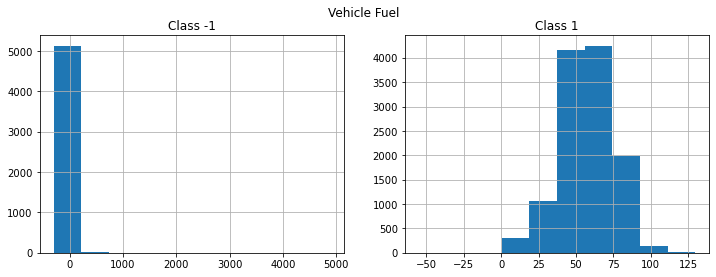

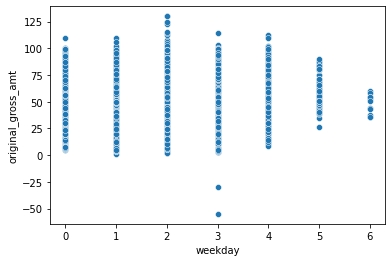

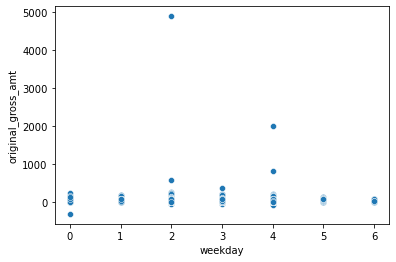

**************************************************


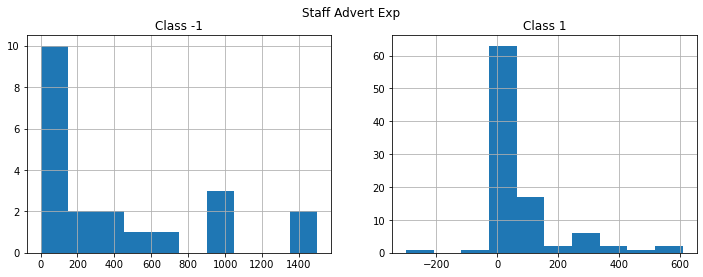

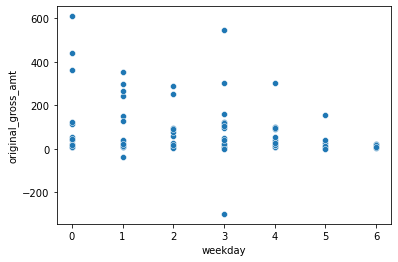

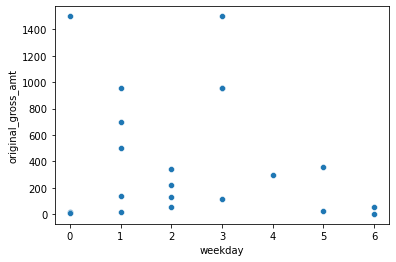

**************************************************


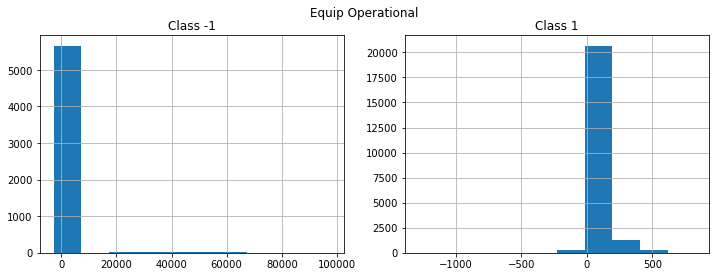

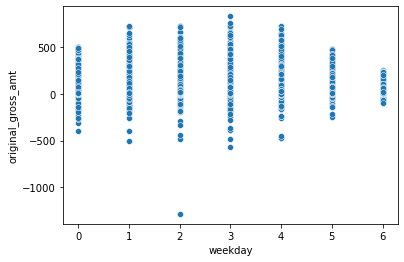

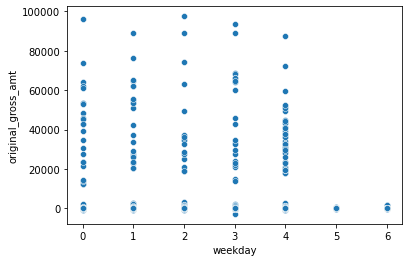

**************************************************


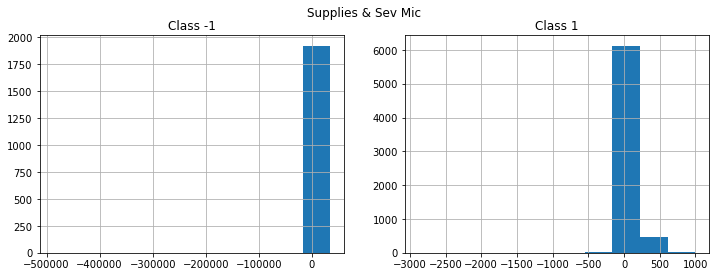

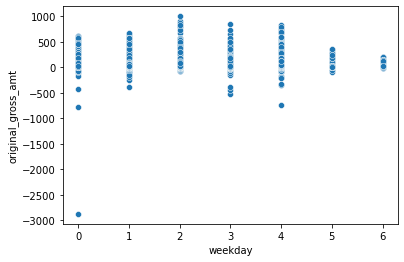

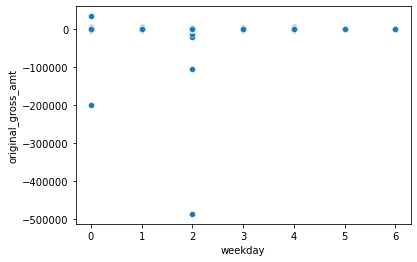

**************************************************


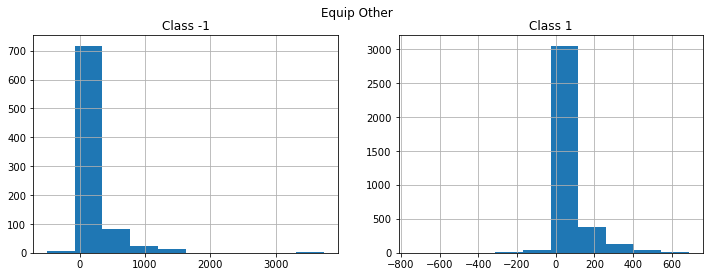

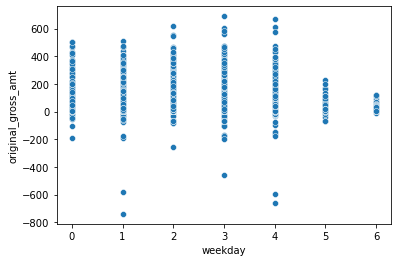

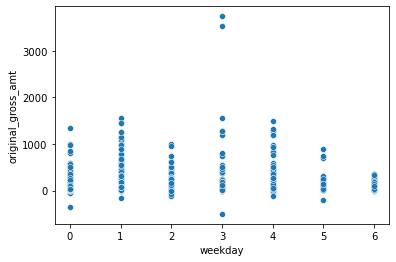

**************************************************


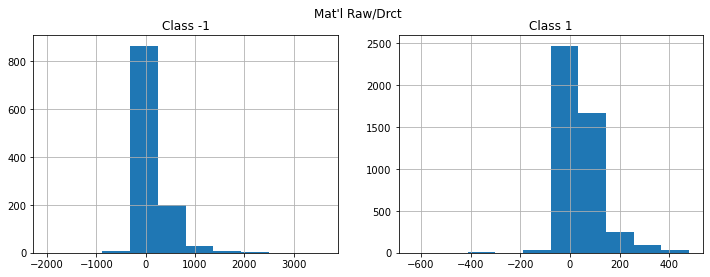

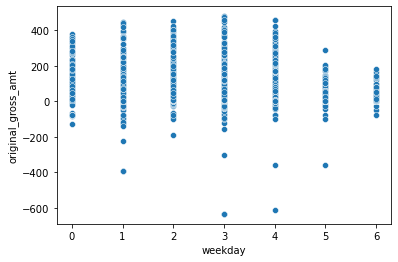

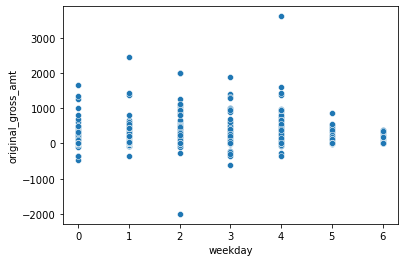

**************************************************


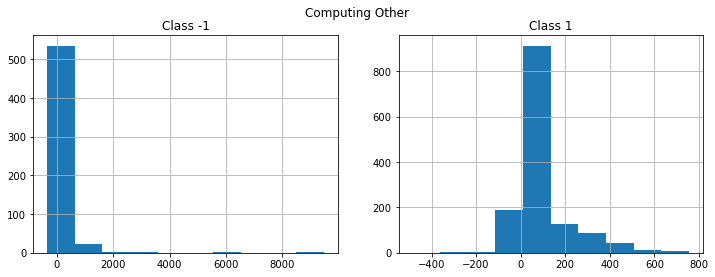

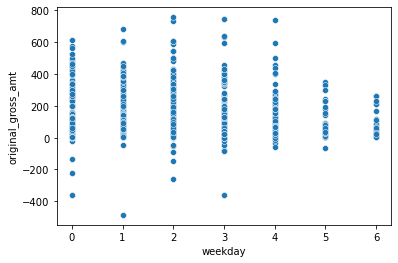

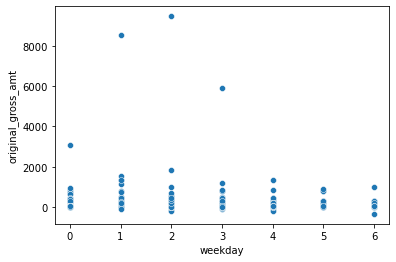

**************************************************


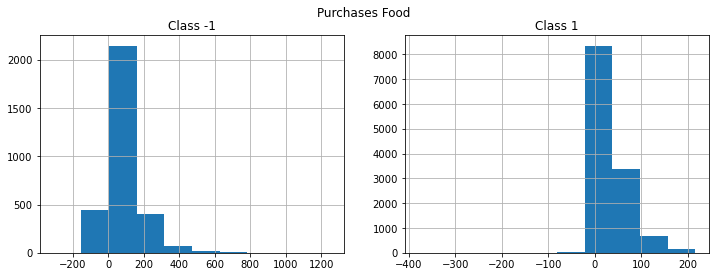

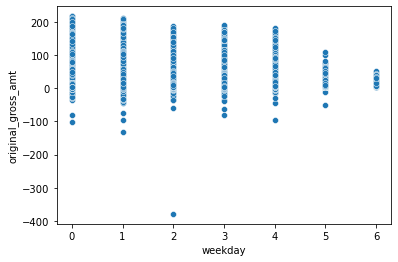

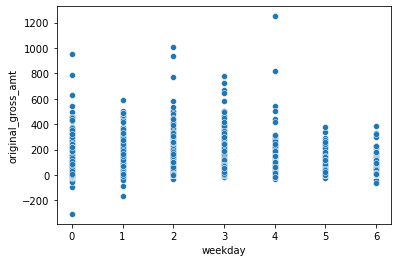

**************************************************


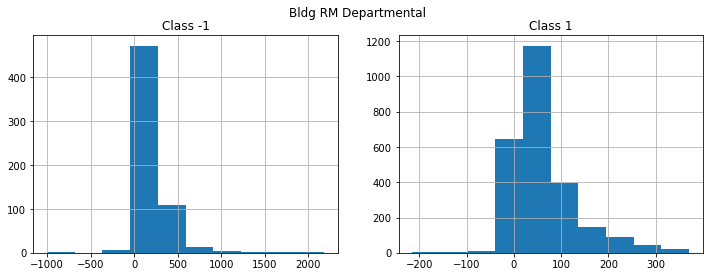

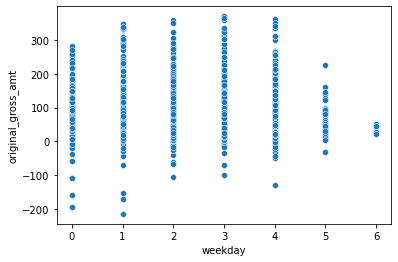

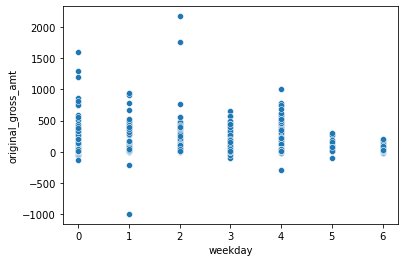

**************************************************


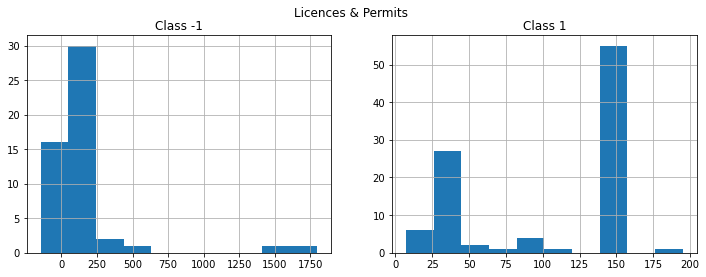

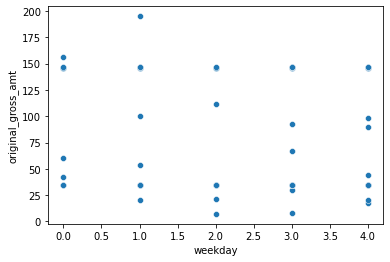

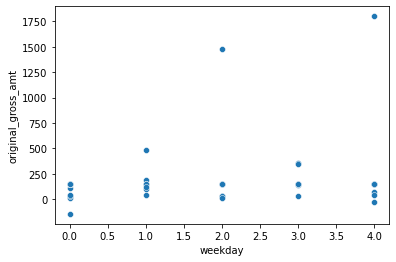

**************************************************


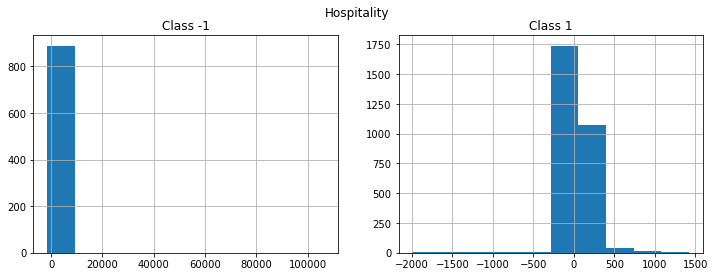

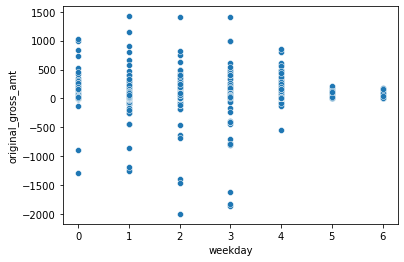

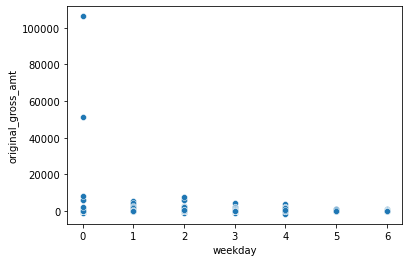

**************************************************


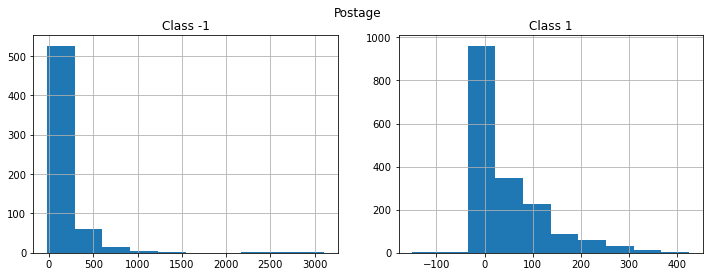

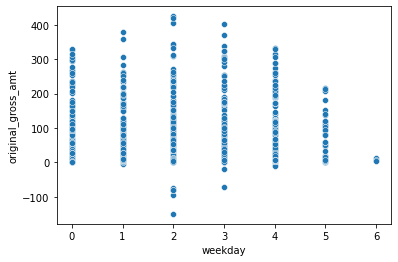

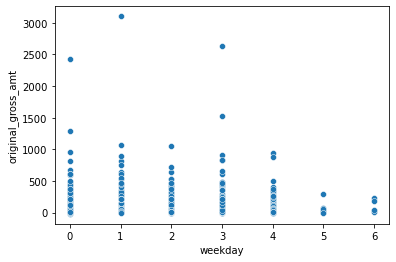

**************************************************


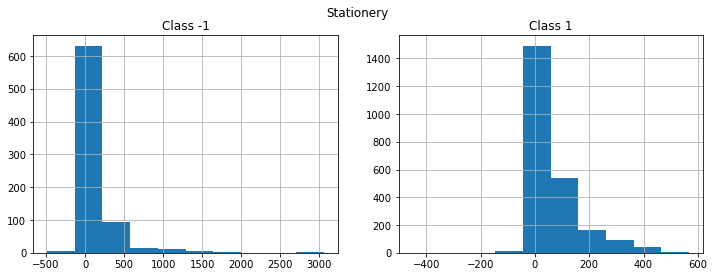

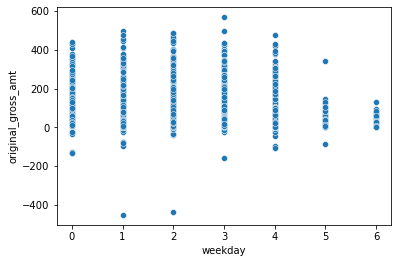

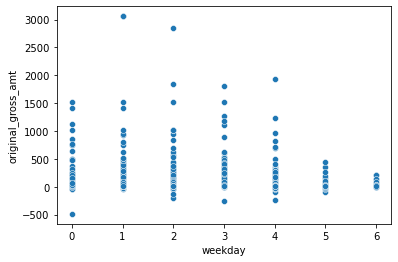

**************************************************


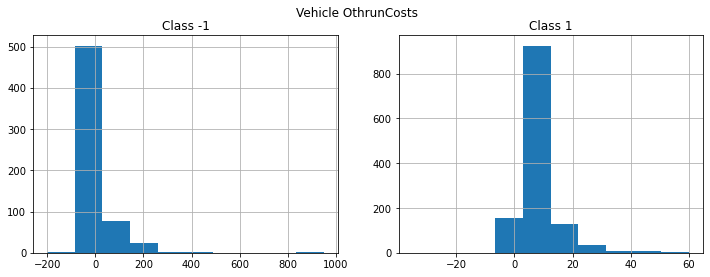

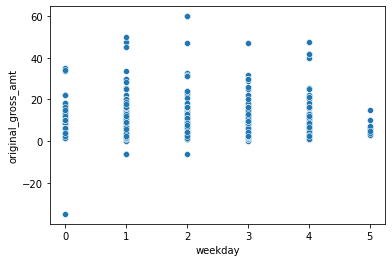

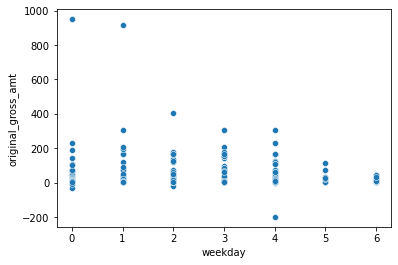

**************************************************


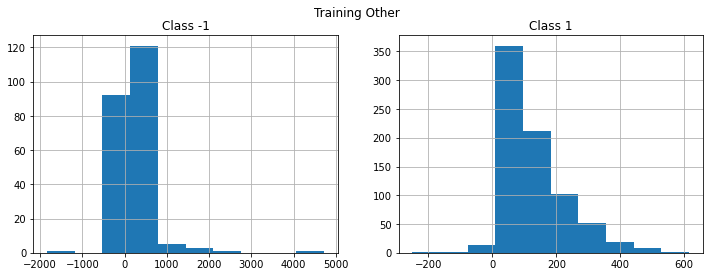

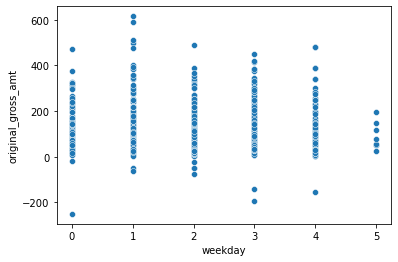

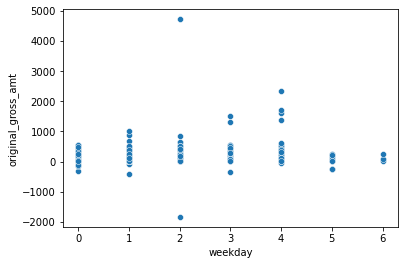

**************************************************


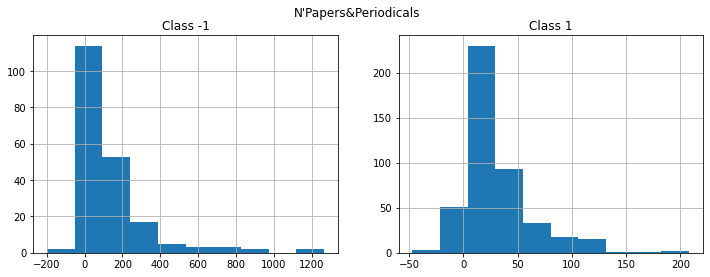

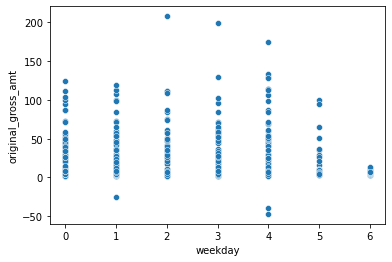

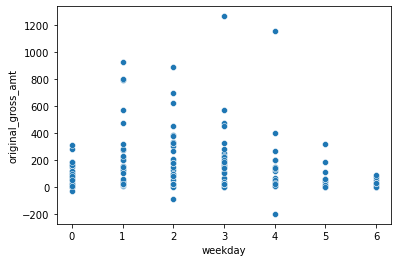

**************************************************


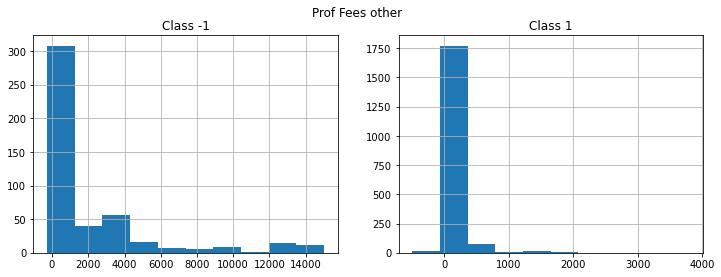

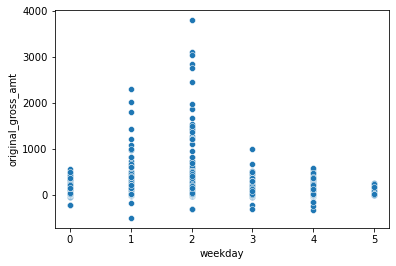

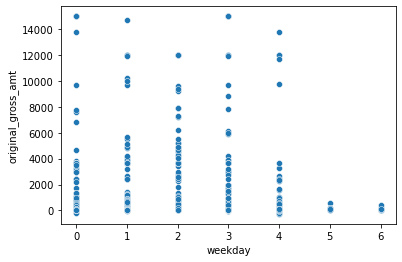

**************************************************


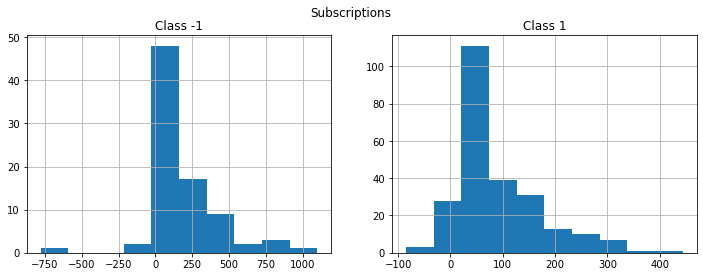

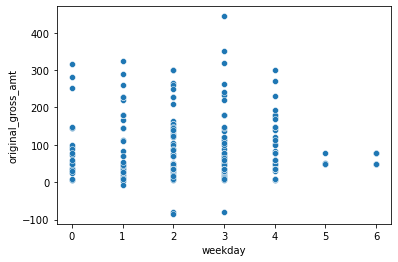

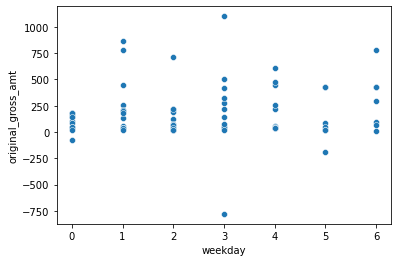

**************************************************


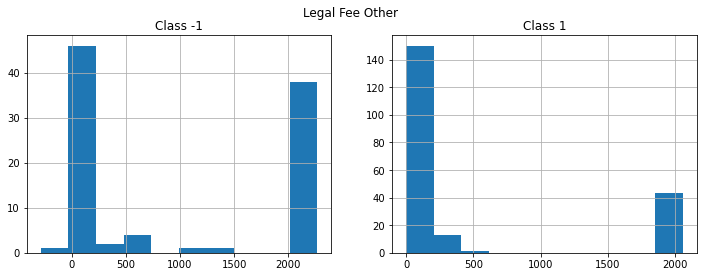

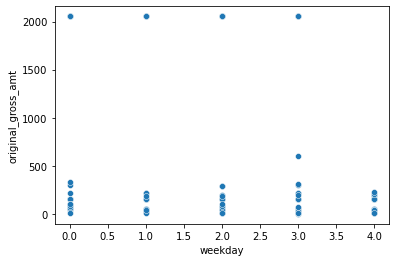

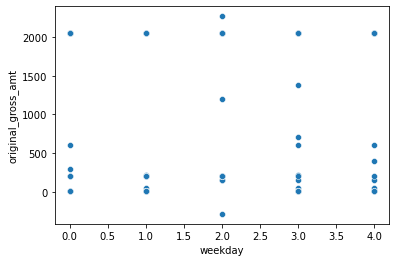

**************************************************


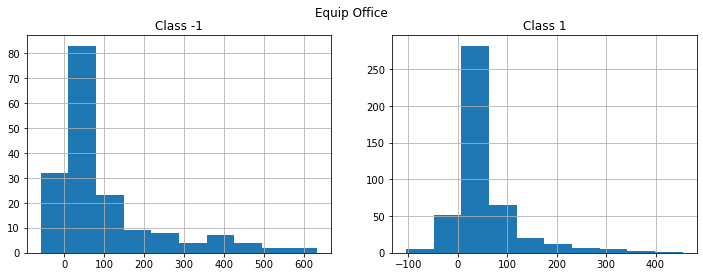

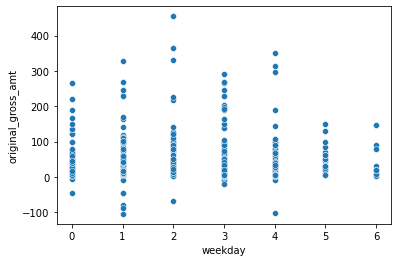

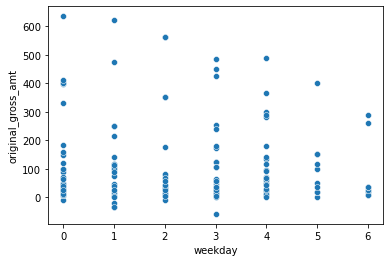

**************************************************


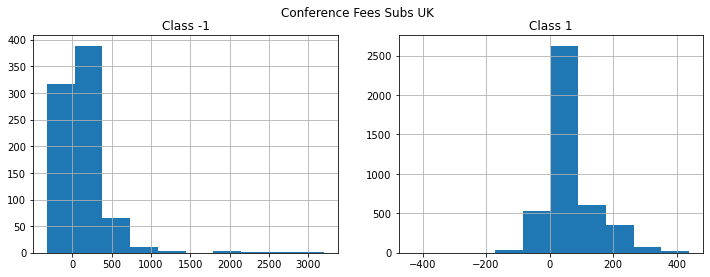

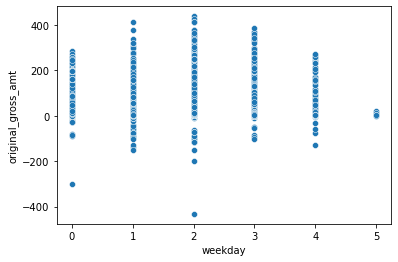

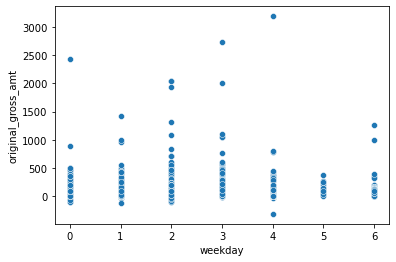

**************************************************


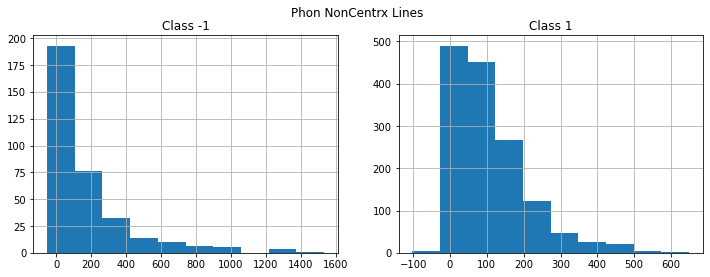

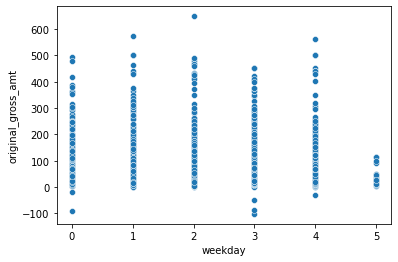

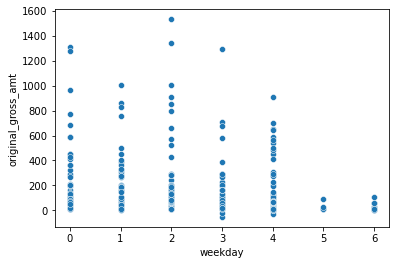

**************************************************


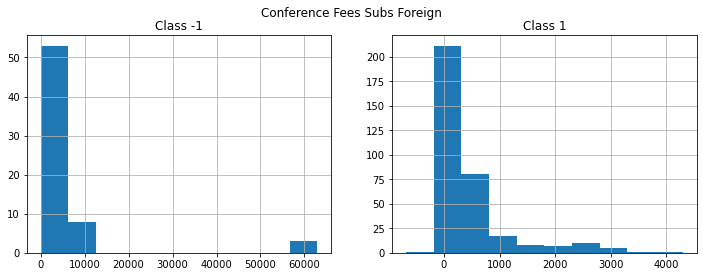

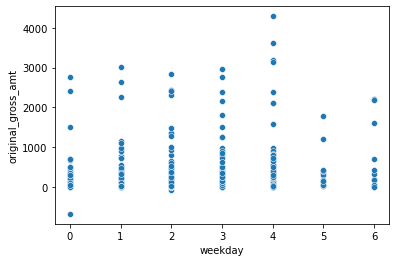

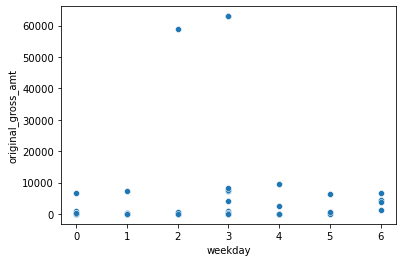

**************************************************


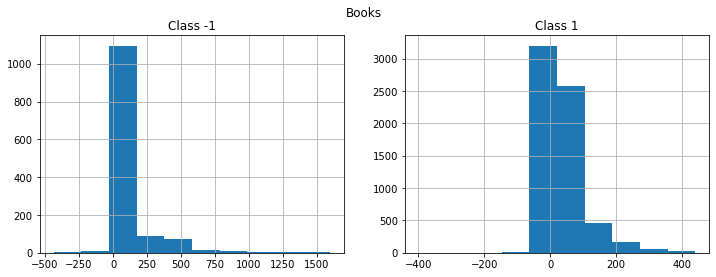

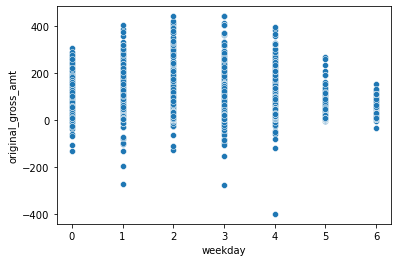

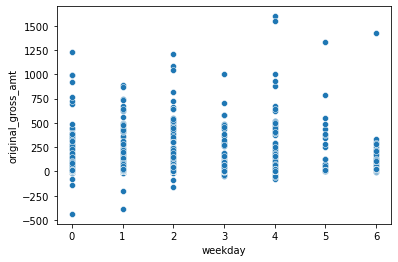

**************************************************


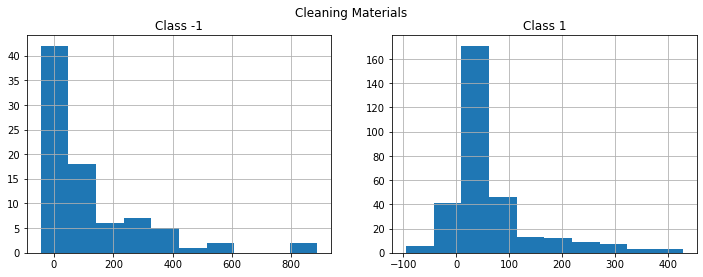

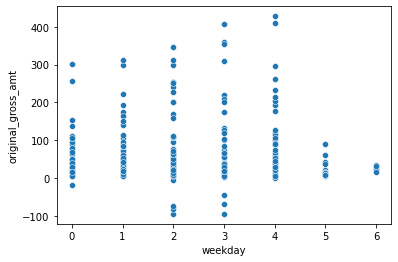

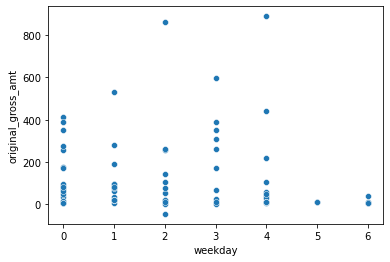

**************************************************


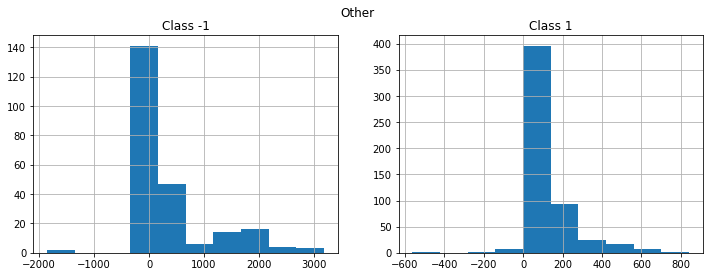

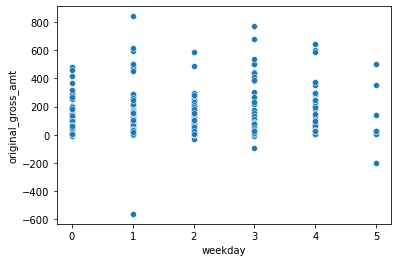

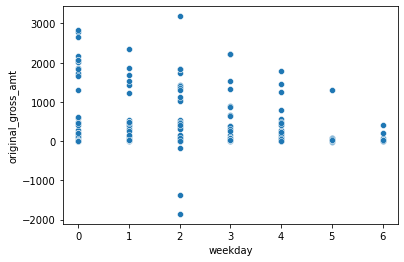

**************************************************


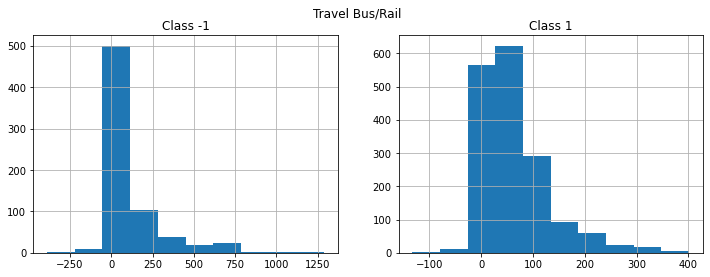

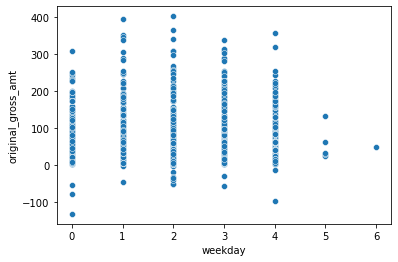

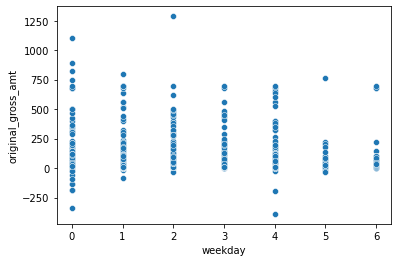

**************************************************


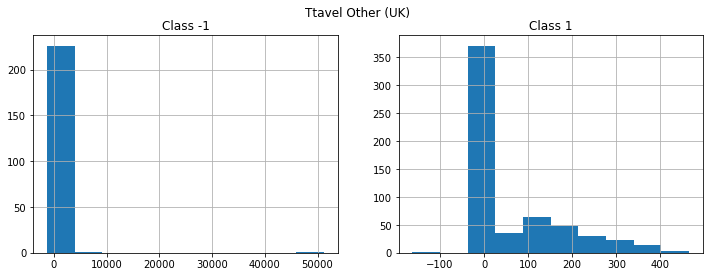

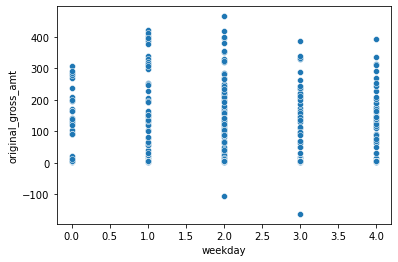

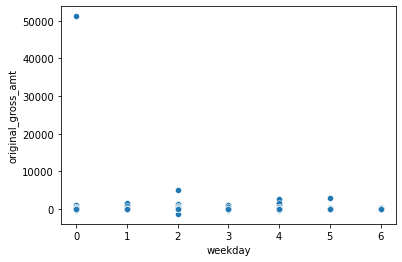

**************************************************


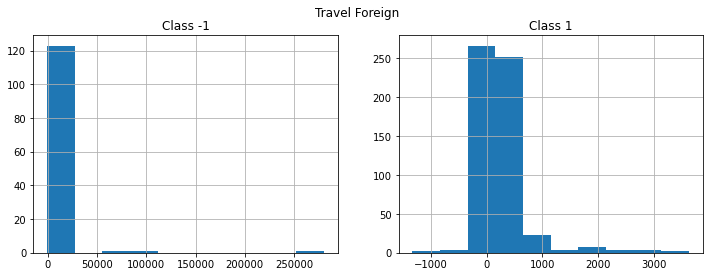

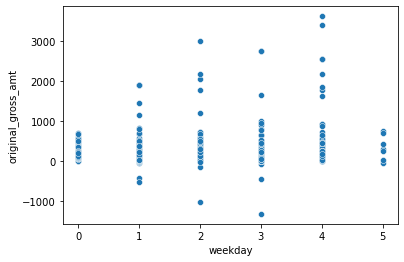

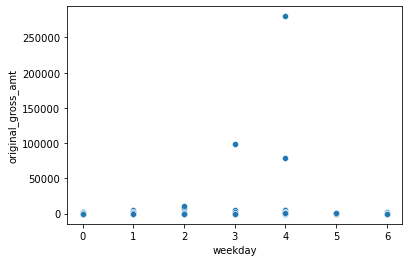

**************************************************


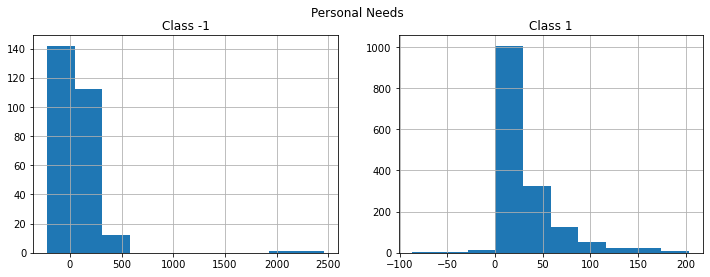

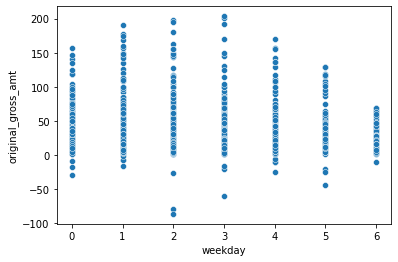

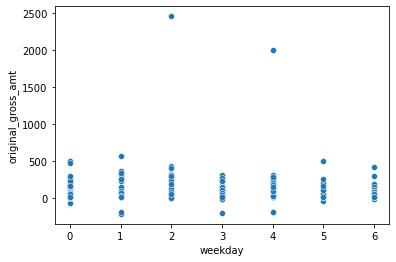

**************************************************


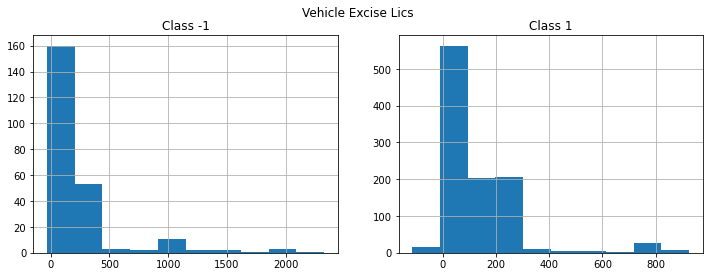

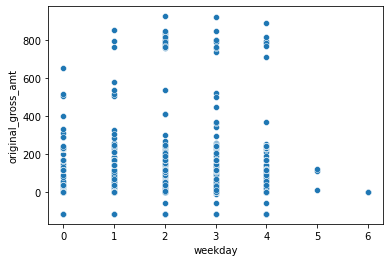

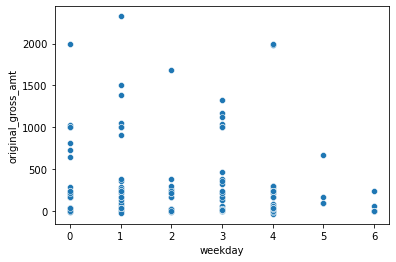

**************************************************


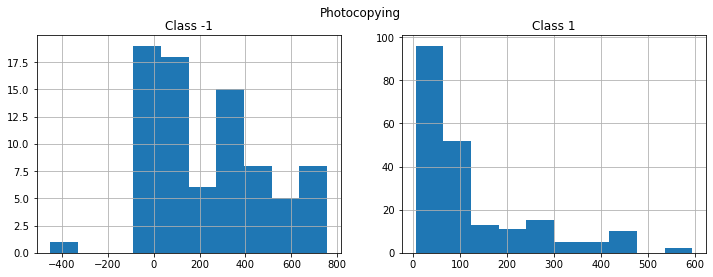

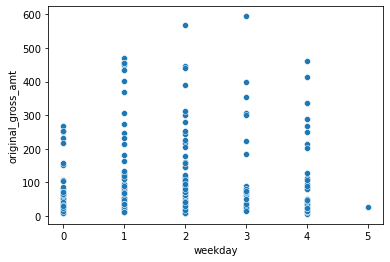

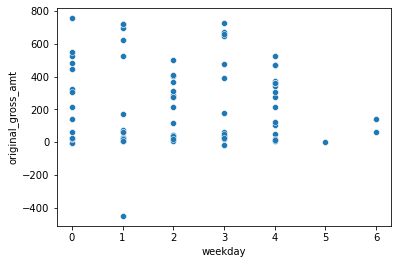

**************************************************


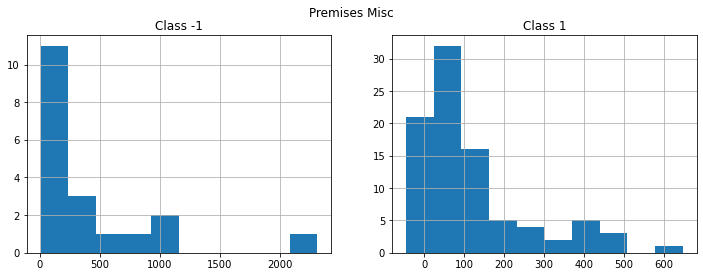

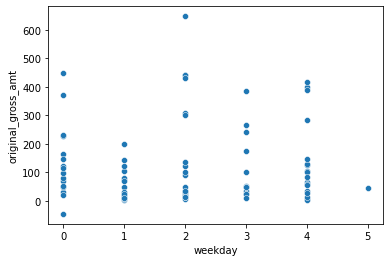

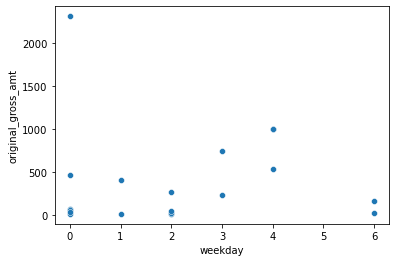

**************************************************


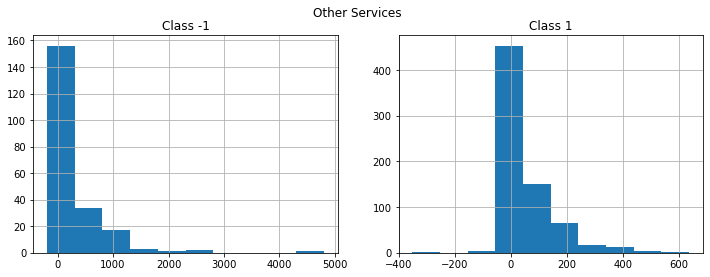

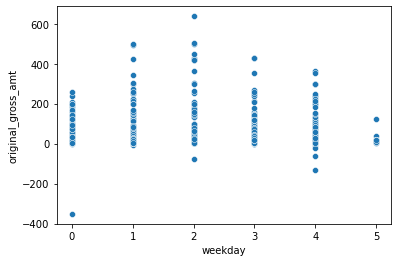

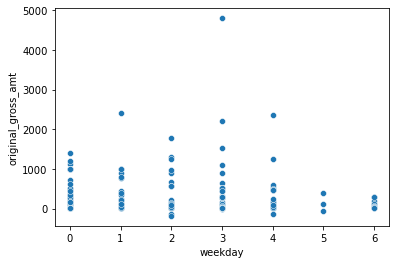

**************************************************


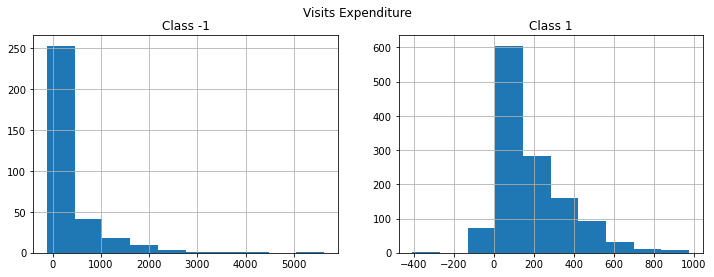

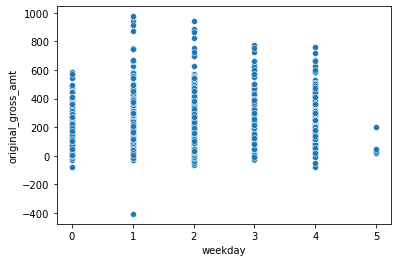

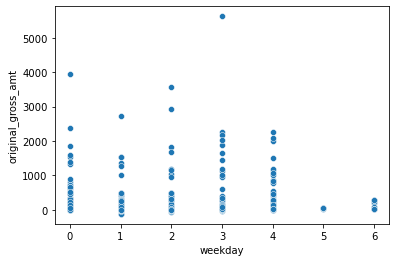

**************************************************


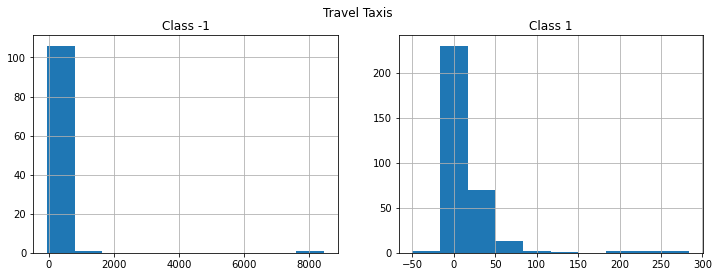

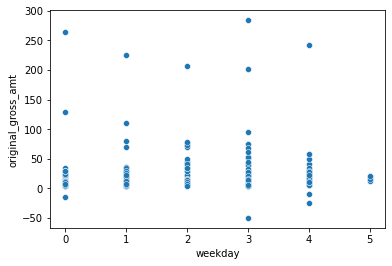

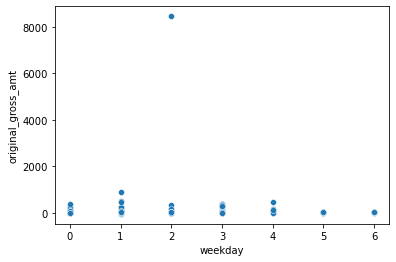

**************************************************


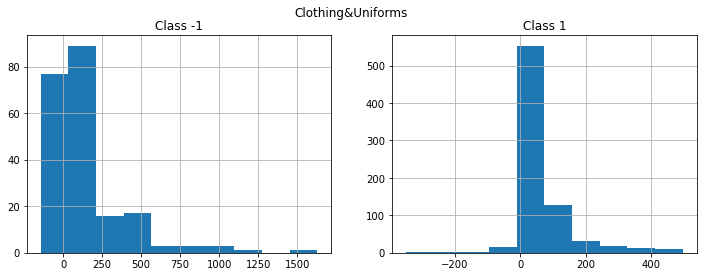

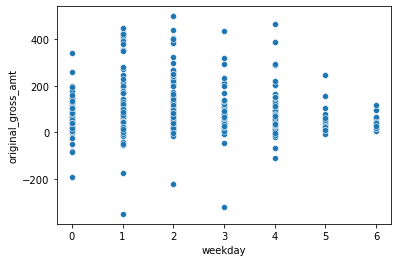

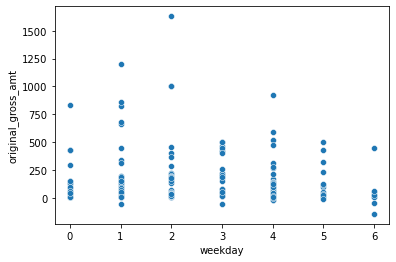

**************************************************


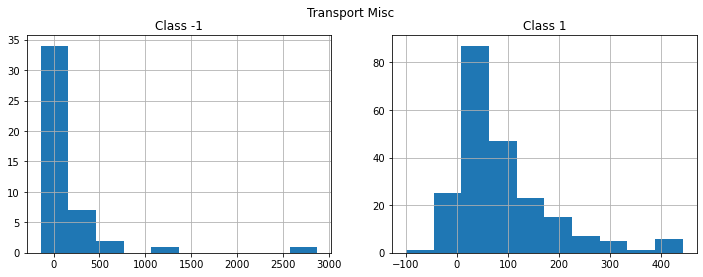

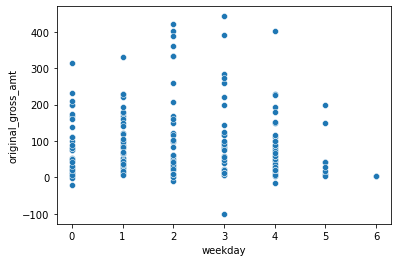

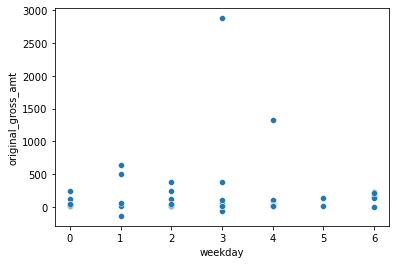

**************************************************


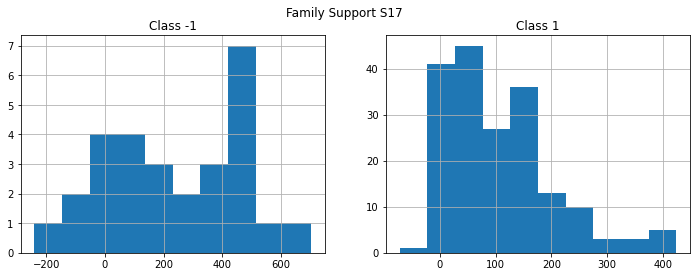

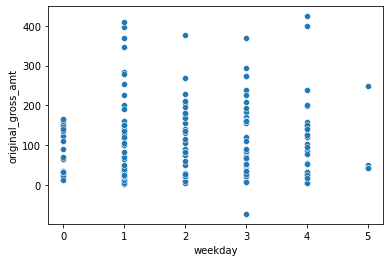

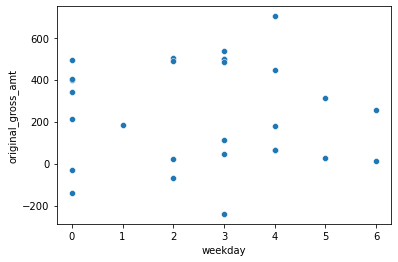

**************************************************


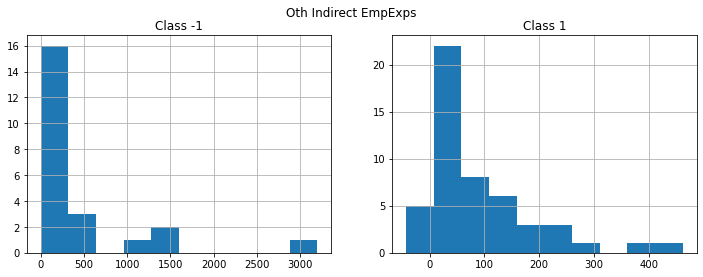

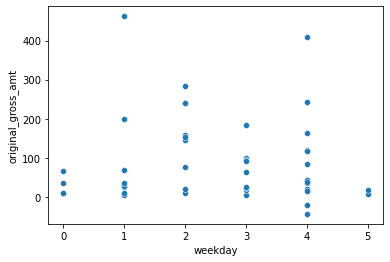

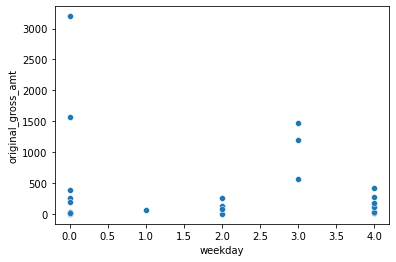

**************************************************


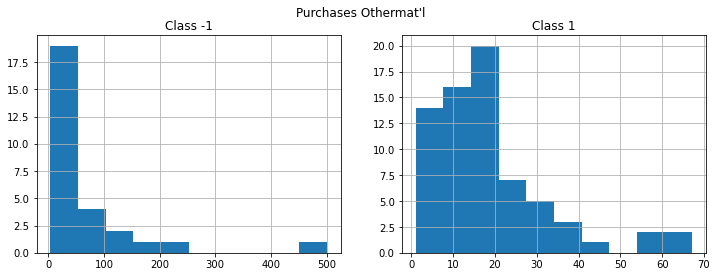

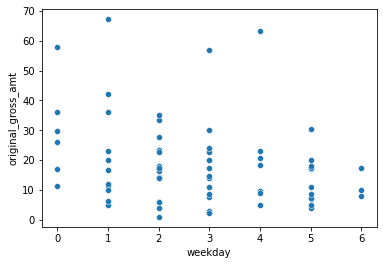

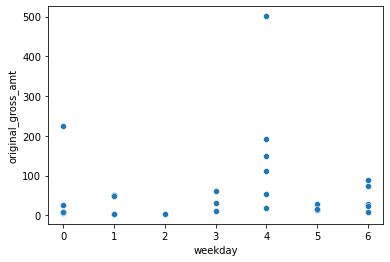

**************************************************


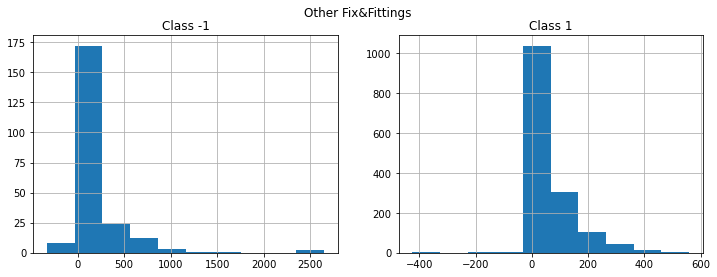

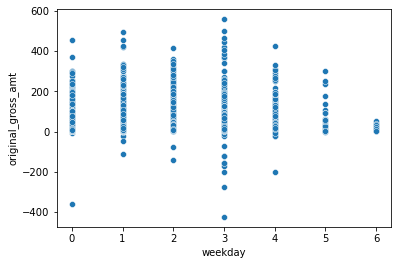

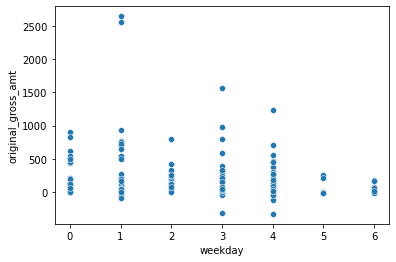

**************************************************


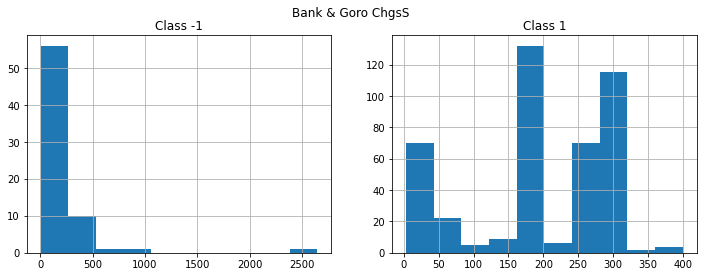

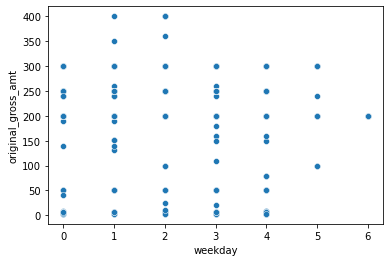

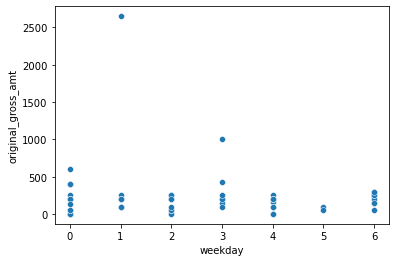

**************************************************


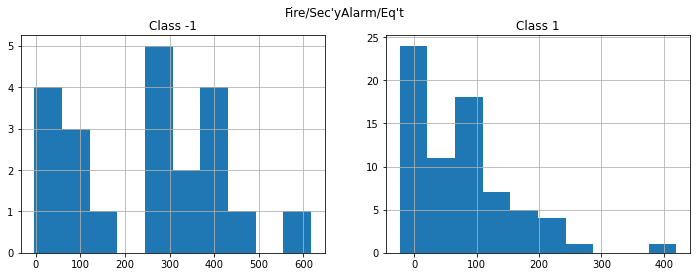

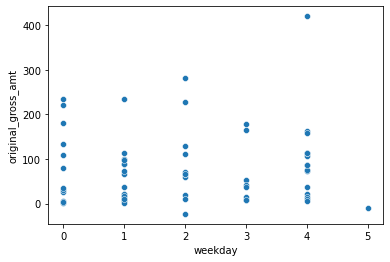

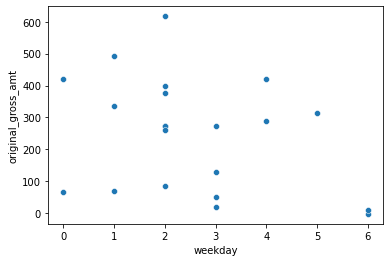

**************************************************


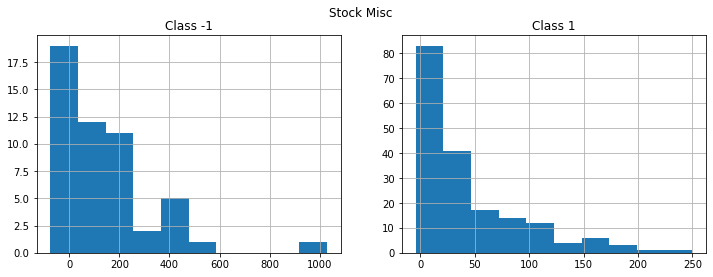

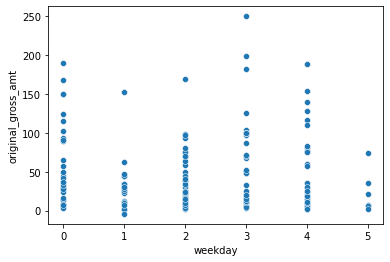

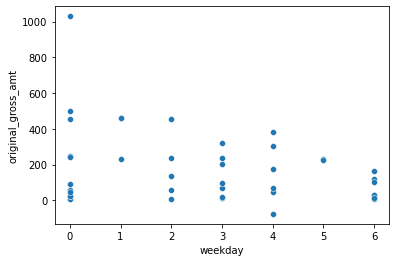

**************************************************


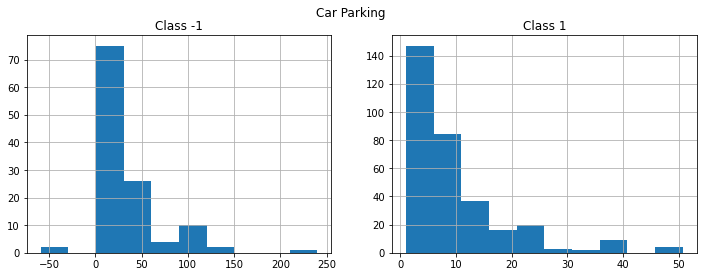

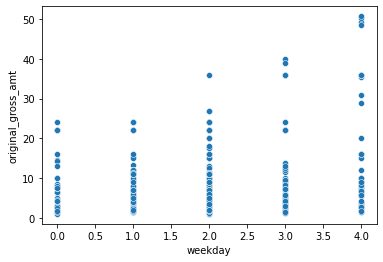

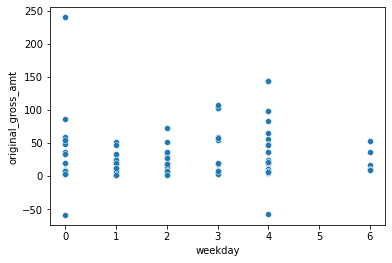

**************************************************


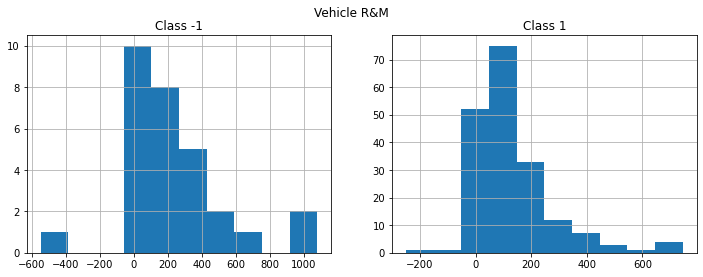

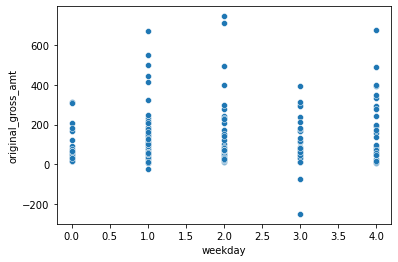

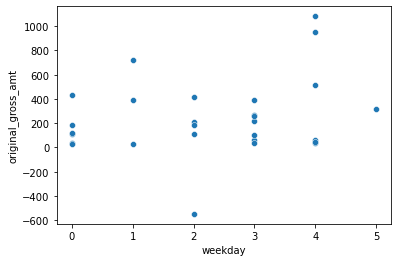

**************************************************


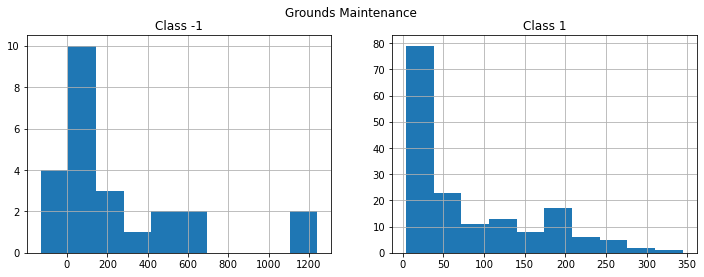

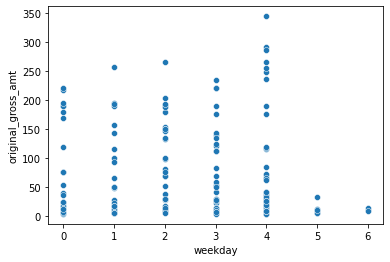

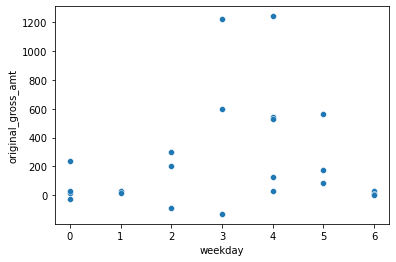

**************************************************


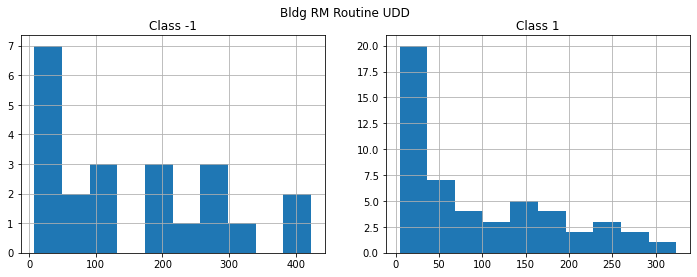

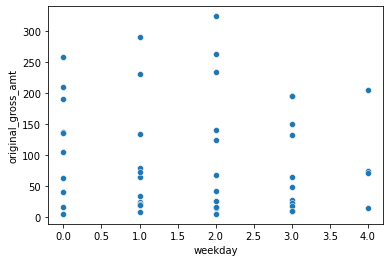

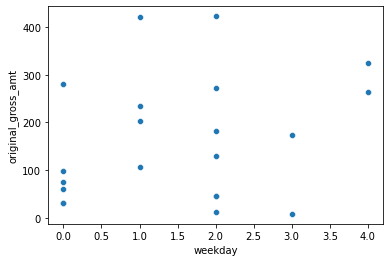

**************************************************


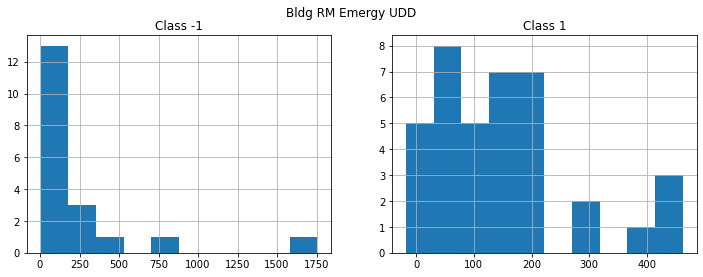

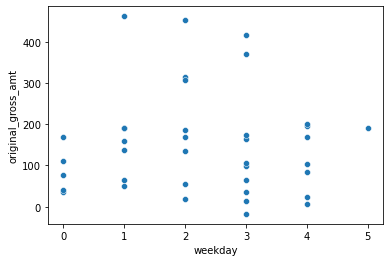

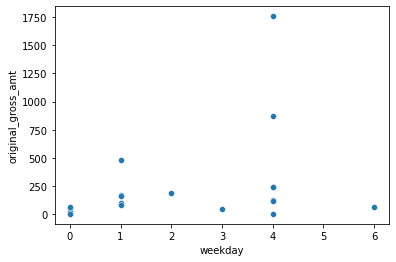

**************************************************


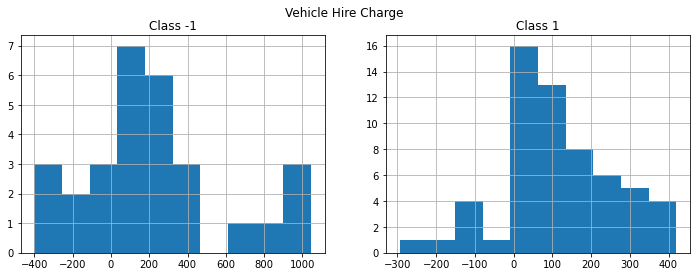

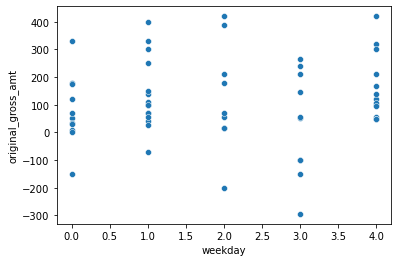

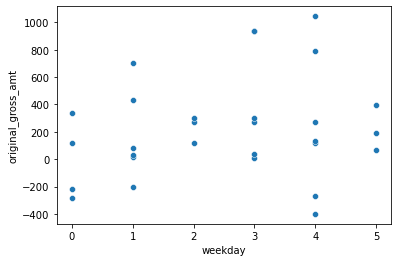

**************************************************


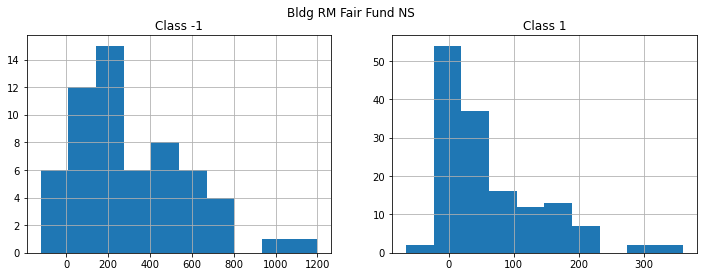

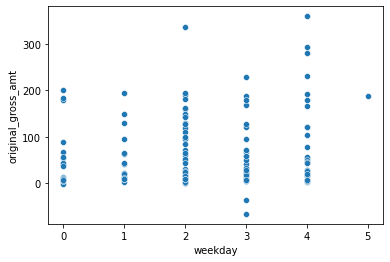

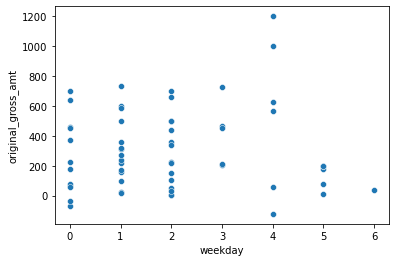

**************************************************


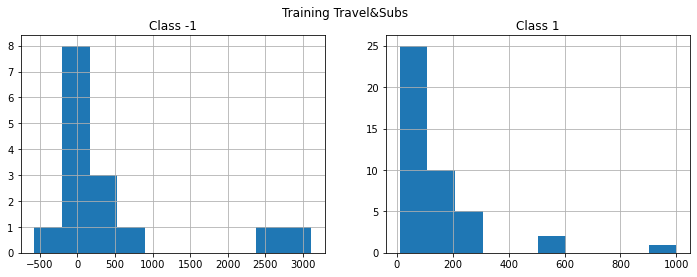

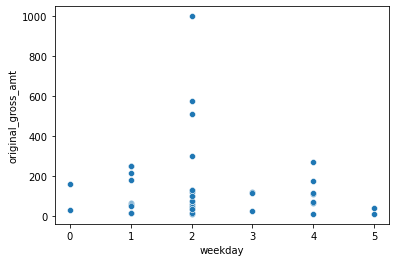

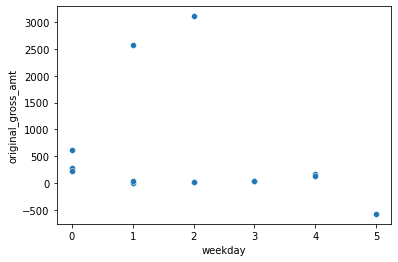

**************************************************


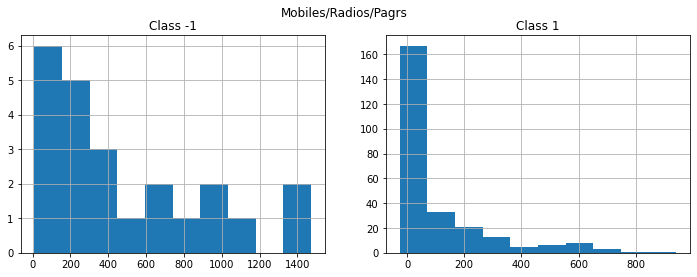

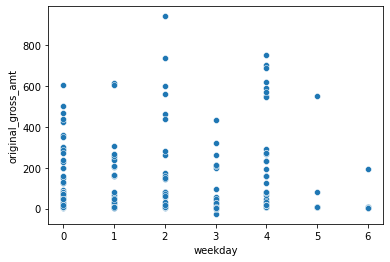

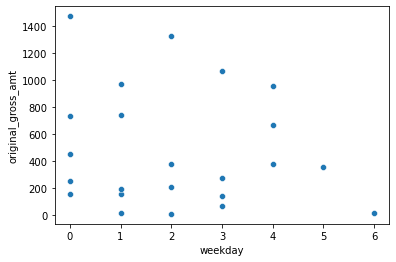

**************************************************


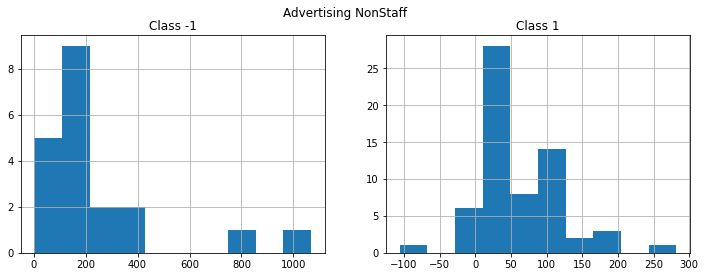

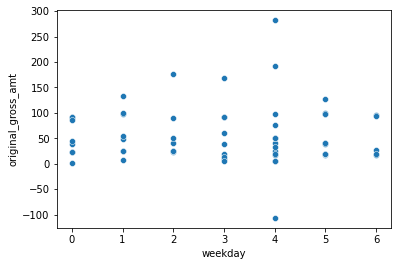

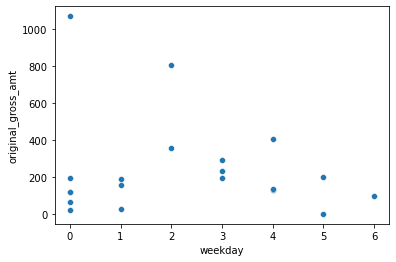

**************************************************


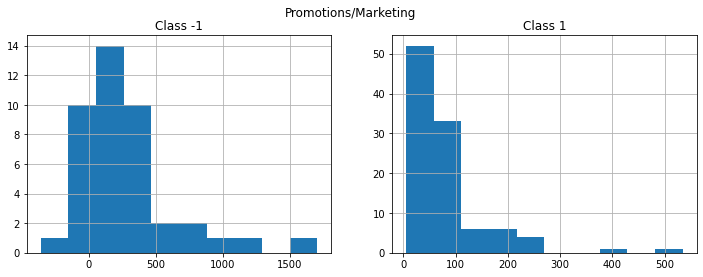

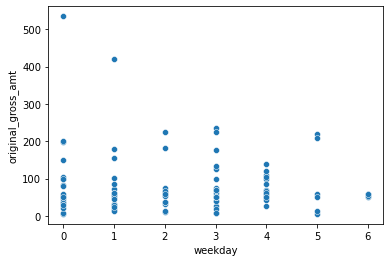

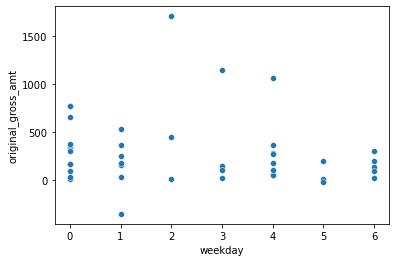

**************************************************


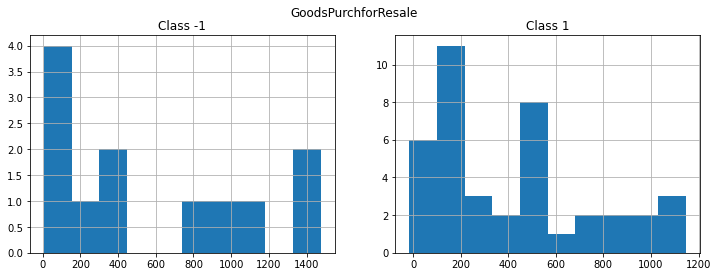

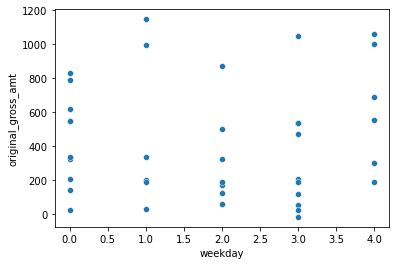

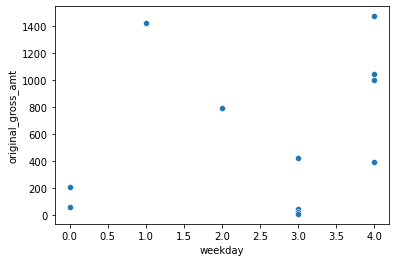

**************************************************


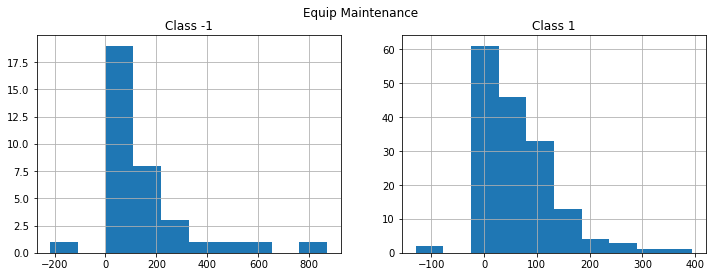

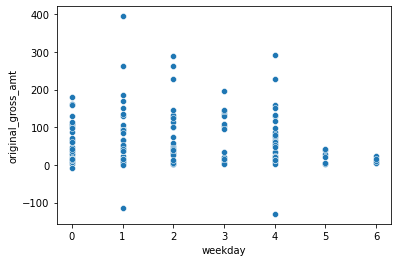

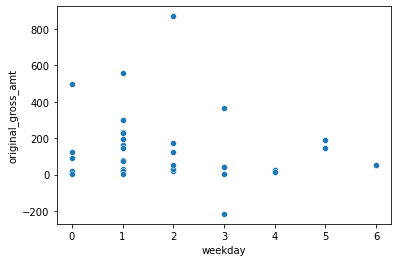

**************************************************


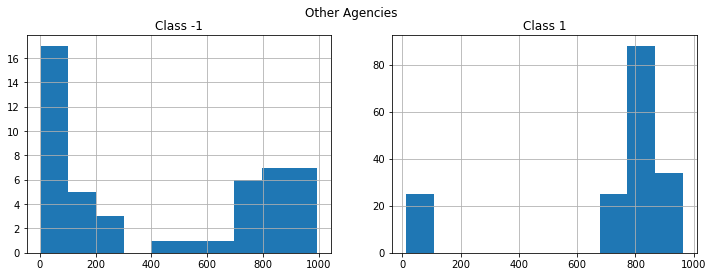

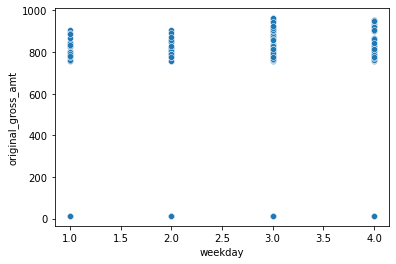

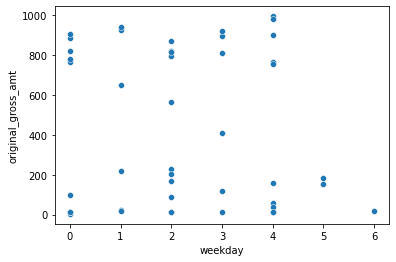

**************************************************


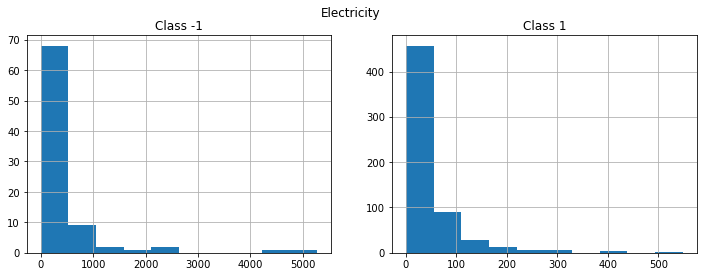

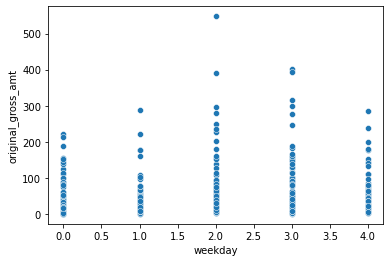

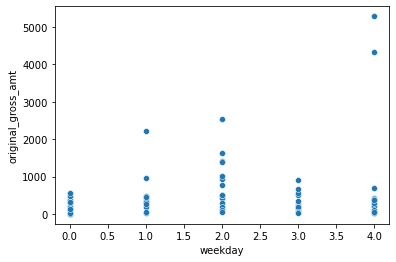

**************************************************


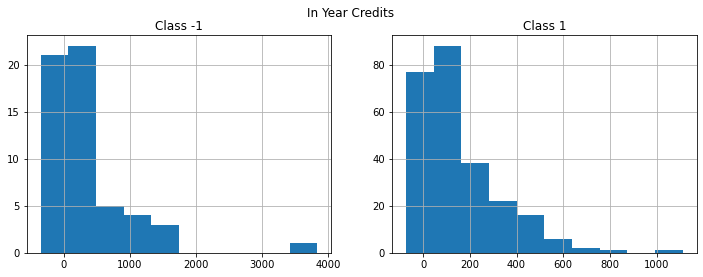

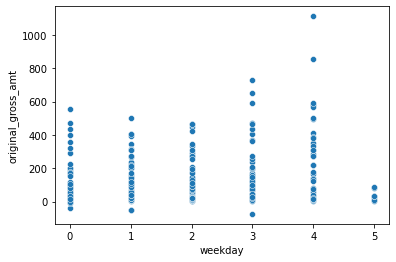

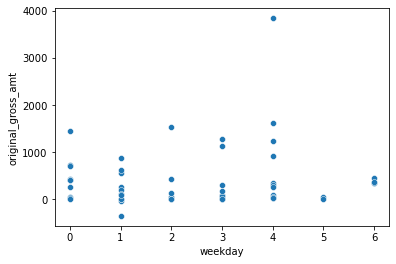

**************************************************


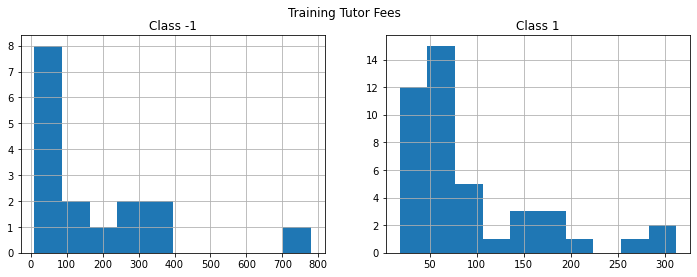

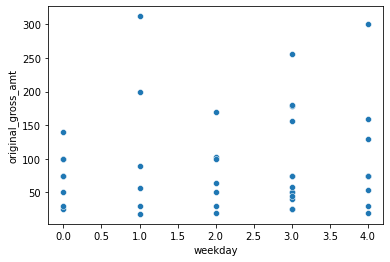

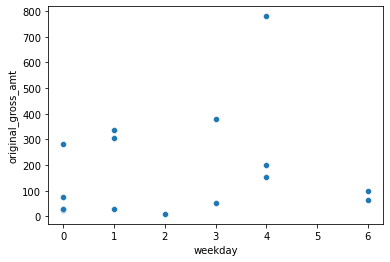

**************************************************


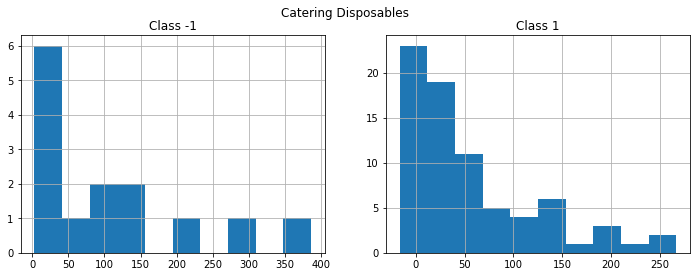

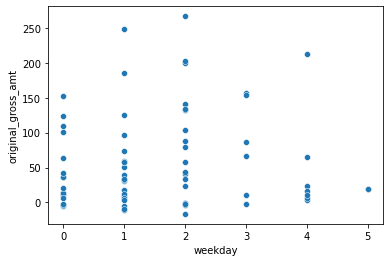

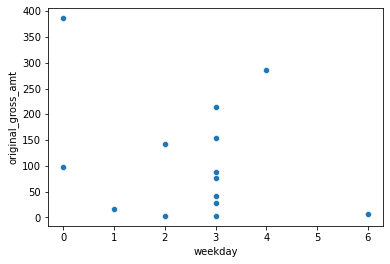

**************************************************


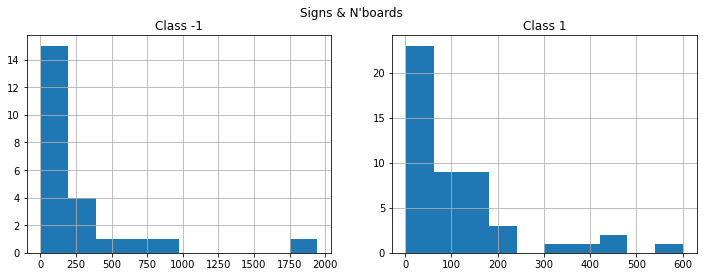

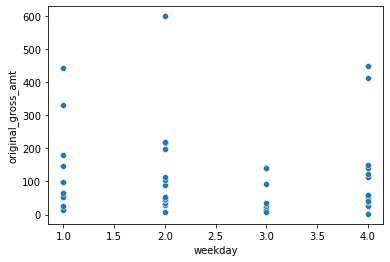

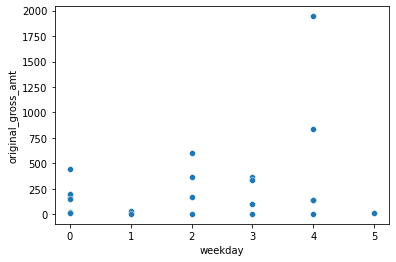

**************************************************


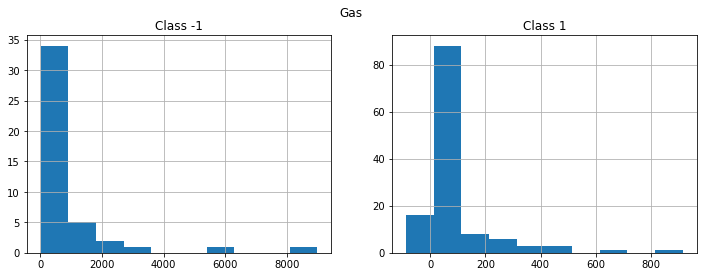

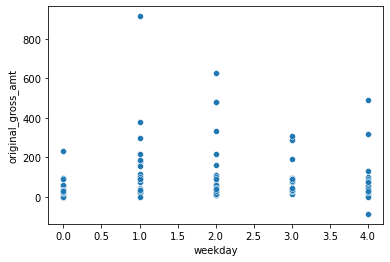

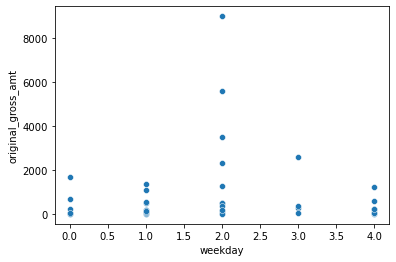

**************************************************


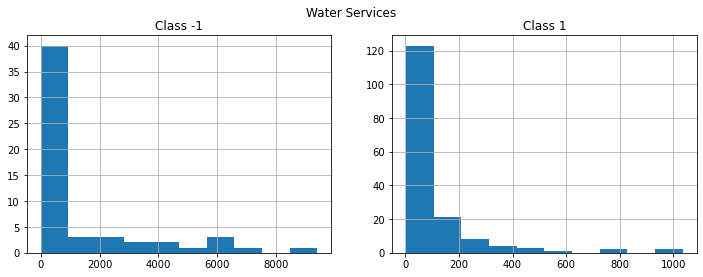

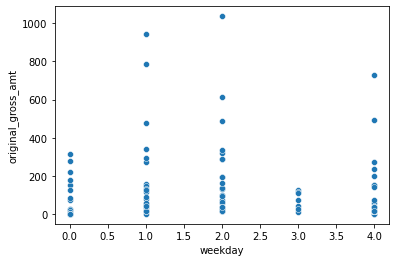

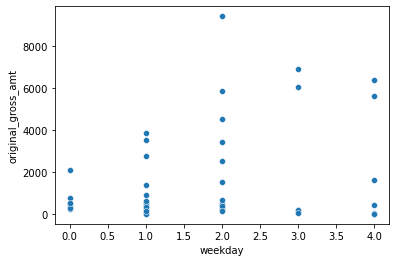

**************************************************


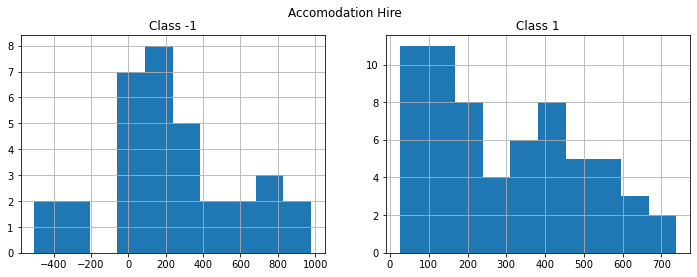

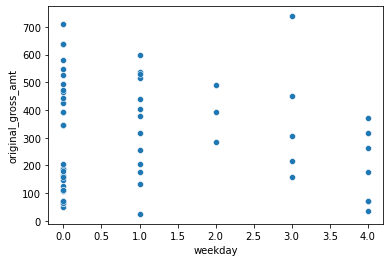

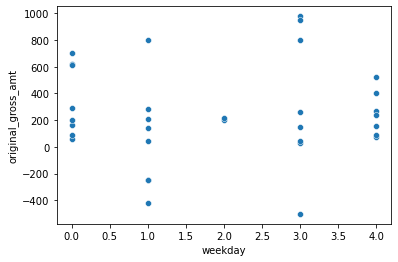

**************************************************


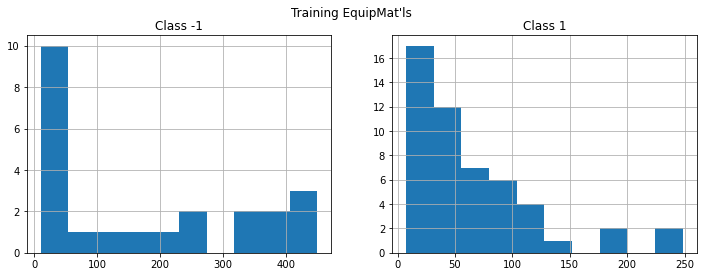

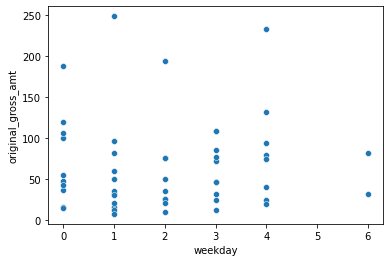

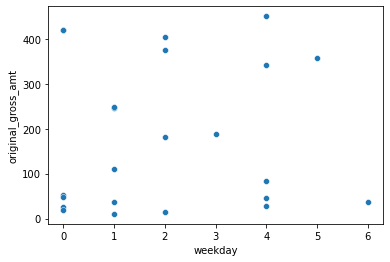

**************************************************


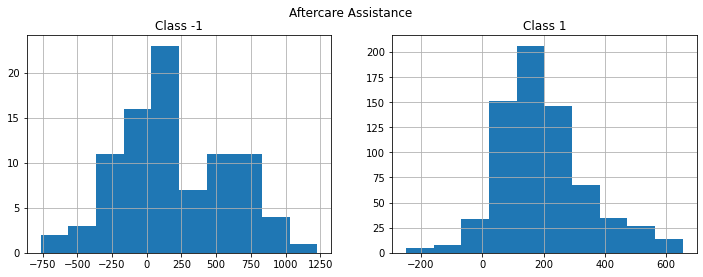

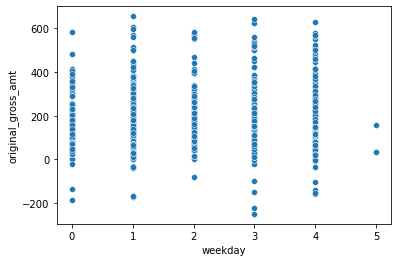

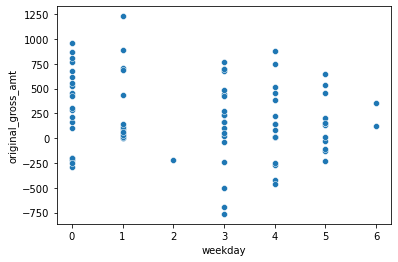

**************************************************


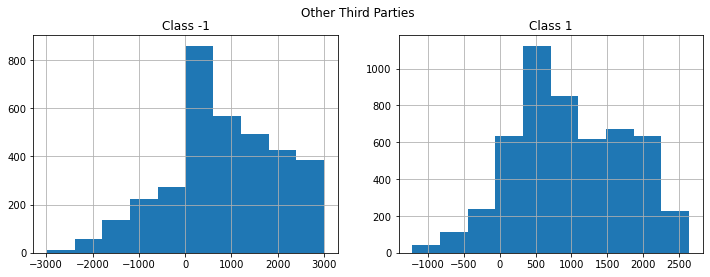

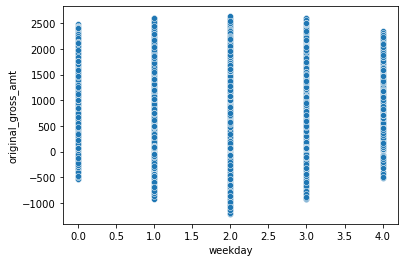

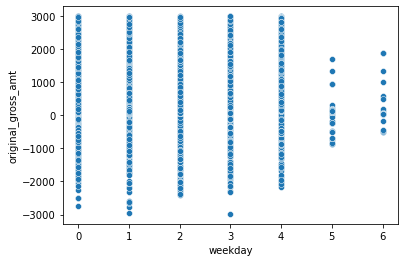

**************************************************


In [92]:
for val in X['trans_cac_desc_1_grouped'].unique():
    X_group = X[X['trans_cac_desc_1_grouped']==val].drop(columns='trans_cac_desc_1_grouped')
    
    ## Save objects
    groups[val] = {}
    groups[val]['X_group'] = X_group
    
    ## Fit model
    forest = IsolationForest(random_state=0)
    forest.fit(X_group)
    
    ## Assign cluster
    data.loc[data['trans_cac_desc_1_grouped']==val, 'cluster'] = forest.predict(X_group)
    
    ## Plot Distribution of original_gross_amt for the distinct classes
    fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,4))
    fig.suptitle(val)
    data[(data['cluster']==-1) & (data['trans_cac_desc_1_grouped']==val)]['original_gross_amt'].hist(ax=ax[0])
    ax[0].set_title('Class -1')
    data[(data['cluster']==1) & (data['trans_cac_desc_1_grouped']==val)]['original_gross_amt'].hist(ax=ax[1])
    ax[1].set_title('Class 1')
    plt.show()
    
    ## Check other features fed into the model
    sns.scatterplot(data=data[(data['cluster']==1) & (data['trans_cac_desc_1_grouped']==val)], x = 'weekday', y='original_gross_amt')
    plt.show()
    sns.scatterplot(data=data[(data['cluster']==-1) & (data['trans_cac_desc_1_grouped']==val)], x = 'weekday', y='original_gross_amt')
    plt.show()
    print('*'*50)


__Comments:__  
- Different than K-means, isolation forest outputs only 2 classes.
- Looking at the distribution of the original_gross_amt for both classes, we can see that most of the time we have 1 class with a distribution more "normal" and low variance and the other very skewed and with high variance.  
- In my opinion this looks like a better solution for the business as:
    - It only outputs 2 classes ( common vs uncommon)
    - The distribution of the original_gross_amt shows clearly differences
    - Only a minority are assigned to the uncommon class

<hr>

## Looking for Bribery
In this section I will look for bribery at merchant level.  
As this data is from the Council, a public entity, there is a risk of people committing/accepting bribery when paying for services the council requires.  
The approach I will use will be:
- First, group the data by merchant and period (monthly or anually) 
- Plot the dataset in two dimmensions to try to find clusters visually
- Use unsupervised algorithms to find unsual payments for merchants

In [96]:
## Get year
data['year'] = data['period']//100

In [158]:
## Check distribution of year
data['year'].value_counts(dropna=False, normalize=True)

2016    0.359764
2017    0.333256
2015    0.306980
Name: year, dtype: float64

In [159]:
## Group data by Merchant, year and trans_cac_desc_1_grouped
X = data.groupby(['merchant_name','trans_cac_desc_1_grouped','year']).agg({'original_gross_amt':['count','sum']})
X.columns =['Q','Amount_mean']
X.reset_index(inplace=True)
X

,merchant_name,trans_cac_desc_1_grouped,year,Q,Amount_mean
0,.carelpress.co.uk,Books,2015,3,174.42
1,.ukgardensupplies.,Equip Operational,2015,1,132.93
2,.ukgardensupplies.,Mat'l Raw/Drct,2016,1,158.95
3,.ukgardensupplies.,Mat'l Raw/Drct,2017,1,115.96
4,.ukgardensupplies.,Other Fix&Fittings,2015,1,700.00
...,...,...,...,...,...
27827,zurich insurance p,Other,2016,1,209.42
27828,zurich insurance p,Other,2017,3,1644.10
27829,zurich insurance p,Prof Fees other,2015,1,42.14
27830,zurich insurance p,Prof Fees other,2016,2,1073.24


In [160]:
# Add column for previous year 
X.sort_values(by=['year'], inplace=True)
X['Amount_mean_1'] = X.groupby(['merchant_name','trans_cac_desc_1_grouped'])['Amount_mean'].shift(1).fillna(0)
X['Amount_mean_over_past'] = X['Amount_mean']/X['Amount_mean_1']
X.loc[X['Amount_mean_1']==0,'Amount_mean_over_past'] = 0 ## Sentinel value

<AxesSubplot:xlabel='Q', ylabel='Amount_mean'>

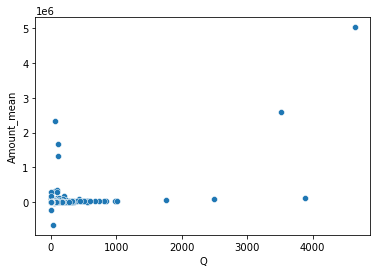

In [161]:
sns.scatterplot(data=X, x = 'Q', y ='Amount_mean')

<AxesSubplot:xlabel='Amount_mean_over_past', ylabel='Amount_mean'>

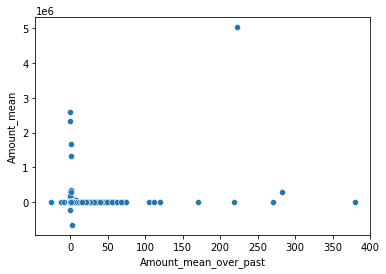

In [162]:
sns.scatterplot(data=X, x = 'Amount_mean_over_past', y ='Amount_mean')

In [163]:
## Add % of purchases of the year for that group of transaction
X['%'] = X.groupby(['year','trans_cac_desc_1_grouped'])['Amount_mean'].transform(lambda x: x/x.sum())

<AxesSubplot:xlabel='%', ylabel='Amount_mean'>

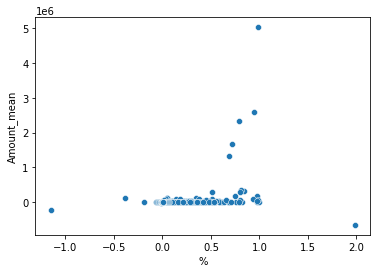

In [164]:
sns.scatterplot(data=X, x = '%', y ='Amount_mean')

In [165]:
## particular purchases
X[X['Amount_mean']<-10000]

,merchant_name,trans_cac_desc_1_grouped,year,Q,Amount_mean,Amount_mean_1,Amount_mean_over_past,%
17378,reservation refund,Other Third Parties,2016,49,-31609.70,0.00,0.000000,-0.011528
5707,direct debit payment than,Supplies & Sev Mic,2016,13,-211704.55,0.00,0.000000,-1.152006
5708,direct debit payment than,Supplies & Sev Mic,2017,35,-654396.78,-211704.55,3.091085,1.986126


In [166]:
X[X['Amount_mean']>200000]

,merchant_name,trans_cac_desc_1_grouped,year,Q,Amount_mean,Amount_mean_1,Amount_mean_over_past,%
8792,hmcourts-service.g,Prof Fees other,2015,74,312669.00,0.00,0.000000,0.836252
21217,the furnishing service,Equip Operational,2015,61,2326762.50,0.00,0.000000,0.794291
22131,travelodge website,Other Third Parties,2016,3517,2594722.68,0.00,0.000000,0.946255
21218,the furnishing service,Equip Operational,2016,115,1682402.32,2326762.50,0.723066,0.714845
8793,hmcourts-service.g,Prof Fees other,2016,103,341394.00,312669.00,1.091870,0.810701
23832,wizz air hun,Travel Foreign,2017,6,283871.46,1006.91,281.923370,0.513328
21219,the furnishing service,Equip Operational,2017,107,1318809.05,1682402.32,0.783884,0.681283
22110,travelodge gb0000,Other Third Parties,2017,4647,5031400.06,22544.00,223.181337,0.984016
8794,hmcourts-service.g,Prof Fees other,2017,103,302861.00,341394.00,0.887130,0.802147


__Comments:__  
- There are some merchants that are getting a very big % of the total purchases for that group transactions.
- This merchants with the highests purchases are the same in the 3 years analyzed.

C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


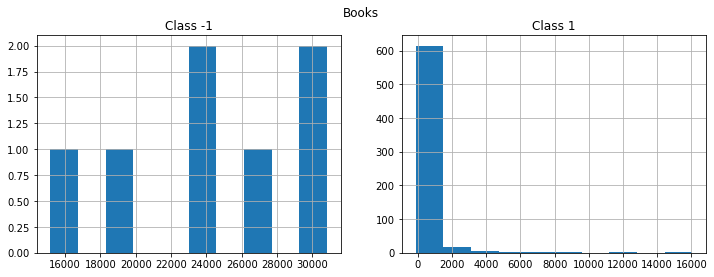

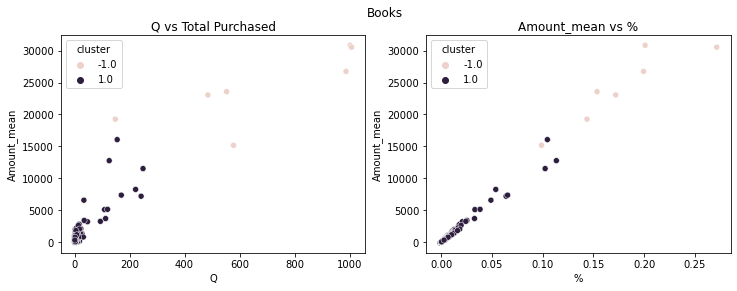

Distribution of usual vs unusual


 1.0    0.989264
-1.0    0.010736
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      7.000000    645.000000
                      mean     680.000000      4.755039
                      std      329.758497     21.065680
                      min      148.000000      1.000000
                      25%      519.000000      1.000000
                      50%      578.000000      1.000000
                      75%      994.500000      2.000000
                      max     1007.000000    249.000000
Amount_mean           count      7.000000    645.000000
                      mean   24163.062857    357.793628
                      std     5749.810237   1191.897847
                      min    15165.360000   -131.250000
                      25%    21153.980000     20.900000
                      50%    23563.780000     65.000000
                      75%    28633.635000    248.660000
                      max    30837.070000  16053.590000
%                     count      7.000000    645.000000
                      mean       0.177146      0.002729
                      std        0.054489      0.009298
                      min        0.098838     -0.001167
                      25%        0.148625      0.000163
                      50%        0.171962      0.000505
                      75%        0.200205      0.001868
                      max        0.271564      0.113460
Amount_mean_over_past count      7.000000    645.000000
                      mean       0.726112      0.566878
                      std        0.720783      2.810999
                      min        0.000000     -0.083333
                      25%        0.000000      0.000000
                      50%        0.978183      0.000000
                      75%        1.170953      0.000000
                      max        1.762695     43.781379

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


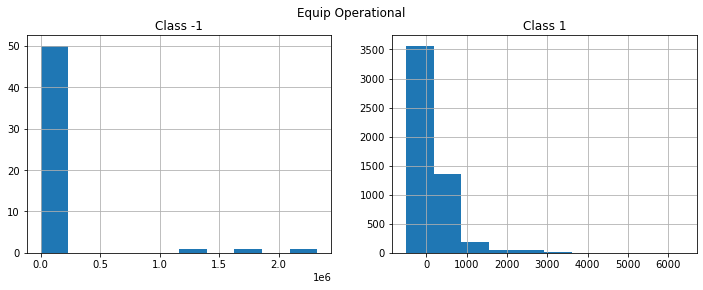

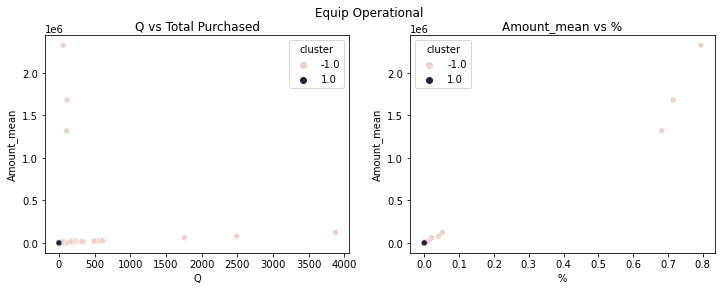

Distribution of usual vs unusual


 1.0    0.989949
-1.0    0.010051
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count  5.300000e+01  5220.000000
                      mean   2.833019e+02     2.546552
                      std    6.537326e+02     4.779276
                      min    1.000000e+00     1.000000
                      25%    4.800000e+01     1.000000
                      50%    7.600000e+01     1.000000
                      75%    1.910000e+02     2.000000
                      max    3.876000e+03   104.000000
Amount_mean           count  5.300000e+01  5220.000000
                      mean   1.131964e+05   233.571144
                      std    4.237022e+05   444.085572
                      min    1.920100e+02  -505.040000
                      25%    4.322730e+03    29.950000
                      50%    6.346890e+03    86.195000
                      75%    1.872028e+04   244.125000
                      max    2.326762e+06  6360.720000
%                     count  5.300000e+01  5220.000000
                      mean   4.682060e-02     0.000099
                      std    1.696016e-01     0.000188
                      min    8.158419e-05    -0.000261
                      25%    1.712778e-03     0.000013
                      50%    3.057519e-03     0.000036
                      75%    7.021999e-03     0.000103
                      max    7.942910e-01     0.002703
Amount_mean_over_past count  5.300000e+01  5220.000000
                      mean   7.037382e+00     0.525510
                      std    1.932570e+01     2.358163
                      min    0.000000e+00    -1.000000
                      25%    0.000000e+00     0.000000
                      50%    9.282966e-01     0.000000
                      75%    1.564886e+00     0.000000
                      max    1.115139e+02    57.165829

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


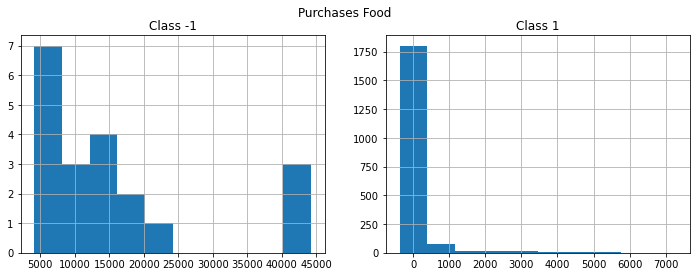

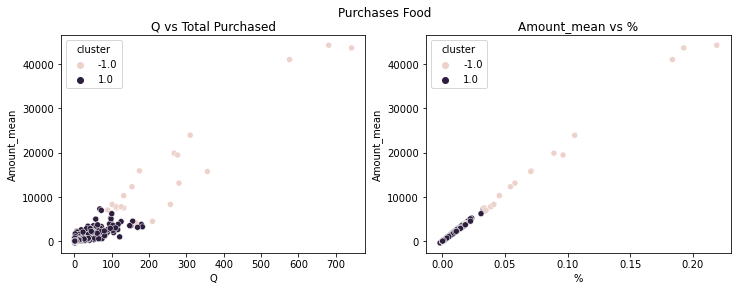

Distribution of usual vs unusual


 1.0    0.989832
-1.0    0.010168
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count     20.000000  1947.000000
                      mean     262.400000     5.370827
                      std      192.205044    15.903070
                      min       89.000000     1.000000
                      25%      130.250000     1.000000
                      50%      191.500000     1.000000
                      75%      287.500000     3.000000
                      max      742.000000   182.000000
Amount_mean           count     20.000000  1947.000000
                      mean   16128.951000   169.319358
                      std    12739.234435   575.445008
                      min     4135.690000  -379.000000
                      25%     7715.102500     8.320000
                      50%    11306.635000    24.130000
                      75%    19571.727500    81.865000
                      max    44260.630000  7297.990000
%                     count     20.000000  1947.000000
                      mean       0.074248     0.000778
                      std        0.058848     0.002655
                      min        0.018249    -0.001875
                      25%        0.037577     0.000038
                      50%        0.049892     0.000109
                      75%        0.090820     0.000378
                      max        0.218958     0.034468
Amount_mean_over_past count     20.000000  1947.000000
                      mean       0.874556     0.537818
                      std        0.759469     2.483067
                      min        0.000000    -8.813953
                      25%        0.000000     0.000000
                      50%        0.823112     0.000000
                      75%        1.255687     0.110262
                      max        2.447408    48.941176

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


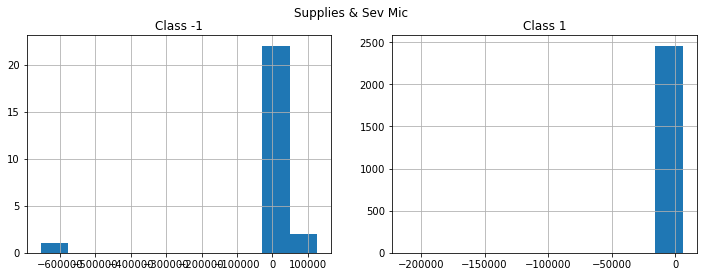

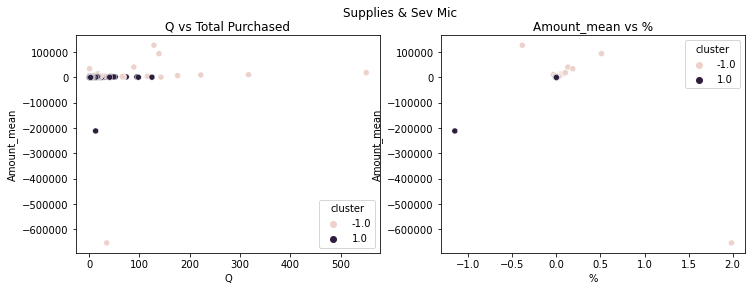

Distribution of usual vs unusual


 1.0    0.98994
-1.0    0.01006
Name: cluster, dtype: float64

cluster                               -1.0            1.0
Q                     count      25.000000    2460.000000
                      mean       92.640000       2.537398
                      std       123.759134       5.629743
                      min         1.000000       1.000000
                      25%        18.000000       1.000000
                      50%        42.000000       1.000000
                      75%       129.000000       2.000000
                      max       551.000000     125.000000
Amount_mean           count      25.000000    2460.000000
                      mean    -9060.812000     160.522841
                      std    137742.153506    4298.571908
                      min   -654396.780000 -211704.550000
                      25%      3415.000000      29.965000
                      50%      6067.710000      89.970000
                      75%     13178.000000     252.245000
                      max    127215.000000    5844.000000
%                     count      25.000000    2460.000000
                      mean        0.113472       0.000066
                      std         0.414038       0.023319
                      min        -0.386104      -1.152006
                      25%        -0.005893      -0.000069
                      50%         0.025890       0.000151
                      75%         0.048579       0.000701
                      max         1.986126       0.018607
Amount_mean_over_past count      25.000000    2460.000000
                      mean        3.455459       0.441161
                      std         5.760299       1.797121
                      min         0.000000      -2.000000
                      25%         0.577152       0.000000
                      50%         1.432315       0.000000
                      75%         2.291725       0.000000
                      max        22.000000      39.676301

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


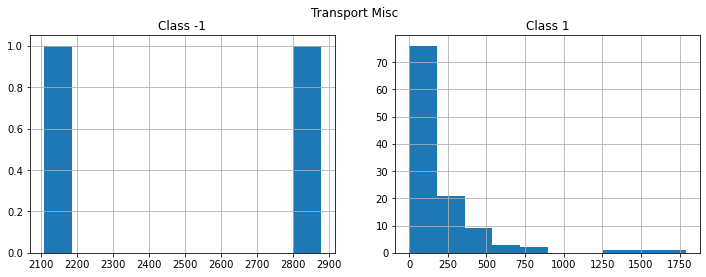

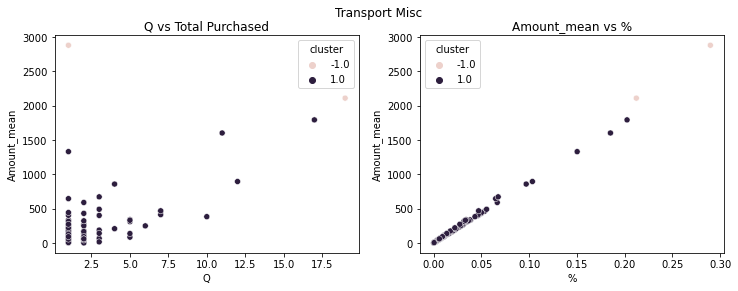

Distribution of usual vs unusual


 1.0    0.982759
-1.0    0.017241
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   114.000000
                      mean     10.000000     2.122807
                      std      12.727922     2.496512
                      min       1.000000     1.000000
                      25%       5.500000     1.000000
                      50%      10.000000     1.000000
                      75%      14.500000     2.000000
                      max      19.000000    17.000000
Amount_mean           count     2.000000   114.000000
                      mean   2493.165000   196.884123
                      std     544.521719   290.644600
                      min    2108.130000     0.000000
                      25%    2300.647500    27.935000
                      50%    2493.165000    96.240000
                      75%    2685.682500   249.550000
                      max    2878.200000  1791.390000
%                     count     2.000000   114.000000
                      mean      0.250948     0.021913
                      std       0.054809     0.032869
                      min       0.212193     0.000000
                      25%       0.231571     0.003157
                      50%       0.250948     0.010811
                      75%       0.270326     0.028034
                      max       0.289704     0.202464
Amount_mean_over_past count     2.000000   114.000000
                      mean      2.756374     0.720103
                      std       3.898102     2.386406
                      min       0.000000     0.000000
                      25%       1.378187     0.000000
                      50%       2.756374     0.000000
                      75%       4.134561     0.098701
                      max       5.512748    21.998000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


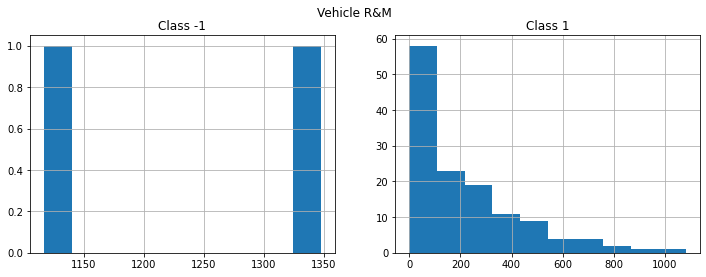

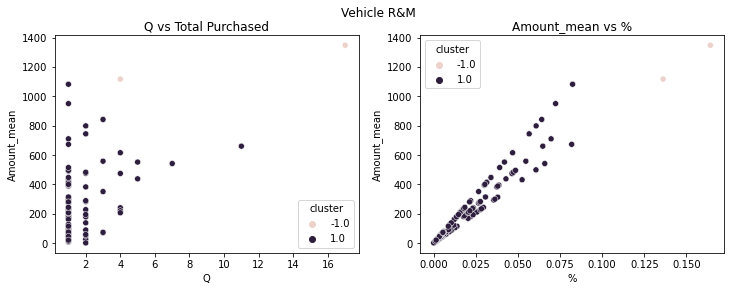

Distribution of usual vs unusual


 1.0    0.985075
-1.0    0.014925
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   132.000000
                      mean     10.500000     1.492424
                      std       9.192388     1.287024
                      min       4.000000     1.000000
                      25%       7.250000     1.000000
                      50%      10.500000     1.000000
                      75%      13.750000     1.000000
                      max      17.000000    11.000000
Amount_mean           count     2.000000   132.000000
                      mean   1232.150000   220.055000
                      std     162.846692   217.886480
                      min    1117.000000     0.000000
                      25%    1174.575000    57.355000
                      50%    1232.150000   167.750000
                      75%    1289.725000   312.202500
                      max    1347.300000  1081.580000
%                     count     2.000000   132.000000
                      mean      0.150164     0.020452
                      std       0.019846     0.019521
                      min       0.136130     0.000000
                      25%       0.143147     0.004812
                      50%       0.150164     0.013704
                      75%       0.157181     0.030264
                      max       0.164197     0.082423
Amount_mean_over_past count     2.000000   132.000000
                      mean      0.000000     0.404552
                      std       0.000000     1.362908
                      min       0.000000     0.000000
                      25%       0.000000     0.000000
                      50%       0.000000     0.000000
                      75%       0.000000     0.000000
                      max       0.000000     9.893000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


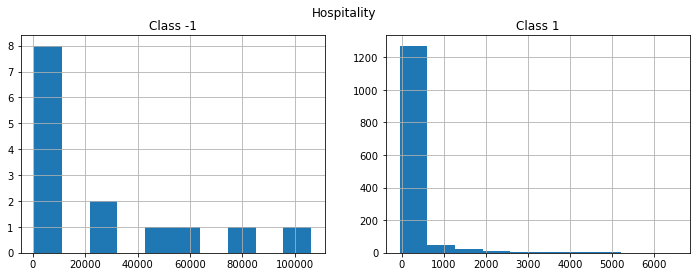

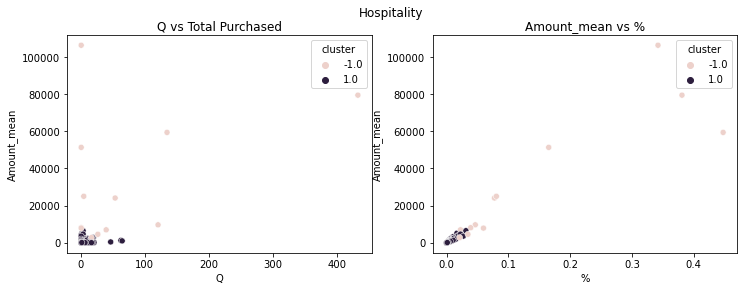

Distribution of usual vs unusual


 1.0    0.989833
-1.0    0.010167
Name: cluster, dtype: float64

cluster                               -1.0          1.0
Q                     count      14.000000  1363.000000
                      mean       59.928571     2.159941
                      std       116.236804     3.628806
                      min         1.000000     1.000000
                      25%         1.000000     1.000000
                      50%        11.000000     1.000000
                      75%        50.500000     2.000000
                      max       433.000000    65.000000
Amount_mean           count      14.000000  1363.000000
                      mean    27725.352857   193.513522
                      std     33424.276308   474.569851
                      min       600.000000   -48.450000
                      25%      5192.570000    14.965000
                      50%      8909.740000    47.000000
                      75%     44769.385000   162.715000
                      max    106289.880000  6526.000000
%                     count      14.000000  1363.000000
                      mean        0.123619     0.000931
                      std         0.151365     0.002295
                      min         0.004521    -0.000232
                      25%         0.025547     0.000065
                      50%         0.053084     0.000224
                      75%         0.144110     0.000757
                      max         0.447529     0.031294
Amount_mean_over_past count      14.000000  1363.000000
                      mean        5.670498     0.308200
                      std        16.305658     1.308640
                      min         0.000000     0.000000
                      25%         0.000000     0.000000
                      50%         0.000000     0.000000
                      75%         1.289580     0.000000
                      max        61.224490    27.235294

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


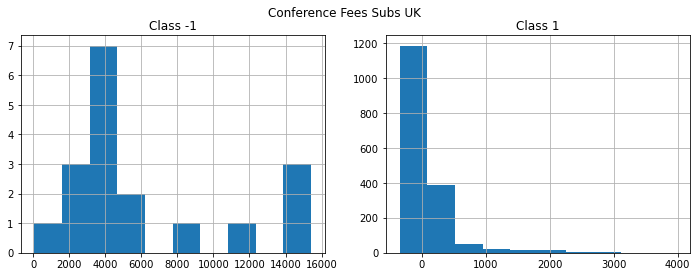

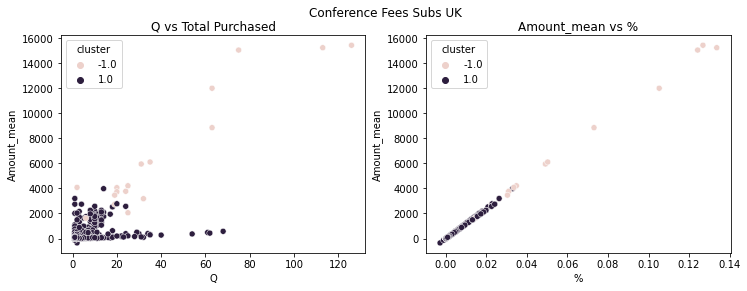

Distribution of usual vs unusual


 1.0    0.98943
-1.0    0.01057
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count     18.000000  1685.000000
                      mean      39.333333     2.557270
                      std       35.195254     4.672640
                      min        2.000000     1.000000
                      25%       19.250000     1.000000
                      50%       25.000000     1.000000
                      75%       56.000000     2.000000
                      max      126.000000    68.000000
Amount_mean           count     18.000000  1685.000000
                      mean    6196.695000   145.333270
                      std     4937.573961   364.267818
                      min       68.560000  -349.200000
                      25%     3249.100000     8.800000
                      50%     4067.525000    28.450000
                      75%     8161.465000   102.490000
                      max    15419.260000  3978.300000
%                     count     18.000000  1685.000000
                      mean       0.052068     0.001224
                      std        0.041978     0.003072
                      min        0.000564    -0.002873
                      25%        0.027297     0.000074
                      50%        0.033540     0.000238
                      75%        0.067388     0.000868
                      max        0.133680     0.032875
Amount_mean_over_past count     18.000000  1685.000000
                      mean       5.034264     0.346917
                      std       11.847462     1.306975
                      min        0.000000     0.000000
                      25%        0.000000     0.000000
                      50%        0.696690     0.000000
                      75%        3.647324     0.000000
                      max       48.281690    18.616595

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


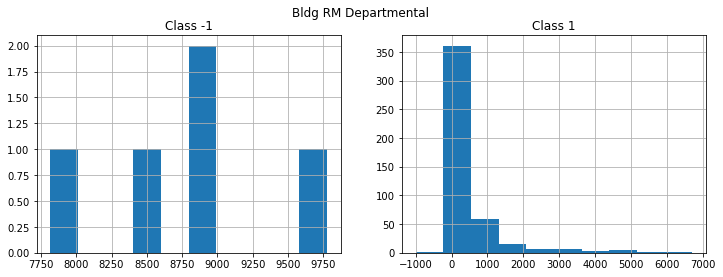

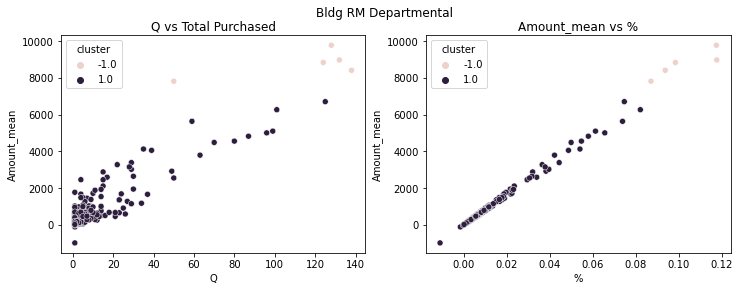

Distribution of usual vs unusual


 1.0    0.989224
-1.0    0.010776
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     5.000000   459.000000
                      mean    114.400000     5.605664
                      std      36.370318    13.628382
                      min      50.000000     1.000000
                      25%     124.000000     1.000000
                      50%     128.000000     1.000000
                      75%     132.000000     3.500000
                      max     138.000000   125.000000
Amount_mean           count     5.000000   459.000000
                      mean   8763.108000   447.650458
                      std     724.202403   901.704362
                      min    7816.730000 -1000.000000
                      25%    8410.340000    37.590000
                      50%    8836.500000   126.520000
                      75%    8975.250000   437.045000
                      max    9776.720000  6701.770000
%                     count     5.000000   459.000000
                      mean      0.102856     0.005416
                      std       0.014028     0.011016
                      min       0.087055    -0.011137
                      25%       0.093666     0.000449
                      50%       0.098412     0.001551
                      75%       0.117479     0.005327
                      max       0.117669     0.082101
Amount_mean_over_past count     5.000000   459.000000
                      mean      1.266417     0.642790
                      std       0.840060     2.802187
                      min       0.000000     0.000000
                      25%       1.106402     0.000000
                      50%       1.343018     0.000000
                      75%       1.569519     0.171232
                      max       2.313148    39.264984

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


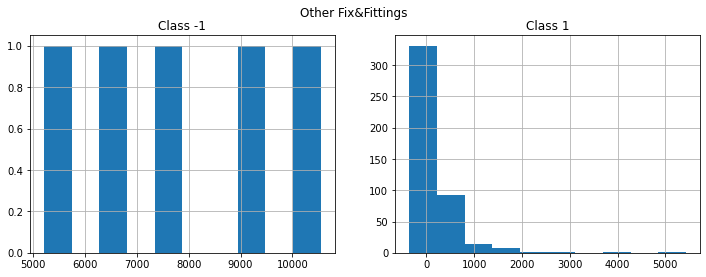

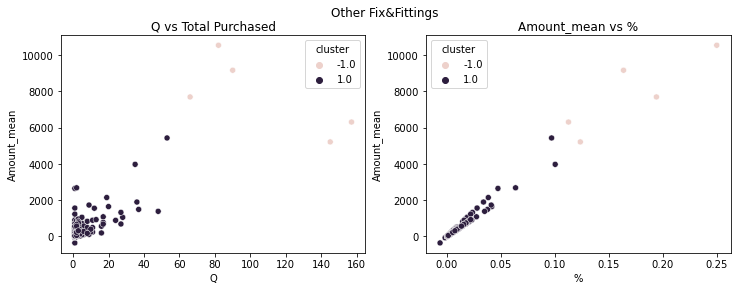

Distribution of usual vs unusual


 1.0    0.989011
-1.0    0.010989
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count      5.000000   450.000000
                      mean     108.000000     2.675556
                      std       40.416581     5.487916
                      min       66.000000     1.000000
                      25%       82.000000     1.000000
                      50%       90.000000     1.000000
                      75%      145.000000     2.000000
                      max      157.000000    53.000000
Amount_mean           count      5.000000   450.000000
                      mean    7785.430000   219.909889
                      std     2140.995123   453.739642
                      min     5212.220000  -360.360000
                      25%     6309.230000    28.025000
                      50%     7693.230000    88.585000
                      75%     9167.070000   232.250000
                      max    10545.400000  5430.150000
%                     count      5.000000   450.000000
                      mean       0.168728     0.004792
                      std        0.055808     0.009559
                      min        0.112571    -0.006430
                      25%        0.123532     0.000626
                      50%        0.163561     0.001972
                      75%        0.194046     0.005287
                      max        0.249930     0.100238
Amount_mean_over_past count      5.000000   450.000000
                      mean       1.704183     0.448910
                      std        1.640408     1.910184
                      min        0.000000    -0.013280
                      25%        0.826126     0.000000
                      50%        1.150357     0.000000
                      75%        2.306721     0.000000
                      max        4.237710    21.082840

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


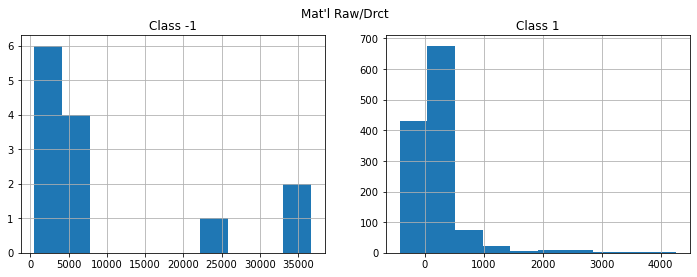

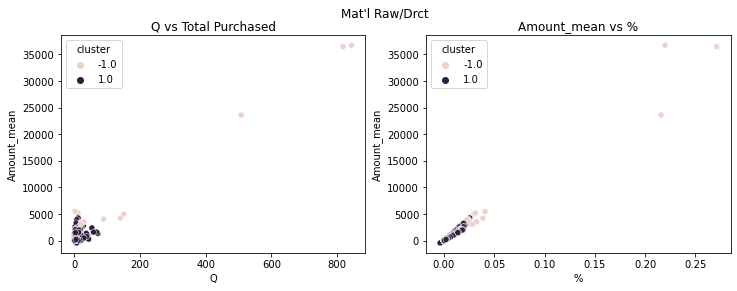

Distribution of usual vs unusual


 1.0    0.989575
-1.0    0.010425
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count     13.000000  1234.000000
                      mean     203.230769     2.459481
                      std      310.145169     4.892724
                      min        2.000000     1.000000
                      25%       11.000000     1.000000
                      50%       29.000000     1.000000
                      75%      150.000000     2.000000
                      max      844.000000    71.000000
Amount_mean           count     13.000000  1234.000000
                      mean   10268.846923   224.675632
                      std    12959.432302   427.435557
                      min      536.000000  -423.300000
                      25%     3449.510000    30.000000
                      50%     4239.540000    84.625000
                      75%     5482.260000   232.337500
                      max    36694.200000  4263.960000
%                     count     13.000000  1234.000000
                      mean       0.075232     0.001639
                      std        0.092713     0.003013
                      min        0.003988    -0.003871
                      25%        0.025663     0.000222
                      50%        0.031106     0.000594
                      75%        0.040786     0.001703
                      max        0.271121     0.025534
Amount_mean_over_past count     13.000000  1234.000000
                      mean       4.623023     0.448055
                      std        8.739778     1.631636
                      min        0.000000    -0.249687
                      25%        0.000000     0.000000
                      50%        1.023583     0.000000
                      75%        2.617695     0.000000
                      max       26.800000    21.189112

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


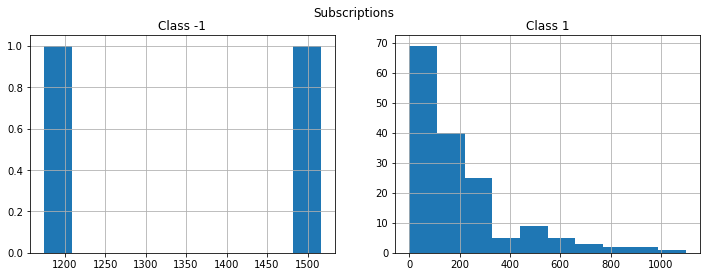

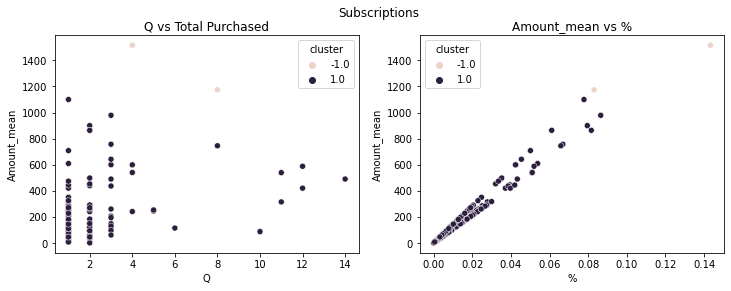

Distribution of usual vs unusual


 1.0    0.98773
-1.0    0.01227
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   161.000000
                      mean      6.000000     1.956522
                      std       2.828427     2.191882
                      min       4.000000     1.000000
                      25%       5.000000     1.000000
                      50%       6.000000     1.000000
                      75%       7.000000     2.000000
                      max       8.000000    14.000000
Amount_mean           count     2.000000   161.000000
                      mean   1345.415000   207.153789
                      std     241.710311   211.156617
                      min    1174.500000     0.000000
                      25%    1259.957500    70.000000
                      50%    1345.415000   134.000000
                      75%    1430.872500   260.000000
                      max    1516.330000  1100.000000
%                     count     2.000000   161.000000
                      mean      0.113156     0.017228
                      std       0.042538     0.017461
                      min       0.083077     0.000000
                      25%       0.098117     0.006184
                      50%       0.113156     0.011360
                      75%       0.128196     0.022105
                      max       0.143236     0.086487
Amount_mean_over_past count     2.000000   161.000000
                      mean      3.019580     0.391127
                      std       1.437551     0.805527
                      min       2.003078     0.000000
                      25%       2.511329     0.000000
                      50%       3.019580     0.000000
                      75%       3.527831     0.500000
                      max       4.036082     5.400000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


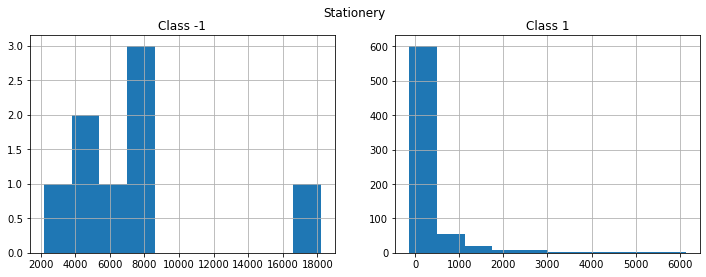

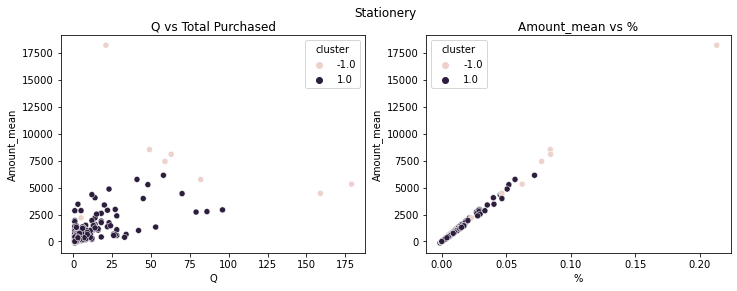

Distribution of usual vs unusual


 1.0    0.988764
-1.0    0.011236
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count      8.000000   704.000000
                      mean      77.125000     3.562500
                      std       61.848750     8.559494
                      min        5.000000     1.000000
                      25%       42.000000     1.000000
                      50%       61.000000     1.000000
                      75%      101.250000     2.000000
                      max      179.000000    96.000000
Amount_mean           count      8.000000   704.000000
                      mean    7494.908750   316.016278
                      std     4795.090595   688.112053
                      min     2195.670000  -132.240000
                      25%     5106.237500    30.660000
                      50%     6586.265000    90.000000
                      75%     8198.435000   270.780000
                      max    18194.760000  6138.880000
%                     count      8.000000   704.000000
                      mean       0.080984     0.003341
                      std        0.057337     0.007288
                      min        0.022912    -0.001306
                      25%        0.054224     0.000336
                      50%        0.069905     0.000983
                      75%        0.084219     0.002821
                      max        0.213230     0.071943
Amount_mean_over_past count      8.000000   704.000000
                      mean      10.536471     0.515216
                      std       20.034757     2.549328
                      min        0.000000    -1.267015
                      25%        0.894181     0.000000
                      50%        1.585252     0.000000
                      75%        8.606934     0.087988
                      max       58.551200    52.102377

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


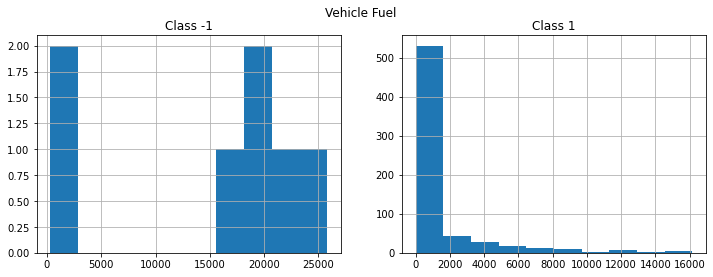

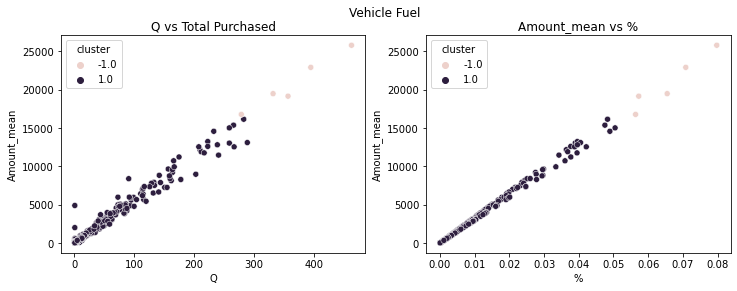

Distribution of usual vs unusual


 1.0    0.989505
-1.0    0.010495
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      7.000000    660.000000
                      mean     263.142857     23.062121
                      std      183.186998     47.846911
                      min        5.000000      1.000000
                      25%      145.000000      1.000000
                      50%      332.000000      2.000000
                      75%      376.000000     17.000000
                      max      463.000000    289.000000
Amount_mean           count      7.000000    660.000000
                      mean   15024.222857   1289.209939
                      std    10343.319312   2665.860425
                      min      312.830000      0.000000
                      25%     8723.845000     41.995000
                      50%    19165.780000    138.125000
                      75%    21213.135000    939.092500
                      max    25816.990000  16156.180000
%                     count      7.000000    660.000000
                      mean       0.047535      0.004041
                      std        0.032442      0.008374
                      min        0.000967      0.000000
                      25%        0.029207      0.000132
                      50%        0.057278      0.000436
                      75%        0.068159      0.002930
                      max        0.079767      0.050458
Amount_mean_over_past count      7.000000    660.000000
                      mean      11.397367      0.601502
                      std       15.861854      1.743373
                      min        0.000000      0.000000
                      25%        1.046391      0.000000
                      50%        3.960615      0.000000
                      75%       18.166852      0.757314
                      max       37.394470     29.848585

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


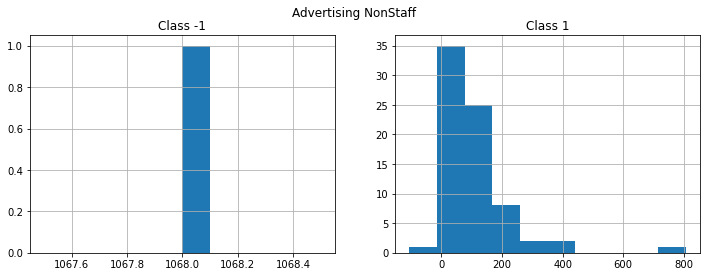

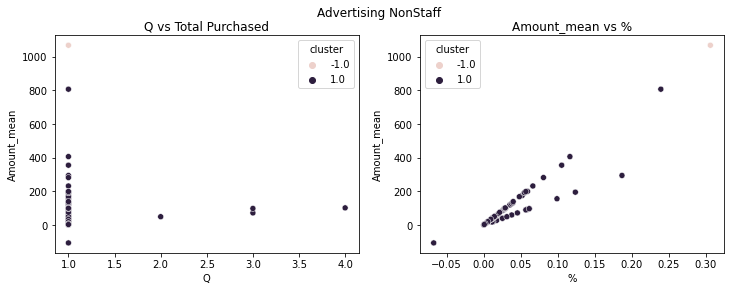

Distribution of usual vs unusual


 1.0    0.986667
-1.0    0.013333
Name: cluster, dtype: float64

cluster                             -1.0         1.0
Q                     count     1.000000   74.000000
                      mean      1.000000    1.108108
                      std            NaN    0.484487
                      min       1.000000    1.000000
                      25%       1.000000    1.000000
                      50%       1.000000    1.000000
                      75%       1.000000    1.000000
                      max       1.000000    4.000000
Amount_mean           count     1.000000   74.000000
                      mean   1068.000000   99.559865
                      std            NaN  118.834802
                      min    1068.000000 -106.200000
                      25%    1068.000000   32.110000
                      50%    1068.000000   88.495000
                      75%    1068.000000  122.510000
                      max    1068.000000  807.020000
%                     count     1.000000   74.000000
                      mean      0.306231    0.036402
                      std            NaN    0.042076
                      min       0.306231   -0.067387
                      25%       0.306231    0.011823
                      50%       0.306231    0.027988
                      75%       0.306231    0.054388
                      max       0.306231    0.239337
Amount_mean_over_past count     1.000000   74.000000
                      mean     74.166667    0.037159
                      std            NaN    0.251727
                      min      74.166667    0.000000
                      25%      74.166667    0.000000
                      50%      74.166667    0.000000
                      75%      74.166667    0.000000
                      max      74.166667    2.063107

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


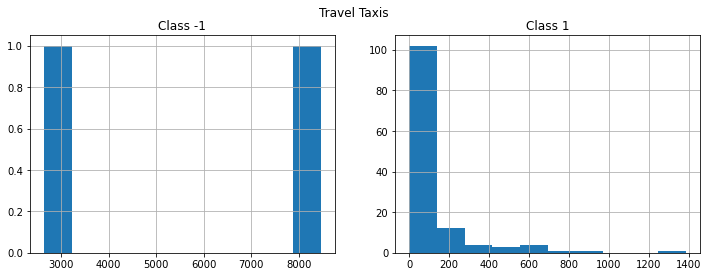

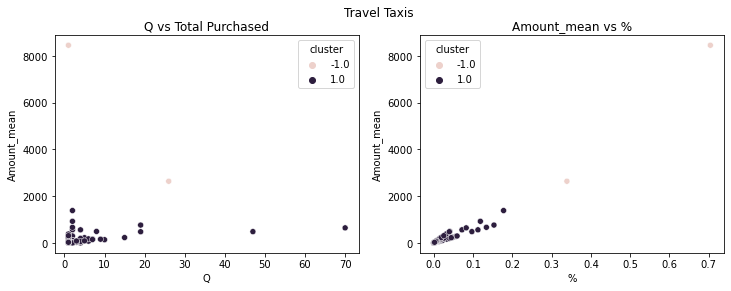

Distribution of usual vs unusual


 1.0    0.984615
-1.0    0.015385
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   128.000000
                      mean     13.500000     3.164062
                      std      17.677670     7.746757
                      min       1.000000     1.000000
                      25%       7.250000     1.000000
                      50%      13.500000     1.000000
                      75%      19.750000     2.000000
                      max      26.000000    70.000000
Amount_mean           count     2.000000   128.000000
                      mean   5549.910000   106.921094
                      std    4115.488746   201.613480
                      min    2639.820000     0.000000
                      25%    4094.865000     9.925000
                      50%    5549.910000    28.500000
                      75%    7004.955000    95.250000
                      max    8460.000000  1385.000000
%                     count     2.000000   128.000000
                      mean      0.521479     0.015289
                      std       0.258111     0.030540
                      min       0.338967     0.000000
                      25%       0.430223     0.001146
                      50%       0.521479     0.003295
                      75%       0.612735     0.012472
                      max       0.703992     0.177842
Amount_mean_over_past count     2.000000   128.000000
                      mean      6.896082     0.259947
                      std       9.752532     1.055106
                      min       0.000000     0.000000
                      25%       3.448041     0.000000
                      50%       6.896082     0.000000
                      75%      10.344122     0.000000
                      max      13.792163    10.209790

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


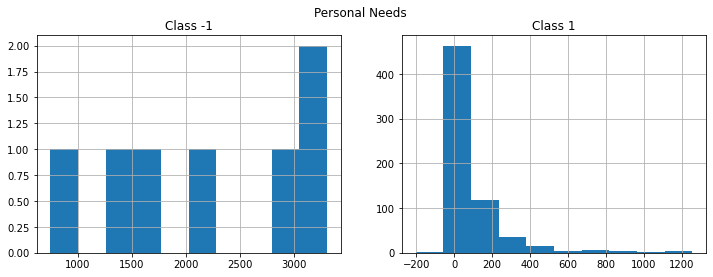

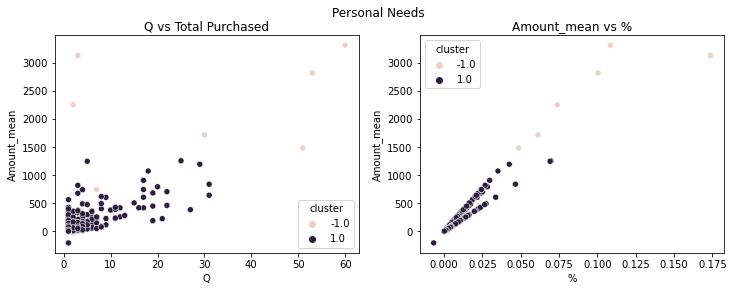

Distribution of usual vs unusual


 1.0    0.989346
-1.0    0.010654
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     7.000000   650.000000
                      mean     29.428571     2.529231
                      std      25.526830     3.786267
                      min       2.000000     1.000000
                      25%       5.000000     1.000000
                      50%      30.000000     1.000000
                      75%      52.000000     2.000000
                      max      60.000000    31.000000
Amount_mean           count     7.000000   650.000000
                      mean   2206.287143    93.913215
                      std     941.759065   158.299872
                      min     747.500000  -203.940000
                      25%    1599.320000    16.117500
                      50%    2250.000000    38.890000
                      75%    2970.520000   100.000000
                      max    3306.830000  1254.550000
%                     count     7.000000   650.000000
                      mean      0.084425     0.003706
                      std       0.048859     0.006671
                      min       0.024535    -0.006694
                      25%       0.054945     0.000614
                      50%       0.073851     0.001456
                      75%       0.104504     0.003888
                      max       0.173689     0.069728
Amount_mean_over_past count     7.000000   650.000000
                      mean      6.942821     0.357250
                      std      16.945491     1.059752
                      min       0.000000     0.000000
                      25%       0.000000     0.000000
                      50%       0.000000     0.000000
                      75%       1.648360     0.073163
                      max      45.303030    14.375000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


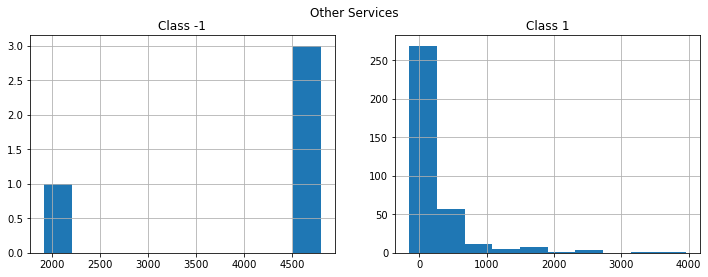

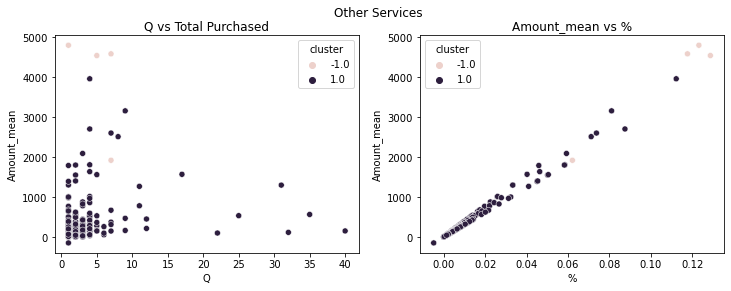

Distribution of usual vs unusual


 1.0    0.988889
-1.0    0.011111
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     4.000000   356.000000
                      mean      5.000000     2.539326
                      std       2.828427     4.270584
                      min       1.000000     1.000000
                      25%       4.000000     1.000000
                      50%       6.000000     1.000000
                      75%       7.000000     3.000000
                      max       7.000000    40.000000
Amount_mean           count     4.000000   356.000000
                      mean   3961.575000   250.656601
                      std    1366.186367   472.280785
                      min    1919.300000  -150.000000
                      25%    3886.325000    26.212500
                      50%    4563.500000    86.500000
                      75%    4638.750000   256.537500
                      max    4800.000000  3960.000000
%                     count     4.000000   356.000000
                      mean      0.107994     0.007214
                      std       0.030889     0.013697
                      min       0.062158    -0.004858
                      25%       0.103847     0.000770
                      50%       0.120504     0.002552
                      75%       0.124651     0.007506
                      max       0.128809     0.112304
Amount_mean_over_past count     4.000000   356.000000
                      mean      4.143287     0.398561
                      std       7.640445     1.193275
                      min       0.000000     0.000000
                      25%       0.000000     0.000000
                      50%       0.495311     0.000000
                      75%       4.638598     0.158951
                      max      15.582528     9.802764

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


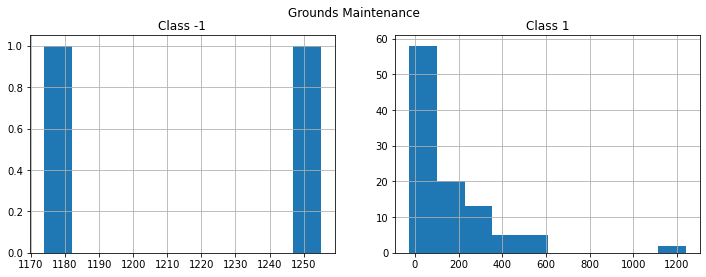

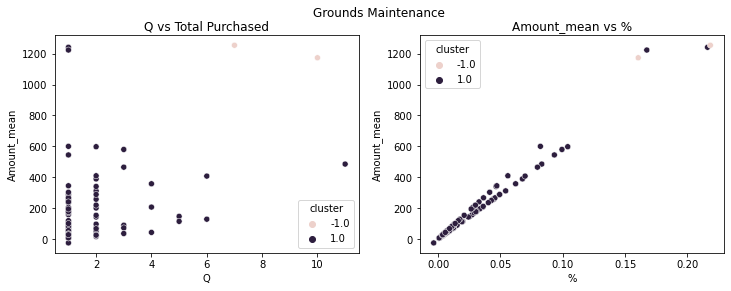

Distribution of usual vs unusual


 1.0    0.980952
-1.0    0.019048
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   103.000000
                      mean      8.500000     1.669903
                      std       2.121320     1.416903
                      min       7.000000     1.000000
                      25%       7.750000     1.000000
                      50%       8.500000     1.000000
                      75%       9.250000     2.000000
                      max      10.000000    11.000000
Amount_mean           count     2.000000   103.000000
                      mean   1214.420000   159.831748
                      std      57.388786   211.580954
                      min    1173.840000   -25.880000
                      25%    1194.130000    27.155000
                      50%    1214.420000    81.840000
                      75%    1234.710000   215.020000
                      max    1255.000000  1242.000000
%                     count     2.000000   103.000000
                      mean      0.189483     0.025447
                      std       0.040912     0.033925
                      min       0.160554    -0.003540
                      25%       0.175018     0.003714
                      50%       0.189483     0.012235
                      75%       0.203948     0.034667
                      max       0.218412     0.216150
Amount_mean_over_past count     2.000000   103.000000
                      mean      1.210020     0.839094
                      std       1.711226     4.406123
                      min       0.000000     0.000000
                      25%       0.605010     0.000000
                      50%       1.210020     0.000000
                      75%       1.815029     0.000000
                      max       2.420039    37.937500

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


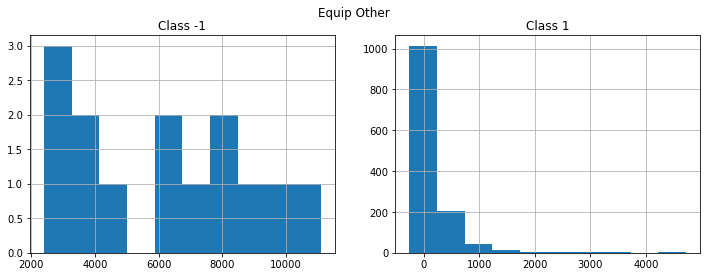

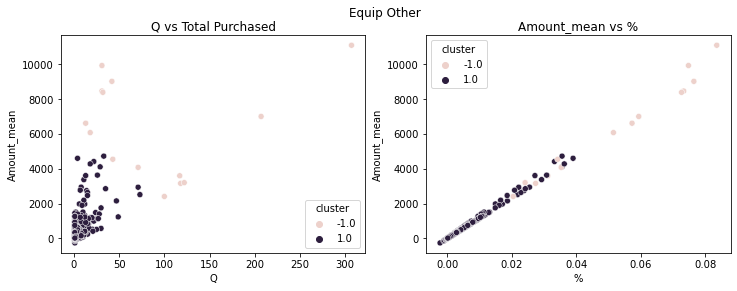

Distribution of usual vs unusual


 1.0    0.989354
-1.0    0.010646
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count     14.000000  1301.000000
                      mean      89.428571     2.500384
                      std       83.077086     4.878938
                      min       13.000000     1.000000
                      25%       31.250000     1.000000
                      50%       57.000000     1.000000
                      75%      117.750000     2.000000
                      max      307.000000    73.000000
Amount_mean           count     14.000000  1301.000000
                      mean    6250.835000   213.859808
                      std     2813.568375   459.196231
                      min     2406.930000  -259.000000
                      25%     3714.822500    26.990000
                      50%     6340.685000    69.380000
                      75%     8438.472500   203.040000
                      max    11083.440000  4721.240000
%                     count     14.000000  1301.000000
                      mean       0.051561     0.001751
                      std        0.022336     0.003762
                      min        0.020430    -0.002246
                      25%        0.031940     0.000219
                      50%        0.054423     0.000559
                      75%        0.073164     0.001685
                      max        0.083588     0.039018
Amount_mean_over_past count     14.000000  1301.000000
                      mean       1.231073     0.447989
                      std        2.202706     1.874391
                      min        0.000000    -1.000000
                      25%        0.000000     0.000000
                      50%        0.691711     0.000000
                      75%        1.140892     0.000000
                      max        8.287054    34.581395

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


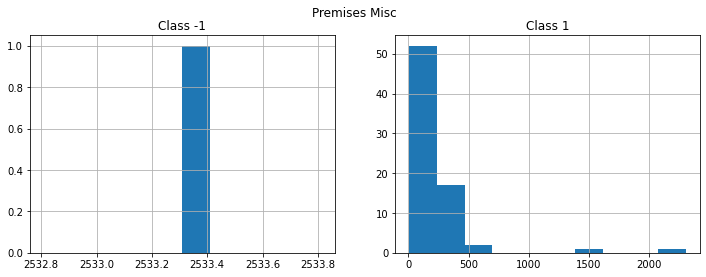

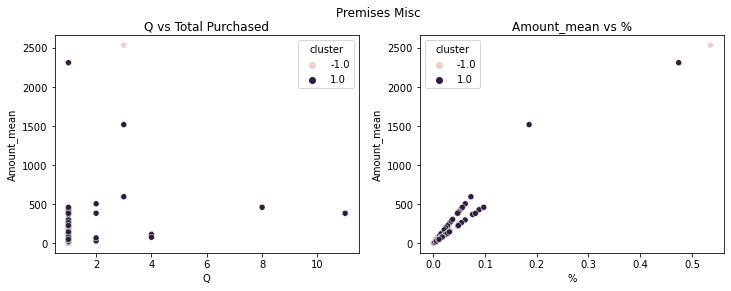

Distribution of usual vs unusual


 1.0    0.986486
-1.0    0.013514
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    73.000000
                      mean      3.000000     1.438356
                      std            NaN     1.518280
                      min       3.000000     1.000000
                      25%       3.000000     1.000000
                      50%       3.000000     1.000000
                      75%       3.000000     1.000000
                      max       3.000000    11.000000
Amount_mean           count     1.000000    73.000000
                      mean   2533.310000   209.070137
                      std            NaN   334.221387
                      min    2533.310000     6.740000
                      25%    2533.310000    32.000000
                      50%    2533.310000    99.980000
                      75%    2533.310000   283.930000
                      max    2533.310000  2310.000000
%                     count     1.000000    73.000000
                      mean      0.535755     0.033757
                      std            NaN     0.060374
                      min       0.535755     0.000822
                      25%       0.535755     0.006213
                      50%       0.535755     0.017130
                      75%       0.535755     0.047090
                      max       0.535755     0.474552
Amount_mean_over_past count     1.000000    73.000000
                      mean      0.000000     0.322620
                      std            NaN     1.529022
                      min       0.000000     0.000000
                      25%       0.000000     0.000000
                      50%       0.000000     0.000000
                      75%       0.000000     0.000000
                      max       0.000000     9.336942

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


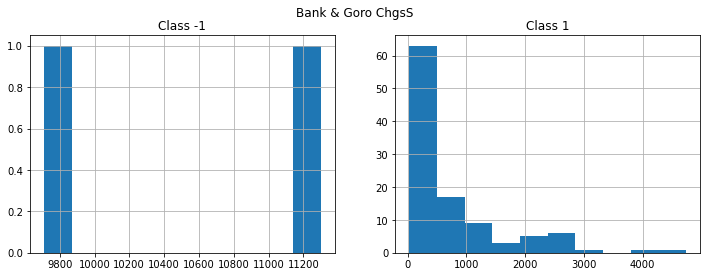

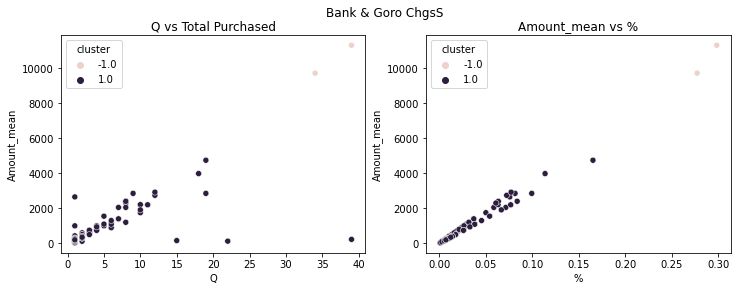

Distribution of usual vs unusual


 1.0    0.981481
-1.0    0.018519
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count      2.000000   106.000000
                      mean      36.500000     4.066038
                      std        3.535534     5.562235
                      min       34.000000     1.000000
                      25%       35.250000     1.000000
                      50%       36.500000     2.000000
                      75%       37.750000     5.000000
                      max       39.000000    39.000000
Amount_mean           count      2.000000   106.000000
                      mean   10505.000000   759.665566
                      std     1124.299782   898.557909
                      min     9710.000000    25.000000
                      25%    10107.500000   200.000000
                      50%    10505.000000   400.000000
                      75%    10902.500000   930.000000
                      max    11300.000000  4740.000000
%                     count      2.000000   106.000000
                      mean       0.287974     0.022868
                      std        0.014915     0.027995
                      min        0.277427     0.000660
                      25%        0.282700     0.005937
                      50%        0.287974     0.010567
                      75%        0.293247     0.026351
                      max        0.298521     0.165266
Amount_mean_over_past count      2.000000   106.000000
                      mean       0.581874     0.621977
                      std        0.822895     1.359852
                      min        0.000000     0.000000
                      25%        0.290937     0.000000
                      50%        0.581874     0.000000
                      75%        0.872812     0.770327
                      max        1.163749     9.480000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


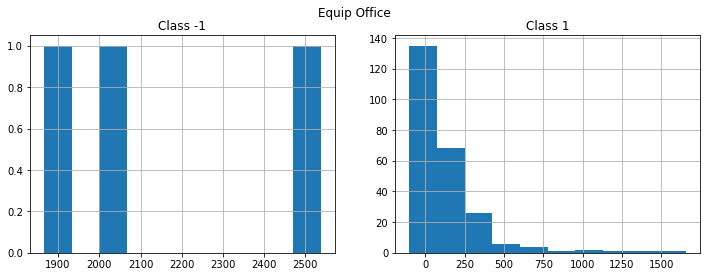

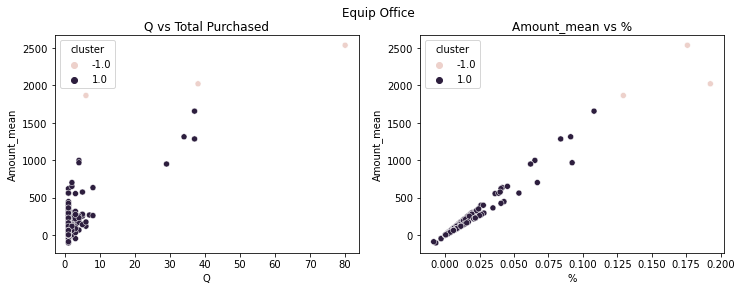

Distribution of usual vs unusual


 1.0    0.987903
-1.0    0.012097
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     3.000000   245.000000
                      mean     41.333333     2.044898
                      std      37.112442     4.341237
                      min       6.000000     1.000000
                      25%      22.000000     1.000000
                      50%      38.000000     1.000000
                      75%      59.000000     2.000000
                      max      80.000000    37.000000
Amount_mean           count     3.000000   245.000000
                      mean   2141.686667   138.035796
                      std     351.094588   219.382482
                      min    1866.000000  -102.890000
                      25%    1944.055000    20.000000
                      50%    2022.110000    62.760000
                      75%    2279.530000   167.700000
                      max    2536.950000  1656.970000
%                     count     3.000000   245.000000
                      mean      0.165972     0.010213
                      std       0.032751     0.015872
                      min       0.129398    -0.008286
                      25%       0.152662     0.001522
                      50%       0.175925     0.004632
                      75%       0.184259     0.011652
                      max       0.192592     0.108131
Amount_mean_over_past count     3.000000   245.000000
                      mean      4.435585     0.172867
                      std       4.774429     0.778756
                      min       0.797063     0.000000
                      25%       1.732491     0.000000
                      50%       2.667918     0.000000
                      75%       6.254845     0.000000
                      max       9.841772     7.998333

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


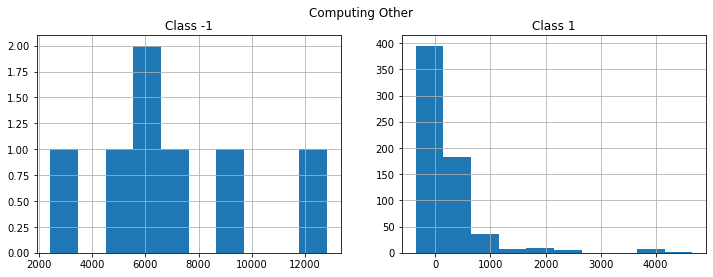

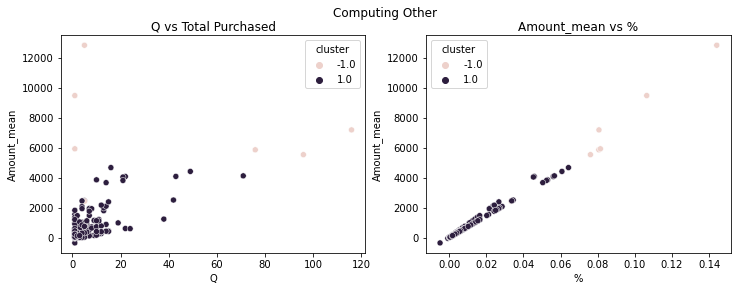

Distribution of usual vs unusual


 1.0    0.989264
-1.0    0.010736
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count      7.000000   645.000000
                      mean      42.857143     2.559690
                      std       51.060189     5.198087
                      min        1.000000     1.000000
                      25%        3.000000     1.000000
                      50%        5.000000     1.000000
                      75%       86.000000     2.000000
                      max      116.000000    71.000000
Amount_mean           count      7.000000   645.000000
                      mean    7031.594286   287.084496
                      std     3309.971697   592.444235
                      min     2424.830000  -359.600000
                      25%     5692.735000    32.170000
                      50%     5921.250000    91.060000
                      75%     8328.375000   268.550000
                      max    12832.860000  4667.510000
%                     count      7.000000   645.000000
                      mean       0.086094     0.003717
                      std        0.033524     0.007796
                      min        0.033353    -0.004946
                      25%        0.078332     0.000426
                      50%        0.080668     0.001168
                      75%        0.093923     0.003542
                      max        0.144124     0.064248
Amount_mean_over_past count      7.000000   645.000000
                      mean       2.923945     0.499041
                      std        6.382650     2.011205
                      min        0.000000     0.000000
                      25%        0.000000     0.000000
                      50%        0.625000     0.000000
                      75%        1.257486     0.000000
                      max       17.327640    27.797081

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


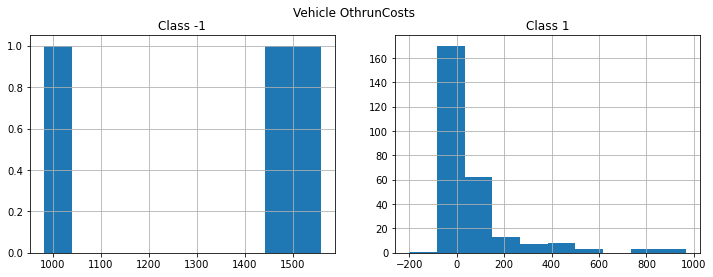

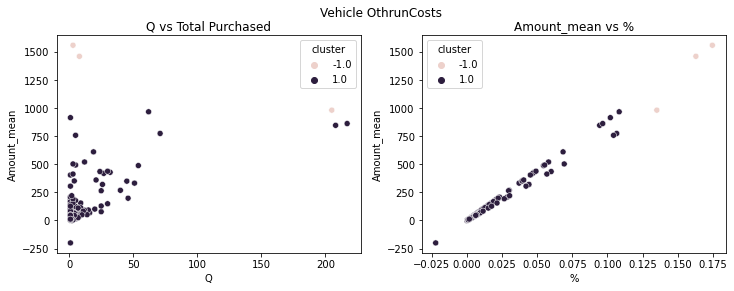

Distribution of usual vs unusual


 1.0    0.989011
-1.0    0.010989
Name: cluster, dtype: float64

cluster                             -1.0         1.0
Q                     count     3.000000  270.000000
                      mean     72.000000    6.137037
                      std     115.208507   20.316266
                      min       3.000000    1.000000
                      25%       5.500000    1.000000
                      50%       8.000000    1.000000
                      75%     106.500000    3.000000
                      max     205.000000  217.000000
Amount_mean           count     3.000000  270.000000
                      mean   1333.233333   78.301556
                      std     308.822220  160.132972
                      min     981.200000 -200.000000
                      25%    1220.600000    6.000000
                      50%    1460.000000   18.000000
                      75%    1509.250000   61.875000
                      max    1558.500000  966.490000
%                     count     3.000000  270.000000
                      mean      0.157598    0.009360
                      std       0.020318    0.019065
                      min       0.135137   -0.022323
                      25%       0.149049    0.000736
                      50%       0.162960    0.002097
                      75%       0.168829    0.007144
                      max       0.174698    0.108337
Amount_mean_over_past count     3.000000  270.000000
                      mean      0.947697    1.442267
                      std       0.868194   16.527166
                      min       0.000000    0.000000
                      25%       0.569208    0.000000
                      50%       1.138415    0.000000
                      75%       1.421546    0.084125
                      max       1.704676  271.000000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


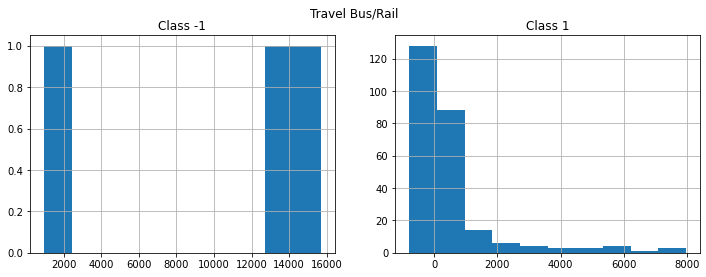

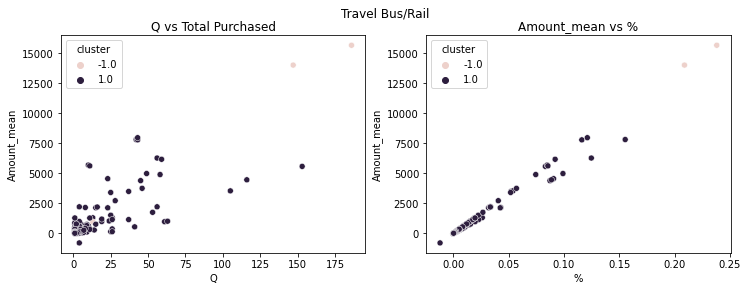

Distribution of usual vs unusual


 1.0    0.988327
-1.0    0.011673
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count      3.000000   254.000000
                      mean     115.333333     8.043307
                      std       90.743227    18.060999
                      min       13.000000     1.000000
                      25%       80.000000     1.000000
                      50%      147.000000     1.000000
                      75%      166.500000     4.750000
                      max      186.000000   153.000000
Amount_mean           count      3.000000   254.000000
                      mean   10224.010000   601.435157
                      std     8063.165468  1401.189311
                      min      962.500000  -793.100000
                      25%     7495.425000    20.287500
                      50%    14028.350000    83.310000
                      75%    14854.765000   383.250000
                      max    15681.180000  7975.700000
%                     count      3.000000   254.000000
                      mean       0.153729     0.009995
                      std        0.121602     0.023668
                      min        0.014329    -0.012038
                      25%        0.111587     0.000334
                      50%        0.208844     0.001378
                      75%        0.223429     0.005971
                      max        0.238014     0.155271
Amount_mean_over_past count      3.000000   254.000000
                      mean      11.605038     0.488510
                      std       16.402454     1.324590
                      min        1.117821     0.000000
                      25%        2.153991     0.000000
                      50%        3.190161     0.000000
                      75%       16.848646     0.285850
                      max       30.507132    11.177439

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


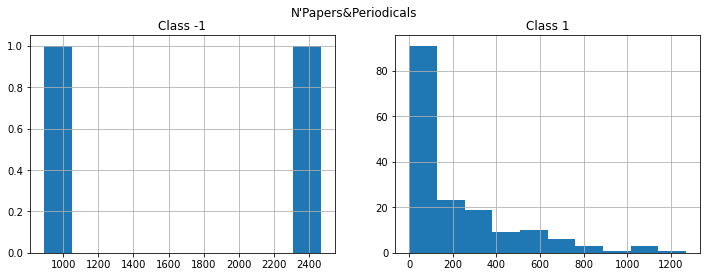

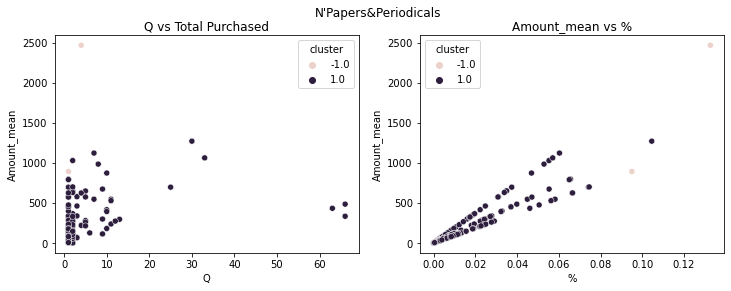

Distribution of usual vs unusual


 1.0    0.988095
-1.0    0.011905
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   166.000000
                      mean      2.500000     3.873494
                      std       2.121320     9.450459
                      min       1.000000     1.000000
                      25%       1.750000     1.000000
                      50%       2.500000     1.000000
                      75%       3.250000     2.000000
                      max       4.000000    66.000000
Amount_mean           count     2.000000   166.000000
                      mean   1678.970000   221.428976
                      std    1114.357861   255.462048
                      min     891.000000     0.000000
                      25%    1284.985000    41.600000
                      50%    1678.970000   111.570000
                      75%    2072.955000   316.650000
                      max    2466.940000  1269.890000
%                     count     2.000000   166.000000
                      mean      0.113856     0.016701
                      std       0.026603     0.019123
                      min       0.095045     0.000000
                      25%       0.104451     0.003286
                      50%       0.113856     0.008582
                      75%       0.123262     0.023942
                      max       0.132667     0.104555
Amount_mean_over_past count     2.000000   166.000000
                      mean      4.500000     0.411617
                      std       6.363961     1.073729
                      min       0.000000     0.000000
                      25%       2.250000     0.000000
                      50%       4.500000     0.000000
                      75%       6.750000     0.488125
                      max       9.000000     8.844444

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


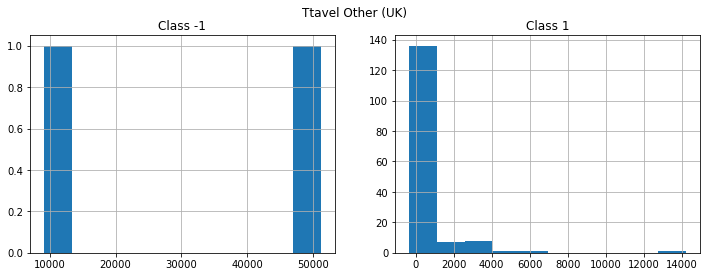

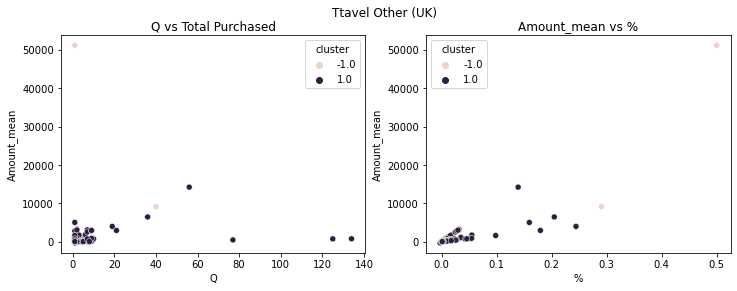

Distribution of usual vs unusual


 1.0    0.987179
-1.0    0.012821
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      2.000000    154.000000
                      mean      20.500000      5.064935
                      std       27.577164     16.589892
                      min        1.000000      1.000000
                      25%       10.750000      1.000000
                      50%       20.500000      1.000000
                      75%       30.250000      2.000000
                      max       40.000000    134.000000
Amount_mean           count      2.000000    154.000000
                      mean   30166.070000    582.508377
                      std    29746.469076   1466.830115
                      min     9132.140000   -333.000000
                      25%    19649.105000     35.900000
                      50%    30166.070000    119.860000
                      75%    40683.035000    440.640000
                      max    51200.000000  14209.480000
%                     count      2.000000    154.000000
                      mean       0.395403      0.014345
                      std        0.148461      0.034815
                      min        0.290425     -0.003254
                      25%        0.342914      0.000923
                      50%        0.395403      0.003088
                      75%        0.447892      0.011948
                      max        0.500381      0.244179
Amount_mean_over_past count      2.000000    154.000000
                      mean       1.570219      0.310020
                      std        2.220624      1.029612
                      min        0.000000      0.000000
                      25%        0.785109      0.000000
                      50%        1.570219      0.000000
                      75%        2.355328      0.000000
                      max        3.140437      7.434783

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


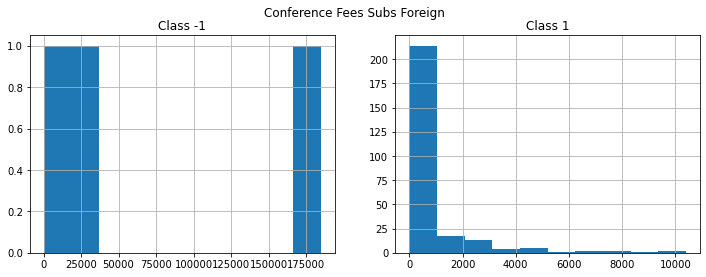

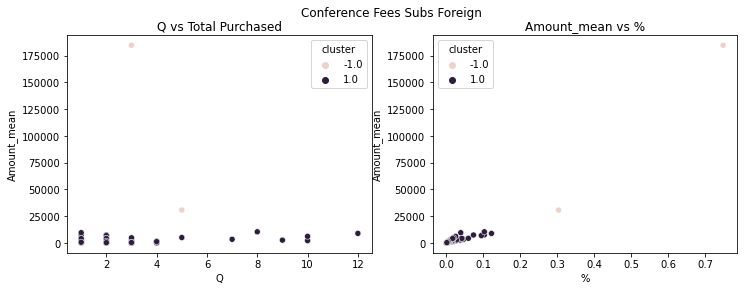

Distribution of usual vs unusual


 1.0    0.988636
-1.0    0.011364
Name: cluster, dtype: float64

cluster                               -1.0           1.0
Q                     count       3.000000    261.000000
                      mean        3.000000      1.517241
                      std         2.000000      1.407634
                      min         1.000000      1.000000
                      25%         2.000000      1.000000
                      50%         3.000000      1.000000
                      75%         4.000000      1.000000
                      max         5.000000     12.000000
Amount_mean           count       3.000000    261.000000
                      mean    71921.266667    787.526169
                      std     98893.767142   1598.793113
                      min       298.000000      0.000000
                      25%     15503.900000     21.730000
                      50%     30709.800000    230.400000
                      75%    107732.900000    560.000000
                      max    184756.000000  10394.280000
%                     count       3.000000    261.000000
                      mean        0.351330      0.007456
                      std         0.374857      0.016792
                      min         0.002941      0.000000
                      25%         0.153005      0.000188
                      50%         0.303069      0.002026
                      75%         0.525525      0.005675
                      max         0.747981      0.121767
Amount_mean_over_past count       3.000000    261.000000
                      mean       23.650794      0.111633
                      std        40.964376      0.589529
                      min         0.000000      0.000000
                      25%         0.000000      0.000000
                      50%         0.000000      0.000000
                      75%        35.476190      0.000000
                      max        70.952381      7.026063

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


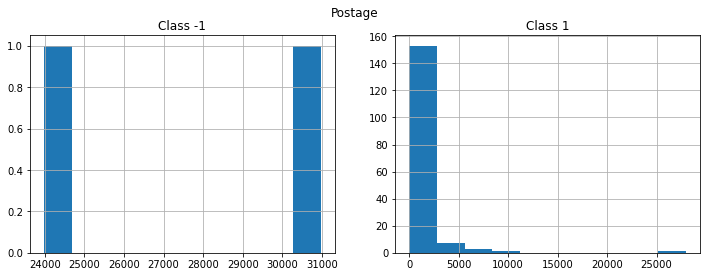

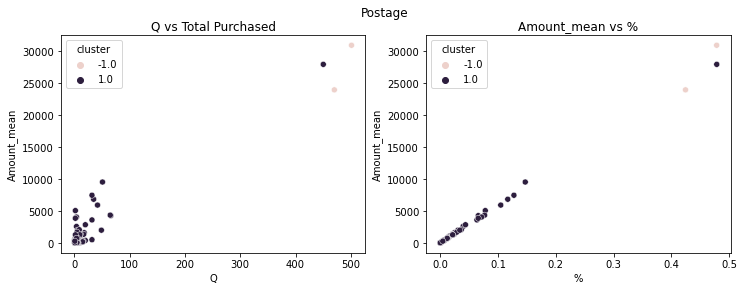

Distribution of usual vs unusual


 1.0    0.988024
-1.0    0.011976
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      2.000000    165.000000
                      mean     485.500000      8.357576
                      std       21.920310     36.206715
                      min      470.000000      1.000000
                      25%      477.750000      1.000000
                      50%      485.500000      2.000000
                      75%      493.250000      5.000000
                      max      501.000000    450.000000
Amount_mean           count      2.000000    165.000000
                      mean   27473.430000    755.744061
                      std     4943.185517   2559.770232
                      min    23978.070000     -5.950000
                      25%    25725.750000     25.000000
                      50%    27473.430000     79.000000
                      75%    29221.110000    316.380000
                      max    30968.790000  27974.300000
%                     count      2.000000    165.000000
                      mean       0.451527      0.012709
                      std        0.038106      0.043397
                      min        0.424583     -0.000102
                      25%        0.438055      0.000428
                      50%        0.451527      0.001377
                      75%        0.465000      0.005319
                      max        0.478472      0.478636
Amount_mean_over_past count      2.000000    165.000000
                      mean       0.387133      0.507579
                      std        0.547488      3.670658
                      min        0.000000    -25.980000
                      25%        0.193566      0.000000
                      50%        0.387133      0.000000
                      75%        0.580699      0.572093
                      max        0.774266     36.833047

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


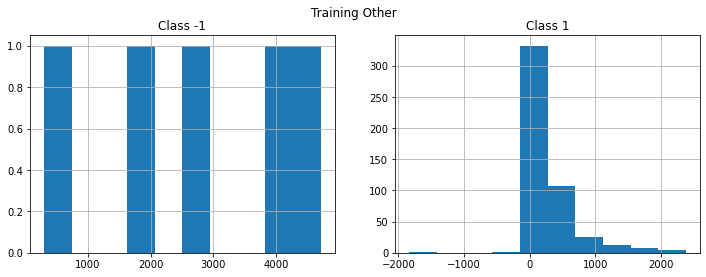

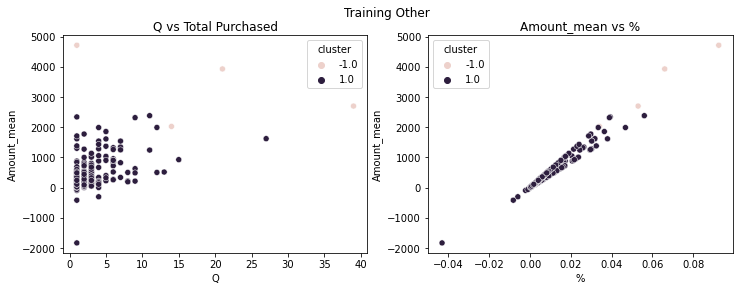

Distribution of usual vs unusual


 1.0    0.98994
-1.0    0.01006
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     5.000000   492.000000
                      mean     15.200000     1.873984
                      std      15.849290     2.207277
                      min       1.000000     1.000000
                      25%       1.000000     1.000000
                      50%      14.000000     1.000000
                      75%      21.000000     2.000000
                      max      39.000000    27.000000
Amount_mean           count     5.000000   492.000000
                      mean   2733.940000   283.268537
                      std    1716.347537   391.227692
                      min     300.000000 -1834.920000
                      25%    2024.700000    69.620000
                      50%    2700.000000   162.050000
                      75%    3930.000000   343.950000
                      max    4715.000000  2381.100000
%                     count     5.000000   492.000000
                      mean      0.050101     0.005588
                      std       0.032972     0.007869
                      min       0.005038    -0.043158
                      25%       0.034000     0.001379
                      50%       0.052970     0.003284
                      75%       0.065995     0.006670
                      max       0.092502     0.056004
Amount_mean_over_past count     5.000000   492.000000
                      mean     10.315596     0.295167
                      std      13.045207     0.986635
                      min       0.000000     0.000000
                      25%       0.000000     0.000000
                      50%       4.465909     0.000000
                      75%      17.112069     0.000000
                      max      30.000000     9.000000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


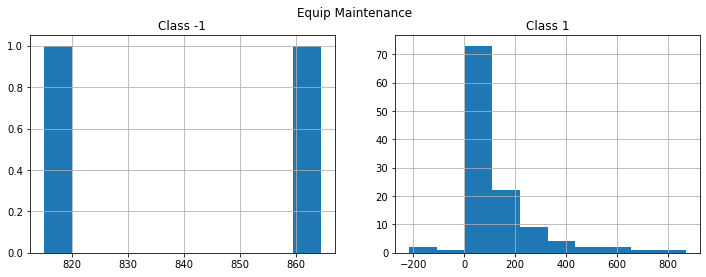

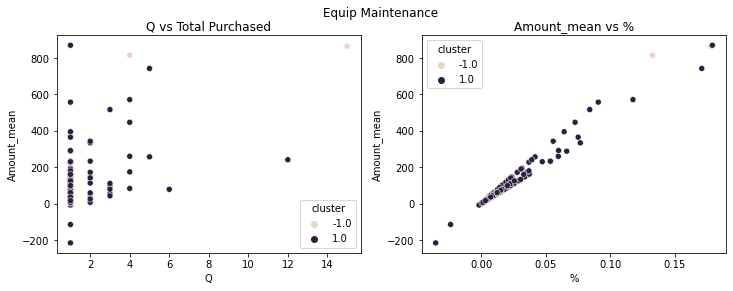

Distribution of usual vs unusual


 1.0    0.983193
-1.0    0.016807
Name: cluster, dtype: float64

cluster                            -1.0         1.0
Q                     count    2.000000  117.000000
                      mean     9.500000    1.538462
                      std      7.778175    1.392953
                      min      4.000000    1.000000
                      25%      6.750000    1.000000
                      50%      9.500000    1.000000
                      75%     12.250000    1.000000
                      max     15.000000   12.000000
Amount_mean           count    2.000000  117.000000
                      mean   839.670000  116.724701
                      std     34.874506  151.746858
                      min    815.010000 -216.100000
                      25%    827.340000   31.960000
                      50%    839.670000   72.870000
                      75%    852.000000  145.500000
                      max    864.330000  870.000000
%                     count    2.000000  117.000000
                      mean     0.155401    0.022985
                      std      0.031981    0.030277
                      min      0.132787   -0.035209
                      25%      0.144094    0.006190
                      50%      0.155401    0.015008
                      75%      0.166708    0.027997
                      max      0.178015    0.179183
Amount_mean_over_past count    2.000000  117.000000
                      mean    54.648865    0.310657
                      std     72.208763    0.976831
                      min      3.589559    0.000000
                      25%     29.119212    0.000000
                      50%     54.648865    0.000000
                      75%     80.178518    0.000000
                      max    105.708171    7.258333

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


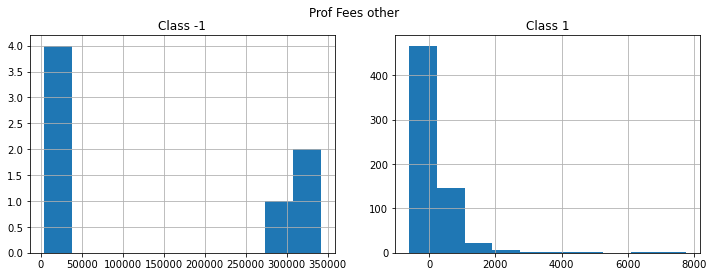

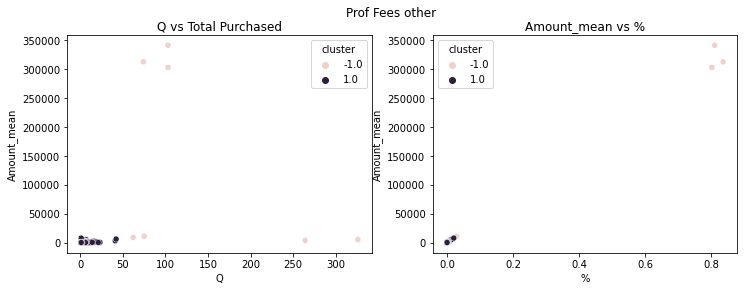

Distribution of usual vs unusual


 1.0    0.989346
-1.0    0.010654
Name: cluster, dtype: float64

cluster                               -1.0          1.0
Q                     count       7.000000   650.000000
                      mean      143.857143     2.084615
                      std       105.885832     3.260717
                      min        62.000000     1.000000
                      25%        74.500000     1.000000
                      50%       103.000000     1.000000
                      75%       183.500000     2.000000
                      max       326.000000    42.000000
Amount_mean           count       7.000000   650.000000
                      mean   140848.357143   287.119369
                      std    167039.073265   629.801017
                      min      3812.000000  -600.000000
                      25%      7109.000000    40.000000
                      50%     10984.500000   118.800000
                      75%    307765.000000   264.000000
                      max    341394.000000  7756.000000
%                     count       7.000000   650.000000
                      mean        0.360347     0.000735
                      std         0.426735     0.001622
                      min         0.009052    -0.001589
                      25%         0.017593     0.000105
                      50%         0.029093     0.000287
                      75%         0.806424     0.000684
                      max         0.836252     0.020542
Amount_mean_over_past count       7.000000   650.000000
                      mean        0.862311     0.463417
                      std         0.618413     2.434065
                      min         0.000000   -12.476190
                      25%         0.443565     0.000000
                      50%         1.091870     0.000000
                      75%         1.290493     0.000000
                      max         1.476190    31.815143

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


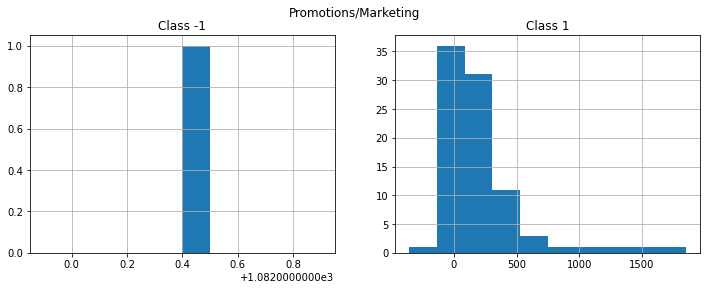

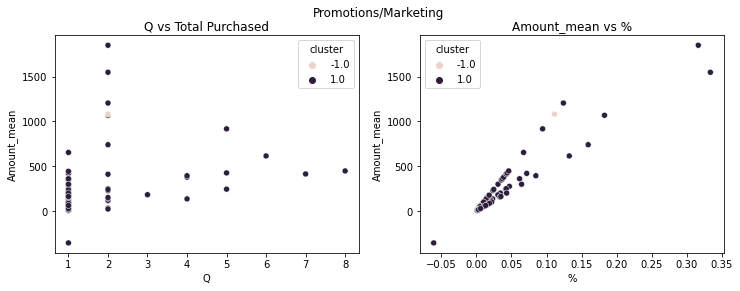

Distribution of usual vs unusual


 1.0    0.988636
-1.0    0.011364
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    87.000000
                      mean      2.000000     1.643678
                      std            NaN     1.397481
                      min       2.000000     1.000000
                      25%       2.000000     1.000000
                      50%       2.000000     1.000000
                      75%       2.000000     2.000000
                      max       2.000000     8.000000
Amount_mean           count     1.000000    87.000000
                      mean   1082.400000   219.867241
                      std            NaN   330.122364
                      min    1082.400000  -357.140000
                      25%    1082.400000    41.245000
                      50%    1082.400000   100.720000
                      75%    1082.400000   261.600000
                      max    1082.400000  1852.000000
%                     count     1.000000    87.000000
                      mean      0.111385     0.033202
                      std            NaN     0.057171
                      min       0.111385    -0.061046
                      25%       0.111385     0.005330
                      50%       0.111385     0.016435
                      75%       0.111385     0.037972
                      max       0.111385     0.333842
Amount_mean_over_past count     1.000000    87.000000
                      mean    120.266667     0.408382
                      std            NaN     1.303105
                      min     120.266667     0.000000
                      25%     120.266667     0.000000
                      50%     120.266667     0.000000
                      75%     120.266667     0.000000
                      max     120.266667     9.175100

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


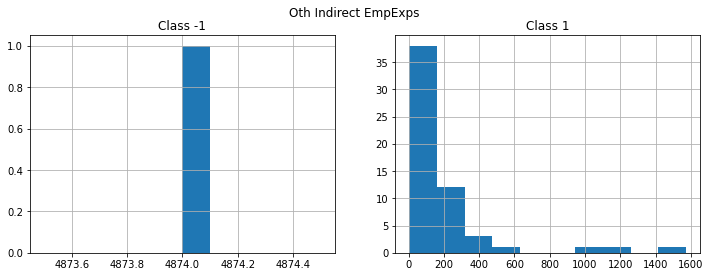

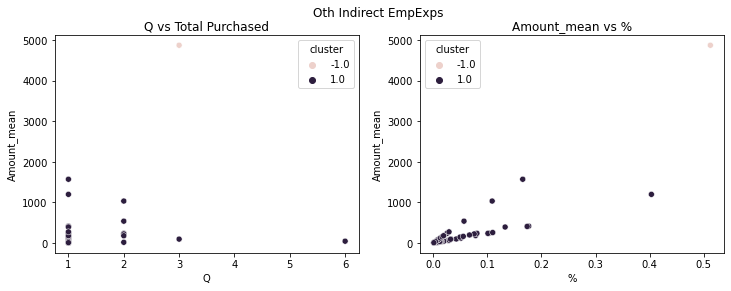

Distribution of usual vs unusual


 1.0    0.982759
-1.0    0.017241
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    57.000000
                      mean      3.000000     1.228070
                      std            NaN     0.756343
                      min       3.000000     1.000000
                      25%       3.000000     1.000000
                      50%       3.000000     1.000000
                      75%       3.000000     1.000000
                      max       3.000000     6.000000
Amount_mean           count     1.000000    57.000000
                      mean   4874.000000   174.963158
                      std            NaN   291.692165
                      min    4874.000000     3.200000
                      25%    4874.000000    20.000000
                      50%    4874.000000    75.000000
                      75%    4874.000000   199.000000
                      max    4874.000000  1572.500000
%                     count     1.000000    57.000000
                      mean      0.512343     0.043643
                      std            NaN     0.066720
                      min       0.512343     0.000620
                      25%       0.512343     0.007845
                      50%       0.512343     0.015266
                      75%       0.512343     0.055370
                      max       0.512343     0.403277
Amount_mean_over_past count     1.000000    57.000000
                      mean     24.492462     0.094290
                      std            NaN     0.387358
                      min      24.492462     0.000000
                      25%      24.492462     0.000000
                      50%      24.492462     0.000000
                      75%      24.492462     0.000000
                      max      24.492462     2.620253

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


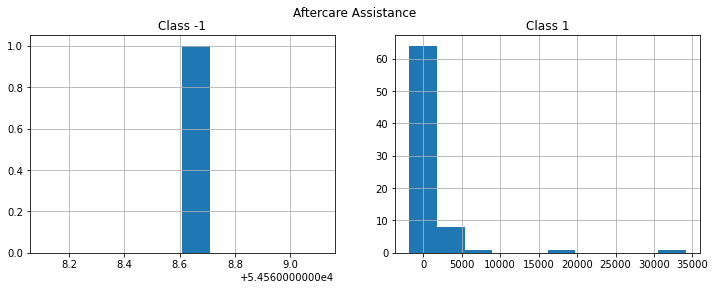

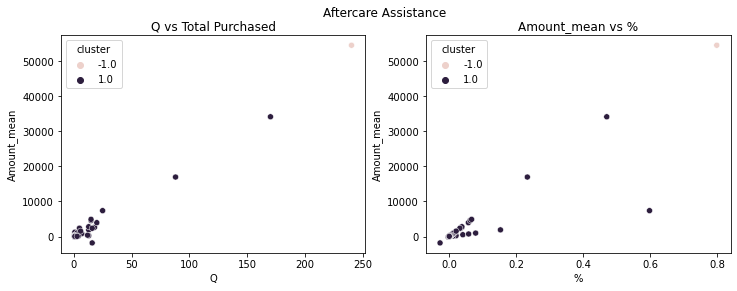

Distribution of usual vs unusual


 1.0    0.986842
-1.0    0.013158
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      1.000000     75.000000
                      mean     240.000000      7.226667
                      std             NaN     22.053114
                      min      240.000000      1.000000
                      25%      240.000000      1.000000
                      50%      240.000000      1.000000
                      75%      240.000000      3.500000
                      max      240.000000    170.000000
Amount_mean           count      1.000000     75.000000
                      mean   54568.610000   1314.067067
                      std             NaN   4477.272434
                      min    54568.610000  -1829.460000
                      25%    54568.610000     59.990000
                      50%    54568.610000    199.000000
                      75%    54568.610000    556.790000
                      max    54568.610000  34158.510000
%                     count      1.000000     75.000000
                      mean       0.799369      0.029342
                      std             NaN      0.091972
                      min        0.799369     -0.026800
                      25%        0.799369      0.000909
                      50%        0.799369      0.003074
                      75%        0.799369      0.013487
                      max        0.799369      0.598636
Amount_mean_over_past count      1.000000     75.000000
                      mean       7.400057      0.405954
                      std             NaN      1.344285
                      min        7.400057     -1.000000
                      25%        7.400057      0.000000
                      50%        7.400057      0.000000
                      75%        7.400057      0.000000
                      max        7.400057      7.756281

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


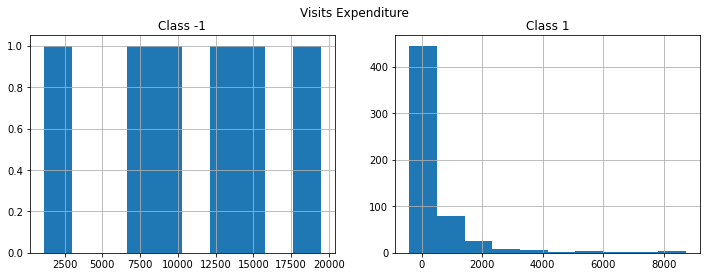

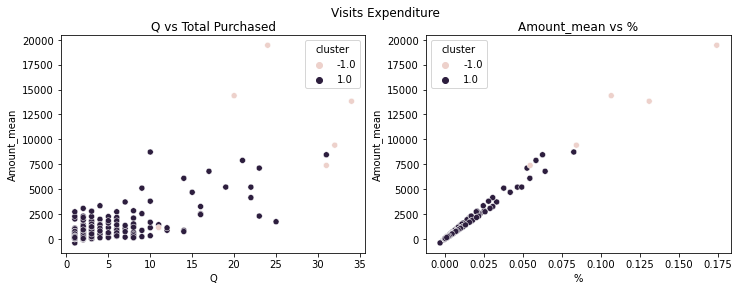

Distribution of usual vs unusual


 1.0    0.989619
-1.0    0.010381
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count      6.000000   572.000000
                      mean      25.333333     2.526224
                      std        8.801515     3.528371
                      min       11.000000     1.000000
                      25%       21.000000     1.000000
                      50%       27.500000     1.000000
                      75%       31.750000     2.000000
                      max       34.000000    31.000000
Amount_mean           count      6.000000   572.000000
                      mean   10936.256667   501.501573
                      std     6388.039155  1025.904629
                      min     1133.190000  -406.800000
                      25%     7890.312500    50.242500
                      50%    11624.925000   167.765000
                      75%    14253.400000   469.700000
                      max    19459.500000  8729.000000
%                     count      6.000000   572.000000
                      mean       0.093155     0.004268
                      std        0.058152     0.008666
                      min        0.008391    -0.003012
                      25%        0.062061     0.000428
                      50%        0.095424     0.001367
                      75%        0.124818     0.004077
                      max        0.174134     0.082599
Amount_mean_over_past count      6.000000   572.000000
                      mean       6.695241     0.542361
                      std       13.846119     1.878122
                      min        0.000000     0.000000
                      25%        0.184916     0.000000
                      50%        1.188030     0.000000
                      75%        2.605102     0.245414
                      max       34.867385    21.179775

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


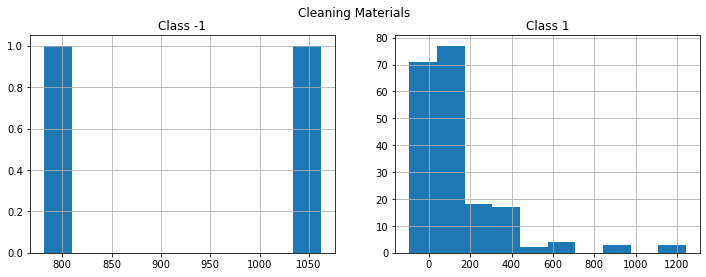

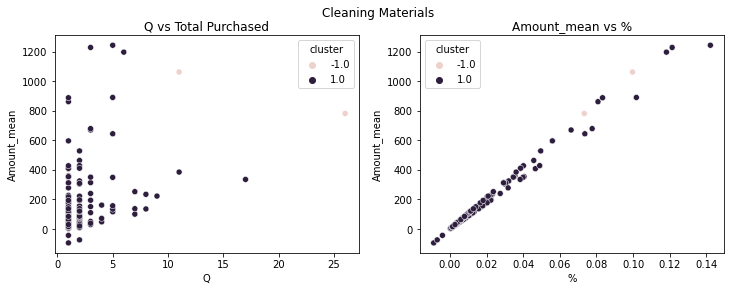

Distribution of usual vs unusual


 1.0    0.989848
-1.0    0.010152
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   195.000000
                      mean     18.500000     1.830769
                      std      10.606602     1.944349
                      min      11.000000     1.000000
                      25%      14.750000     1.000000
                      50%      18.500000     1.000000
                      75%      22.250000     2.000000
                      max      26.000000    17.000000
Amount_mean           count     2.000000   195.000000
                      mean    921.800000   141.954821
                      std     198.343452   214.096105
                      min     781.550000   -94.640000
                      25%     851.675000    20.995000
                      50%     921.800000    64.200000
                      75%     991.925000   159.035000
                      max    1062.050000  1243.410000
%                     count     2.000000   195.000000
                      mean      0.086502     0.014497
                      std       0.018613     0.022175
                      min       0.073341    -0.008881
                      25%       0.079922     0.002164
                      50%       0.086502     0.006330
                      75%       0.093083     0.016623
                      max       0.099663     0.142201
Amount_mean_over_past count     2.000000   195.000000
                      mean     32.093704     0.511612
                      std      42.088800     2.681764
                      min       2.332428     0.000000
                      25%      17.213066     0.000000
                      50%      32.093704     0.000000
                      75%      46.974342     0.000000
                      max      61.854980    34.876847

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


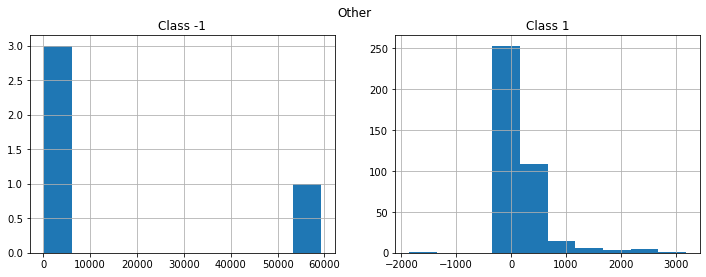

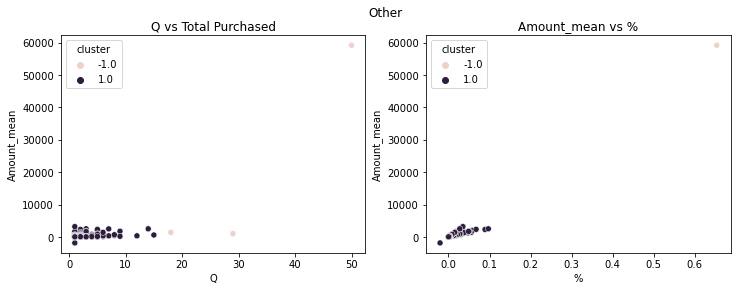

Distribution of usual vs unusual


 1.0    0.989899
-1.0    0.010101
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count      4.000000   392.000000
                      mean      24.500000     1.744898
                      std       20.534524     1.692839
                      min        1.000000     1.000000
                      25%       13.750000     1.000000
                      50%       23.500000     1.000000
                      75%       34.250000     2.000000
                      max       50.000000    15.000000
Amount_mean           count      4.000000   392.000000
                      mean   15440.182500   227.575663
                      std    29175.587647   428.022662
                      min      145.500000 -1857.110000
                      25%      797.625000    32.255000
                      50%     1209.390000    84.000000
                      75%    15851.947500   230.055000
                      max    59196.450000  3185.000000
%                     count      4.000000   392.000000
                      mean       0.177530     0.005842
                      std        0.317781     0.011419
                      min        0.001607    -0.020506
                      25%        0.012027     0.000650
                      50%        0.027444     0.001938
                      75%        0.192947     0.005670
                      max        0.653626     0.097134
Amount_mean_over_past count      4.000000   392.000000
                      mean       5.861036     0.307586
                      std        9.168216     1.119776
                      min        0.000000     0.000000
                      25%        0.000000     0.000000
                      50%        2.073530     0.000000
                      75%        7.934566     0.000000
                      max       19.297082    12.510638

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


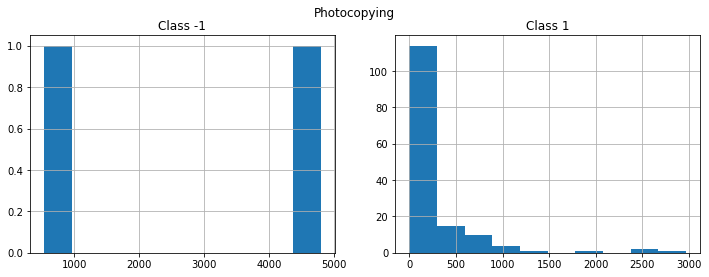

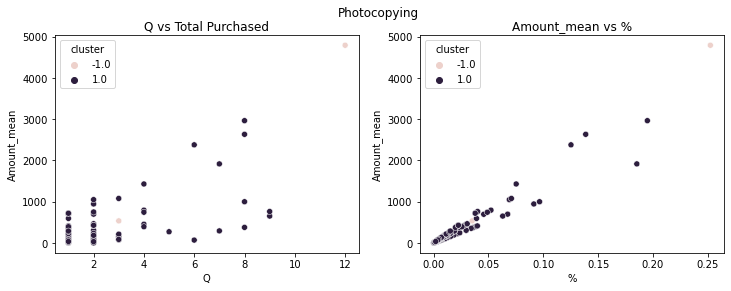

Distribution of usual vs unusual


 1.0    0.986667
-1.0    0.013333
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   148.000000
                      mean      7.500000     1.851351
                      std       6.363961     1.758806
                      min       3.000000     1.000000
                      25%       5.250000     1.000000
                      50%       7.500000     1.000000
                      75%       9.750000     2.000000
                      max      12.000000     9.000000
Amount_mean           count     2.000000   148.000000
                      mean   2665.545000   265.098649
                      std    3013.413330   451.515303
                      min     534.740000     0.000000
                      25%    1600.142500    49.062500
                      50%    2665.545000   104.760000
                      75%    3730.947500   276.900000
                      max    4796.350000  2966.110000
%                     count     2.000000   148.000000
                      mean      0.143773     0.018327
                      std       0.153627     0.030318
                      min       0.035143     0.000000
                      25%       0.089458     0.003301
                      50%       0.143773     0.007810
                      75%       0.198089     0.018930
                      max       0.252404     0.194931
Amount_mean_over_past count     2.000000   148.000000
                      mean     11.156303     0.371339
                      std       9.489446     1.532494
                      min       4.446252     0.000000
                      25%       7.801278     0.000000
                      50%      11.156303     0.000000
                      75%      14.511329     0.000000
                      max      17.866355    15.819825

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


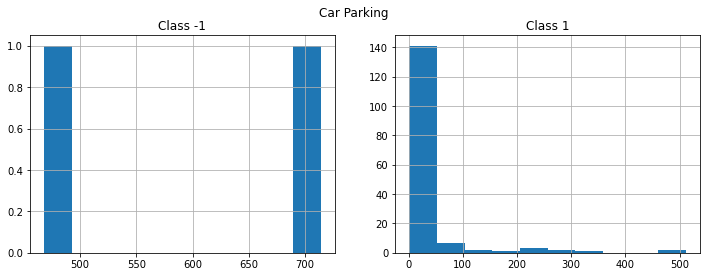

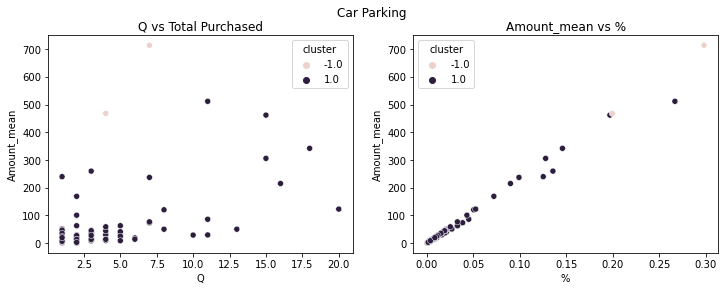

Distribution of usual vs unusual


 1.0    0.987578
-1.0    0.012422
Name: cluster, dtype: float64

cluster                            -1.0         1.0
Q                     count    2.000000  159.000000
                      mean     5.500000    2.710692
                      std      2.121320    3.387142
                      min      4.000000    1.000000
                      25%      4.750000    1.000000
                      50%      5.500000    1.000000
                      75%      6.250000    3.000000
                      max      7.000000   20.000000
Amount_mean           count    2.000000  159.000000
                      mean   591.000000   34.454717
                      std    173.948268   74.314416
                      min    468.000000    1.000000
                      25%    529.500000    6.100000
                      50%    591.000000   10.800000
                      75%    652.500000   27.750000
                      max    714.000000  511.740000
%                     count    2.000000  159.000000
                      mean     0.248746    0.015739
                      std      0.069772    0.034667
                      min      0.199409    0.000426
                      25%      0.224078    0.002925
                      50%      0.248746    0.004692
                      75%      0.273414    0.011706
                      max      0.298083    0.266801
Amount_mean_over_past count    2.000000  159.000000
                      mean     8.068966    0.509174
                      std     11.411240    2.024093
                      min      0.000000    0.000000
                      25%      4.034483    0.000000
                      50%      8.068966    0.000000
                      75%     12.103448    0.000000
                      max     16.137931   21.000000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


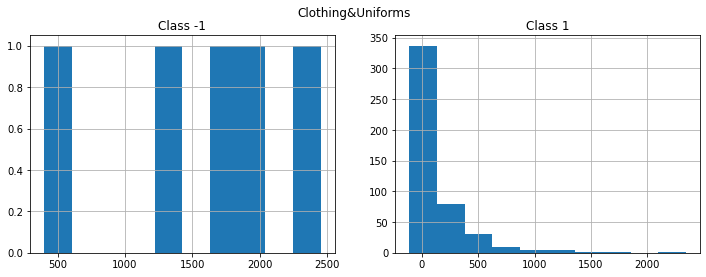

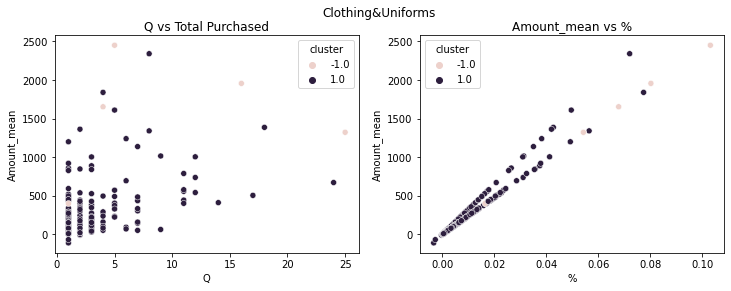

Distribution of usual vs unusual


 1.0    0.989451
-1.0    0.010549
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     5.000000   469.000000
                      mean     10.200000     1.991471
                      std      10.034939     2.404574
                      min       1.000000     1.000000
                      25%       4.000000     1.000000
                      50%       5.000000     1.000000
                      75%      16.000000     2.000000
                      max      25.000000    24.000000
Amount_mean           count     5.000000   469.000000
                      mean   1556.520000   155.305480
                      std     768.177054   263.865132
                      min     400.000000  -109.980000
                      25%    1322.490000    27.100000
                      50%    1653.540000    56.390000
                      75%    1956.250000   156.000000
                      max    2450.320000  2340.770000
%                     count     5.000000   469.000000
                      mean      0.064372     0.005710
                      std       0.032286     0.009493
                      min       0.016407    -0.003386
                      25%       0.054247     0.000954
                      50%       0.067826     0.002252
                      75%       0.080242     0.005893
                      max       0.103137     0.077431
Amount_mean_over_past count     5.000000   469.000000
                      mean      8.466464     0.424395
                      std      14.144853     1.618113
                      min       0.000000    -2.543331
                      25%       0.835729     0.000000
                      50%       2.369502     0.000000
                      75%       5.654288     0.000000
                      max      33.472803    20.000000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


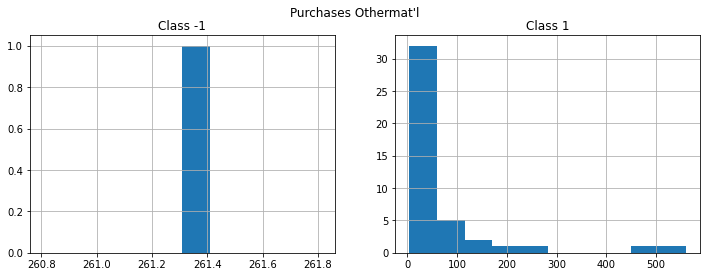

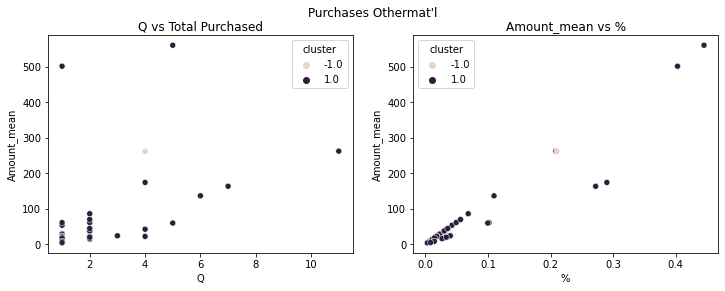

Distribution of usual vs unusual


 1.0    0.977273
-1.0    0.022727
Name: cluster, dtype: float64

cluster                            -1.0         1.0
Q                     count    1.000000   43.000000
                      mean     4.000000    2.186047
                      std           NaN    2.038391
                      min      4.000000    1.000000
                      25%      4.000000    1.000000
                      50%      4.000000    1.000000
                      75%      4.000000    2.000000
                      max      4.000000   11.000000
Amount_mean           count    1.000000   43.000000
                      mean   261.310000   66.035581
                      std           NaN  115.912973
                      min    261.310000    3.890000
                      25%    261.310000   16.895000
                      50%    261.310000   23.150000
                      75%    261.310000   56.710000
                      max    261.310000  559.830000
%                     count    1.000000   43.000000
                      mean     0.210175    0.064880
                      std           NaN    0.102581
                      min      0.210175    0.003093
                      25%      0.210175    0.014381
                      50%      0.210175    0.029135
                      75%      0.210175    0.045927
                      max      0.210175    0.445168
Amount_mean_over_past count    1.000000   43.000000
                      mean    67.174807    0.743970
                      std           NaN    2.446776
                      min     67.174807    0.000000
                      25%     67.174807    0.000000
                      50%     67.174807    0.000000
                      75%     67.174807    0.376800
                      max     67.174807   15.197380

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


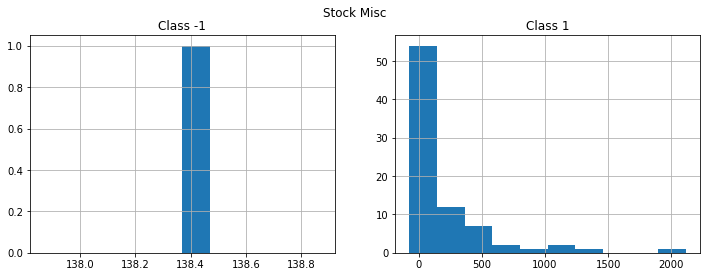

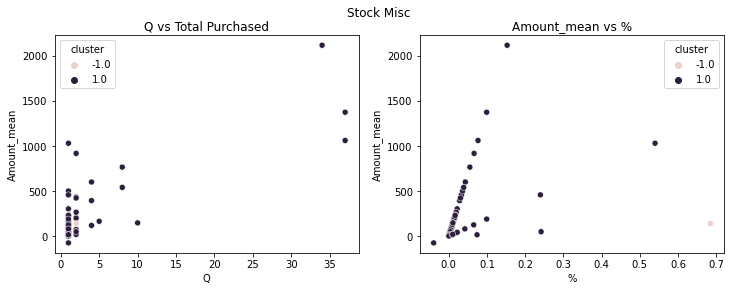

Distribution of usual vs unusual


 1.0    0.987654
-1.0    0.012346
Name: cluster, dtype: float64

cluster                            -1.0          1.0
Q                     count    1.000000    80.000000
                      mean     2.000000     2.887500
                      std           NaN     6.776717
                      min      2.000000     1.000000
                      25%      2.000000     1.000000
                      50%      2.000000     1.000000
                      75%      2.000000     1.250000
                      max      2.000000    37.000000
Amount_mean           count    1.000000    80.000000
                      mean   138.370000   198.032875
                      std           NaN   344.926584
                      min    138.370000   -75.600000
                      25%    138.370000    18.677500
                      50%    138.370000    72.000000
                      75%    138.370000   199.750000
                      max    138.370000  2116.400000
%                     count    1.000000    80.000000
                      mean     0.684627     0.028942
                      std           NaN     0.073095
                      min      0.684627    -0.039629
                      25%      0.684627     0.001384
                      50%      0.684627     0.006658
                      75%      0.684627     0.021854
                      max      0.684627     0.539865
Amount_mean_over_past count    1.000000    80.000000
                      mean     3.294524     0.038000
                      std           NaN     0.185063
                      min      3.294524     0.000000
                      25%      3.294524     0.000000
                      50%      3.294524     0.000000
                      75%      3.294524     0.000000
                      max      3.294524     1.270642

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


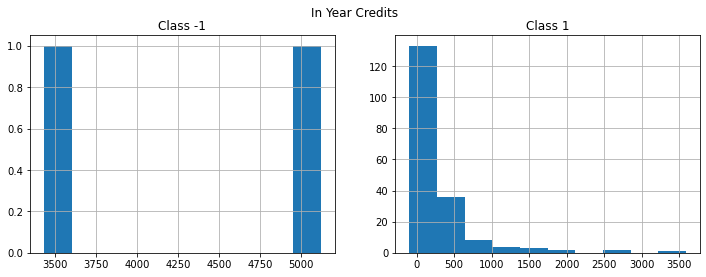

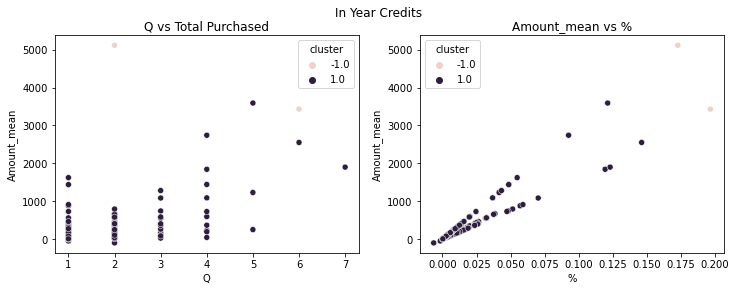

Distribution of usual vs unusual


 1.0    0.989529
-1.0    0.010471
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   189.000000
                      mean      4.000000     1.582011
                      std       2.828427     1.101205
                      min       2.000000     1.000000
                      25%       3.000000     1.000000
                      50%       4.000000     1.000000
                      75%       5.000000     2.000000
                      max       6.000000     7.000000
Amount_mean           count     2.000000   189.000000
                      mean   4275.470000   285.417407
                      std    1192.139607   480.471026
                      min    3432.500000  -100.000000
                      25%    3853.985000    41.800000
                      50%    4275.470000   120.000000
                      75%    4696.955000   294.000000
                      max    5118.440000  3592.500000
%                     count     2.000000   189.000000
                      mean      0.184803     0.013917
                      std       0.016919     0.022338
                      min       0.172840    -0.006478
                      25%       0.178822     0.002020
                      50%       0.184803     0.005847
                      75%       0.190785     0.015770
                      max       0.196767     0.146284
Amount_mean_over_past count     2.000000   189.000000
                      mean      6.321559     0.451158
                      std       8.940035     1.597179
                      min       0.000000     0.000000
                      25%       3.160780     0.000000
                      50%       6.321559     0.000000
                      75%       9.482339     0.000000
                      max      12.643118    15.763980

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


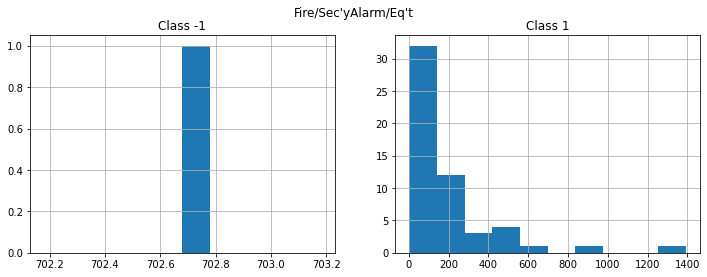

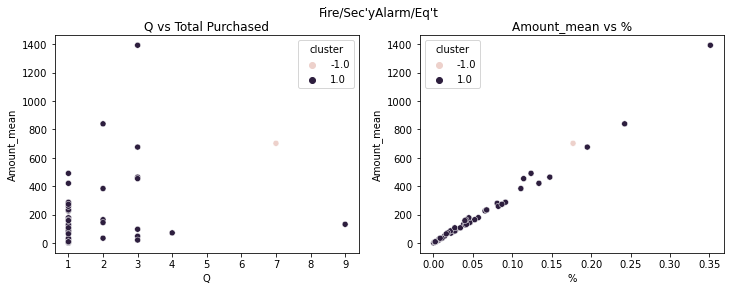

Distribution of usual vs unusual


 1.0    0.981818
-1.0    0.018182
Name: cluster, dtype: float64

cluster                            -1.0          1.0
Q                     count    1.000000    54.000000
                      mean     7.000000     1.574074
                      std           NaN     1.297339
                      min      7.000000     1.000000
                      25%      7.000000     1.000000
                      50%      7.000000     1.000000
                      75%      7.000000     2.000000
                      max      7.000000     9.000000
Amount_mean           count    1.000000    54.000000
                      mean   702.680000   182.895556
                      std           NaN   241.727300
                      min    702.680000     1.740000
                      25%    702.680000    34.850000
                      50%    702.680000   103.465000
                      75%    702.680000   232.305000
                      max    702.680000  1393.010000
%                     count    1.000000    54.000000
                      mean     0.177124     0.052275
                      std           NaN     0.065226
                      min      0.177124     0.000502
                      25%      0.177124     0.009359
                      50%      0.177124     0.028424
                      75%      0.177124     0.067059
                      max      0.177124     0.351135
Amount_mean_over_past count    1.000000    54.000000
                      mean     4.249138     0.143142
                      std           NaN     0.443468
                      min      4.249138     0.000000
                      25%      4.249138     0.000000
                      50%      4.249138     0.000000
                      75%      4.249138     0.000000
                      max      4.249138     2.333333

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


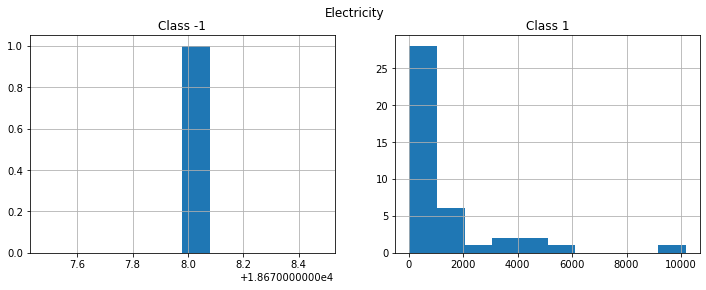

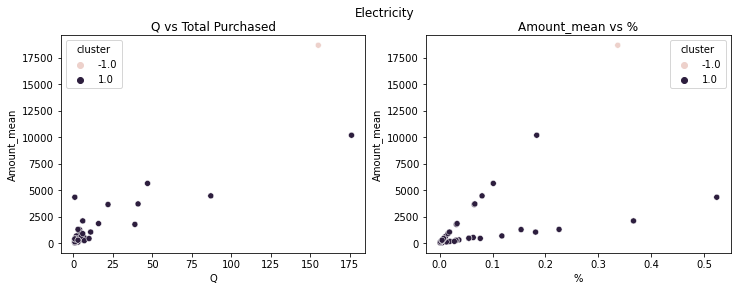

Distribution of usual vs unusual


 1.0    0.97619
-1.0    0.02381
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      1.000000     41.000000
                      mean     155.000000     13.024390
                      std             NaN     30.940659
                      min      155.000000      1.000000
                      25%      155.000000      1.000000
                      50%      155.000000      3.000000
                      75%      155.000000      7.000000
                      max      155.000000    176.000000
Amount_mean           count      1.000000     41.000000
                      mean   18677.980000   1239.520000
                      std             NaN   1987.989083
                      min    18677.980000     13.040000
                      25%    18677.980000    177.920000
                      50%    18677.980000    439.360000
                      75%    18677.980000   1272.870000
                      max    18677.980000  10181.950000
%                     count      1.000000     41.000000
                      mean       0.336453      0.064965
                      std             NaN      0.104817
                      min        0.336453      0.000969
                      25%        0.336453      0.006767
                      50%        0.336453      0.027963
                      75%        0.336453      0.066595
                      max        0.336453      0.523308
Amount_mean_over_past count      1.000000     41.000000
                      mean       0.000000      2.788672
                      std             NaN      8.946722
                      min        0.000000      0.000000
                      25%        0.000000      0.000000
                      50%        0.000000      0.000000
                      75%        0.000000      0.817947
                      max        0.000000     51.561350

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


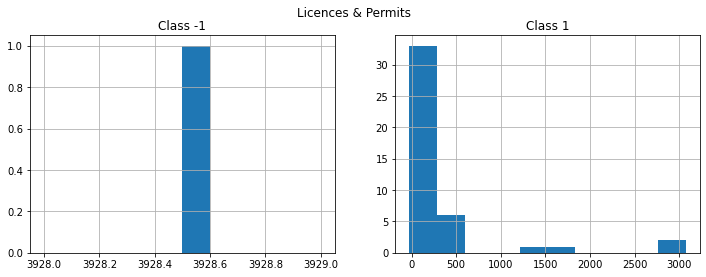

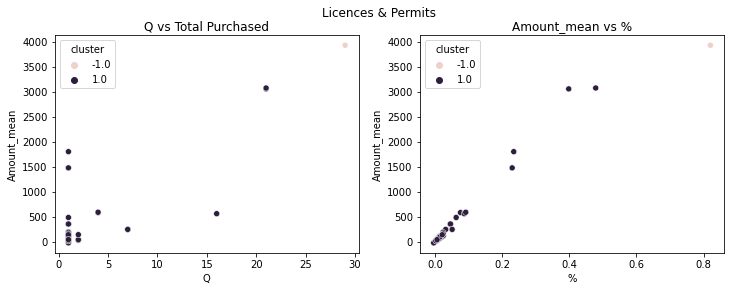

Distribution of usual vs unusual


 1.0    0.977273
-1.0    0.022727
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    43.000000
                      mean     29.000000     2.767442
                      std            NaN     4.839506
                      min      29.000000     1.000000
                      25%      29.000000     1.000000
                      50%      29.000000     1.000000
                      75%      29.000000     1.000000
                      max      29.000000    21.000000
Amount_mean           count     1.000000    43.000000
                      mean   3928.500000   347.761628
                      std            NaN   704.396533
                      min    3928.500000   -25.000000
                      25%    3928.500000    36.930000
                      50%    3928.500000    95.300000
                      75%    3928.500000   245.000000
                      max    3928.500000  3073.500000
%                     count     1.000000    43.000000
                      mean      0.820247     0.050692
                      std            NaN     0.100553
                      min       0.820247    -0.003894
                      25%       0.820247     0.006085
                      50%       0.820247     0.014598
                      75%       0.820247     0.038767
                      max       0.820247     0.478696
Amount_mean_over_past count     1.000000    43.000000
                      mean      1.285714     0.372776
                      std            NaN     1.286954
                      min       1.285714     0.000000
                      25%       1.285714     0.000000
                      50%       1.285714     0.000000
                      75%       1.285714     0.000000
                      max       1.285714     8.021739

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


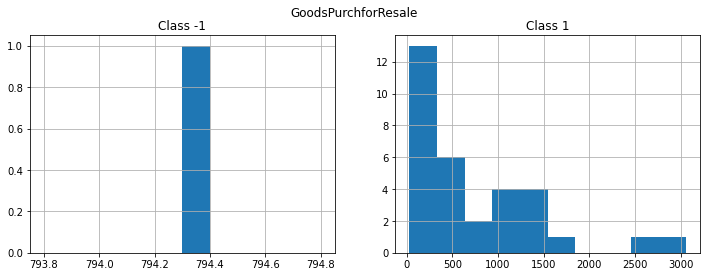

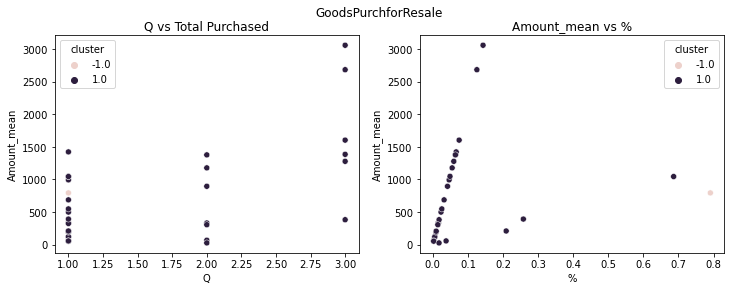

Distribution of usual vs unusual


 1.0    0.969697
-1.0    0.030303
Name: cluster, dtype: float64

cluster                            -1.0          1.0
Q                     count    1.000000    32.000000
                      mean     1.000000     1.593750
                      std           NaN     0.797552
                      min      1.000000     1.000000
                      25%      1.000000     1.000000
                      50%      1.000000     1.000000
                      75%      1.000000     2.000000
                      max      1.000000     3.000000
Amount_mean           count    1.000000    32.000000
                      mean   794.300000   721.854687
                      std           NaN   746.216491
                      min    794.300000    27.100000
                      25%    794.300000   196.720000
                      50%    794.300000   388.020000
                      75%    794.300000  1080.255000
                      max    794.300000  3059.160000
%                     count    1.000000    32.000000
                      mean     0.790899     0.069034
                      std           NaN     0.127255
                      min      0.790899     0.002520
                      25%      0.790899     0.013178
                      50%      0.790899     0.028930
                      75%      0.790899     0.064564
                      max      0.790899     0.686252
Amount_mean_over_past count    1.000000    32.000000
                      mean     0.295929     0.000000
                      std           NaN     0.000000
                      min      0.295929     0.000000
                      25%      0.295929     0.000000
                      50%      0.295929     0.000000
                      75%      0.295929     0.000000
                      max      0.295929     0.000000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


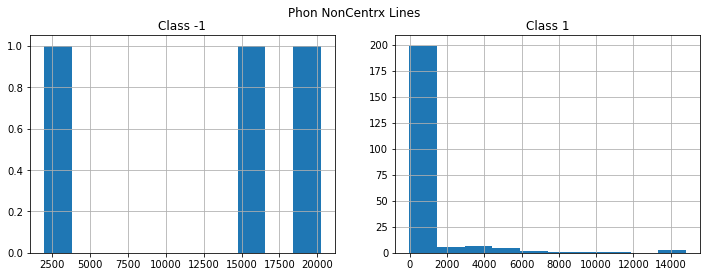

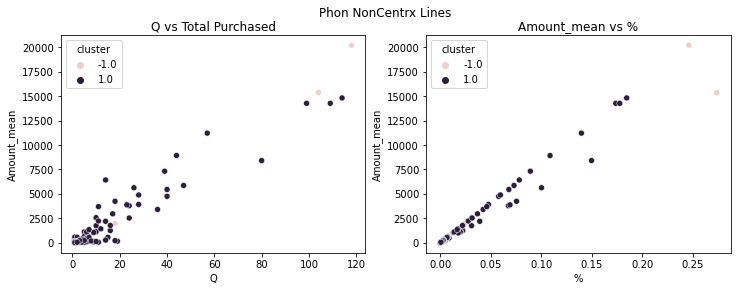

Distribution of usual vs unusual


 1.0    0.986842
-1.0    0.013158
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      3.000000    225.000000
                      mean      80.000000      6.822222
                      std       54.147945     15.405949
                      min       18.000000      1.000000
                      25%       61.000000      1.000000
                      50%      104.000000      2.000000
                      75%      111.000000      5.000000
                      max      118.000000    114.000000
Amount_mean           count      3.000000    225.000000
                      mean   12519.263333    804.525867
                      std     9462.131986   2252.567330
                      min     1958.050000    -31.440000
                      25%     8666.780000     34.990000
                      50%    15375.510000     83.840000
                      75%    17799.870000    227.880000
                      max    20224.230000  14825.700000
%                     count      3.000000    225.000000
                      mean       0.181499      0.010913
                      std        0.136766      0.029552
                      min        0.024384     -0.000392
                      25%        0.135308      0.000487
                      50%        0.246233      0.001093
                      75%        0.260057      0.003237
                      max        0.273881      0.184624
Amount_mean_over_past count      3.000000    225.000000
                      mean      13.492118      0.749202
                      std       22.239631      2.493878
                      min        0.000000      0.000000
                      25%        0.657677      0.000000
                      50%        1.315353      0.000000
                      75%       20.238177      0.505885
                      max       39.161000     30.526447

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


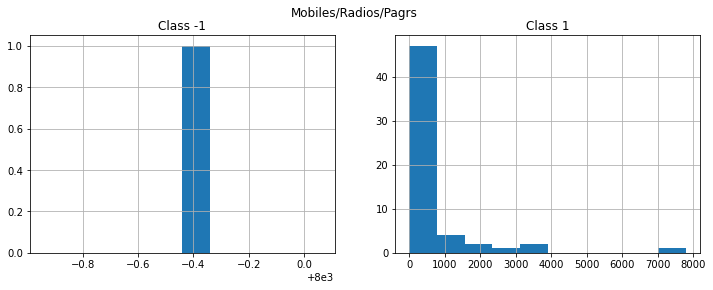

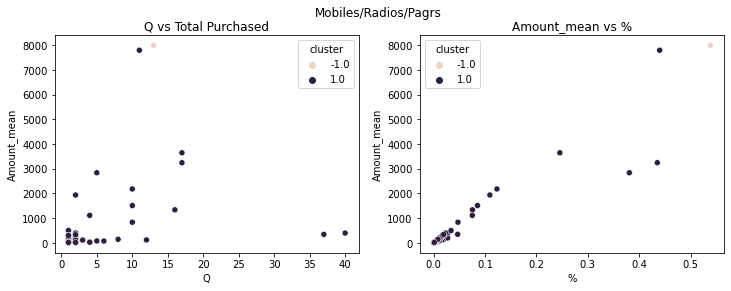

Distribution of usual vs unusual


 1.0    0.982759
-1.0    0.017241
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    57.000000
                      mean     13.000000     4.701754
                      std            NaN     7.773501
                      min      13.000000     1.000000
                      25%      13.000000     1.000000
                      50%      13.000000     1.000000
                      75%      13.000000     4.000000
                      max      13.000000    40.000000
Amount_mean           count     1.000000    57.000000
                      mean   7999.560000   562.012982
                      std            NaN  1272.716294
                      min    7999.560000     0.100000
                      25%    7999.560000    21.050000
                      50%    7999.560000   113.300000
                      75%    7999.560000   345.000000
                      max    7999.560000  7798.010000
%                     count     1.000000    57.000000
                      mean      0.538629     0.043182
                      std            NaN     0.098148
                      min       0.538629     0.000006
                      25%       0.538629     0.001749
                      50%       0.538629     0.007676
                      75%       0.538629     0.024810
                      max       0.538629     0.439922
Amount_mean_over_past count     1.000000    57.000000
                      mean    380.026603     1.150169
                      std            NaN     4.777613
                      min     380.026603     0.000000
                      25%     380.026603     0.000000
                      50%     380.026603     0.000000
                      75%     380.026603     0.473808
                      max     380.026603    33.881202

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


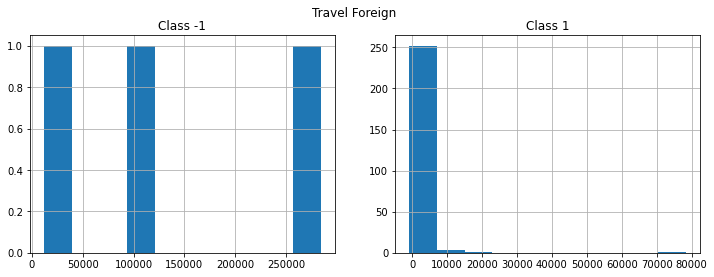

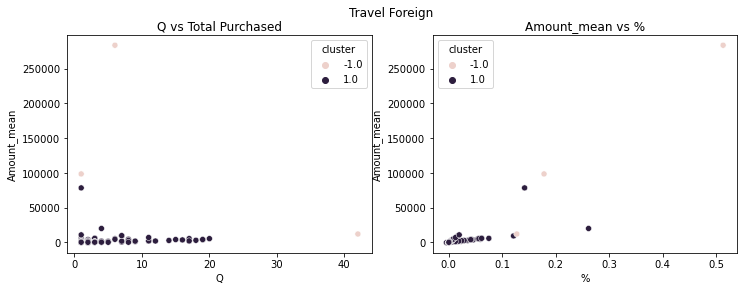

Distribution of usual vs unusual


 1.0    0.988462
-1.0    0.011538
Name: cluster, dtype: float64

cluster                               -1.0           1.0
Q                     count       3.000000    257.000000
                      mean       16.333333      2.498054
                      std        22.368132      3.537880
                      min         1.000000      1.000000
                      25%         3.500000      1.000000
                      50%         6.000000      1.000000
                      75%        24.000000      2.000000
                      max        42.000000     20.000000
Amount_mean           count       3.000000    257.000000
                      mean   131462.903333   1280.709066
                      std    138900.786117   5218.028259
                      min     11990.250000   -850.240000
                      25%     55258.625000    120.000000
                      50%     98527.000000    303.500000
                      75%    191199.230000   1006.910000
                      max    283871.460000  78400.000000
%                     count       3.000000    257.000000
                      mean        0.272893      0.008488
                      std         0.209778      0.022650
                      min         0.127183     -0.004490
                      25%         0.152675      0.000409
                      50%         0.178168      0.002014
                      75%         0.345748      0.005716
                      max         0.513328      0.261524
Amount_mean_over_past count       3.000000    257.000000
                      mean       96.250121      0.610257
                      std       160.833977      2.662276
                      min         0.000000     -0.989482
                      25%         3.413497      0.000000
                      50%         6.826994      0.000000
                      75%       144.375182      0.000000
                      max       281.923370     20.687887

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


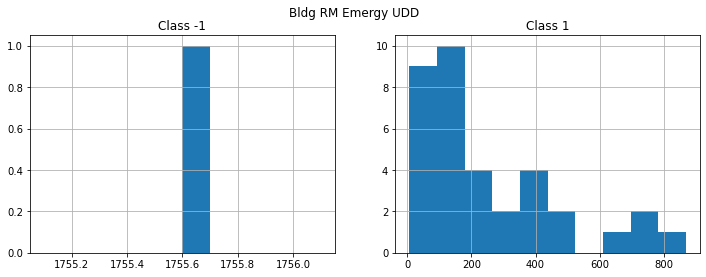

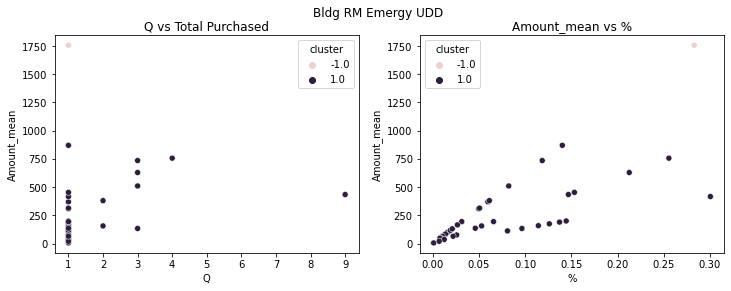

Distribution of usual vs unusual


 1.0    0.972222
-1.0    0.027778
Name: cluster, dtype: float64

cluster                             -1.0         1.0
Q                     count     1.000000   35.000000
                      mean      1.000000    1.600000
                      std            NaN    1.518513
                      min       1.000000    1.000000
                      25%       1.000000    1.000000
                      50%       1.000000    1.000000
                      75%       1.000000    1.000000
                      max       1.000000    9.000000
Amount_mean           count     1.000000   35.000000
                      mean   1755.600000  251.141429
                      std            NaN  225.885863
                      min    1755.600000    5.800000
                      25%    1755.600000   91.910000
                      50%    1755.600000  165.320000
                      75%    1755.600000  374.860000
                      max    1755.600000  869.750000
%                     count     1.000000   35.000000
                      mean      0.283004    0.077628
                      std            NaN    0.073983
                      min       0.283004    0.000935
                      25%       0.283004    0.020001
                      50%       0.283004    0.052816
                      75%       0.283004    0.122315
                      max       0.283004    0.300552
Amount_mean_over_past count     1.000000   35.000000
                      mean      0.000000    0.148459
                      std            NaN    0.591940
                      min       0.000000    0.000000
                      25%       0.000000    0.000000
                      50%       0.000000    0.000000
                      75%       0.000000    0.000000
                      max       0.000000    3.320394

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


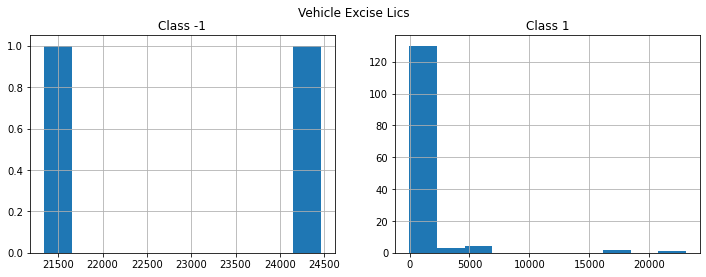

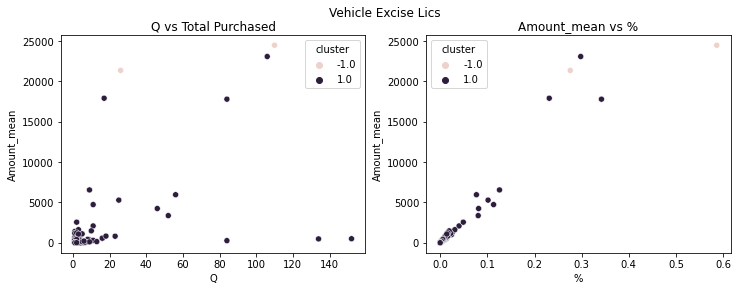

Distribution of usual vs unusual


 1.0    0.985915
-1.0    0.014085
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      2.000000    140.000000
                      mean      68.000000      8.214286
                      std       59.396970     22.252568
                      min       26.000000      1.000000
                      25%       47.000000      1.000000
                      50%       68.000000      2.000000
                      75%       89.000000      4.000000
                      max      110.000000    152.000000
Amount_mean           count      2.000000    140.000000
                      mean   22899.775000    894.854786
                      std     2204.723588   2994.595942
                      min    21340.800000    -25.000000
                      25%    22120.287500     26.612500
                      50%    22899.775000    140.000000
                      75%    23679.262500    411.480000
                      max    24458.750000  23063.000000
%                     count      2.000000    140.000000
                      mean       0.431135      0.015269
                      std        0.219731      0.046145
                      min        0.275762     -0.000323
                      25%        0.353449      0.000476
                      50%        0.431135      0.002637
                      75%        0.508822      0.009496
                      max        0.586509      0.341999
Amount_mean_over_past count      2.000000    140.000000
                      mean       1.632209      0.601573
                      std        2.308291      2.632719
                      min        0.000000     -1.666667
                      25%        0.816104      0.000000
                      50%        1.632209      0.000000
                      75%        2.448313      0.325069
                      max        3.264417     29.000000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


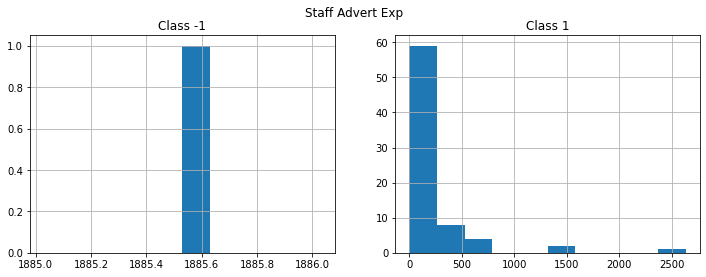

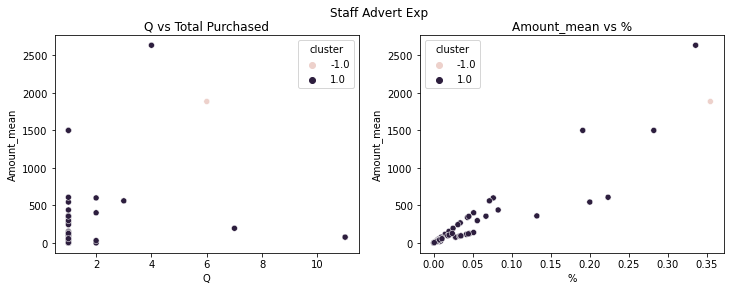

Distribution of usual vs unusual


 1.0    0.986667
-1.0    0.013333
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    74.000000
                      mean      6.000000     1.486486
                      std            NaN     1.799872
                      min       6.000000     1.000000
                      25%       6.000000     1.000000
                      50%       6.000000     1.000000
                      75%       6.000000     1.000000
                      max       6.000000    11.000000
Amount_mean           count     1.000000    74.000000
                      mean   1885.530000   189.245000
                      std            NaN   396.647731
                      min    1885.530000     0.000000
                      25%    1885.530000    20.000000
                      50%    1885.530000    55.190000
                      75%    1885.530000   136.130000
                      max    1885.530000  2635.490000
%                     count     1.000000    74.000000
                      mean      0.354639     0.035748
                      std            NaN     0.063694
                      min       0.354639     0.000000
                      25%       0.354639     0.003633
                      50%       0.354639     0.008866
                      75%       0.354639     0.040209
                      max       0.354639     0.335730
Amount_mean_over_past count     1.000000    74.000000
                      mean      3.097940     0.018020
                      std            NaN     0.119349
                      min       3.097940     0.000000
                      25%       3.097940     0.000000
                      50%       3.097940     0.000000
                      75%       3.097940     0.000000
                      max       3.097940     1.000000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


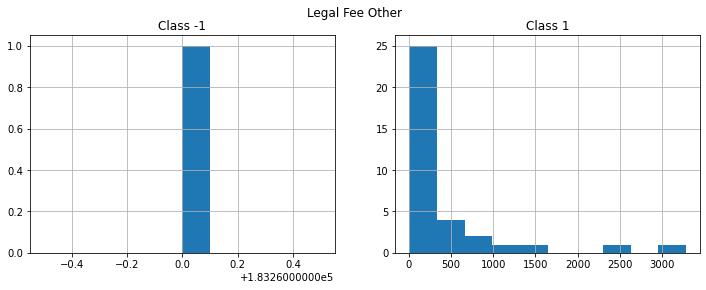

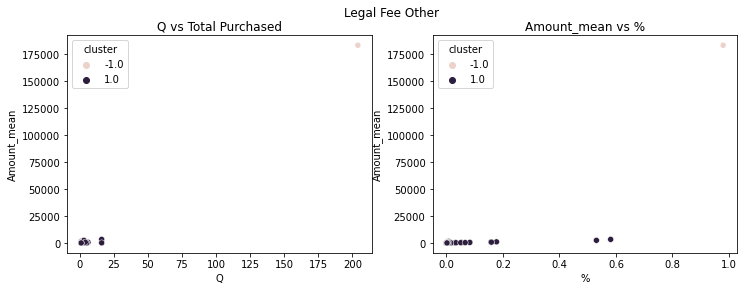

Distribution of usual vs unusual


 1.0    0.972222
-1.0    0.027778
Name: cluster, dtype: float64

cluster                               -1.0          1.0
Q                     count       1.000000    35.000000
                      mean      204.000000     2.742857
                      std              NaN     3.575594
                      min       204.000000     1.000000
                      25%       204.000000     1.000000
                      50%       204.000000     1.000000
                      75%       204.000000     3.000000
                      max       204.000000    16.000000
Amount_mean           count       1.000000    35.000000
                      mean   183260.000000   400.532857
                      std              NaN   693.773355
                      min    183260.000000     7.750000
                      25%    183260.000000    38.965000
                      50%    183260.000000   121.200000
                      75%    183260.000000   434.075000
                      max    183260.000000  3280.000000
%                     count       1.000000    35.000000
                      mean        0.979394     0.057732
                      std              NaN     0.133343
                      min         0.979394     0.000046
                      25%         0.979394     0.001331
                      50%         0.979394     0.004881
                      75%         0.979394     0.042172
                      max         0.979394     0.581328
Amount_mean_over_past count       1.000000    35.000000
                      mean        0.000000     6.601596
                      std              NaN    36.907504
                      min         0.000000     0.000000
                      25%         0.000000     0.000000
                      50%         0.000000     0.000000
                      75%         0.000000     0.586400
                      max         0.000000   218.666667

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


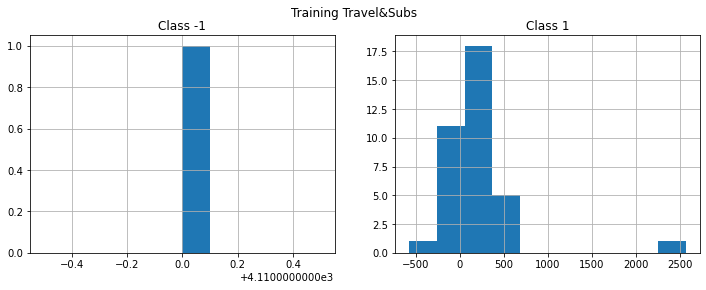

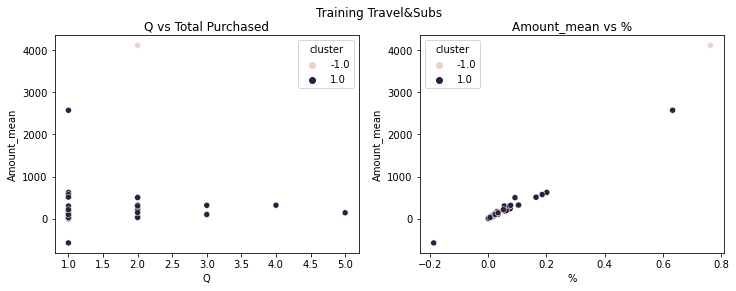

Distribution of usual vs unusual


 1.0    0.972973
-1.0    0.027027
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    36.000000
                      mean      2.000000     1.555556
                      std            NaN     0.939436
                      min       2.000000     1.000000
                      25%       2.000000     1.000000
                      50%       2.000000     1.000000
                      75%       2.000000     2.000000
                      max       2.000000     5.000000
Amount_mean           count     1.000000    36.000000
                      mean   4110.000000   233.980833
                      std            NaN   455.196230
                      min    4110.000000  -573.600000
                      25%    4110.000000    43.117500
                      50%    4110.000000   130.195000
                      75%    4110.000000   306.257500
                      max    4110.000000  2570.000000
%                     count     1.000000    36.000000
                      mean      0.762607     0.062150
                      std            NaN     0.118965
                      min       0.762607    -0.185969
                      25%       0.762607     0.008456
                      50%       0.762607     0.032969
                      75%       0.762607     0.076635
                      max       0.762607     0.633080
Amount_mean_over_past count     1.000000    36.000000
                      mean      0.000000     0.109043
                      std            NaN     0.282507
                      min       0.000000     0.000000
                      25%       0.000000     0.000000
                      50%       0.000000     0.000000
                      75%       0.000000     0.000000
                      max       0.000000     1.045139

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


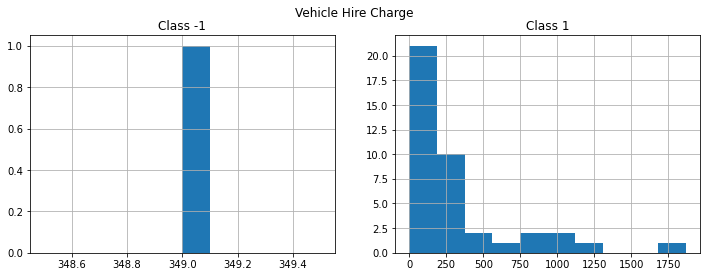

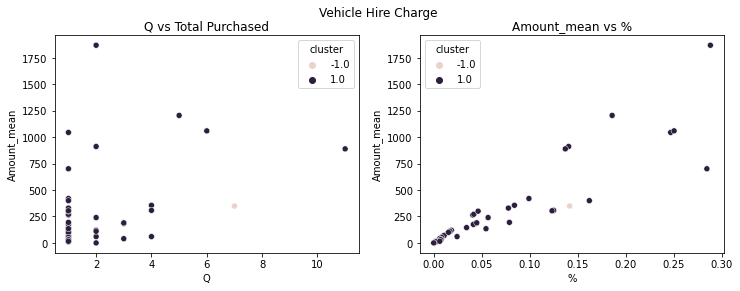

Distribution of usual vs unusual


 1.0    0.97561
-1.0    0.02439
Name: cluster, dtype: float64

cluster                            -1.0          1.0
Q                     count    1.000000    40.000000
                      mean     7.000000     2.025000
                      std           NaN     1.928032
                      min      7.000000     1.000000
                      25%      7.000000     1.000000
                      50%      7.000000     1.000000
                      75%      7.000000     2.000000
                      max      7.000000    11.000000
Amount_mean           count    1.000000    40.000000
                      mean   349.000000   321.140000
                      std           NaN   407.071421
                      min    349.000000     0.000000
                      25%    349.000000    59.987500
                      50%    349.000000   179.325000
                      75%    349.000000   336.195000
                      max    349.000000  1870.000000
%                     count    1.000000    40.000000
                      mean     0.141505     0.071462
                      std           NaN     0.082154
                      min      0.141505     0.000000
                      25%      0.141505     0.010481
                      50%      0.141505     0.041555
                      75%      0.141505     0.105166
                      max      0.141505     0.288027
Amount_mean_over_past count    1.000000    40.000000
                      mean     5.821518     0.154624
                      std           NaN     0.431684
                      min      5.821518     0.000000
                      25%      5.821518     0.000000
                      50%      5.821518     0.000000
                      75%      5.821518     0.000000
                      max      5.821518     1.900000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


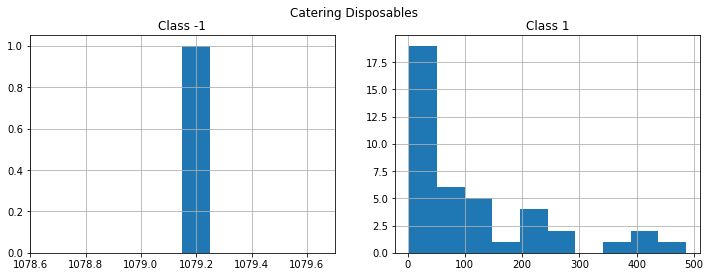

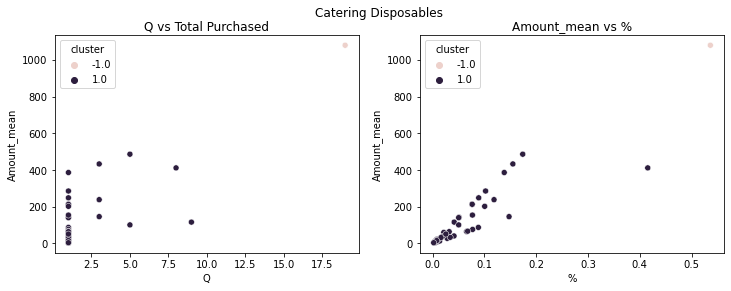

Distribution of usual vs unusual


 1.0    0.97619
-1.0    0.02381
Name: cluster, dtype: float64

cluster                             -1.0         1.0
Q                     count     1.000000   41.000000
                      mean     19.000000    1.707317
                      std            NaN    1.847213
                      min      19.000000    1.000000
                      25%      19.000000    1.000000
                      50%      19.000000    1.000000
                      75%      19.000000    1.000000
                      max      19.000000    9.000000
Amount_mean           count     1.000000   41.000000
                      mean   1079.150000  115.124878
                      std            NaN  130.481931
                      min    1079.150000    3.000000
                      25%    1079.150000   19.150000
                      50%    1079.150000   64.250000
                      75%    1079.150000  154.610000
                      max    1079.150000  486.070000
%                     count     1.000000   41.000000
                      mean      0.536152    0.060094
                      std            NaN    0.073911
                      min       0.536152    0.001987
                      25%       0.536152    0.009153
                      50%       0.536152    0.041273
                      75%       0.536152    0.077197
                      max       0.536152    0.415240
Amount_mean_over_past count     1.000000   41.000000
                      mean      2.220153    0.145523
                      std            NaN    0.343795
                      min       2.220153    0.000000
                      25%       2.220153    0.000000
                      50%       2.220153    0.000000
                      75%       2.220153    0.000000
                      max       2.220153    1.181244

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


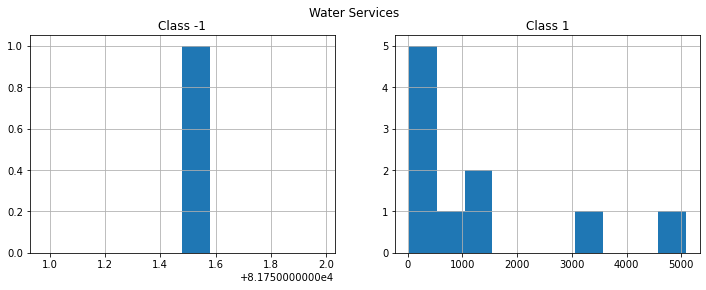

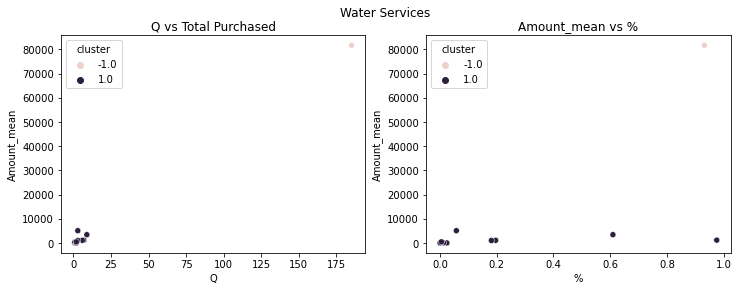

Distribution of usual vs unusual


 1.0    0.909091
-1.0    0.090909
Name: cluster, dtype: float64

cluster                              -1.0          1.0
Q                     count      1.000000    10.000000
                      mean     185.000000     3.500000
                      std             NaN     2.838231
                      min      185.000000     1.000000
                      25%      185.000000     1.250000
                      50%      185.000000     2.500000
                      75%      185.000000     5.250000
                      max      185.000000     9.000000
Amount_mean           count      1.000000    10.000000
                      mean   81751.480000  1282.515000
                      std             NaN  1676.951278
                      min    81751.480000    29.760000
                      25%    81751.480000   142.750000
                      50%    81751.480000   748.320000
                      75%    81751.480000  1166.297500
                      max    81751.480000  5083.980000
%                     count      1.000000    10.000000
                      mean       0.932046     0.206795
                      std             NaN     0.328516
                      min        0.932046     0.000521
                      25%        0.932046     0.007169
                      50%        0.932046     0.041230
                      75%        0.932046     0.192678
                      max        0.932046     0.975503
Amount_mean_over_past count      1.000000    10.000000
                      mean       0.000000    17.452792
                      std             NaN    53.899651
                      min        0.000000     0.000000
                      25%        0.000000     0.000000
                      50%        0.000000     0.006632
                      75%        0.000000     0.406480
                      max        0.000000   170.832661

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


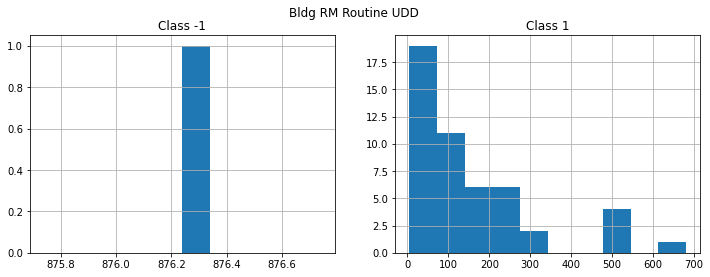

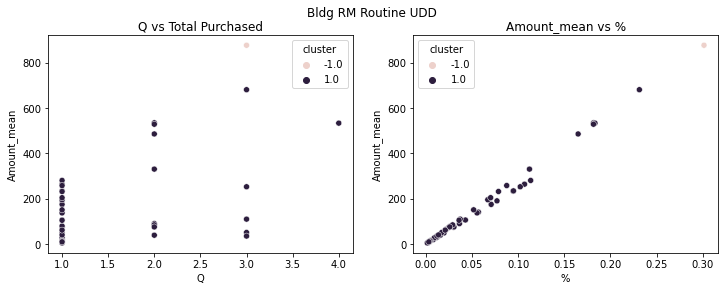

Distribution of usual vs unusual


 1.0    0.98
-1.0    0.02
Name: cluster, dtype: float64

cluster                           -1.0         1.0
Q                     count    1.00000   49.000000
                      mean     3.00000    1.428571
                      std          NaN    0.763763
                      min      3.00000    1.000000
                      25%      3.00000    1.000000
                      50%      3.00000    1.000000
                      75%      3.00000    2.000000
                      max      3.00000    4.000000
Amount_mean           count    1.00000   49.000000
                      mean   876.24000  151.724694
                      std          NaN  162.816116
                      min    876.24000    4.500000
                      25%    876.24000   34.670000
                      50%    876.24000   84.160000
                      75%    876.24000  231.290000
                      max    876.24000  680.120000
%                     count    1.00000   49.000000
                      mean     0.30147    0.055072
                      std          NaN    0.056579
                      min      0.30147    0.001531
                      25%      0.30147    0.012169
                      50%      0.30147    0.030422
                      75%      0.30147    0.078700
                      max      0.30147    0.231422
Amount_mean_over_past count    1.00000   49.000000
                      mean     0.00000    0.341768
                      std          NaN    1.010990
                      min      0.00000    0.000000
                      25%      0.00000    0.000000
                      50%      0.00000    0.000000
                      75%      0.00000    0.000000
                      max      0.00000    5.865416

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


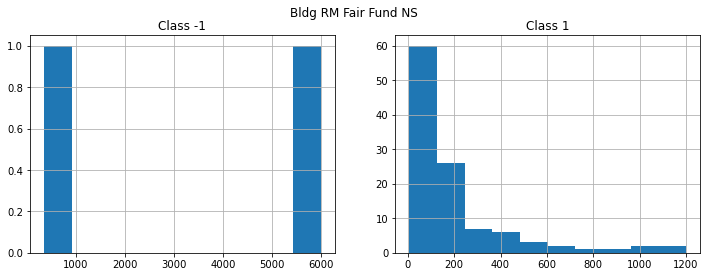

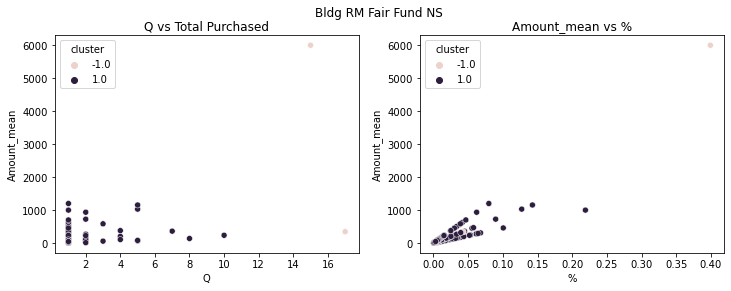

Distribution of usual vs unusual


 1.0    0.982143
-1.0    0.017857
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     2.000000   110.000000
                      mean     16.000000     1.563636
                      std       1.414214     1.487115
                      min      15.000000     1.000000
                      25%      15.500000     1.000000
                      50%      16.000000     1.000000
                      75%      16.500000     1.000000
                      max      17.000000    10.000000
Amount_mean           count     2.000000   110.000000
                      mean   3170.815000   194.043818
                      std    3993.689603   249.727603
                      min     346.850000     5.980000
                      25%    1758.832500    33.252500
                      50%    3170.815000   106.540000
                      75%    4582.797500   230.515000
                      max    5994.780000  1200.000000
%                     count     2.000000   110.000000
                      mean      0.220926     0.023256
                      std       0.251854     0.032089
                      min       0.042839     0.000407
                      25%       0.131883     0.003476
                      50%       0.220926     0.012285
                      75%       0.309970     0.031468
                      max       0.399014     0.219019
Amount_mean_over_past count     2.000000   110.000000
                      mean      3.326044     0.098624
                      std       2.635864     0.436882
                      min       1.462206     0.000000
                      25%       2.394125     0.000000
                      50%       3.326044     0.000000
                      75%       4.257963     0.000000
                      max       5.189881     3.250000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


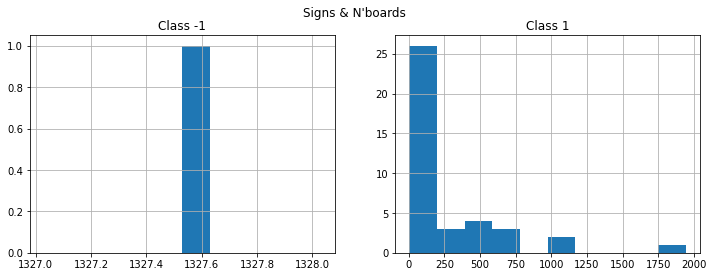

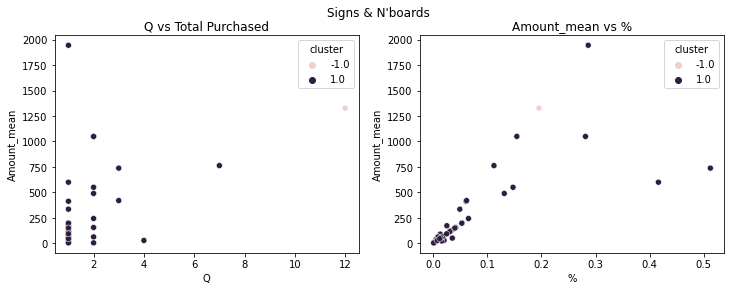

Distribution of usual vs unusual


 1.0    0.975
-1.0    0.025
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    39.000000
                      mean     12.000000     1.538462
                      std            NaN     1.143544
                      min      12.000000     1.000000
                      25%      12.000000     1.000000
                      50%      12.000000     1.000000
                      75%      12.000000     2.000000
                      max      12.000000     7.000000
Amount_mean           count     1.000000    39.000000
                      mean   1327.530000   272.604872
                      std            NaN   393.596937
                      min    1327.530000     3.990000
                      25%    1327.530000    40.865000
                      50%    1327.530000   114.590000
                      75%    1327.530000   374.270000
                      max    1327.530000  1945.000000
%                     count     1.000000    39.000000
                      mean      0.195525     0.071910
                      std            NaN     0.114927
                      min       0.195525     0.001070
                      25%       0.195525     0.009385
                      50%       0.195525     0.030739
                      75%       0.195525     0.061361
                      max       0.195525     0.512117
Amount_mean_over_past count     1.000000    39.000000
                      mean     57.794079     0.098410
                      std            NaN     0.361269
                      min      57.794079     0.000000
                      25%      57.794079     0.000000
                      50%      57.794079     0.000000
                      75%      57.794079     0.000000
                      max      57.794079     1.750000

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


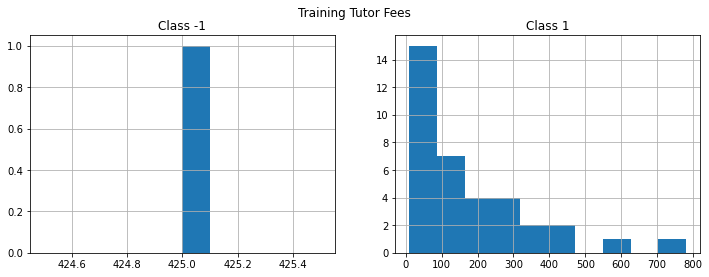

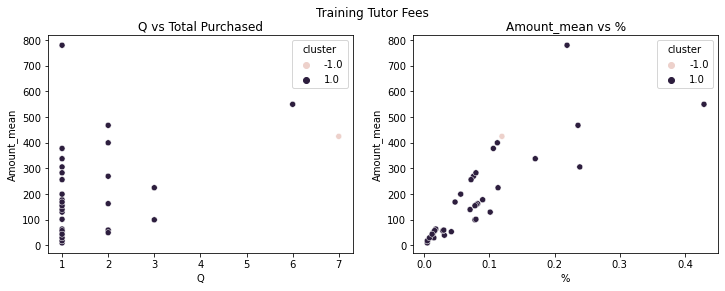

Distribution of usual vs unusual


 1.0    0.972973
-1.0    0.027027
Name: cluster, dtype: float64

cluster                            -1.0         1.0
Q                     count    1.000000   36.000000
                      mean     7.000000    1.444444
                      std           NaN    0.969372
                      min      7.000000    1.000000
                      25%      7.000000    1.000000
                      50%      7.000000    1.000000
                      75%      7.000000    2.000000
                      max      7.000000    6.000000
Amount_mean           count    1.000000   36.000000
                      mean   425.000000  177.707778
                      std           NaN  172.251357
                      min    425.000000   10.000000
                      25%    425.000000   53.230000
                      50%    425.000000  135.000000
                      75%    425.000000  259.800000
                      max    425.000000  780.000000
%                     count    1.000000   36.000000
                      mean     0.119454    0.080015
                      std           NaN    0.086905
                      min      0.119454    0.005043
                      25%      0.119454    0.016724
                      50%      0.119454    0.071347
                      75%      0.119454    0.092756
                      max      0.119454    0.429134
Amount_mean_over_past count    1.000000   36.000000
                      mean     1.888889    0.023148
                      std           NaN    0.138889
                      min      1.888889    0.000000
                      25%      1.888889    0.000000
                      50%      1.888889    0.000000
                      75%      1.888889    0.000000
                      max      1.888889    0.833333

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


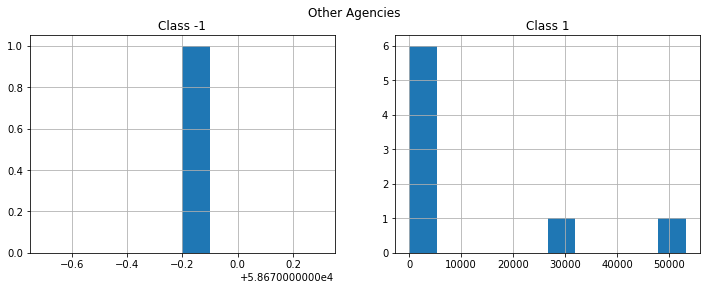

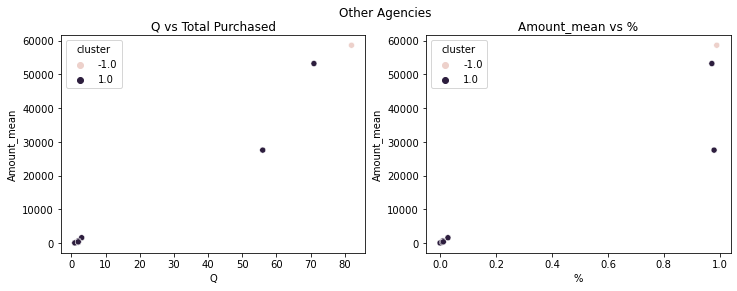

Distribution of usual vs unusual


 1.0    0.888889
-1.0    0.111111
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count      1.000000      8.000000
                      mean      82.000000     17.250000
                      std             NaN     28.833265
                      min       82.000000      1.000000
                      25%       82.000000      1.750000
                      50%       82.000000      2.000000
                      75%       82.000000     16.250000
                      max       82.000000     71.000000
Amount_mean           count      1.000000      8.000000
                      mean   58669.800000  10449.593750
                      std             NaN  19725.284784
                      min    58669.800000     16.500000
                      25%    58669.800000    186.250000
                      50%    58669.800000    477.085000
                      75%    58669.800000   8060.650000
                      max    58669.800000  53244.080000
%                     count      1.000000      8.000000
                      mean       0.988934      0.251383
                      std             NaN      0.446994
                      min        0.988934      0.000278
                      25%        0.988934      0.006503
                      50%        0.988934      0.011211
                      75%        0.988934      0.264257
                      max        0.988934      0.979413
Amount_mean_over_past count      1.000000      8.000000
                      mean       1.101903      0.058706
                      std             NaN      0.166046
                      min        1.101903      0.000000
                      25%        1.101903      0.000000
                      50%        1.101903      0.000000
                      75%        1.101903      0.000000
                      max        1.101903      0.469649

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


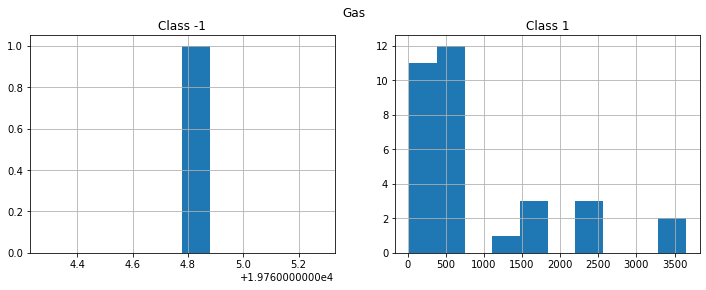

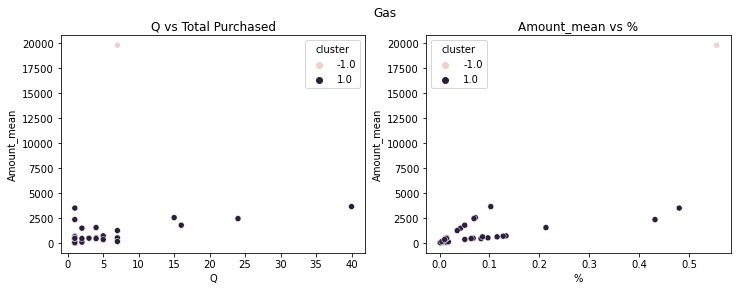

Distribution of usual vs unusual


 1.0    0.969697
-1.0    0.030303
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count      1.00000    32.000000
                      mean       7.00000     5.093750
                      std            NaN     8.247617
                      min        7.00000     1.000000
                      25%        7.00000     1.000000
                      50%        7.00000     1.500000
                      75%        7.00000     5.000000
                      max        7.00000    40.000000
Amount_mean           count      1.00000    32.000000
                      mean   19764.78000   891.225937
                      std            NaN  1008.753355
                      min    19764.78000    20.000000
                      25%    19764.78000   152.542500
                      50%    19764.78000   484.940000
                      75%    19764.78000  1313.475000
                      max    19764.78000  3648.990000
%                     count      1.00000    32.000000
                      mean       0.55586     0.076379
                      std            NaN     0.111578
                      min        0.55586     0.000828
                      25%        0.55586     0.011949
                      50%        0.55586     0.046157
                      75%        0.55586     0.088749
                      max        0.55586     0.480606
Amount_mean_over_past count      1.00000    32.000000
                      mean       0.00000     1.459040
                      std            NaN     4.880815
                      min        0.00000     0.000000
                      25%        0.00000     0.000000
                      50%        0.00000     0.000000
                      75%        0.00000     0.168878
                      max        0.00000    26.878419

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


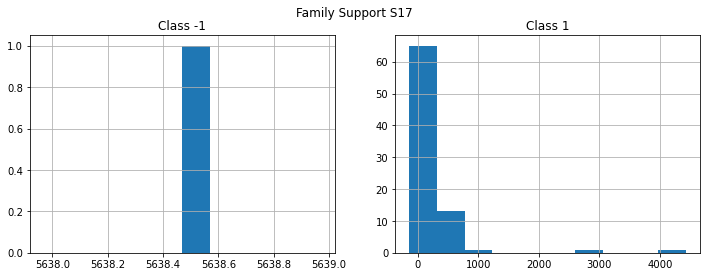

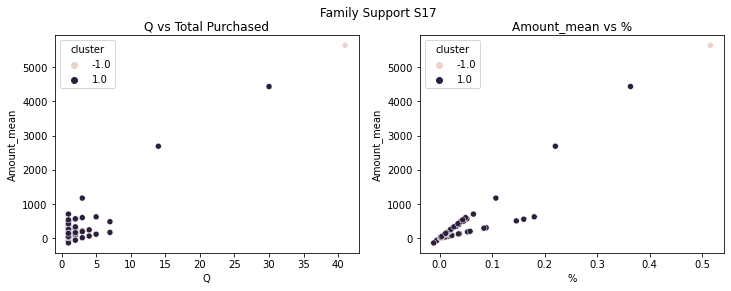

Distribution of usual vs unusual


 1.0    0.987805
-1.0    0.012195
Name: cluster, dtype: float64

cluster                             -1.0          1.0
Q                     count     1.000000    81.000000
                      mean     41.000000     2.111111
                      std            NaN     3.646917
                      min      41.000000     1.000000
                      25%      41.000000     1.000000
                      50%      41.000000     1.000000
                      75%      41.000000     2.000000
                      max      41.000000    30.000000
Amount_mean           count     1.000000    81.000000
                      mean   5638.470000   258.343457
                      std            NaN   584.924277
                      min    5638.470000  -139.990000
                      25%    5638.470000    34.900000
                      50%    5638.470000   123.190000
                      75%    5638.470000   254.250000
                      max    5638.470000  4431.640000
%                     count     1.000000    81.000000
                      mean      0.515984     0.030667
                      std            NaN     0.055531
                      min       0.515984    -0.011489
                      25%       0.515984     0.003703
                      50%       0.515984     0.013131
                      75%       0.515984     0.031114
                      max       0.515984     0.363701
Amount_mean_over_past count     1.000000    81.000000
                      mean      9.062296     0.625583
                      std            NaN     4.035953
                      min       9.062296    -1.000000
                      25%       9.062296     0.000000
                      50%       9.062296     0.000000
                      75%       9.062296     0.000000
                      max       9.062296    35.873134

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


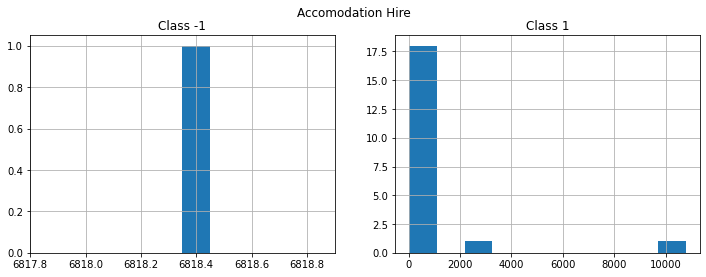

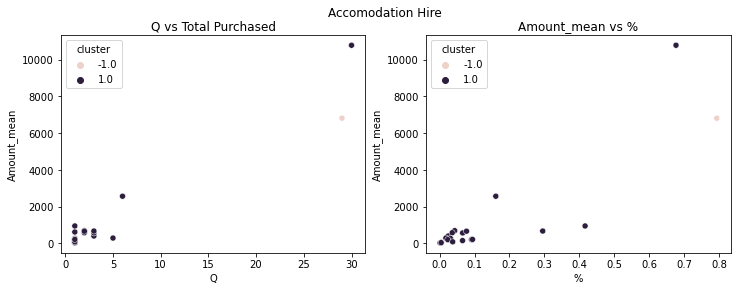

Distribution of usual vs unusual


 1.0    0.952381
-1.0    0.047619
Name: cluster, dtype: float64

cluster                             -1.0           1.0
Q                     count     1.000000     20.000000
                      mean     29.000000      3.350000
                      std            NaN      6.434079
                      min      29.000000      1.000000
                      25%      29.000000      1.000000
                      50%      29.000000      1.000000
                      75%      29.000000      3.000000
                      max      29.000000     30.000000
Amount_mean           count     1.000000     20.000000
                      mean   6818.350000   1001.589500
                      std            NaN   2370.206199
                      min    6818.350000     24.750000
                      25%    6818.350000    190.050000
                      50%    6818.350000    345.950000
                      75%    6818.350000    666.000000
                      max    6818.350000  10789.450000
%                     count     1.000000     20.000000
                      mean      0.792257      0.110387
                      std            NaN      0.168504
                      min       0.792257      0.001550
                      25%       0.792257      0.024789
                      50%       0.792257      0.041099
                      75%       0.792257      0.092110
                      max       0.792257      0.675815
Amount_mean_over_past count     1.000000     20.000000
                      mean      0.631946      0.041040
                      std            NaN      0.183539
                      min       0.631946      0.000000
                      25%       0.631946      0.000000
                      50%       0.631946      0.000000
                      75%       0.631946      0.000000
                      max       0.631946      0.820809

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


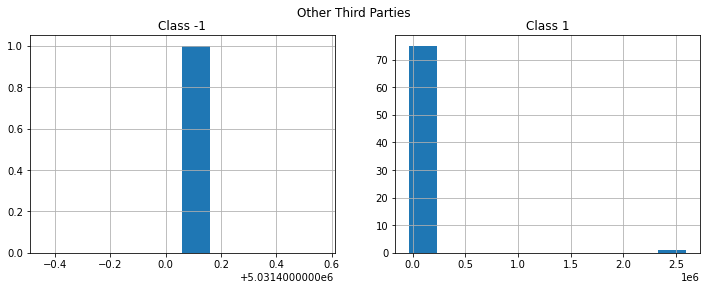

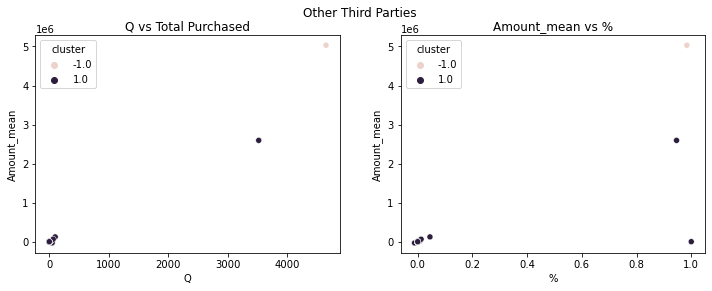

Distribution of usual vs unusual


 1.0    0.987013
-1.0    0.012987
Name: cluster, dtype: float64

cluster                              -1.0           1.0
Q                     count  1.000000e+00  7.600000e+01
                      mean   4.647000e+03  5.171053e+01
                      std             NaN  4.030787e+02
                      min    4.647000e+03  1.000000e+00
                      25%    4.647000e+03  1.000000e+00
                      50%    4.647000e+03  1.000000e+00
                      75%    4.647000e+03  2.000000e+00
                      max    4.647000e+03  3.517000e+03
Amount_mean           count  1.000000e+00  7.600000e+01
                      mean   5.031400e+06  3.715912e+04
                      std             NaN  2.977387e+05
                      min    5.031400e+06 -3.160970e+04
                      25%    5.031400e+06  3.294250e+01
                      50%    5.031400e+06  1.096250e+02
                      75%    5.031400e+06  5.615950e+02
                      max    5.031400e+06  2.594723e+06
%                     count  1.000000e+00  7.600000e+01
                      mean   9.840158e-01  2.652611e-02
                      std             NaN  1.568146e-01
                      min    9.840158e-01 -1.152757e-02
                      25%    9.840158e-01  9.098879e-06
                      50%    9.840158e-01  3.497507e-05
                      75%    9.840158e-01  2.143069e-04
                      max    9.840158e-01  1.000000e+00
Amount_mean_over_past count  1.000000e+00  7.600000e+01
                      mean   2.231813e+02  5.144029e-02
                      std             NaN  2.168416e-01
                      min    2.231813e+02  0.000000e+00
                      25%    2.231813e+02  0.000000e+00
                      50%    2.231813e+02  0.000000e+00
                      75%    2.231813e+02  0.000000e+00
                      max    2.231813e+02  1.579380e+00

**************************************************


C:\Users\Usuario\Anaconda3\envs\python39\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


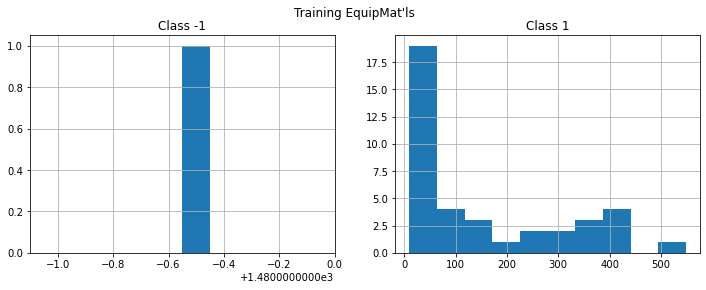

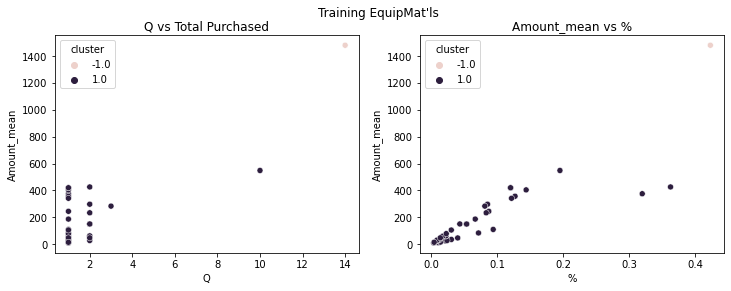

Distribution of usual vs unusual


 1.0    0.975
-1.0    0.025
Name: cluster, dtype: float64

cluster                             -1.0         1.0
Q                     count     1.000000   39.000000
                      mean     14.000000    1.538462
                      std            NaN    1.484058
                      min      14.000000    1.000000
                      25%      14.000000    1.000000
                      50%      14.000000    1.000000
                      75%      14.000000    2.000000
                      max      14.000000   10.000000
Amount_mean           count     1.000000   39.000000
                      mean   1479.450000  153.969744
                      std            NaN  154.670409
                      min    1479.450000   10.000000
                      25%    1479.450000   30.965000
                      50%    1479.450000   79.000000
                      75%    1479.450000  264.315000
                      max    1479.450000  548.440000
%                     count     1.000000   39.000000
                      mean      0.423061    0.066075
                      std            NaN    0.080079
                      min       0.423061    0.003556
                      25%       0.423061    0.013653
                      50%       0.423061    0.030356
                      75%       0.423061    0.086141
                      max       0.423061    0.362640
Amount_mean_over_past count     1.000000   39.000000
                      mean      2.697560    0.390328
                      std            NaN    1.198990
                      min       2.697560    0.000000
                      25%       2.697560    0.000000
                      50%       2.697560    0.000000
                      75%       2.697560    0.000000
                      max       2.697560    6.026854

**************************************************


In [167]:
# FIND UNUSUAL MERCHANTS RELATIONSHIP

## Iterate over group of transaction
for val in X['trans_cac_desc_1_grouped'].unique():
    
    ## Define features
    X_group = X[X['trans_cac_desc_1_grouped']==val][['Q','Amount_mean','%','Amount_mean_over_past']].copy()
    groups[val] = {}
    groups[val]['X_group'] = X_group
    
    ## Fit model
    forest = IsolationForest(random_state=0, contamination=0.01 )
    forest.fit(X_group)
    
    ## Assign cluster
    X.loc[X['trans_cac_desc_1_grouped']==val, 'cluster'] = forest.predict(X_group)
    
    ## Plot distribution of Purchases by class
    fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,4))
    fig.suptitle(val)
    X[(X['cluster']==-1) & (X['trans_cac_desc_1_grouped']==val)]['Amount_mean'].hist(ax=ax[0])
    ax[0].set_title('Class -1')
    X[(X['cluster']==1) & (X['trans_cac_desc_1_grouped']==val)]['Amount_mean'].hist(ax=ax[1])
    ax[1].set_title('Class 1')
    plt.show()

    
    #Histograms of relevant features
    fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,4))
    fig.suptitle(val)
    sns.scatterplot(data=X[(X['trans_cac_desc_1_grouped']==val)],
                    x = 'Q',
                    y='Amount_mean',
                    hue='cluster',
                   ax=ax[0])    
    ax[0].set_title('Q vs Total Purchased')
    
    sns.scatterplot(data=X[ (X['trans_cac_desc_1_grouped']==val)],
                    x = '%',
                    y='Amount_mean',
                    hue='cluster',
                   ax = ax[1])
    ax[1].set_title('Amount_mean vs %')
    
    plt.show()
    
    ## Show other relevant information
    print('Distribution of usual vs unusual')
    display(X[ (X['trans_cac_desc_1_grouped']==val)]['cluster'].value_counts(normalize=True))
    display(X[(X['trans_cac_desc_1_grouped']==val)][['Q','Amount_mean','%','Amount_mean_over_past','cluster']].groupby('cluster').describe().T)
    print('*'*50)

__Comments:__ 
- I built 1 model for each "trans_cac_desc_1_grouped" because I consider purchases within the group should have less variance and should be more similar
- Similar as the previous section, we can use Isolation forest model to identify unusual relationship w merchants.
- With Isolation forest we can also define a % of "unsual" we want to look at, so we can focus on that merchants.
- As mentiones at the beginning of the section, these approach can help us identify "preferences" with merchants that could be cases of bribery.
